In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from pandas_profiling import ProfileReport

In [4]:
total_movies = pd.read_csv('file:///Users/chrismembrey/Desktop/GA/DSI16-lessons/project/project-capstone/Movies/changing_df_and_EDA/final_df-Copy1.csv', lineterminator='\n')


In [5]:
total_movies = total_movies.replace('[]', np.nan)

In [6]:
total_movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10564 entries, 0 to 10563
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            10564 non-null  int64  
 1   Unnamed: 0.1          10564 non-null  int64  
 2   tmdb_id               8794 non-null   float64
 3   imdb_id               10392 non-null  object 
 4   title                 10564 non-null  object 
 5   revenue               10564 non-null  int64  
 6   budget                10564 non-null  float64
 7   genres                10452 non-null  object 
 8   original_language     10404 non-null  object 
 9   popularity            8794 non-null   float64
 10  release_date          10488 non-null  object 
 11  runtime               10543 non-null  float64
 12  tmdb_vote_average     10564 non-null  float64
 13  tmdb_vote_count       10564 non-null  int64  
 14  spoken_languages      10405 non-null  object 
 15  production_companie

In [5]:
total_movies.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis = 1, inplace = True)

<b>Things I have noticed:</b>

nans in blurb
    
0 production so get rid of it

not worth keeping rotten_tomatoes_meta average


we dont have release dates for < 100 observations


In [6]:
total_movies.drop(['production', 'sounds', 'visual_effects'], axis = 1, inplace = True)

In [7]:
total_movies.drop('rotten_imdb_meta', axis = 1, inplace = True)

<b>Check Initial Descriptives</b>

In [8]:
total_movies.describe()

,tmdb_id,revenue,budget,popularity,runtime,tmdb_vote_average,tmdb_vote_count
count,8794.000000,1.056400e+04,1.056400e+04,8794.000000,10543.000000,10564.000000,10564.000000
mean,123932.917785,5.757117e+07,2.184005e+07,23.156835,106.616523,6.160583,2846.008046
std,177827.626720,1.428501e+08,3.562255e+07,258.459973,25.317203,1.372158,8407.829014
min,5.000000,1.000000e+00,1.000000e+00,0.600000,0.000000,0.000000,0.000000
25%,10208.250000,8.007500e+05,2.300000e+06,7.029750,93.000000,5.700000,94.000000
50%,29978.000000,9.600000e+06,9.827816e+06,11.493500,104.000000,6.300000,518.500000
75%,187676.250000,4.662851e+07,2.500000e+07,19.739750,118.000000,6.900000,2120.500000
max,811427.000000,2.797801e+09,9.653130e+08,23605.466000,422.000000,10.000000,223050.000000


A pandas profile gives us a look at the data in more detail.

In [9]:
ProfileReport(total_movies , title = 'Initial Overview of the Movie Data Dating back to 1913', explorative = False)

<b>lets look at release date column</b>

In [10]:
total_movies.release_date = pd.to_datetime(total_movies.release_date)

In [11]:
import seaborn as sns
total_movies.release_date.describe()

<ipython-input-11-c798a6f904b9>:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  total_movies.release_date.describe()


count                   10488
unique                   5902
top       2011-09-09 00:00:00
freq                       11
first     1913-11-24 00:00:00
last      2023-11-03 00:00:00
Name: release_date, dtype: object

Code to see the counts over certain years

In [12]:
count = 0
for x in total_movies.release_date:
    if x.year >= 2010:
        count += 1
print(count)

3753


Check for the dates we dont have

In [13]:
total_movies[pd.isna(total_movies.release_date) == True]

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,tmdb_vote_average,tmdb_vote_count,spoken_languages,production_companies,production_countries,blurb,actors,directors,writers,composer
546,667880.0,NaN,Anything Goes,60000,50000.0,NaN,NaN,0.600,NaT,113.0,0.0,0,NaN,NaN,NaN,Anything Goes is set aboard the ocean liner S....,['ACTOR_Veronica Ortiz'],[''],NaN,NaN
627,605787.0,tt0272001,Bindhaast,70,15.0,NaN,NaN,0.600,NaT,NaN,0.0,0,NaN,NaN,NaN,Mayu and Vaiju decide to play a prank on their...,"['ACTOR_Gautami Gadgil', 'ACTOR_Sharvari Jamen...",[''],NaN,NaN
650,753542.0,NaN,You and Me,2,10.0,NaN,NaN,0.600,NaT,120.0,9.0,1,NaN,NaN,NaN,The Mod Squad. Rather than making every elemen...,NaN,[''],NaN,NaN
698,754692.0,NaN,21 Days,500,100.0,NaN,NaN,0.600,NaT,0.0,0.0,0,NaN,NaN,NaN,"During the nationwide lockdown, Mehak a journa...",NaN,[''],NaN,NaN
864,758621.0,NaN,The Whistler,500,100.0,NaN,NaN,0.600,NaT,0.0,0.0,0,NaN,NaN,NaN,This is the slightly edited cut of the 2010 ho...,NaN,[''],NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8691,377568.0,NaN,The Enemy Within,75,500.0,NaN,NaN,0.600,NaT,1.0,0.0,0,NaN,NaN,NaN,They don't like you... or do they? They can't ...,NaN,[''],NaN,NaN
8702,598916.0,tt8919848,Ribbon New Ice Ribbon #896 ~ Summer Jumbo Ribbon,16775,4553.0,NaN,NaN,0.623,NaT,NaN,8.0,1,NaN,NaN,NaN,The ice ribbon invites skaters to explore the ...,NaN,[''],NaN,NaN
8714,598915.0,tt8920006,Ice Ribbon New Ice Ribbon 898 Yokohama Ribbon,17665,2778.0,NaN,NaN,0.600,NaT,NaN,8.0,1,NaN,NaN,NaN,Information about the match times of the event...,NaN,[''],NaN,NaN
8724,754702.0,NaN,MILF,500,100.0,NaN,NaN,1.418,NaT,0.0,0.0,0,NaN,NaN,NaN,"She's forty, unmarried and lives right next do...",NaN,[''],NaN,NaN


<b>create ROI</b>

![](ROI.png)

In [17]:
total_movies['ROI'] = ((total_movies.revenue-total_movies.budget)/total_movies.budget)*100

In [18]:
total_movies['ROI'].isnull().sum()

0

In [19]:
total_movies.head()

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,...,tmdb_vote_count,spoken_languages,production_companies,production_countries,blurb,actors,directors,writers,composer,ROI
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",['English'],50.681,1963-06-12,248.0,...,438,['English'],"['PRODUCTION_COMPANY_MCL Films S.A.', 'PRODUCT...","['UK', 'USA', 'Switzerland']","Determined to hold on to the throne, Cleopatra...","['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",NaN,['COMPOSER_Alex North'],61.363636
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",['English'],8.695,1945-11-30,67.0,...,201,['English'],['PRODUCTION_COMPANY_Producers Releasing Corpo...,['USA'],"Al Roberts, a New York nightclub pianist, hitc...","['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",NaN,['COMPOSER_Leo Erdody'],-46.093333
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",['English'],49.917,1951-11-08,171.0,...,246,['English'],['PRODUCTION_COMPANY_Metro-Goldwyn-Mayer'],['USA'],"Set against the back drop of Rome in crisis, G...","['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['PRODUCER_Giovanni Lovatelli'],['COMPOSER_Miklós Rózsa'],-98.668687
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...","['English', 'Français', 'Español']",32.177,2001-06-02,95.0,...,3494,"['English', 'Français', 'Español']",['PRODUCTION_COMPANY_Walt Disney Animation Stu...,['USA'],The world's most highly qualified crew of arch...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",NaN,['COMPOSER_James Newton Howard'],55.044771
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",['English'],11.302,2001-09-07,101.0,...,319,['English'],['PRODUCTION_COMPANY_Castle Rock Entertainment...,"['Australia', 'USA']",A widowed mother and her son change when a mys...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",NaN,['COMPOSER_Mychael Danna'],-21.981352


<b>only want films with budgets and revenues we can trust (we dont expect films to have budgets and revenues below 10,000 so these will be filtered from the dataset)</b>

In [20]:
df = total_movies[(total_movies.budget > 10000) & (total_movies.revenue > 10000)]
df.head()

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,...,tmdb_vote_count,spoken_languages,production_companies,production_countries,blurb,actors,directors,writers,composer,ROI
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",['English'],50.681,1963-06-12,248.0,...,438,['English'],"['PRODUCTION_COMPANY_MCL Films S.A.', 'PRODUCT...","['UK', 'USA', 'Switzerland']","Determined to hold on to the throne, Cleopatra...","['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",NaN,['COMPOSER_Alex North'],61.363636
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",['English'],8.695,1945-11-30,67.0,...,201,['English'],['PRODUCTION_COMPANY_Producers Releasing Corpo...,['USA'],"Al Roberts, a New York nightclub pianist, hitc...","['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",NaN,['COMPOSER_Leo Erdody'],-46.093333
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",['English'],49.917,1951-11-08,171.0,...,246,['English'],['PRODUCTION_COMPANY_Metro-Goldwyn-Mayer'],['USA'],"Set against the back drop of Rome in crisis, G...","['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['PRODUCER_Giovanni Lovatelli'],['COMPOSER_Miklós Rózsa'],-98.668687
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...","['English', 'Français', 'Español']",32.177,2001-06-02,95.0,...,3494,"['English', 'Français', 'Español']",['PRODUCTION_COMPANY_Walt Disney Animation Stu...,['USA'],The world's most highly qualified crew of arch...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",NaN,['COMPOSER_James Newton Howard'],55.044771
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",['English'],11.302,2001-09-07,101.0,...,319,['English'],['PRODUCTION_COMPANY_Castle Rock Entertainment...,"['Australia', 'USA']",A widowed mother and her son change when a mys...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",NaN,['COMPOSER_Mychael Danna'],-21.981352


In [21]:
df.shape

(9741, 21)

In [22]:
df

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,...,tmdb_vote_count,spoken_languages,production_companies,production_countries,blurb,actors,directors,writers,composer,ROI
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",['English'],50.681,1963-06-12,248.0,...,438,['English'],"['PRODUCTION_COMPANY_MCL Films S.A.', 'PRODUCT...","['UK', 'USA', 'Switzerland']","Determined to hold on to the throne, Cleopatra...","['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",NaN,['COMPOSER_Alex North'],61.363636
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",['English'],8.695,1945-11-30,67.0,...,201,['English'],['PRODUCTION_COMPANY_Producers Releasing Corpo...,['USA'],"Al Roberts, a New York nightclub pianist, hitc...","['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",NaN,['COMPOSER_Leo Erdody'],-46.093333
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",['English'],49.917,1951-11-08,171.0,...,246,['English'],['PRODUCTION_COMPANY_Metro-Goldwyn-Mayer'],['USA'],"Set against the back drop of Rome in crisis, G...","['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['PRODUCER_Giovanni Lovatelli'],['COMPOSER_Miklós Rózsa'],-98.668687
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...","['English', 'Français', 'Español']",32.177,2001-06-02,95.0,...,3494,"['English', 'Français', 'Español']",['PRODUCTION_COMPANY_Walt Disney Animation Stu...,['USA'],The world's most highly qualified crew of arch...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",NaN,['COMPOSER_James Newton Howard'],55.044771
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",['English'],11.302,2001-09-07,101.0,...,319,['English'],['PRODUCTION_COMPANY_Castle Rock Entertainment...,"['Australia', 'USA']",A widowed mother and her son change when a mys...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",NaN,['COMPOSER_Mychael Danna'],-21.981352
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,['Comedy'],['Spanish'],NaN,2020-02-14,100.0,...,289,['Spanish'],NaN,['Mexico'],A woman's island getaway with her boyfriend is...,"['ACTOR_Marco Antonio Aguirre', 'ACTOR_Jason A...","[""'Director_Diego Kaplan'""]",NaN,['COMPOSER_Iván Wyszogrod'],-9.966182
10560,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,['Horror'],['English'],NaN,2019-08-09,79.0,...,220,['English'],NaN,['UK'],After being thrown out of his home by his wife...,"['ACTOR_Duncan Casey', 'ACTOR_Justin Marosa', ...","[""'Director_Martin J Pickering'""]",NaN,NaN,4.347826
10561,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"['Animation', ' Drama', ' Family']",['Japanese'],NaN,2019-10-14,112.0,...,16277,['Japanese'],NaN,"['Japan', 'China']",A high-school boy who has run away to Tokyo be...,"['ACTOR_Kotaro Daigo', 'ACTOR_Nana Mori', 'ACT...","[""'Director_Makoto Shinkai'""]",NaN,['COMPOSER_Radwimps'],-29.741054
10562,NaN,tt9779516,I Still Believe,9868521,12000000.0,"['Biography', ' Drama', ' Music']",['English'],NaN,2020-03-19,116.0,...,6196,['English'],NaN,['USA'],The true-life story of Christian music star Je...,"['ACTOR_K.J. Apa', 'ACTOR_Britt Robertson', 'A...","[""'Director_Andrew Erwin'"", "" 'Director_Jon Er...",NaN,['COMPOSER_John Debney'],-17.762325


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9741 entries, 0 to 10563
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tmdb_id               8187 non-null   float64       
 1   imdb_id               9704 non-null   object        
 2   title                 9741 non-null   object        
 3   revenue               9741 non-null   int64         
 4   budget                9741 non-null   float64       
 5   genres                9709 non-null   object        
 6   original_language     9693 non-null   object        
 7   popularity            8187 non-null   float64       
 8   release_date          9732 non-null   datetime64[ns]
 9   runtime               9736 non-null   float64       
 10  tmdb_vote_average     9741 non-null   float64       
 11  tmdb_vote_count       9741 non-null   int64         
 12  spoken_languages      9691 non-null   object        
 13  production_compan

<b> drop writers as the proportions of writers to the rest is so small, it would not accurately represent our data </b>

In [24]:
df.drop('writers', inplace = True, axis = 1)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [25]:
#drop production companies becuase we are aiming this analysis at them
df.drop('production_companies', inplace =True, axis = 1)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9741 entries, 0 to 10563
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tmdb_id               8187 non-null   float64       
 1   imdb_id               9704 non-null   object        
 2   title                 9741 non-null   object        
 3   revenue               9741 non-null   int64         
 4   budget                9741 non-null   float64       
 5   genres                9709 non-null   object        
 6   original_language     9693 non-null   object        
 7   popularity            8187 non-null   float64       
 8   release_date          9732 non-null   datetime64[ns]
 9   runtime               9736 non-null   float64       
 10  tmdb_vote_average     9741 non-null   float64       
 11  tmdb_vote_count       9741 non-null   int64         
 12  spoken_languages      9691 non-null   object        
 13  production_countr

<b>popularity can be deleted becuase tmdb vote average is more representitive our sample</b>

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


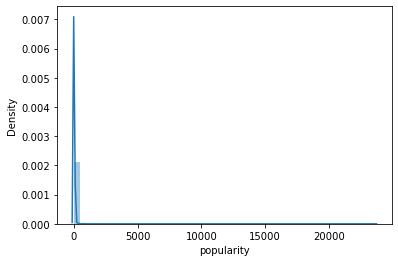

In [27]:
sns.distplot(df.popularity);

In [28]:
df.popularity.describe()

count     8187.000000
mean        24.480934
std        267.807883
min          0.600000
25%          7.777000
50%         12.058000
75%         20.543000
max      23605.466000
Name: popularity, dtype: float64

In [29]:
df[df.popularity > df.popularity.quantile(0.99)]

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,tmdb_vote_average,tmdb_vote_count,spoken_languages,production_countries,blurb,actors,directors,composer,ROI
83,227348.0,tt2473682,Paranormal Activity: The Marked Ones,86362372,5000000.0,"['Horror', 'Thriller']",['English'],195.552,2014-01-01,84.0,5.4,1028,['English'],['USA'],Seventeen-year-old Jesse has been hearing terr...,"['ACTOR_Eddie J. Fernandez', 'ACTOR_Richard Ca...","[""'Director_Christopher Landon'""]",NaN,1627.247440
85,577922.0,tt6723592,Tenet,363129000,205000000.0,"['Action', 'Thriller', 'Science Fiction']",['English'],715.585,2020-08-22,150.0,7.3,4869,['English'],"['UK', 'USA']",Armed with only one word - Tenet - and fightin...,"['ACTOR_John David Washington', 'ACTOR_Robert ...","[""'Director_Kenneth Branagh'""]",['COMPOSER_Ludwig Göransson'],77.136098
114,6844.0,tt0049833,The Ten Commandments,122700000,13000000.0,"['Drama', 'History']",['English'],242.044,1956-10-05,220.0,7.7,949,['English'],['USA'],"Escaping death, a Hebrew infant is raised in a...","['ACTOR_Charlton Heston', 'ACTOR_Yul Brynner',...","[""'Director_Fraser Clarke Heston'"", "" 'Directo...",['COMPOSER_Elmer Bernstein'],843.846154
116,372519.0,tt5431016,Os Dez Mandamentos: O Filme,37070177,39307171.0,['Drama'],['Português'],169.679,2016-01-28,120.0,7.3,168,['Português'],['Brazil'],Follows Moses leading and conducting the Hebre...,"['ACTOR_Guilherme Winter', 'ACTOR_Camila Rodri...","[""'Director_Alexandre Avancini'""]",['COMPOSER_Daniel Figueiredo'],-5.691058
189,474350.0,tt7349950,It Chapter Two,473093228,79000000.0,"['Horror', 'Fantasy']",['English'],193.687,2019-09-04,169.0,6.9,5805,['English'],"['Canada', 'USA']",27 years after overcoming the malevolent super...,"['ACTOR_Bill Skarsgård', 'ACTOR_Jessica Chasta...","[""'Director_Xavier Dolan'""]",['COMPOSER_Benjamin Wallfisch'],498.852187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7862,359724.0,tt1950186,Ford v Ferrari,225508210,97600000.0,"['Drama', 'Action', 'History']","['Français', '日本語', 'Italiano', 'English']",212.084,2019-11-13,153.0,8.0,4501,"['Français', '日本語', 'Italiano', 'English']",['USA'],American car designer Carroll Shelby and the B...,"['ACTOR_Matt Damon', 'ACTOR_Christian Bale', '...","[""'Director_James Mangold'""]","['COMPOSER_Marco Beltrami', 'COMPOSER_Buck San...",131.053494
7951,581392.0,tt8850222,반도,39657073,17000000.0,"['Action', 'Horror', 'Thriller']","['English', '한국어/조선말']",414.847,2020-07-15,116.0,7.0,1358,"['English', '한국어/조선말']",['South Korea'],A soldier and his team battle hordes of post-a...,"['ACTOR_Gang Dong-won', 'ACTOR_Lee Jung-hyun',...","[""'Director_Sang-ho Yeon'""]",['COMPOSER_Mowg'],133.276900
7995,511987.0,tt8364368,Crawl,89203432,13500000.0,"['Thriller', 'Horror', 'Drama']",['English'],229.548,2019-07-11,88.0,6.3,2034,['English'],"['Canada', 'Serbia', 'USA']",When a huge hurricane hits her hometown in Flo...,"['ACTOR_Kaya Scodelario', 'ACTOR_Barry Pepper'...","[""'Director_Alexandre Aja'""]","['COMPOSER_Max Aruj', 'COMPOSER_Steffen Thum']",560.766163
8522,345940.0,tt4779682,The Meg,530243742,150000000.0,"['Action', 'Science Fiction', 'Horror']","['普通话', 'English', '日本語', 'ภาษาไทย']",275.902,2018-08-09,113.0,6.2,5050,"['普通话', 'English', '日本語', 'ภาษาไทย']","['China', 'USA']",A deep sea submersible pilot revisits his past...,"['ACTOR_Jason Statham', 'ACTOR_Li Bingbing', '...","[""'Director_Jon Turteltaub'""]",['COMPOSER_Harry Gregson-Williams'],253.495828


In [30]:
df[df.popularity > 15000]

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,popularity,release_date,runtime,tmdb_vote_average,tmdb_vote_count,spoken_languages,production_countries,blurb,actors,directors,composer,ROI
5097,399566.0,tt5034838,Godzilla vs. Kong,161724692,200000000.0,"['Action', 'Science Fiction']",['English'],23605.466,2021-03-24,113.0,8.5,3261,['English'],['USA'],"In a time when monsters walk the Earth, humani...","['ACTOR_Alexander Skarsgård', 'ACTOR_Millie Bo...",[''],['COMPOSER_Junkie XL'],-19.137654


In [31]:
df.popularity.quantile(0.999999)

23431.881534373504

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='popularity', ylabel='tmdb_vote_average'>

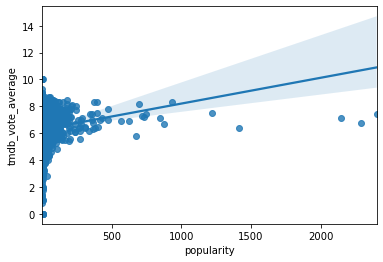

In [32]:
sns.regplot(df.popularity[df.popularity <df.popularity.quantile(0.999999)] , df[df.popularity <20000]['tmdb_vote_average'])

In [33]:
popularity_correlation = pd.DataFrame({'pop': df.popularity[df.popularity <df.popularity.quantile(0.999999)], 'vote':df[df.popularity <20000]['tmdb_vote_average']})
popularity_correlation.corr().values[0][1]

0.10573763096367034

In [34]:
#not a large correlation and around 1/5 of the data set has missing values so i shall drop popularity 
#in favour of tmdb vote average

df.drop('popularity', axis = 1, inplace = True)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9741 entries, 0 to 10563
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tmdb_id               8187 non-null   float64       
 1   imdb_id               9704 non-null   object        
 2   title                 9741 non-null   object        
 3   revenue               9741 non-null   int64         
 4   budget                9741 non-null   float64       
 5   genres                9709 non-null   object        
 6   original_language     9693 non-null   object        
 7   release_date          9732 non-null   datetime64[ns]
 8   runtime               9736 non-null   float64       
 9   tmdb_vote_average     9741 non-null   float64       
 10  tmdb_vote_count       9741 non-null   int64         
 11  spoken_languages      9691 non-null   object        
 12  production_countries  9605 non-null   object        
 13  blurb            

<b>Introduce month column and day column for each film </b>

In [36]:
df['month'] = df.release_date.apply(lambda x: x.month)
df.month

<ipython-input-36-c7752c73d4ef>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.release_date.apply(lambda x: x.month)


0         6.0
1        11.0
2        11.0
3         6.0
4         9.0
         ... 
10559     2.0
10560     8.0
10561    10.0
10562     3.0
10563     2.0
Name: month, Length: 9741, dtype: float64

In [37]:
df['day'] = df.release_date.apply(lambda x: x.day_name())
df['day']

<ipython-input-37-47f76cae14f7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['day'] = df.release_date.apply(lambda x: x.day_name())


0        Wednesday
1           Friday
2         Thursday
3         Saturday
4           Friday
           ...    
10559       Friday
10560       Friday
10561       Monday
10562     Thursday
10563     Thursday
Name: day, Length: 9741, dtype: object

<b>last of the cleaning before creating the category tables is to account for inflation between years </b>

In [38]:
df['years_since_most_current'] = df.release_date.apply(lambda x: abs(x.year - (df.release_date.max().year - 2)))
df.head()

<ipython-input-38-8fcee04a5b9c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['years_since_most_current'] = df.release_date.apply(lambda x: abs(x.year - (df.release_date.max().year - 2)))


,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,release_date,runtime,tmdb_vote_average,...,spoken_languages,production_countries,blurb,actors,directors,composer,ROI,month,day,years_since_most_current
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",['English'],1963-06-12,248.0,7.0,...,['English'],"['UK', 'USA', 'Switzerland']","Determined to hold on to the throne, Cleopatra...","['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",['COMPOSER_Alex North'],61.363636,6.0,Wednesday,58.0
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",['English'],1945-11-30,67.0,7.2,...,['English'],['USA'],"Al Roberts, a New York nightclub pianist, hitc...","['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",['COMPOSER_Leo Erdody'],-46.093333,11.0,Friday,76.0
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",['English'],1951-11-08,171.0,7.0,...,['English'],['USA'],"Set against the back drop of Rome in crisis, G...","['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['COMPOSER_Miklós Rózsa'],-98.668687,11.0,Thursday,70.0
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...","['English', 'Français', 'Español']",2001-06-02,95.0,6.9,...,"['English', 'Français', 'Español']",['USA'],The world's most highly qualified crew of arch...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",['COMPOSER_James Newton Howard'],55.044771,6.0,Saturday,20.0
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",['English'],2001-09-07,101.0,6.5,...,['English'],"['Australia', 'USA']",A widowed mother and her son change when a mys...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",['COMPOSER_Mychael Danna'],-21.981352,9.0,Friday,20.0


In [39]:
#will need df['year'] for later when accounting for inflation
df['year'] = df.release_date.apply(lambda x: x.year)

<ipython-input-39-41cf8e3130d5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'] = df.release_date.apply(lambda x: x.year)


In [40]:
df.release_date.sort_values(ascending = True).head(5)

1036   1914-04-25
633    1915-01-04
14     1915-02-08
15     1915-12-13
24     1916-09-04
Name: release_date, dtype: datetime64[ns]

inflation data using: https://fred.stlouisfed.org/series/CPIAUCNS  film budgets are used to be able to purchase goods so we can use Consumer Price Index for All Urban Consumers

In [41]:
inflation = pd.read_csv('file:///Users/chrismembrey/Downloads/CPIAUCNS.csv')
inflation.head()

,DATE,CPIAUCNS
0,1913-01-01,9.8
1,1913-02-01,9.8
2,1913-03-01,9.8
3,1913-04-01,9.8
4,1913-05-01,9.7


In [42]:
inflation['DATE'] = pd.to_datetime(inflation.DATE)

In [43]:
inflation = inflation[inflation.DATE.dt.year > 1913]
inflation

,DATE,CPIAUCNS
12,1914-01-01,10.000
13,1914-02-01,9.900
14,1914-03-01,9.900
15,1914-04-01,9.800
16,1914-05-01,9.900
...,...,...
1293,2020-10-01,260.388
1294,2020-11-01,260.229
1295,2020-12-01,260.474
1296,2021-01-01,261.582


In [44]:
#we need to divide the current consumer price by the 
#previous consumer prices to gain the inflation multiplyer for that particular year!

In [45]:
inflation['CPIAUCNS'].iloc[-1]

263.014

In [46]:
inflation['CPI_Multiplier'] = inflation['CPIAUCNS'].iloc[-1] / inflation['CPIAUCNS']

In [47]:
inflation['month'] = inflation.DATE.apply(lambda x: x.month)
inflation['year'] = inflation.DATE.apply(lambda x: x.year)

In [48]:
inflation

,DATE,CPIAUCNS,CPI_Multiplier,month,year
12,1914-01-01,10.000,26.301400,1,1914
13,1914-02-01,9.900,26.567071,2,1914
14,1914-03-01,9.900,26.567071,3,1914
15,1914-04-01,9.800,26.838163,4,1914
16,1914-05-01,9.900,26.567071,5,1914
...,...,...,...,...,...
1293,2020-10-01,260.388,1.010085,10,2020
1294,2020-11-01,260.229,1.010702,11,2020
1295,2020-12-01,260.474,1.009751,12,2020
1296,2021-01-01,261.582,1.005474,1,2021


In [49]:
df.sort_values(['year', 'month'], ascending = True)

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,release_date,runtime,tmdb_vote_average,...,production_countries,blurb,actors,directors,composer,ROI,month,day,years_since_most_current,year
1036,572090.0,tt0004391,Neptune's Daughter,5773000,2221000.0,['Fantasy'],NaN,1914-04-25,95.0,0.0,...,['USA'],The daughter of King Neptune takes on human fo...,"['ACTOR_Annette Kellerman', 'ACTOR_William E. ...",[''],['COMPOSER_Robert Hood Bowers'],159.927960,4.0,Saturday,107.0,1914.0
633,402388.0,tt0005393,The Girl of the Golden West,102224,15110.0,"['Western', 'Romance']","['English', 'No Language']",1915-01-04,50.0,5.5,...,['USA'],"A saloon hostess loves Ramerrez, a notorious h...","['ACTOR_Mabel Van Buren', 'ACTOR_Theodore Robe...",[''],NaN,576.532098,1.0,Monday,106.0,1915.0
14,618.0,tt0004972,The Birth of a Nation,11000000,100000.0,"['Drama', 'History', 'War']",['No Language'],1915-02-08,193.0,6.1,...,['USA'],"Two families, abolitionist Northerners the Sto...","['ACTOR_Lillian Gish', 'ACTOR_Mae Marsh', 'ACT...","[""'Director_Joseph Henabery'"", "" 'Director_Elm...","['COMPOSER_Joseph Carl Breil', 'COMPOSER_D.W. ...",10900.000000,2.0,Monday,106.0,1915.0
15,70368.0,tt0005078,The Cheat,137365,17311.0,['Drama'],['English'],1915-12-13,59.0,5.8,...,['USA'],"A venal, spoiled stockbroker's wife impulsivel...","['ACTOR_Sessue Hayakawa', 'ACTOR_Jack Dean', '...","[""'Director_Yutaka Abe'""]",['COMPOSER_Robert Israel'],693.512795,12.0,Monday,106.0,1915.0
24,3059.0,tt0006864,Intolerance: Love's Struggle Throughout the Ages,4000000,8394751.0,"['Drama', 'History']",['No Language'],1916-09-04,197.0,7.4,...,['USA'],"The story of a poor young woman, separated by ...","['ACTOR_Lillian Gish', 'ACTOR_Mae Marsh', 'ACT...","[""'Director_Elmer Clifton'"", "" 'Director_John ...","['COMPOSER_Carl Davis', 'COMPOSER_Joseph Carl ...",-52.351178,9.0,Monday,105.0,1916.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5070,665531.0,NaN,Celebrity Marriage,30000000,2000000.0,NaN,NaN,NaT,90.0,0.0,...,NaN,A celebrity with an abusive husband confides i...,"['ACTOR_Kanayo O. Kanayo', 'ACTOR_Tonto Dikeh'...",[''],NaN,1400.000000,NaN,NaN,NaN,NaN
5834,674780.0,tt11355320,Young Love,300000,100000.0,NaN,NaN,NaT,112.0,0.0,...,NaN,Kali a 16 year old girl in Phnom Penh Cambodia...,"['ACTOR_Chansreyden Kong', 'ACTOR_Socheat Chea']",[''],['COMPOSER_Picherith Morm'],200.000000,NaN,NaN,NaN,NaN
7733,499144.0,NaN,Adem'in Laneti,90000,37000.0,NaN,NaN,NaT,NaN,0.0,...,NaN,NaN,NaN,[''],NaN,143.243243,NaN,NaN,NaN,NaN
8062,758058.0,NaN,Slaughter Lore,15000,13000.0,NaN,NaN,NaT,71.0,0.0,...,NaN,Paranormal investigator Elias agrees to stay a...,['ACTOR_Fritz Keenan'],[''],NaN,15.384615,NaN,NaN,NaN,NaN


In [50]:
df.release_date.isnull().sum()

9

In [51]:
inflation[(inflation.month == 12) & (inflation.year == 2012)].CPI_Multiplier.values[0]

1.1455263696586688

In [52]:
for index, row in df.iterrows():
    
    try:
        if row['year'] > 2020:
            df.loc[index, 'inf_budget'] = row['budget']
        
        else:
            df.loc[index,'inf_budget'] = inflation[(inflation.month == row['month']) & 
                                               (inflation.year == row['year'])].CPI_Multiplier.values[0] * row['budget']
        
    except:
        pass

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

In [53]:
df[pd.isna(df.inf_budget) == True]

,tmdb_id,imdb_id,title,revenue,budget,genres,original_language,release_date,runtime,tmdb_vote_average,...,blurb,actors,directors,composer,ROI,month,day,years_since_most_current,year,inf_budget
546,667880.0,NaN,Anything Goes,60000,50000.0,NaN,NaN,NaT,113.0,0.0,...,Anything Goes is set aboard the ocean liner S....,['ACTOR_Veronica Ortiz'],[''],NaN,20.000000,NaN,NaN,NaN,NaN,NaN
1454,661015.0,tt11092750,Kapow,200000,15000.0,NaN,NaN,NaT,0.0,0.0,...,Kapow is a comedy Webseries it on Megapixels E...,NaN,[''],NaN,1233.333333,NaN,NaN,NaN,NaN,NaN
2436,764766.0,NaN,The Together Brothers,1160000,400000.0,NaN,NaN,NaT,94.0,0.0,...,A group of ghetto youths try to solve the murd...,"['ACTOR_Ed Bernard', 'ACTOR_Glynn Turman', 'AC...",[''],NaN,190.000000,NaN,NaN,NaN,NaN,NaN
3359,758847.0,tt01564766,The Tank,800000,210000.0,NaN,NaN,NaT,0.0,0.0,...,NaN,NaN,[''],['COMPOSER_Nikos Hristopoulos'],280.952381,NaN,NaN,NaN,NaN,NaN
5070,665531.0,NaN,Celebrity Marriage,30000000,2000000.0,NaN,NaN,NaT,90.0,0.0,...,A celebrity with an abusive husband confides i...,"['ACTOR_Kanayo O. Kanayo', 'ACTOR_Tonto Dikeh'...",[''],NaN,1400.000000,NaN,NaN,NaN,NaN,NaN
5834,674780.0,tt11355320,Young Love,300000,100000.0,NaN,NaN,NaT,112.0,0.0,...,Kali a 16 year old girl in Phnom Penh Cambodia...,"['ACTOR_Chansreyden Kong', 'ACTOR_Socheat Chea']",[''],['COMPOSER_Picherith Morm'],200.000000,NaN,NaN,NaN,NaN,NaN
7733,499144.0,NaN,Adem'in Laneti,90000,37000.0,NaN,NaN,NaT,NaN,0.0,...,NaN,NaN,[''],NaN,143.243243,NaN,NaN,NaN,NaN,NaN
8062,758058.0,NaN,Slaughter Lore,15000,13000.0,NaN,NaN,NaT,71.0,0.0,...,Paranormal investigator Elias agrees to stay a...,['ACTOR_Fritz Keenan'],[''],NaN,15.384615,NaN,NaN,NaN,NaN,NaN
8293,594307.0,NaN,Headless in the city,100000,80000.0,NaN,NaN,NaT,NaN,0.0,...,NaN,['ACTOR_Elias Maria Reti'],[''],NaN,25.000000,NaN,NaN,NaN,NaN,NaN


In [54]:
data = df[df.inf_budget.notna() == True]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9732 entries, 0 to 10563
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   tmdb_id                   8178 non-null   float64       
 1   imdb_id                   9701 non-null   object        
 2   title                     9732 non-null   object        
 3   revenue                   9732 non-null   int64         
 4   budget                    9732 non-null   float64       
 5   genres                    9709 non-null   object        
 6   original_language         9693 non-null   object        
 7   release_date              9732 non-null   datetime64[ns]
 8   runtime                   9729 non-null   float64       
 9   tmdb_vote_average         9732 non-null   float64       
 10  tmdb_vote_count           9732 non-null   int64         
 11  spoken_languages          9691 non-null   object        
 12  production_countrie

<b>drop the origional language in favour of the spoken languages<b>

In [55]:
data.drop('original_language', inplace=  True, axis = 1)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


<b> lets get the length of the blurb to see if short snappy blurbs or longer blurbs attract poeple </b>

In [56]:
for index, row in data.iterrows():
    try:
            data.loc[index, 'blurb_length'] = len(row['blurb'].split())
    except:
        pass

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [57]:
data

,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,actors,directors,composer,ROI,month,day,years_since_most_current,year,inf_budget,blurb_length
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",1963-06-12,248.0,7.0,438,...,"['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",['COMPOSER_Alex North'],61.363636,6.0,Wednesday,58.0,1963.0,3.781901e+08,37.0
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",1945-11-30,67.0,7.2,201,...,"['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",['COMPOSER_Leo Erdody'],-46.093333,11.0,Friday,76.0,1945.0,4.359348e+05,56.0
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",1951-11-08,171.0,7.0,246,...,"['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['COMPOSER_Miklós Rózsa'],-98.668687,11.0,Thursday,70.0,1951.0,7.594529e+07,68.0
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...",2001-06-02,95.0,6.9,3494,...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",['COMPOSER_James Newton Howard'],55.044771,6.0,Saturday,20.0,2001.0,1.773128e+08,52.0
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",2001-09-07,101.0,6.5,319,...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",['COMPOSER_Mychael Danna'],-21.981352,9.0,Friday,20.0,2001.0,4.572874e+07,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,['Comedy'],2020-02-14,100.0,4.1,289,...,"['ACTOR_Marco Antonio Aguirre', 'ACTOR_Jason A...","[""'Director_Diego Kaplan'""]",['COMPOSER_Iván Wyszogrod'],-9.966182,2.0,Friday,1.0,2020.0,3.355315e+06,21.0
10560,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,['Horror'],2019-08-09,79.0,2.8,220,...,"['ACTOR_Duncan Casey', 'ACTOR_Justin Marosa', ...","[""'Director_Martin J Pickering'""]",NaN,4.347826,8.0,Friday,2.0,2019.0,2.122089e+04,34.0
10561,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"['Animation', ' Drama', ' Family']",2019-10-14,112.0,7.4,16277,...,"['ACTOR_Kotaro Daigo', 'ACTOR_Nana Mori', 'ACT...","[""'Director_Makoto Shinkai'""]",['COMPOSER_Radwimps'],-29.741054,10.0,Monday,2.0,2019.0,1.134448e+07,21.0
10562,NaN,tt9779516,I Still Believe,9868521,12000000.0,"['Biography', ' Drama', ' Music']",2020-03-19,116.0,6.3,6196,...,"['ACTOR_K.J. Apa', 'ACTOR_Britt Robertson', 'A...","[""'Director_Andrew Erwin'"", "" 'Director_Jon Er...",['COMPOSER_John Debney'],-17.762325,3.0,Thursday,1.0,2020.0,1.222776e+07,24.0


In [58]:
#drop this column as it will ot be needed
data.drop('years_since_most_current', axis = 1, inplace = True)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


<b>correlations between variables that havnt been dummified <b>

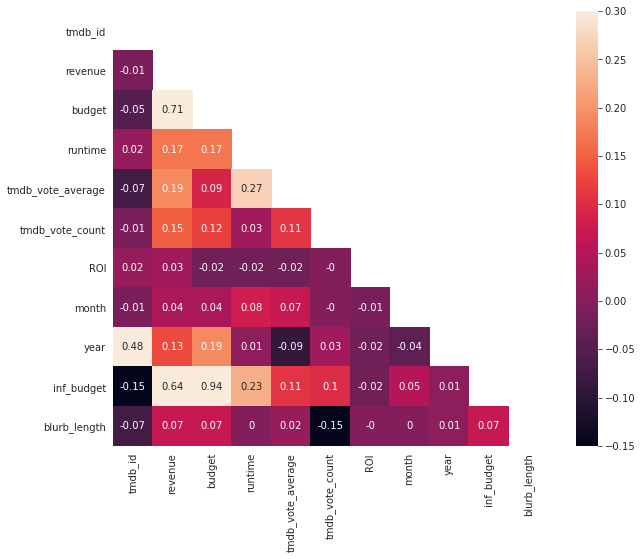

In [59]:
corr = np.corrcoef(np.random.randn(10, 200))
mask = np.zeros_like(data.corr())
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 8))
    ax = sns.heatmap(round(data.corr(), 2), mask=mask, vmax=.3, square=True, annot = True)

At a first glance there are some very interesting correlations:

<ol>higher run time with higher vote average </ol>
<ol>year and budget points towards inflation effects</ol>
<ol>high budgets and revenues tend to go hand in hand</ol>
<ol>higher budgets and runstimes can be observed, this makes sense as the longer films are the longer you need to sustain costs of cameras and crew ect, for higher scene count/longer scenes</ol>
<ol>There is an unexplainable negative correlation with vote coutns and blurb length</ol>
<ol>very slight posisitve correlation between the ROI and the vote count</ol>
<ol>correlations are all relatively low, indicating that our models will have limited multicolinearity</ol>
    
    

<b>descriptive statistics for these featurs<b>
 

In [60]:
round(data.describe(),1)

,tmdb_id,revenue,budget,runtime,tmdb_vote_average,tmdb_vote_count,ROI,month,year,inf_budget,blurb_length
count,8178.0,9.732000e+03,9732.0,9729.0,9732.0,9732.0,9732.0,9732.0,9732.0,9.732000e+03,9708.0
mean,107025.3,6.241932e+07,23530864.8,108.5,6.3,3023.9,444.3,6.8,2001.1,3.408065e+07,45.6
std,156163.2,1.477558e+08,36588421.7,22.8,1.1,8697.2,8217.7,3.4,15.6,4.813700e+07,26.2
min,5.0,1.001800e+04,11000.0,0.0,0.0,0.0,-100.0,1.0,1914.0,1.144060e+04,3.0
25%,9941.2,1.701796e+06,3018229.0,94.0,5.8,121.0,-61.4,4.0,1994.0,5.442041e+06,26.0
50%,24899.0,1.229133e+07,10000000.0,105.0,6.4,598.0,39.8,7.0,2005.0,1.805377e+07,39.0
75%,140212.0,5.318872e+07,28000000.0,119.0,7.0,2330.0,239.8,10.0,2012.0,4.292004e+07,61.0
max,807609.0,2.797801e+09,965313000.0,422.0,10.0,223050.0,666566.7,12.0,2023.0,1.614055e+09,181.0


/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

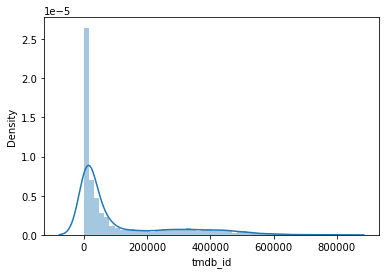

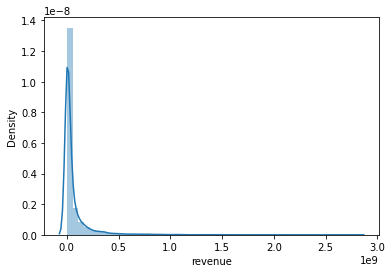

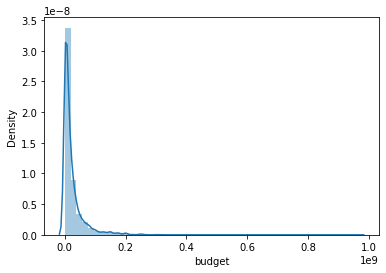

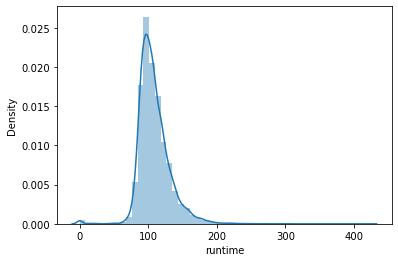

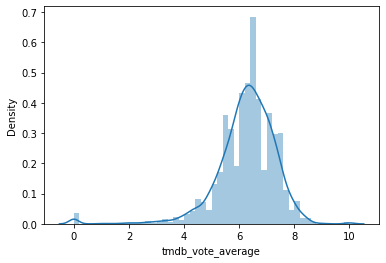

...

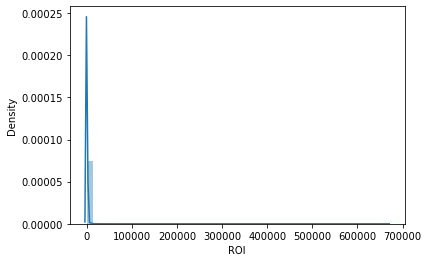

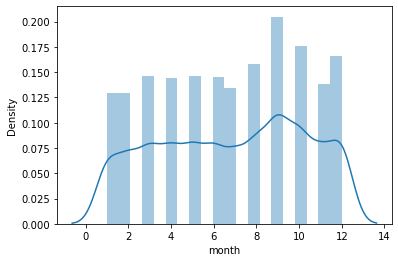

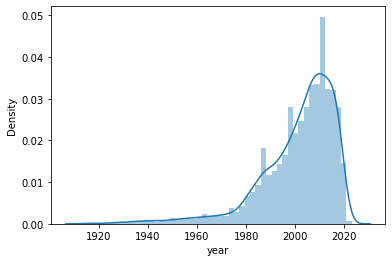

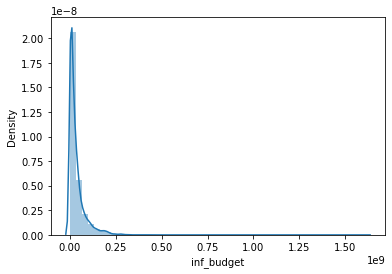

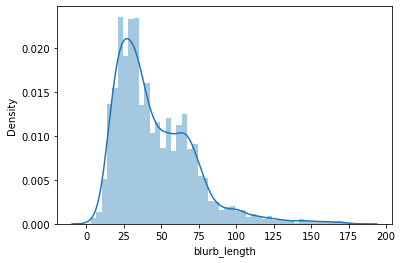

In [61]:
#key distributions to look at are inf_budget/ROI,blurb length,runtime,year,month,vote_average,vote count

for x in data.describe().columns:
    plt.figure()
    sns.distplot(data[x])

potential normal distributions: vote_average , runtime , blurb length

NB - the average vote of 6.3 indicates that on these platforms, only the higher rating films are having the revenues and budgets posted.

In [62]:
#confirm this with a normality test
from scipy import stats
for x in ['tmdb_vote_average', 'runtime', 'blurb_length', 'year']:
    print(stats.normaltest(data[pd.isna(data[x]) == False][x]))

#all significantly different from a normal distribution

NormaltestResult(statistic=3743.5584029930233, pvalue=0.0)
NormaltestResult(statistic=3146.4165210199344, pvalue=0.0)
NormaltestResult(statistic=2431.611227868636, pvalue=0.0)
NormaltestResult(statistic=3419.9133341576644, pvalue=0.0)


month has a uniform distribution appearance and the rest appear to exponentially decrease from low values

from the inf_budget , ROI and vote count there are outliers, so lets remove this and see any difference in the distribution

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

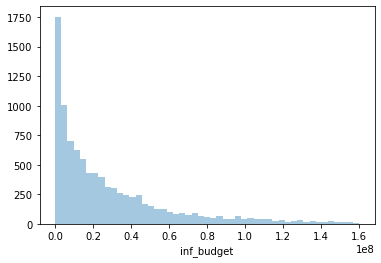

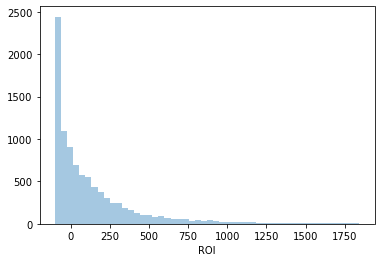

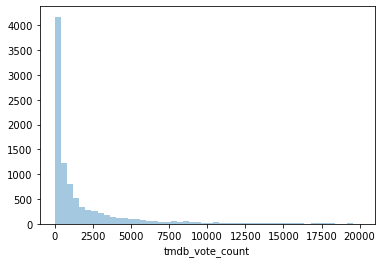

In [63]:
for x in ['inf_budget', 'ROI', 'tmdb_vote_count']:
    plt.figure()
    sns.distplot(data[(data[x] < data[x].quantile(0.97))][x], kde = False)

still showing exponential decline from zero, interestingly you can see a large amount of films with negative ROI. But the positive median would suggest that most are positive.

In [64]:
#removal of obvious outliers
data = data[data.ROI < data.ROI.quantile(0.98)]
data



,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,blurb,actors,directors,composer,ROI,month,day,year,inf_budget,blurb_length
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",1963-06-12,248.0,7.0,438,...,"Determined to hold on to the throne, Cleopatra...","['ACTOR_Elizabeth Taylor', 'ACTOR_Richard Burt...","[""'Director_Joseph L. Mankiewicz'""]",['COMPOSER_Alex North'],61.363636,6.0,Wednesday,1963.0,3.781901e+08,37.0
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",1945-11-30,67.0,7.2,201,...,"Al Roberts, a New York nightclub pianist, hitc...","['ACTOR_Tom Neal', 'ACTOR_Ann Savage', 'ACTOR_...","[""'Director_Edgar G. Ulmer'""]",['COMPOSER_Leo Erdody'],-46.093333,11.0,Friday,1945.0,4.359348e+05,56.0
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",1951-11-08,171.0,7.0,246,...,"Set against the back drop of Rome in crisis, G...","['ACTOR_Robert Taylor', 'ACTOR_Deborah Kerr', ...","[""'Director_Scott R. Beal'"", "" 'Director_Kenne...",['COMPOSER_Miklós Rózsa'],-98.668687,11.0,Thursday,1951.0,7.594529e+07,68.0
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...",2001-06-02,95.0,6.9,3494,...,The world's most highly qualified crew of arch...,"['ACTOR_Michael J. Fox', 'ACTOR_Corey Burton',...","[""'Director_Gary Trousdale'"", "" 'Director_Kirk...",['COMPOSER_James Newton Howard'],55.044771,6.0,Saturday,2001.0,1.773128e+08,52.0
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",2001-09-07,101.0,6.5,319,...,A widowed mother and her son change when a mys...,"['ACTOR_Anthony Hopkins', 'ACTOR_Anton Yelchin...","[""'Director_Scott Hicks'""]",['COMPOSER_Mychael Danna'],-21.981352,9.0,Friday,2001.0,4.572874e+07,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,['Comedy'],2020-02-14,100.0,4.1,289,...,A woman's island getaway with her boyfriend is...,"['ACTOR_Marco Antonio Aguirre', 'ACTOR_Jason A...","[""'Director_Diego Kaplan'""]",['COMPOSER_Iván Wyszogrod'],-9.966182,2.0,Friday,2020.0,3.355315e+06,21.0
10560,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,['Horror'],2019-08-09,79.0,2.8,220,...,After being thrown out of his home by his wife...,"['ACTOR_Duncan Casey', 'ACTOR_Justin Marosa', ...","[""'Director_Martin J Pickering'""]",NaN,4.347826,8.0,Friday,2019.0,2.122089e+04,34.0
10561,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"['Animation', ' Drama', ' Family']",2019-10-14,112.0,7.4,16277,...,A high-school boy who has run away to Tokyo be...,"['ACTOR_Kotaro Daigo', 'ACTOR_Nana Mori', 'ACT...","[""'Director_Makoto Shinkai'""]",['COMPOSER_Radwimps'],-29.741054,10.0,Monday,2019.0,1.134448e+07,21.0
10562,NaN,tt9779516,I Still Believe,9868521,12000000.0,"['Biography', ' Drama', ' Music']",2020-03-19,116.0,6.3,6196,...,The true-life story of Christian music star Je...,"['ACTOR_K.J. Apa', 'ACTOR_Britt Robertson', 'A...","[""'Director_Andrew Erwin'"", "" 'Director_Jon Er...",['COMPOSER_John Debney'],-17.762325,3.0,Thursday,2020.0,1.222776e+07,24.0


In [65]:
data.shape

(9537, 22)

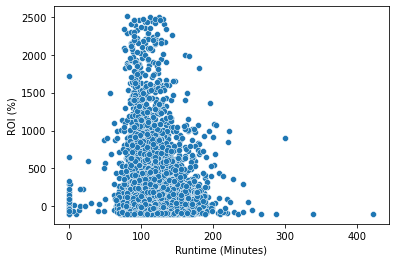

In [66]:
#ROI vs runtime
sns.scatterplot(x = data.runtime , y = data.ROI, palette = 'plasma');
plt.xlabel('Runtime (Minutes)');
plt.ylabel('ROI (%)');

In [67]:
data[data.runtime == 0]

,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,blurb,actors,directors,composer,ROI,month,day,year,inf_budget,blurb_length
1737,147868.0,tt2550838,Il peggior Natale della mia vita,10703234,6843500.0,['Comedy'],2012-12-22,0.0,5.9,412,...,Paolo needs to reach the castle of Alberto Cac...,"['ACTOR_Fabio De Luigi', 'ACTOR_Cristiana Capo...","[""'Director_Alessandro Genovesi'""]","['COMPOSER_Aldo De Scalzi', 'COMPOSER_Pivio']",56.400000,12.0,Saturday,2012.0,7.839410e+06,71.0
1812,348750.0,tt4158834,8 Seconds,1759935,5556000.0,['Drama'],2015-02-27,0.0,7.4,5,...,NaN,"['ACTOR_Esra Inal', 'ACTOR_Mehmet Kurtuluş', '...","[""'Director_Ömer Faruk Sorak'"", "" 'Director_Bi...",['COMPOSER_Gustavo Farias'],-68.323704,2.0,Friday,2015.0,6.225687e+06,NaN
2475,80753.0,tt1727491,"Connected: An Autoblogography About Love, Deat...",46782,1300000.0,['Documentary'],2011-01-21,0.0,4.3,7,...,"Tiffany Shlain's documentary, Connected, explo...",['ACTOR_Peter Coyote'],[''],['COMPOSER_Gunnard Doboze'],-96.401385,1.0,Friday,2011.0,1.552600e+06,94.0
2689,565916.0,tt0918662,The Visual Effects of 'Scary Movie 4',178262620,45000000.0,NaN,2006-04-20,0.0,5.0,1,...,NaN,NaN,[''],NaN,296.139156,4.0,Thursday,2006.0,5.873762e+07,NaN
3271,701121.0,tt12311866,Children of the Corn,14568989,800000.0,"['Horror', 'Thriller']",2020-10-17,0.0,7.3,4,...,A psychopathic twelve-year-old girl in a small...,"['ACTOR_Elena Kampouris', 'ACTOR_Kate Moyer', ...",[''],['COMPOSER_Jacob Shea'],1721.123625,10.0,Saturday,2020.0,8.080680e+05,49.0
4414,679670.0,tt10918524,Rescue Me: A Home 4 Spot,50000,25000.0,['Documentary'],2019-10-08,0.0,0.0,0,...,This sweet and inspiring documentary explores ...,['ACTOR_Diana England'],[''],['COMPOSER_Maximilian Kabong'],100.000000,10.0,Tuesday,2019.0,2.555062e+04,40.0
4751,60049.0,tt0961043,Come tu mi vuoi,7086000,2500000.0,['Comedy'],2007-10-09,0.0,5.8,468,...,Giada and Riccardo are opposite. Giada takes h...,"['ACTOR_Cristiana Capotondi', 'ACTOR_Nicolas V...","[""'Director_Volfango De Biasi'""]",['COMPOSER_Michele Braga'],183.440000,10.0,Tuesday,2007.0,3.147064e+06,40.0
5308,339865.0,tt3129632,Katari Veera Surasundarangi,2400000,1200000.0,NaN,2012-05-10,0.0,2.0,3,...,A man gets killed and finds himself in front o...,"['ACTOR_Upendra', 'ACTOR_Divya Spandana', 'ACT...",[''],['COMPOSER_V. Harikrishna'],100.000000,5.0,Thursday,2012.0,1.373352e+06,38.0
5575,285908.0,tt0191076,Le dernier souffle,559298,3800000.0,"['Crime', 'Drama']",1999-03-25,0.0,5.0,4,...,NaN,"['ACTOR_Luc Picard', 'ACTOR_Julien Poulin', 'A...","[""'Director_Richard Ciupka'""]","['COMPOSER_Gaëtan Gravel', 'COMPOSER_Serge LaF...",-85.281632,3.0,Thursday,1999.0,6.057292e+06,NaN
5699,92384.0,tt0285869,Trois 2: Pandora's Box,833779,800000.0,"['Drama', 'Thriller', 'Romance']",2002-08-09,0.0,6.3,11,...,"Stuck in a dull marriage, successful shrink Mi...","['ACTOR_Michael Jai White', 'ACTOR_Monica Calh...","[""'Director_Rob Hardy'""]",['COMPOSER_Steven Gutheinz'],4.222375,8.0,Friday,2002.0,1.164423e+06,42.0


In [68]:
#for films with zero runtime (clearly a mistake), lets make their values the median film runtime as to not disturb the distribution of runtimes


# for index, row in data.iterrows():
#     if row['runtime'] == 0:
#         data.loc[index,'runtime'] == data[data.runtime != 0]['runtime'].mode()


data.runtime = data.runtime.replace(0,data[data.runtime != 0]['runtime'].median())

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


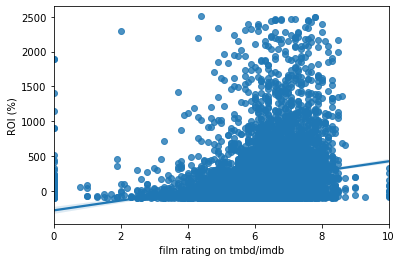

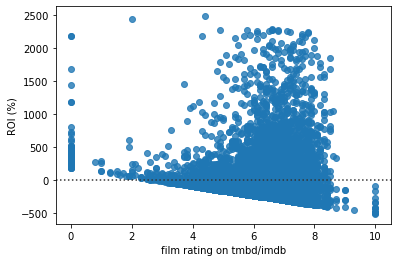

In [69]:
#ROI vs vote average
sns.regplot(x = data.tmdb_vote_average , y = data.ROI);
plt.xlabel('film rating on tmbd/imdb');
plt.ylabel('ROI (%)');


plt.figure();
sns.residplot(x = data.tmdb_vote_average , y = data.ROI);
plt.xlabel('film rating on tmbd/imdb');
plt.ylabel('ROI (%)');


the graph above suggests a polynomial relationship between a films rating and the ROI and the correlation is slightly positive, observed from the gradient of the regression plot.

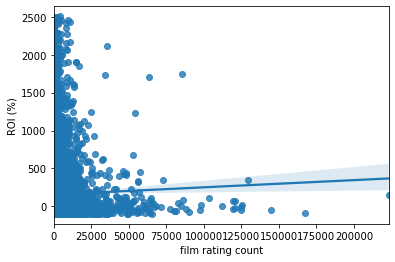

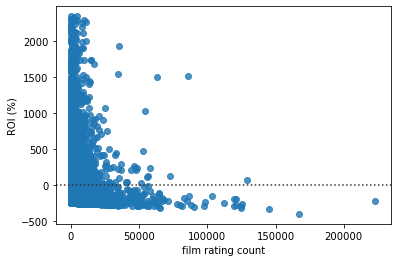

In [70]:
#ROI vs vote count
sns.regplot(x = data.tmdb_vote_count , y = data.ROI);
plt.xlabel('film rating count');
plt.ylabel('ROI (%)');


plt.figure();
sns.residplot(x = data.tmdb_vote_count , y = data.ROI);
plt.xlabel('film rating count');
plt.ylabel('ROI (%)');

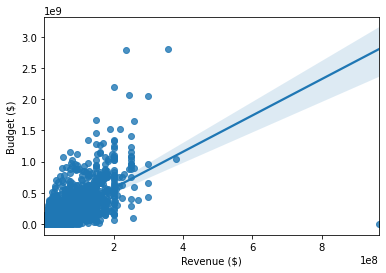

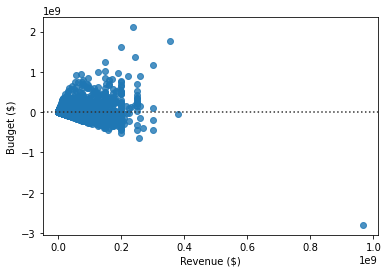

In [71]:
#reveue vs budget

sns.regplot(x = data.budget , y = data.revenue);
plt.xlabel('Revenue ($)');
plt.ylabel('Budget ($)');

plt.figure();
sns.residplot(x = data.budget , y = data.revenue);
plt.xlabel('Revenue ($)');
plt.ylabel('Budget ($)');

Films with higher budgets tend to have higher revenues, potentially due to higher marketing and the ability to employ more skillful actors among many other things.

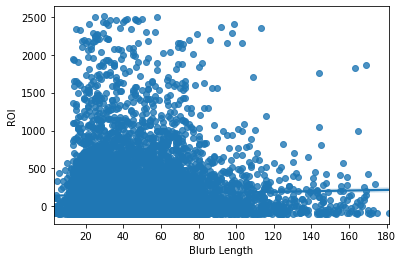

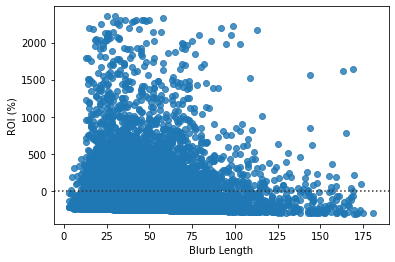

In [72]:
#blurb word length vs ROI

sns.regplot(x = data.blurb_length, y = data.ROI);
plt.xlabel('Blurb Length');
plt.ylabel('ROI');

plt.figure()
sns.residplot(x = data.blurb_length, y = data.ROI);
plt.xlabel('Blurb Length');
plt.ylabel('ROI (%)');

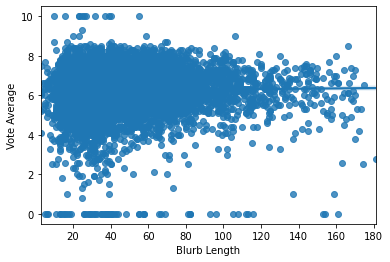

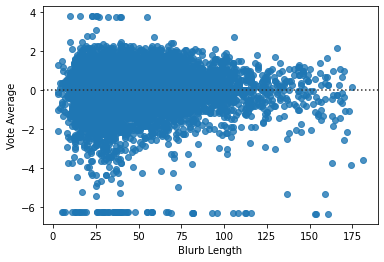

In [73]:
#blub length vs rating average

sns.regplot(x = data.blurb_length, y = data.tmdb_vote_average);
plt.xlabel('Blurb Length');
plt.ylabel('Vote Average');

plt.figure()
sns.residplot(x = data.blurb_length, y = data.tmdb_vote_average);
plt.xlabel('Blurb Length');
plt.ylabel('Vote Average');

No relationship seen between ROI and the blurb length

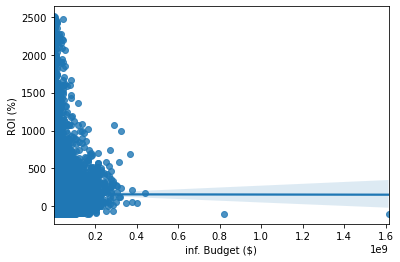

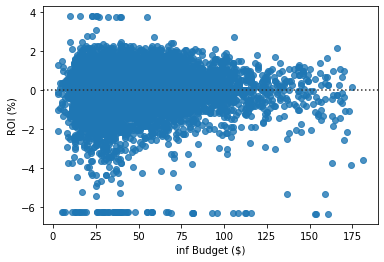

In [74]:
sns.regplot(x = data.inf_budget, y = data.ROI);
plt.xlabel('inf. Budget ($)');
plt.ylabel('ROI (%)');

plt.figure()
sns.residplot(x = data.blurb_length, y = data.tmdb_vote_average);
plt.xlabel('inf Budget ($)');
plt.ylabel('ROI (%)');

Although budget and revenue have a clear positive correlation while making movies, the same cannot be said for budget and ROI

<b>creation of dummies for actors/directors/genres/spoken languages</b>

<b>lets isolate the genres and see if there are any trends </b>

In [75]:

for index , row in data.iterrows():
    try:
        for genre in eval(row['genres']):
            data.loc[index, f'GENRE_{genre.strip()}'] = 1
    except:
        continue
        


/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [75]:
data.columns

Index(['tmdb_id', 'imdb_id', 'title', 'revenue', 'budget', 'genres',
       'release_date', 'runtime', 'tmdb_vote_average', 'tmdb_vote_count',
       'spoken_languages', 'production_countries', 'blurb', 'actors',
       'directors', 'composer', 'ROI', 'month', 'day', 'year', 'inf_budget',
       'blurb_length', 'GENRE_Drama', 'GENRE_History', 'GENRE_Romance',
       'GENRE_Crime', 'GENRE_Animation', 'GENRE_Family', 'GENRE_Adventure',
       'GENRE_Science Fiction', 'GENRE_Mystery', 'GENRE_Fantasy',
       'GENRE_Comedy', 'GENRE_Action', 'GENRE_Thriller', 'GENRE_Western',
       'GENRE_Horror', 'GENRE_Documentary', 'GENRE_War', 'GENRE_Music',
       'GENRE_TV Movie', 'GENRE_Film-Noir', 'GENRE_Biography', 'GENRE_Sci-Fi',
       'GENRE_Sport', 'GENRE_Musical'],
      dtype='object')

Tidy up the headers

In [76]:
headers = []
for header in data.columns:
    header = header.replace('-','_')
    headers.append(header)
    


In [77]:
data.columns = headers

In [78]:
data.head()

,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sci_Fi,GENRE_Sport,GENRE_Musical
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",1963-06-12,248.0,7.0,438,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",1945-11-30,67.0,7.2,201,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",1951-11-08,171.0,7.0,246,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...",2001-06-02,95.0,6.9,3494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",2001-09-07,101.0,6.5,319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


create the binary columns for each genre

In [79]:
for x in [column for column in data.columns if 'GENRE' in column]:
    data[x] = data[x].replace(np.nan,0)

<ipython-input-79-19d75a2d58b6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[x] = data[x].replace(np.nan,0)


In [80]:
data.head()

,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sci_Fi,GENRE_Sport,GENRE_Musical
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"['Drama', 'History', 'Romance']",1963-06-12,248.0,7.0,438,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,20367.0,tt0037638,Detour,16172,30000.0,"['Crime', 'Drama']",1945-11-30,67.0,7.2,201,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"['Drama', 'History', 'Romance']",1951-11-08,171.0,7.0,246,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"['Animation', 'Family', 'Adventure', 'Science ...",2001-06-02,95.0,6.9,3494,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"['Drama', 'Mystery']",2001-09-07,101.0,6.5,319,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
data['GENRE_Science Fiction'].value_counts()

0.0    8695
1.0     842
Name: GENRE_Science Fiction, dtype: int64

In [82]:
#sci fi and science fiction are the same thing so need to account for this

for index , row in data.iterrows():
    if row['GENRE_Sci_Fi'] == 1:
        data.loc[index, 'GENRE_Science Fiction'] = 1


/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [83]:
data['GENRE_Science Fiction'].value_counts()

0.0    8651
1.0     886
Name: GENRE_Science Fiction, dtype: int64

In [84]:
data['GENRE_Sci_Fi'].value_counts()

0.0    9493
1.0      44
Name: GENRE_Sci_Fi, dtype: int64

In [85]:
data.drop('GENRE_Sci_Fi', axis = 1, inplace = True)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [86]:
genres = data[[x for x in data.columns if 'GENRE' in x]]
genres

,GENRE_Drama,GENRE_History,GENRE_Romance,GENRE_Crime,GENRE_Animation,GENRE_Family,GENRE_Adventure,GENRE_Science Fiction,GENRE_Mystery,GENRE_Fantasy,...,GENRE_Western,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sport,GENRE_Musical
0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10560,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10561,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10562,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [87]:
genres.describe()

,GENRE_Drama,GENRE_History,GENRE_Romance,GENRE_Crime,GENRE_Animation,GENRE_Family,GENRE_Adventure,GENRE_Science Fiction,GENRE_Mystery,GENRE_Fantasy,...,GENRE_Western,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sport,GENRE_Musical
count,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,...,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000
mean,0.517144,0.049177,0.197232,0.155709,0.046451,0.094684,0.150362,0.092901,0.074866,0.086086,...,0.015099,0.099297,0.009542,0.038377,0.035231,0.000839,0.000105,0.011324,0.006606,0.002202
std,0.499732,0.216249,0.397930,0.362599,0.210470,0.292793,0.357444,0.290309,0.263189,0.280505,...,0.121954,0.299077,0.097220,0.192114,0.184373,0.028952,0.010240,0.105817,0.081012,0.046876
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [88]:
#count of each genre

genres.sum(axis = 0).sort_values(ascending = False).to_frame()

,0
GENRE_Drama,4932.0
GENRE_Comedy,3538.0
GENRE_Thriller,2174.0
GENRE_Action,2125.0
GENRE_Romance,1881.0
GENRE_Crime,1485.0
GENRE_Adventure,1434.0
GENRE_Horror,947.0
GENRE_Family,903.0
GENRE_Science Fiction,886.0


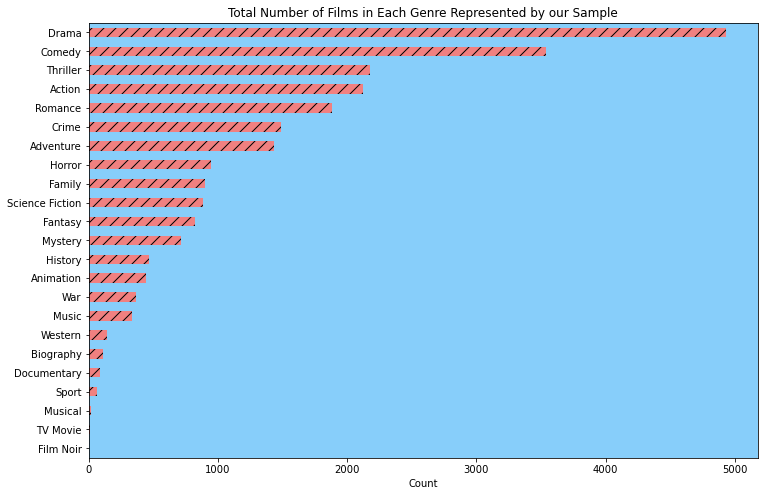

In [89]:
ax = genres.sum(axis = 0).to_frame().sort_values(by = 0,
                                            ascending = True).plot(kind = 'barh', 
                                                                    y = 0,hatch = '//', 
                                                                    color = 'lightcoral', 
                                                                    figsize = (12,8),
                                                                   legend = False);
labels = [x[6:].replace('_', ' ') for x in genres.sum(axis = 0).to_frame().sort_values(by = 0,
                                            ascending = True).index]
labels
ax.set_yticklabels(labels);
ax.set_facecolor('lightskyblue');
ax.set_title('Total Number of Films in Each Genre Represented by our Sample');
ax.set_xlabel('Count');

A lot of films are considered drama which makes sense when we think of the dramatical effect that serious films are supposed to have.


In [90]:
#genres vs ROI

ROI_genre = pd.DataFrame()

for x in genres.columns:
    print(x)
    ROI_genre[x] = genres[x] * data['ROI']
    
ROI_genre


GENRE_Drama
GENRE_History
GENRE_Romance
GENRE_Crime
GENRE_Animation
GENRE_Family
GENRE_Adventure
GENRE_Science Fiction
GENRE_Mystery
GENRE_Fantasy
GENRE_Comedy
GENRE_Action
GENRE_Thriller
GENRE_Western
GENRE_Horror
GENRE_Documentary
GENRE_War
GENRE_Music
GENRE_TV Movie
GENRE_Film_Noir
GENRE_Biography
GENRE_Sport
GENRE_Musical


,GENRE_Drama,GENRE_History,GENRE_Romance,GENRE_Crime,GENRE_Animation,GENRE_Family,GENRE_Adventure,GENRE_Science Fiction,GENRE_Mystery,GENRE_Fantasy,...,GENRE_Western,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sport,GENRE_Musical
0,61.363636,61.363636,61.363636,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
1,-46.093333,-0.000000,-0.000000,-46.093333,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0
2,-98.668687,-98.668687,-98.668687,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0
3,0.000000,0.000000,0.000000,0.000000,55.044771,55.044771,55.044771,55.044771,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
4,-21.981352,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-21.981352,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0
10560,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,4.347826,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
10561,-29.741054,-0.000000,-0.000000,-0.000000,-29.741054,-29.741054,-0.000000,-0.000000,-0.000000,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.000000,-0.0,-0.0
10562,-17.762325,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.0,...,-0.0,-0.000000,-0.0,-0.0,-17.762325,-0.0,-0.0,-17.762325,-0.0,-0.0


In [91]:
#total ROI per genre
total_roi = ROI_genre.sum(axis = 0)
total_roi.sort_values(ascending = False).to_frame()

,0
GENRE_Drama,659617.268571
GENRE_Comedy,585919.203978
GENRE_Thriller,353089.536231
GENRE_Action,335833.707988
GENRE_Romance,302436.670082
GENRE_Adventure,263237.561432
GENRE_Horror,226495.447037
GENRE_Crime,203116.679524
GENRE_Family,169433.862803
GENRE_Science Fiction,149942.278043


In [92]:
#ROI mean vs genre
ROI_genre.describe().loc['mean'].sort_values(ascending = False).to_frame()

,mean
GENRE_Drama,69.164021
GENRE_Comedy,61.436427
GENRE_Thriller,37.023124
GENRE_Action,35.213768
GENRE_Romance,31.711929
GENRE_Adventure,27.601716
GENRE_Horror,23.749129
GENRE_Crime,21.297754
GENRE_Family,17.765950
GENRE_Science Fiction,15.722164


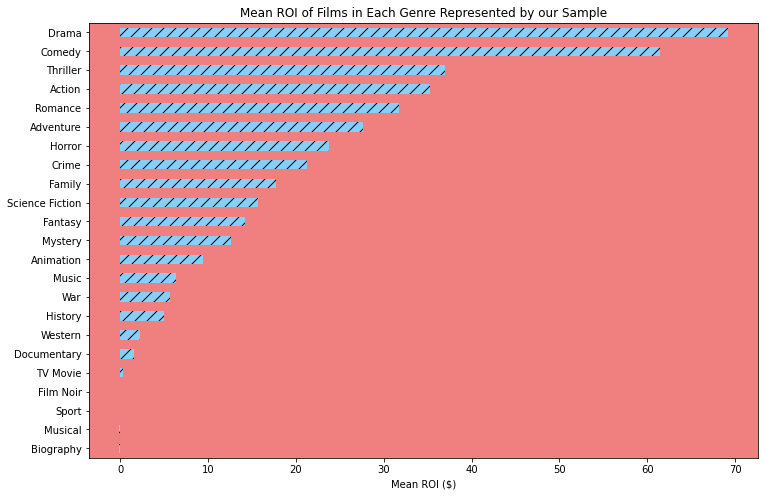

In [93]:
ax = ROI_genre.describe().loc['mean'].sort_values(ascending = True).to_frame().plot(kind = 'barh', 
                                                                    y = 0,hatch = '//', 
                                                                    color = 'lightskyblue', 
                                                                    figsize = (12,8),
                                                                   legend = False);
labels = [x[6:].replace('_', ' ') for x in ROI_genre.describe().loc['mean'].sort_values(ascending = True).to_frame().index]
labels
ax.set_yticklabels(labels);
ax.set_facecolor('lightcoral');
ax.set_title('Mean ROI of Films in Each Genre Represented by our Sample');
ax.set_xlabel('Mean ROI ($)');

Comedy also reaches the top end of the ROI spectrum, which could make sense given the typical comedy simply needs humour rather than say action which will require a larger budget. Its also an indication that people may just prefer a good laugh more than anything else.

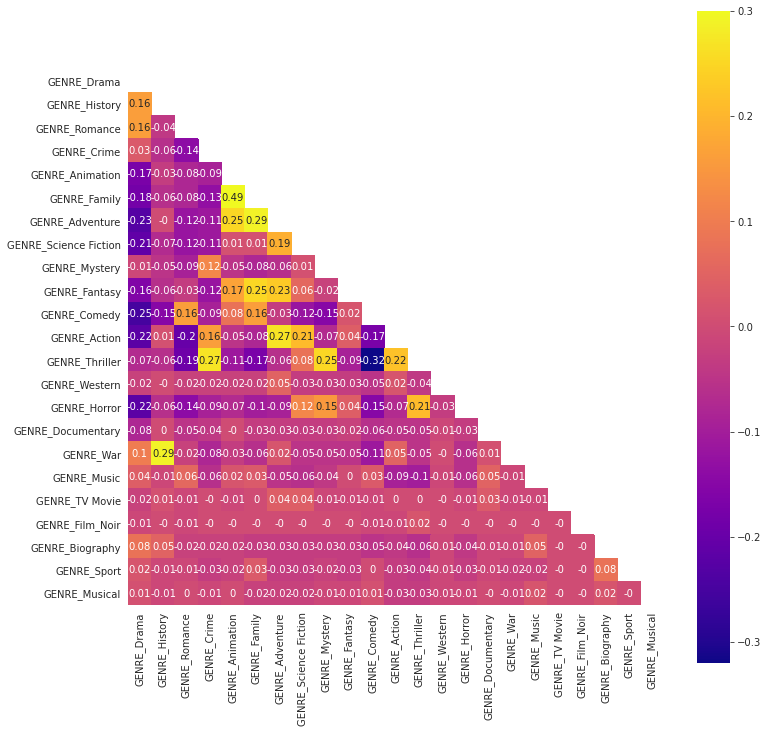

In [94]:
corr = np.corrcoef(np.random.randn(10, 200))
mask = np.zeros_like(genres.corr())
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(round(genres.corr(), 2), mask=mask, vmax=.3, square=True, annot = True, cmap = 'plasma')


<b>Genres that correlate highly</b>:

family + animation

adventure + family

thriller + crime

action + adventure

history + war


<b> genres that correlate negatively</b>:

thriller + comedy

drama + comedy

drama + adventure

horror + drama



This could tell us what the film industry is missing in terms of genre pairings, but conversly, it also tell us what has worked well in the past.

In [95]:
#rating by genre

rating_genre = pd.DataFrame()

for x in genres.columns:
    rating_genre[x] = genres[x] * data['tmdb_vote_average']
    
rating_genre




,GENRE_Drama,GENRE_History,GENRE_Romance,GENRE_Crime,GENRE_Animation,GENRE_Family,GENRE_Adventure,GENRE_Science Fiction,GENRE_Mystery,GENRE_Fantasy,...,GENRE_Western,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sport,GENRE_Musical
0,7.0,7.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7.2,0.0,0.0,7.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.0,7.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,6.9,6.9,6.9,6.9,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.5,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10560,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10561,7.4,0.0,0.0,0.0,7.4,7.4,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10562,6.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.3,0.0,0.0,6.3,0.0,0.0


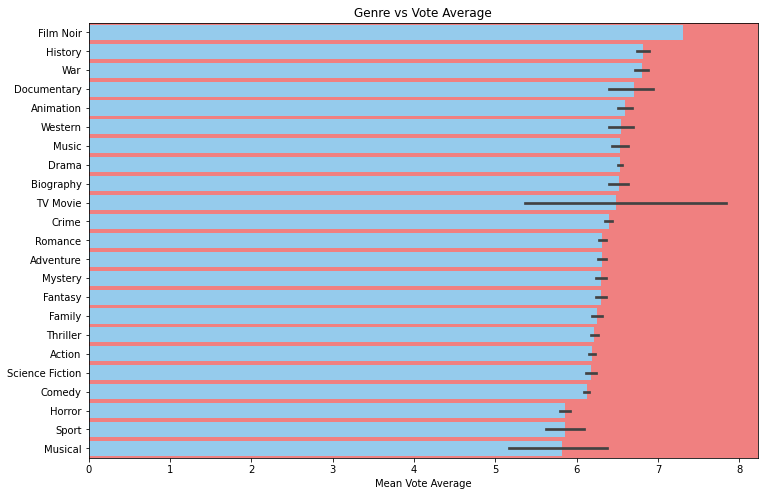

In [96]:
fig, ax = plt.subplots(figsize = (12,8));
ax = sns.barplot(data = rating_genre[rating_genre != 0], orient = 'h', order=[x for x in rating_genre[rating_genre != 0].mean().sort_values(ascending = False).index],
                color = 'lightskyblue');

labels = [x[6:].replace('_', ' ') for x in rating_genre[rating_genre != 0].mean().sort_values(ascending = False).index]

ax.set_title('Genre vs Vote Average');
ax.set_yticklabels(labels);
ax.set_facecolor('lightcoral');
ax.set_xlabel('Mean Vote Average');

In [97]:
rating_genre[rating_genre != 0].mean().sort_values(ascending = False)

GENRE_Film_Noir          7.300000
GENRE_History            6.815352
GENRE_War                6.796694
GENRE_Documentary        6.698837
GENRE_Animation          6.595000
GENRE_Western            6.547917
GENRE_Music              6.532239
GENRE_Drama              6.527712
GENRE_Biography          6.521296
GENRE_TV Movie           6.487500
GENRE_Crime              6.393919
GENRE_Romance            6.315413
GENRE_Adventure          6.310917
GENRE_Mystery            6.304079
GENRE_Fantasy            6.295961
GENRE_Family             6.250558
GENRE_Thriller           6.216244
GENRE_Action             6.187182
GENRE_Science Fiction    6.172059
GENRE_Comedy             6.123473
GENRE_Horror             5.858466
GENRE_Sport              5.857143
GENRE_Musical            5.819048
dtype: float64

In [99]:
#genre vs runtime
runtime_genre = pd.DataFrame()

for x in genres.columns:
    runtime_genre[x] = genres[x] * data['runtime']
    
runtime_genre


,GENRE_Drama,GENRE_History,GENRE_Romance,GENRE_Crime,GENRE_Animation,GENRE_Family,GENRE_Adventure,GENRE_Science Fiction,GENRE_Mystery,GENRE_Fantasy,...,GENRE_Western,GENRE_Horror,GENRE_Documentary,GENRE_War,GENRE_Music,GENRE_TV Movie,GENRE_Film_Noir,GENRE_Biography,GENRE_Sport,GENRE_Musical
0,248.0,248.0,248.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,67.0,0.0,0.0,67.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,171.0,171.0,171.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,95.0,95.0,95.0,95.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,101.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,101.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10559,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10560,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10561,112.0,0.0,0.0,0.0,112.0,112.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10562,116.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,116.0,0.0,0.0,116.0,0.0,0.0


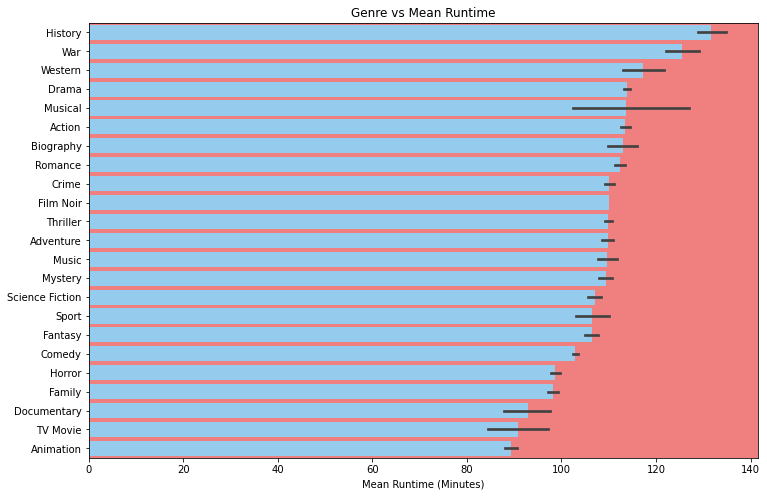

In [100]:
fig, ax = plt.subplots(figsize = (12,8));
ax = sns.barplot(data = runtime_genre[runtime_genre != 0], orient = 'h', order=[x for x in runtime_genre[runtime_genre != 0].mean().sort_values(ascending = False).index],
                color = 'lightskyblue');

labels = [x[6:].replace('_', ' ') for x in runtime_genre[runtime_genre != 0].mean().sort_values(ascending = False).index]

ax.set_title('Genre vs Mean Runtime');
ax.set_yticklabels(labels);
ax.set_facecolor('lightcoral');
ax.set_xlabel('Mean Runtime (Minutes)');

The longer the film, the higher the budget will need to be to sustain costs, so when choosing a genre for a film, its useful to be weary of how long they tend to be. 

Interestingly, animation is at the bottom of the list here, perhaps becuase of the short attention pan of childeren? Or could it be becuase they are expecive to maintain for over an hour and a half?

In [101]:
runtime_genre[runtime_genre != 0].mean().sort_values(ascending = False)

GENRE_History            131.658849
GENRE_War                125.543716
GENRE_Western            117.319444
GENRE_Drama              113.878524
GENRE_Musical            113.619048
GENRE_Action             113.477647
GENRE_Biography          112.953704
GENRE_Romance            112.335991
GENRE_Crime              110.109091
GENRE_Film_Noir          110.000000
GENRE_Thriller           109.876725
GENRE_Adventure          109.811018
GENRE_Music              109.571429
GENRE_Mystery            109.330532
GENRE_Science Fiction    106.993228
GENRE_Sport              106.444444
GENRE_Fantasy            106.411693
GENRE_Comedy             102.952192
GENRE_Horror              98.723337
GENRE_Family              98.291251
GENRE_Documentary         92.923077
GENRE_TV Movie            90.750000
GENRE_Animation           89.392777
dtype: float64

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


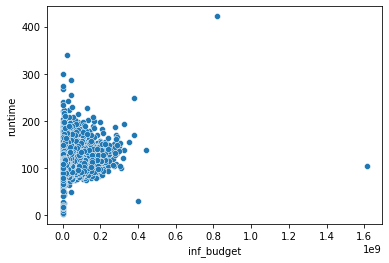

In [186]:
sns.scatterplot(data.inf_budget , data.runtime);

The above relationship is much flatter than expected, this could be due to the extremely low budgets which can be seen to the left. These budgets could be inputted wrongly into tmbd, or they could represent low budget genres.

<b> ROI vs Month</b>

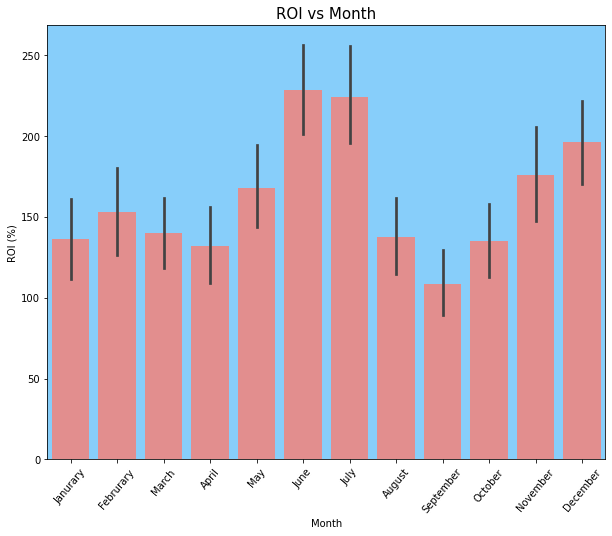

In [110]:
fig, ax = plt.subplots(figsize = (10,8));
ax = sns.barplot(x = data.month , y = data.ROI, color = 'lightcoral');
plt.xlabel('Month');
plt.ylabel('ROI (%)');
labels = ['Janurary', 'Februrary', 'March', 'April', 'May', 'June','July', 'August', 'September','October' ,'November', 'December']
ax.set_xticklabels(labels, rotation = 50);
plt.title('ROI vs Month', fontsize = 15);
ax.set_facecolor('lightskyblue')

In [111]:
#whats the significance? analysis of variance will tell us

anova_df = data[['month', 'ROI']]
grouped_anova = anova_df.groupby('month')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in data.month.unique()])


#significant difference between months to 99% confidence

F_onewayResult(statistic=8.869253078230212, pvalue=6.653398182753376e-16)

June, july and december releases seem to have the highest movie ROI, this could be becuase of the summer holidays and christmas holiday when people are more availible to go to the cinema. We can accept thee differences are significant to 99% confidence and so the months will be retained for our modelling.

<b>Day Vs ROI</b>

In [112]:
data['month_day'] = data.release_date.dt.day
data.month_day

<ipython-input-112-2b665a9cb390>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['month_day'] = data.release_date.dt.day


0        12
1        30
2         8
3         2
4         7
         ..
10559    14
10560     9
10561    14
10562    19
10563    28
Name: month_day, Length: 9537, dtype: int64

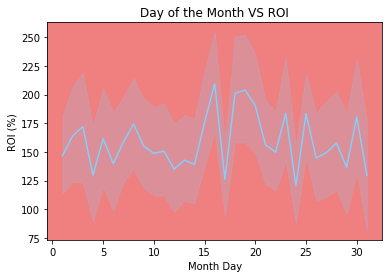

In [113]:
fig, ax = plt.subplots();
ax = sns.lineplot(x = data.month_day , y = data.ROI, palette = 'plasma', color = 'lightskyblue');
ax.set_facecolor('lightcoral')
plt.xlabel('Month Day');
plt.ylabel('ROI (%)');
plt.title('Day of the Month VS ROI');

In [114]:
#whats the significance? analysis of variance will tell us

anova_df = data[['month_day', 'ROI']]
grouped_anova = anova_df.groupby('month_day')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in data.month_day.unique()])


#will have to accept null hypothesis; that there is no significant difference between days

F_onewayResult(statistic=1.2753734853401655, pvalue=0.1436690548695192)

There is no immediate trend or relationship here other than the peak and trough at day 16 and 17. The lighter shape of blue indicates the large amount of error for each day. A resulting analysis. ofvariance will show that there is no significant difference between the ROI means of different days, thus, it can be left out as a variables for modelling.

In [115]:
#therefore we do not need days in our model

data.drop('month_day', axis = 1, inplace = True)

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


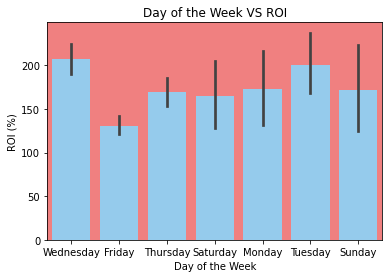

In [116]:
fig, ax = plt.subplots();
ax = sns.barplot(x = data.day , y = data.ROI, color = 'lightskyblue');
ax.set_facecolor('lightcoral')
plt.xlabel('Day of the Week');
plt.ylabel('ROI (%)');
plt.title('Day of the Week VS ROI');

In [117]:
#normalised value counts 
data.day.value_counts(normalize = True).to_frame()

,day
Friday,0.467443
Thursday,0.199224
Wednesday,0.167348
Tuesday,0.052952
Saturday,0.047185
Monday,0.034078
Sunday,0.031771


In [118]:
#whats the significance? analysis of variance will tell us

anova_df = data[['day', 'ROI']]
grouped_anova = anova_df.groupby('day')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in data.day.unique()])

#there is statistical significance between the ROI of films released on certain days of the week at 99% confidence

F_onewayResult(statistic=10.634412588747193, pvalue=8.300356623573286e-12)

Interestingly, films on a wednesday appear to have the highest ROI mean, I could not say why. Also, there appears to be a significant difference between the means of ROI which sugggests that the day of the week has an affect on how much ROI a film will get.

<b>Year vs ROI</b>

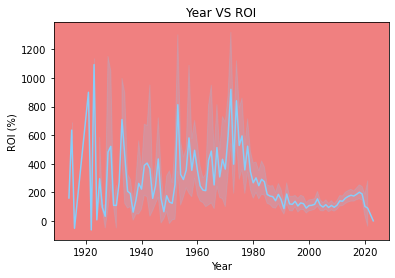

In [119]:
fig, ax = plt.subplots();
ax = sns.lineplot(x = data.year , y = data.ROI, color = 'lightskyblue');
ax.set_facecolor('lightcoral')
plt.xlabel('Year');
plt.ylabel('ROI (%)');
plt.title('Year VS ROI');

In [120]:
anova_df = data[['year', 'ROI']]
grouped_anova = anova_df.groupby('year')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in data.year.unique()])


F_onewayResult(statistic=6.127133782260321, pvalue=2.125751527897657e-74)

The ROI of films is highly fluctuating with large error in the calculation of the mean. Past 1980, the graph becomes more smooth and between 2015-2020 we begin to see ROI increasing before the pandemic hit in 2020.

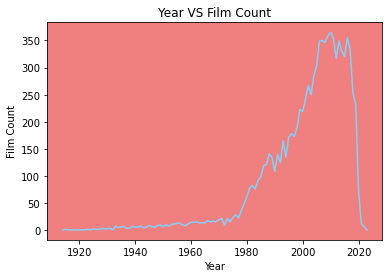

In [121]:
fig, ax = plt.subplots();
ax = sns.lineplot(x = anova_df.groupby('year').count().index,y = anova_df.groupby('year').count()['ROI'], color = 'lightskyblue');
ax.set_facecolor('lightcoral')
plt.xlabel('Year');
plt.ylabel('Film Count');
plt.title('Year VS Film Count');

This could be the reason for such high variance between the earlier years, our sample does not represent this well. Hopefully in the future, data collection will have been instilled so that work such as this can be carried out for longer timespans with ease.

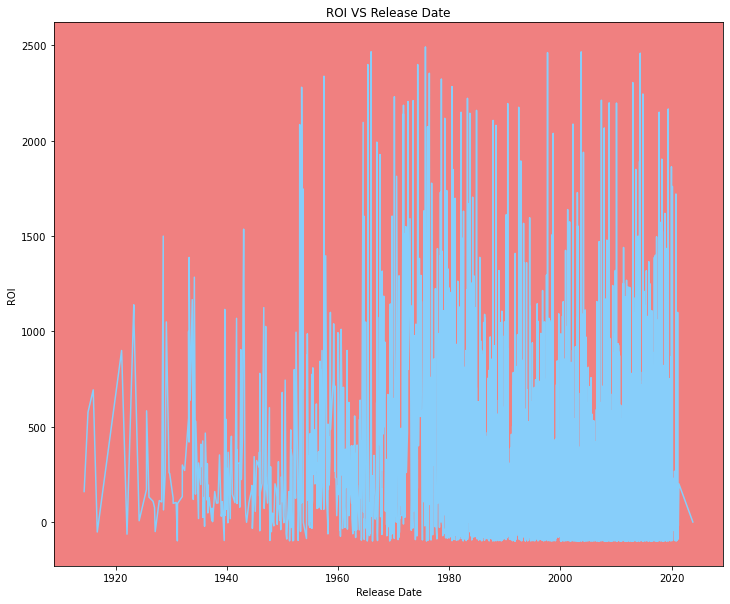

In [122]:
fig, ax = plt.subplots(figsize = (12,10));
ax = sns.lineplot(x = data.groupby('release_date').mean().index,y = data.groupby('release_date').mean()['ROI'], color = 'lightskyblue');
ax.set_facecolor('lightcoral')
plt.xlabel('Release Date');
plt.ylabel('ROI');
plt.title('ROI VS Release Date');

In [123]:
data.to_csv('data_before_actors.csv', index = False)

<b>ACTORS</b>

In [126]:
actors = pd.DataFrame()

In [127]:
data.reset_index(drop = True, inplace = True)

In [128]:
for index ,movie in tqdm(enumerate(data.actors)):
    try:
        for actor in movie[1:-1].replace("'",'').replace('"','').split(','):
            actors.loc[index, f'{actor.strip()}'] = 1
    except:
        continue
    
    if (index % 500) == 0:
        actors.to_csv(f'INDEX_{index}.csv')
        actors = pd.DataFrame()
actors

9537it [23:41,  6.71it/s]


,ACTOR_Erika Christensen,ACTOR_Faye Dunaway,ACTOR_Frankie Faison,ACTOR_Robert Forster,ACTOR_Brett Rice,ACTOR_L. Scott Caldwell,ACTOR_Mike Vogel,ACTOR_Meredith Andrews,ACTOR_Rus Blackwell,ACTOR_Tracey Bonner,...,ACTOR_Brigitte Poupart,ACTOR_Antoine Olivier Pilon,ACTOR_Rose-Marie Perreault,ACTOR_Denis Harvey,ACTOR_Jessica Iacobaccio,ACTOR_Elizabeth Tremblay-Gagnon,ACTOR_Laurie Babin,ACTOR_William Cantin,ACTOR_K.C. Coombs,ACTOR_Rodley Pitt
9501,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9504,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9505,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9506,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9508,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9509,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
# movie[1:-1].replace("'",'').replace('"','').split(',')

In [130]:
# for movie in data.actors[:1]:
#     for x in movie[1:-1].replace("'",'').replace('"','').split(','):
#         print(x.strip())
    

Needing to save the actors into one csv just incase the kernel stops and the data needs to be re-read into the jupyter notebook

In [131]:
actors.to_csv('INDEX_9500_onwards.csv')

In [132]:
actors = pd.read_csv(f'INDEX_0.csv', index_col = 0)

In [133]:
last = pd.read_csv('INDEX_9500_onwards.csv', index_col = 0)

In [134]:
for x in tqdm(range(500,10000,500)):
    new_actors = pd.read_csv(f'INDEX_{x}.csv', index_col = 0)
    actors = pd.concat([actors , new_actors], axis = 0)
    print(actors.shape)

  5%|▌         | 1/19 [00:01<00:34,  1.89s/it]

(500, 14263)


 11%|█         | 2/19 [00:04<00:34,  2.05s/it]

(999, 25531)


 16%|█▌        | 3/19 [00:06<00:35,  2.20s/it]

(1499, 34301)


 21%|██        | 4/19 [00:09<00:36,  2.43s/it]

(1999, 42801)


 26%|██▋       | 5/19 [00:13<00:39,  2.80s/it]

(2496, 50802)


 32%|███▏      | 6/19 [00:17<00:41,  3.22s/it]

(2995, 58111)


 37%|███▋      | 7/19 [00:22<00:44,  3.70s/it]

(3494, 65182)


 42%|████▏     | 8/19 [00:28<00:47,  4.30s/it]

(3994, 71003)


 47%|████▋     | 9/19 [00:34<00:48,  4.86s/it]

(4493, 76606)


 53%|█████▎    | 10/19 [00:42<00:53,  5.96s/it]

(4991, 82482)


 58%|█████▊    | 11/19 [00:51<00:55,  6.89s/it]

(5490, 88072)


 63%|██████▎   | 12/19 [01:02<00:56,  8.13s/it]

(5990, 93647)


 68%|██████▊   | 13/19 [01:17<00:59,  9.97s/it]

(6489, 99071)


 74%|███████▎  | 14/19 [01:37<01:05, 13.07s/it]

(6987, 104244)


 79%|███████▉  | 15/19 [02:00<01:04, 16.13s/it]

(7485, 109106)


 84%|████████▍ | 16/19 [02:26<00:56, 18.94s/it]

(7983, 114050)


 89%|████████▉ | 17/19 [02:54<00:43, 21.66s/it]

(8483, 116005)


 95%|█████████▍| 18/19 [03:25<00:24, 24.54s/it]

(8983, 118418)


100%|██████████| 19/19 [03:59<00:00, 12.63s/it]

(9483, 121628)


In [135]:
actors = pd.concat([actors, last], axis = 0)

In [136]:
actors.shape

(9519, 121897)

In [137]:
data.shape

(9537, 46)

check which values are null and what thier indexes are

In [138]:
nans = data[pd.isna(data.actors) == True].actors
nans

50      NaN
897     NaN
2128    NaN
2237    NaN
2479    NaN
2802    NaN
3442    NaN
4317    NaN
4783    NaN
4998    NaN
5354    NaN
6176    NaN
6843    NaN
6973    NaN
7369    NaN
7433    NaN
7574    NaN
7947    NaN
Name: actors, dtype: object

In [139]:
data_v2 = data.copy()

In [140]:
data_v2.reset_index(inplace= True)

In [141]:
actors.reset_index(inplace = True)

In [143]:
actors

,index,ACTOR_Elizabeth Taylor,ACTOR_Richard Burton,ACTOR_Rex Harrison,ACTOR_Pamela Brown,ACTOR_George Cole,ACTOR_Hume Cronyn,ACTOR_Cesare Danova,ACTOR_Kenneth Haigh,ACTOR_Andrew Keir,...,ACTOR_Julianne Côté,ACTOR_Brigitte Poupart,ACTOR_Antoine Olivier Pilon,ACTOR_Denis Harvey,ACTOR_Jessica Iacobaccio,ACTOR_Elizabeth Tremblay-Gagnon,ACTOR_Laurie Babin,ACTOR_William Cantin,ACTOR_K.C. Coombs,ACTOR_Rodley Pitt
0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9514,9532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9515,9533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9516,9534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9517,9535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [144]:
data_v3 = data_v2.merge(actors, how='left', on='index')

In [146]:
#did the actors and films line up correctly



count = 0
for observation, x in enumerate(data_v3.actors):
#     if pd.isna(x) != True:
    try:
        for actor in x[1:-1].replace("'",'').replace('"','').split(','):
            if data_v3.loc[observation, actor.strip()] != 1:
                print((observation, x))
    except:
        if observation in nannys.index:
            print('NULL ROW')
        


NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW
NULL ROW


In [148]:

# import scipy.sparse
# sparse_matrix = scipy.sparse.csc_matrix(data_v3.values)
data_v3


,index,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,...,ACTOR_Julianne Côté,ACTOR_Brigitte Poupart,ACTOR_Antoine Olivier Pilon,ACTOR_Denis Harvey,ACTOR_Jessica Iacobaccio,ACTOR_Elizabeth Tremblay-Gagnon,ACTOR_Laurie Babin,ACTOR_William Cantin,ACTOR_K.C. Coombs,ACTOR_Rodley Pitt
0,0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"[Drama, History, Romance]",1963-06-12,248.0,7.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,20367.0,tt0037638,Detour,16172,30000.0,"[Crime, Drama]",1945-11-30,67.0,7.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"[Drama, History, Romance]",1951-11-08,171.0,7.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"[Animation, Family, Adventure, Science Fiction]",2001-06-02,95.0,6.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"[Drama, Mystery]",2001-09-07,101.0,6.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,9532,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,[Comedy],2020-02-14,100.0,4.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9533,9533,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,[Horror],2019-08-09,79.0,2.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9534,9534,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"[Animation, Drama, Family]",2019-10-14,112.0,7.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9535,9535,NaN,tt9779516,I Still Believe,9868521,12000000.0,"[Biography, Drama, Music]",2020-03-19,116.0,6.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [149]:
actors = data_v3[[x for x in data_v3.columns if 'ACTOR' in x]]


In [150]:
#need to decrease the number of actors for optimum memory space to be able to analyse and run ml models

#need to check if limiting the number of actors to those actors who have done at least three films is enough for memory space
actors.describe().T[actors.describe().T['count']> 3]

,count,mean,std,min,25%,50%,75%,max
ACTOR_Elizabeth Taylor,7.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Richard Burton,10.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Rex Harrison,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Pamela Brown,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Hume Cronyn,14.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...
ACTOR_Kenneth Branagh,6.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Hallie Eisenberg,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Jay Rodan,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ACTOR_Kareena Kapoor,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0


In [151]:
actors = data_v3[[x for x in actors.describe().T[actors.describe().T['count']> 3].index]]
actors

,ACTOR_Elizabeth Taylor,ACTOR_Richard Burton,ACTOR_Rex Harrison,ACTOR_Pamela Brown,ACTOR_Hume Cronyn,ACTOR_Andrew Keir,ACTOR_Martin Landau,ACTOR_Roddy McDowall,ACTOR_Robert Stephens,ACTOR_Francesca Annis,...,ACTOR_Samantha Langevin,ACTOR_Cliff De Young,ACTOR_Tommy Tiny Lister,ACTOR_Peter Berg,ACTOR_Fred Thompson,ACTOR_Kenneth Branagh,ACTOR_Hallie Eisenberg,ACTOR_Jay Rodan,ACTOR_Kareena Kapoor,ACTOR_Eriq Ebouaney
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [152]:
#new datarame containing the roi for each actor in each film
roi_actors = pd.DataFrame()

for x in tqdm(actors.columns):
    roi_actors[x] = actors[x].copy() * data['ROI']

100%|██████████| 13228/13228 [01:08<00:00, 194.13it/s]


In [153]:
actors_count = []

the_film_count = 3

testing1 = roi_actors.describe().T

for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
    if number >= the_film_count:
        print([name , roi , number])
        actors_count.append([name , roi , number])
    


['ACTOR_Elizabeth Taylor', 270.9158985866951, 7.0]
['ACTOR_Richard Burton', 231.97830058520057, 10.0]
['ACTOR_Rex Harrison', 69.69597085561497, 4.0]
['ACTOR_Pamela Brown', 45.81373686868687, 4.0]
['ACTOR_Hume Cronyn', 99.99027464988181, 14.0]
['ACTOR_Andrew Keir', -13.269214911476968, 5.0]
['ACTOR_Martin Landau', 12.476187489099663, 23.0]
['ACTOR_Roddy McDowall', 324.7631689383299, 19.0]
['ACTOR_Robert Stephens', -13.537196681286758, 5.0]
['ACTOR_Francesca Annis', -18.83103465909091, 4.0]
['ACTOR_Martin Benson', 341.2656284131285, 8.0]
['ACTOR_John Doucette', 547.2301784973017, 4.0]
['ACTOR_Michael Hordern', 71.34482789723276, 9.0]
['ACTOR_John Hoyt', 216.8322752727273, 5.0]
['ACTOR_Carroll OConnor', 80.38668258838383, 6.0]
['ACTOR_Marne Maitland', 257.0724477302436, 5.0]
['ACTOR_Douglas Wilmer', 258.1080079906205, 6.0]
['ACTOR_Finlay Currie', 270.83804713804716, 6.0]
['ACTOR_Eddie Hall', 81.37568512380764, 4.0]
['ACTOR_Harry Strang', 449.0762656889679, 8.0]
['ACTOR_Robert Taylor', 145

['ACTOR_Adam Carolla', 51.28269668510544, 5.0]
['ACTOR_Horatio Sanz', 105.81071307262182, 14.0]
['ACTOR_Maurice LaMarche', 262.1732101730198, 13.0]
['ACTOR_Stefanie Scott', 506.75311471139975, 6.0]
['ACTOR_John DiMaggio', 192.21531485644903, 22.0]
['ACTOR_Katie Lowes', 349.7259650930736, 7.0]
['ACTOR_Jamie Elman', 78.34594942424242, 4.0]
['ACTOR_Josie Trinidad', 317.3020116212121, 4.0]
['ACTOR_Roger Craig Smith', 165.50018417171714, 6.0]
['ACTOR_Reuben Langdon', 145.77162077816814, 5.0]
['ACTOR_Kyle Hebert', 101.28279811051694, 4.0]
['ACTOR_Ava Acres', 425.3720624449195, 12.0]
['ACTOR_Isabella Acres', 434.4450910953654, 7.0]
['ACTOR_David Boat', 442.2391403979077, 6.0]
['ACTOR_David Cowgill', 228.06621391453893, 22.0]
['ACTOR_Sandy Fox', 117.73440617424242, 4.0]
['ACTOR_Eddie Frierson', 295.9725058756216, 13.0]
['ACTOR_Jennifer Hale', 101.87767222711143, 7.0]
['ACTOR_Daniel Kaz', 407.2553634573427, 5.0]
['ACTOR_Scott Menville', 254.27214379818344, 27.0]
['ACTOR_Laraine Newman', 346.436

['ACTOR_Raymond Cruz', 224.15448342971845, 12.0]
['ACTOR_Tony Amendola', 207.18112016502195, 7.0]
['ACTOR_Madeleine McGraw', 524.8529366746033, 6.0]
['ACTOR_Pamela Reed', 273.74517776958453, 9.0]
['ACTOR_Linda Hunt', 163.58778586379177, 12.0]
['ACTOR_Carroll Baker', 288.07412030158724, 7.0]
['ACTOR_Cathy Moriarty', 148.16979245333744, 15.0]
['ACTOR_Park Overall', 237.16169379470844, 6.0]
['ACTOR_Jayne Brook', 200.99663557189538, 6.0]
['ACTOR_Richard Portnow', 219.07352497289693, 25.0]
['ACTOR_Alix Koromzay', 230.2572057833333, 5.0]
['ACTOR_Heidi Swedberg', 370.25083376068375, 5.0]
['ACTOR_Angela Bassett', 172.38942866290347, 33.0]
['ACTOR_Chi Muoi Lo', 313.67117684165765, 7.0]
['ACTOR_Steve Park', 281.753637569383, 11.0]
['ACTOR_Leo Lee', 175.45046486111107, 8.0]
['ACTOR_Catherine Reitman', 433.0592829772829, 12.0]
['ACTOR_Miko Hughes', 324.3986041748288, 8.0]
['ACTOR_Ben Diskin', 344.6010393516483, 4.0]
['ACTOR_Adam Wylie', 343.53314249999994, 4.0]
['ACTOR_Ross Malinger', 569.65593369

['ACTOR_Anita Sharp-Bolster', 272.49148075182705, 4.0]
['ACTOR_Axel Prahl', 1.731670769367451, 4.0]
['ACTOR_Paxton Whitehead', 226.68983272902096, 5.0]
['ACTOR_Spalding Gray', 64.3386456697409, 11.0]
['ACTOR_Josh Stamberg', 258.5816675091575, 8.0]
['ACTOR_Charlotte Ayanna', 8.794767008177006, 6.0]
['ACTOR_Andrew Jack', 356.4992045304422, 4.0]
['ACTOR_Kristen Schaal', 298.93326032029796, 19.0]
['ACTOR_Alan Ladd', 182.6704946243392, 4.0]
['ACTOR_Marc Lawrence', 319.3248868011098, 10.0]
['ACTOR_Harry Shannon', 394.70452998547074, 4.0]
['ACTOR_Brenda Fricker', 524.7698420735531, 8.0]
['ACTOR_RaeVen Larrymore Kelly', 121.10935723214288, 4.0]
['ACTOR_Nicky Katt', 130.9322152810078, 22.0]
['ACTOR_Doug Hutchison', 95.20959489588326, 11.0]
['ACTOR_Terry Loughlin', 79.92082721691274, 9.0]
['ACTOR_Jonathan Hadary', 82.03783413690478, 4.0]
['ACTOR_Benjamin Mouton', 101.51993162607928, 8.0]
['ACTOR_Greg Lauren', 114.79447710833334, 4.0]
['ACTOR_Elizabeth Omilami', 239.20346282183905, 5.0]
['ACTOR_W

['ACTOR_Bruce Glover', 403.0966993386244, 5.0]
['ACTOR_Zach Galligan', 363.85437440909095, 4.0]
['ACTOR_Micole Mercurio', 374.0297772421234, 12.0]
['ACTOR_Emily Deschanel', 156.74167205213152, 5.0]
['ACTOR_Laura Clifton', 673.482116612511, 4.0]
['ACTOR_Denver Pyle', 459.79722753333334, 5.0]
['ACTOR_Chuck Roberson', 136.19559961315278, 4.0]
['ACTOR_David Lewis', 142.1692627893295, 12.0]
['ACTOR_Bill Baldwin', 880.3791445242343, 4.0]
['ACTOR_Bae Doo-na', 128.53503651750478, 5.0]
['ACTOR_David Gyasi', 120.32188905894894, 8.0]
['ACTOR_Götz Otto', 273.8296587846656, 8.0]
['ACTOR_Zhu Zhu', -2.634786988235297, 5.0]
['ACTOR_Shaun Lawton', -33.60459238851992, 4.0]
['ACTOR_Taylor Schilling', 225.7147068670412, 4.0]
['ACTOR_Paul Johansson', 49.75191106091954, 5.0]
['ACTOR_Christina Pickles', 168.67177369696972, 5.0]
['ACTOR_Geoff Pierson', 50.78338692987013, 10.0]
['ACTOR_Mel Fair', 60.0314564, 5.0]
['ACTOR_Rob Morrow', 179.12289080094195, 5.0]
['ACTOR_Laura Regan', 40.51935429479966, 5.0]
['ACTO

['ACTOR_Rhea Perlman', 201.52954579355568, 8.0]
['ACTOR_Asa Butterfield', 82.65785082089404, 8.0]
['ACTOR_Sinéad Matthews', 179.8462815487013, 4.0]
['ACTOR_Jenny Wright', 96.53877295518207, 7.0]
['ACTOR_Thomas Wagner', 496.1109503383458, 4.0]
['ACTOR_S.A. Griffin', 432.8798965217391, 4.0]
['ACTOR_Don Pugsley', -25.016094457671958, 6.0]
['ACTOR_Rick Scarry', -1.6305004622087143, 5.0]
['ACTOR_Tim Halligan', 6.09440623015873, 6.0]
['ACTOR_Dimiter D. Marinov', 451.95488374999996, 4.0]
['ACTOR_Anthony Mangano', 295.69625085347985, 7.0]
['ACTOR_Iqbal Theba', 442.0700721268557, 5.0]
['ACTOR_Sumi Shimamoto', 395.2849384500119, 4.0]
['ACTOR_Gwen Verdon', 39.79420383869573, 6.0]
['ACTOR_Steven Tyler', 45.32054728894288, 6.0]
['ACTOR_Aleksey Serebryakov', 111.11573219221656, 9.0]
['ACTOR_Génesis Rodríguez', 107.02971226221396, 7.0]
['ACTOR_Richard Thomas', 69.03755983944016, 5.0]
['ACTOR_Lara Cody', 364.34233069444446, 4.0]
['ACTOR_Angela Featherstone', 106.64235286274508, 7.0]
['ACTOR_Jill Eiken

In [154]:
#create a df to be used for making a graph depicting the roi given the number of films an actor has been in
actors_3_df = pd.DataFrame(actors_count , columns = ['actor', 'roi_mean', 'count'])
actors_3_df.index = actors_3_df.actor
actors_3_df.index.name = None
actors_3_df.drop('actor', inplace = True, axis = 1)
actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)

,roi_mean,count
ACTOR_Bernard Lee,1432.801496,8.0
ACTOR_Kenneth Tobey,1315.341302,5.0
ACTOR_James Best,1267.843100,6.0
ACTOR_Frank Braña,1244.552819,4.0
ACTOR_Bill Thompson,1231.856383,4.0
ACTOR_Reshma Gajjar,1160.503252,4.0
ACTOR_Ray Cooke,1142.464049,4.0
ACTOR_Richard Brooker,1134.677583,4.0
ACTOR_Pierre Coffin,1125.839366,4.0
ACTOR_Herson Capri,1123.660671,4.0


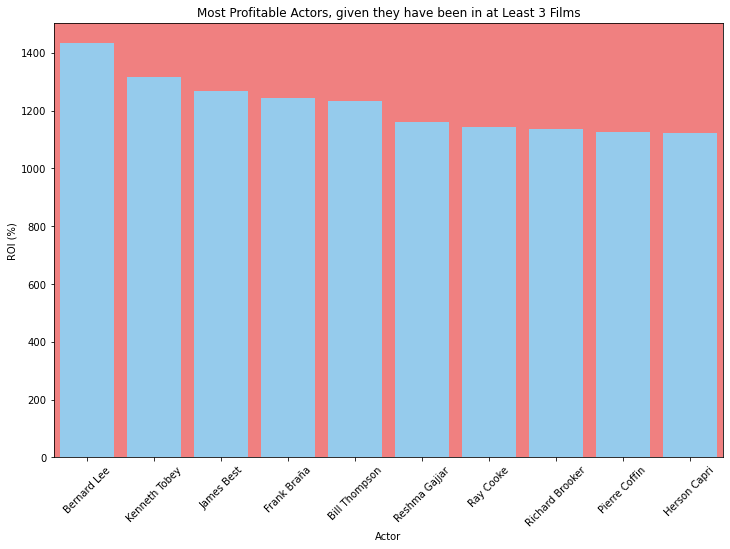

In [155]:
fig, ax = plt.subplots(figsize = (12,8));
ax = sns.barplot(data = actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10), x= actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index
               , y = actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)['roi_mean'], color = 'lightskyblue');

labels = [x[6:].replace('_', ' ') for x in actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index]

ax.set_title(f'Most Profitable Actors, given they have been in at Least {the_film_count} Films');
ax.set_xticklabels(labels, rotation = 45);
ax.set_facecolor('lightcoral');
ax.set_xlabel('Actor');
ax.set_ylabel('ROI (%)');
    

In [156]:
from ipywidgets import interact

In [157]:
@interact
def the_film_count(film_count = 15):

    actors_count = []

    the_film_count = film_count

    testing1 = roi_actors.describe().T

    for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
        if number >= the_film_count:
            actors_count.append([name , roi , number])






    #create a df to be used for making a graph depicting the roi given the number of films an actor has been in
    actors_3_df = pd.DataFrame(actors_count , columns = ['actor', 'roi_mean', 'count'])
    actors_3_df.index = actors_3_df.actor
    actors_3_df.index.name = None
    actors_3_df.drop('actor', inplace = True, axis = 1)
    actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)






    fig, ax = plt.subplots(figsize = (12,8));
    ax = sns.barplot(data = actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10), x= actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index
                   , y = actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)['roi_mean'], color = 'lightcoral');

    labels = [x[6:].replace('_', ' ') for x in actors_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index]

    ax.set_title(f'Most Profitable Actors, given they have been in at Least {the_film_count} Films');
    ax.set_xticklabels(labels, rotation = 45);
    ax.set_facecolor('lightskyblue');
    ax.set_xlabel('Actor');
    ax.set_ylabel('ROI (%)');



interactive(children=(IntSlider(value=15, description='film_count', max=45, min=-15), Output()), _dom_classes=…

In [158]:
#add the actors columns to the data

data[[x for x in actors.columns]] = actors[[x for x in actors.columns]]
data.shape

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


(9537, 13274)

<b>Directors</b>

In [165]:
data.reset_index(drop = True, inplace = True)

In [166]:
directors = pd.DataFrame()

In [167]:
for index ,movie in tqdm(enumerate(data.directors)):
    try:
        for director in movie[1:-1].replace("'",'').replace('"','').split(','):
            data.loc[index, f'{director.strip()}'] = 1
    except:
        print(data.directors[index], index, )
        continue
    

data

0it [00:00, ?it/s]/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
9537it [1:30:26,  1.76it/s]


,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,Director_Owen Egerton,Director_Salvador Simó,Director_Gene Stupnitsky,Director_Ben Hernandez Bray,Director_Marcelo Martinessi,Director_Alex Kendrick,Director_Diego Kaplan,Director_Martin J Pickering,Director_Makoto Shinkai,Director_Rémi St-Michel
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"[Drama, History, Romance]",1963-06-12,248.0,7.0,438,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20367.0,tt0037638,Detour,16172,30000.0,"[Crime, Drama]",1945-11-30,67.0,7.2,201,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"[Drama, History, Romance]",1951-11-08,171.0,7.0,246,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"[Animation, Family, Adventure, Science Fiction]",2001-06-02,95.0,6.9,3494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"[Drama, Mystery]",2001-09-07,101.0,6.5,319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,[Comedy],2020-02-14,100.0,4.1,289,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
9533,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,[Horror],2019-08-09,79.0,2.8,220,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
9534,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"[Animation, Drama, Family]",2019-10-14,112.0,7.4,16277,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
9535,NaN,tt9779516,I Still Believe,9868521,12000000.0,"[Biography, Drama, Music]",2020-03-19,116.0,6.3,6196,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [170]:
directors_roi = data[[x for x in data.columns if ('Director' in x) or ('DIRECTOR' in x)]].copy()

In [171]:
for x in directors_roi.columns:
    directors_roi[x] = directors_roi[x] * data['ROI']

In [172]:
directors_roi.describe().loc['mean'].sort_values(ascending = False).head(30)

Director_James Sbardellati           2508.150985
Director_Philip Charles MacKenzie    2492.547556
Director_Loveleen Tandan             2419.403627
Director_Fernando Di Leo             2400.000000
Director_Stephen Verona              2400.000000
Director_Max Baer Jr.                2354.545455
Director_Gene Fowler Jr.             2339.024390
Director_Alvin Greenman              2280.952381
Director_Yograj Bhat                 2263.636364
Director_H. Gordon Boos              2208.842750
Director_André Ernotte               2186.597611
Director_Yoon Young-woo              2166.934577
Director_Gary Wheeler                2159.670567
Director_Kevin Peeples               2159.670567
Director_Scotty Curlee               2159.670567
Director_Tommy Chong                 2118.212200
Director_Lou Adler                   2118.212200
Director_Bob Godfrey                 2096.369286
Director_Radu Mihaileanu             2039.131727
Director_Pascal Laugier              2019.463438
Director_Stiles Whit

In [173]:
#needs to look and see if they have done at least 3 films
directors_count_3 = []

the_film_count = 12

testing1 = directors_roi.describe().T

for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
    if number >= the_film_count:
        print([name , roi , number])
        directors_count_3.append([name , roi , number])
    

    

['Director_Tim Burton', 239.27640641826034, 18.0]
['Director_Neil Jordan', 122.01584617141164, 12.0]
['Director_Barry Levinson', 190.68467955537042, 21.0]
['Director_Tony Scott', 321.5162994009649, 12.0]
['Director_Roman Polanski', 47.16601718778102, 12.0]
['Director_Oliver Stone', 210.11671145181907, 20.0]
['Director_Kenneth Branagh', 160.11827094666367, 21.0]
['Director_Joel Schumacher', 203.4413711608, 19.0]
['Director_Woody Allen', 152.82663454604096, 47.0]
['Director_Mike Mitchell', 180.7695510444015, 13.0]
['Director_Sydney Pollack', 161.41627210140248, 15.0]
['Director_Steven Spielberg', 498.4121629327511, 23.0]
['Director_Sam Raimi', 150.29757272445445, 15.0]
['Director_John Landis', 136.4209264445441, 14.0]
['Director_Guillermo del Toro', 174.0656927205933, 16.0]
['Director_Rob Reiner', 97.51970385721526, 17.0]
['Director_Anne Fletcher', 330.0114669253285, 20.0]
['Director_Peter Jackson', 347.05758954221716, 13.0]
['Director_Terry Gilliam', 168.35865933027281, 14.0]
['Director

In [174]:
director_3_df = pd.DataFrame(directors_count_3 , columns = ['director', 'roi_mean', 'count'])
director_3_df.index = director_3_df.director
director_3_df.index.name = None
director_3_df.drop('director', inplace = True, axis = 1)
director_3_df.sort_values(by = 'roi_mean', ascending = False).head(11)

,roi_mean,count
Director_Steven Spielberg,498.412163,23.0
Director_Robert Zemeckis,356.292955,15.0
Director_Peter Jackson,347.057590,13.0
Director_Anne Fletcher,330.011467,20.0
Director_Tony Scott,321.516299,12.0
Director_Tyler Perry,309.504218,12.0
Director_Richard Donner,307.927224,15.0
Director_Paul Feig,303.115676,12.0
Director_Steven Brill,293.189362,13.0
Director_Ethan Coen,270.455398,14.0


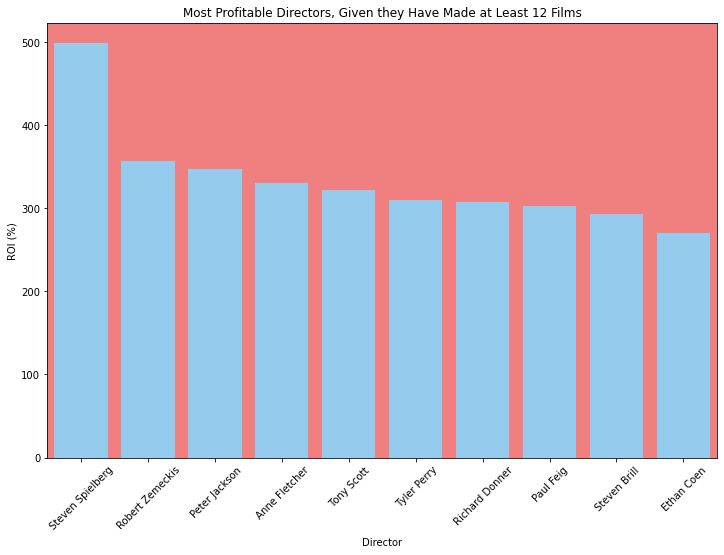

In [175]:
fig, ax = plt.subplots(figsize = (12,8));
ax = sns.barplot(data = director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10), x= director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index
               , y = director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)['roi_mean'], color = 'lightskyblue');

labels = [x[8:].replace('_', ' ') for x in director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index]

ax.set_title(f'Most Profitable Directors, Given they Have Made at Least {the_film_count} Films');
ax.set_xticklabels(labels, rotation = 45);
ax.set_facecolor('lightcoral');
ax.set_xlabel('Director');
ax.set_ylabel('ROI (%)');
    

In [176]:
from ipywidgets import interact

In [177]:
#putting the last three together plus the graph for the interaction


@interact
def the_film_count(film_count = 10):

    directors_count_3 = []
    testing1 = directors_roi.describe().T

    for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
        if number >= film_count:
            directors_count_3.append([name , roi , number])





    director_3_df = pd.DataFrame(directors_count_3 , columns = ['director', 'roi_mean', 'count'])
    director_3_df.index = director_3_df.director
    director_3_df.index.name = None
    director_3_df.drop('director', inplace = True, axis = 1)







    fig, ax = plt.subplots(figsize = (12,8));
    ax = sns.barplot(data = director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10), x= director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index
                   , y = director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10)['roi_mean'], color = 'lightskyblue');

    labels = [x[8:].replace('_', ' ') for x in director_3_df.sort_values(by = 'roi_mean', ascending = False).head(10).index]

    ax.set_title(f'Most Profitable Directors, Given they Have Made at Least {film_count} Films');
    ax.set_xticklabels(labels, rotation = 45);
    ax.set_facecolor('lightcoral');
    ax.set_xlabel('Director');
    ax.set_ylabel('ROI (%)');
    

interactive(children=(IntSlider(value=10, description='film_count', max=30, min=-10), Output()), _dom_classes=…

Each director has thier own style, can we see a certain style of film that crops up at the top of the ROI tree?

<b>Blurb Words Accociated with high ROI </b>

Can we identify a pattern to blurb writing that may promote ROI. A well written blurb could always lure a reader to watch the film, although this is obviously not a main factor, it may still help to increase profits. 

In [178]:
blurb = data.blurb.copy()

In [179]:
data.blurb.isnull().sum()

24

In [180]:
#removing some punctuation before using count vectoriser
blurb = blurb.apply(lambda x: x.replace(',', '').replace('.','') if (pd.isna(x) == False) else x)
blurb.head(10)

0    Determined to hold on to the throne Cleopatra ...
1    Al Roberts a New York nightclub pianist hitchh...
2    Set against the back drop of Rome in crisis Ge...
3    The world's most highly qualified crew of arch...
4    A widowed mother and her son change when a mys...
5    When her father unexpectedly passes away young...
6    Routinely exploited by her wicked stepmother t...
7    The true story of boxer Jim Braddock who in th...
8    To prevent a world war from breaking out famou...
9    Alice an unpretentious and individual 19-year-...
Name: blurb, dtype: object

In [181]:
#count vectoriser wont work on nan values
blurb.fillna('', inplace = True)

In [182]:
#use count vectorizer to count each word that isnt a stopword in the blurb
from sklearn.feature_extraction.text import CountVectorizer

cvec = CountVectorizer(token_pattern = '\w+', stop_words = 'english')
cvec.fit_transform(blurb)

<9537x28142 sparse matrix of type '<class 'numpy.int64'>'
	with 223169 stored elements in Compressed Sparse Row format>

In [183]:
#transform from a sparse matrix to an array
blurb_df = pd.DataFrame(cvec.fit_transform(blurb).toarray(), columns = cvec.get_feature_names())
blurb_df

,0,00,000,006,007,05pm,1,10,100,1000,...,съемная,техники,у,уроки,утра,участвующему,чёрный,ดสาคร,ส,新兵正传
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9533,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9534,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9535,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [184]:
#multiply the number of times a word features in each blurb by the films ROI
blurb_roi = pd.DataFrame()
for x in tqdm(blurb_df.columns):
    blurb_roi[x] = blurb_df[x] * data['ROI']

100%|██████████| 28142/28142 [05:06<00:00, 91.80it/s] 


In [185]:
blurb_roi.describe()

,0,00,000,006,007,05pm,1,10,100,1000,...,съемная,техники,у,уроки,утра,участвующему,чёрный,ดสาคร,ส,新兵正传
count,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,...,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000
mean,-0.010288,0.092396,-0.007286,0.053186,0.179923,-0.002897,0.167474,0.549395,0.418118,0.220693,...,-0.003834,-0.003834,-0.007667,-0.003834,-0.003834,-0.003834,0.013481,-0.006298,-0.006298,0.011115
std,1.004748,6.699834,0.540331,5.193976,9.504450,0.282869,9.170951,15.996663,26.462307,17.432444,...,0.374373,0.374373,0.748746,0.374373,0.374373,0.374373,1.316554,0.615044,0.615044,1.085425
min,-98.121250,-0.000000,-48.353648,-0.000000,-0.000000,-27.624280,-99.655766,-99.535407,-0.000000,-99.456954,...,-36.560350,-36.560350,-73.120700,-36.560350,-36.560350,-36.560350,-0.000000,-60.063694,-60.063694,-0.000000
25%,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,-0.000000,581.818182,-0.000000,507.231093,688.888889,-0.000000,601.615945,575.000000,2467.193782,1656.879611,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,128.571429,-0.000000,-0.000000,106.000000


We get positive words with the largest roi 

In [186]:
blurb_roi.describe().loc['mean'].sort_values(ascending = False)[1:].head(20)

life       27.705313
new        23.533096
family     20.171632
young      19.203182
world      16.392184
man        16.205714
love       14.915343
friends    12.024466
school     11.869668
help       11.705507
old        10.980840
years      10.814751
father     10.724164
t          10.396502
time       10.314552
woman      10.197300
story      10.130807
way         9.914785
home        9.614009
finds       9.556121
Name: mean, dtype: float64

In [187]:
#remove t from the dataframe as that is not a word
roi_top = blurb_roi.describe().loc['mean'].sort_values(ascending = False)[1:].head(51).copy()
roi_top.drop('t', axis = 0, inplace = True)
roi_top

life          27.705313
new           23.533096
family        20.171632
young         19.203182
world         16.392184
man           16.205714
love          14.915343
friends       12.024466
school        11.869668
help          11.705507
old           10.980840
years         10.814751
father        10.724164
time          10.314552
woman         10.197300
story         10.130807
way            9.914785
home           9.614009
finds          9.556121
high           9.510680
soon           9.091871
son            8.927817
girl           8.665008
town           8.398455
war            8.312520
lives          8.178435
year           7.904842
day            7.899108
mother         7.706023
friend         7.522151
make           7.408350
daughter       7.089532
takes          7.072526
wife           7.067156
group          6.921033
film           6.679421
city           6.673946
death          6.663932
american       6.644966
gets           6.637031
team           6.328061
night          6

Names tend to be assiciated with the lowest ROI

In [188]:
blurb_lowest_roi = blurb_roi.describe().loc['mean'].sort_values(ascending = False)[1:].tail(50).sort_values(ascending = True)
blurb_lowest_roi

92            -0.094174
jacques       -0.075129
chi           -0.071262
addict        -0.070213
julián        -0.064954
eun           -0.064460
largest       -0.063102
suitcases     -0.062783
tulse         -0.062783
luper         -0.062783
alyssa        -0.061103
trapper       -0.059162
kenny         -0.058799
kathy         -0.055157
sorts         -0.054293
montreal      -0.053285
1911          -0.052038
vikings       -0.051426
request       -0.051193
outpost       -0.050957
christians    -0.050173
eliza         -0.049740
merivel       -0.049648
vinnie        -0.049190
karma         -0.048567
brenda        -0.048417
costi         -0.048178
mona          -0.047899
jessie        -0.047233
convert       -0.046801
sociopathic   -0.046750
immigrants    -0.046547
despair       -0.046541
eden          -0.046517
che           -0.046317
ukrainian     -0.046157
autistic      -0.046114
pandey        -0.045792
satan         -0.045646
eighteen      -0.045135
ty            -0.044957
w             -0

Instead of a bar char i'm going to do a wordcloud with intesity proportional to the ROI mean of that word

In [189]:
from collections import defaultdict
top_roi_dict = defaultdict(dict)

for index , roi in roi_top.to_frame().itertuples():
    top_roi_dict[index] = roi
top_roi_dict

defaultdict(dict,
            {'life': 27.705313024105763,
             'new': 23.533095609343217,
             'family': 20.17163155066679,
             'young': 19.203182036515322,
             'world': 16.392183542850344,
             'man': 16.205713554309526,
             'love': 14.915343482825437,
             'friends': 12.024466330699791,
             'school': 11.869667570297871,
             'help': 11.7055065750252,
             'old': 10.980839723661894,
             'years': 10.814750587374894,
             'father': 10.724163580509021,
             'time': 10.314551794642751,
             'woman': 10.197300183559559,
             'story': 10.13080701825128,
             'way': 9.91478527059602,
             'home': 9.61400945609586,
             'finds': 9.55612109358621,
             'high': 9.510679659570465,
             'soon': 9.091870576720906,
             'son': 8.927817228135845,
             'girl': 8.665007841745753,
             'town': 8.398455249679818,
   

In [190]:
from collections import defaultdict
low_roi_dict = defaultdict(dict)

for index , roi in blurb_lowest_roi.to_frame().itertuples():
    low_roi_dict[index] = roi
low_roi_dict

defaultdict(dict,
            {'92': -0.09417411135577226,
             'jacques': -0.07512874336343939,
             'chi': -0.0712620038449433,
             'addict': -0.0702129684449101,
             'julián': -0.0649535787670918,
             'eun': -0.06446031246723288,
             'largest': -0.06310234913985176,
             'suitcases': -0.06278274090384817,
             'tulse': -0.06278274090384817,
             'luper': -0.06278274090384817,
             'alyssa': -0.06110339100346021,
             'trapper': -0.05916183754741957,
             'kenny': -0.05879922377763822,
             'kathy': -0.05515690684974736,
             'sorts': -0.054293496561648086,
             'montreal': -0.05328519150976593,
             '1911': -0.05203792533174886,
             'vikings': -0.05142633934308032,
             'request': -0.051193402006993544,
             'outpost': -0.050957018674968504,
             'christians': -0.05017285921120461,
             'eliza': -0.04974021510208

Lets remove 'w' and 'ty' as they are not words

In [191]:
del low_roi_dict['ty']
del low_roi_dict['w']

In [192]:
from wordcloud import WordCloud

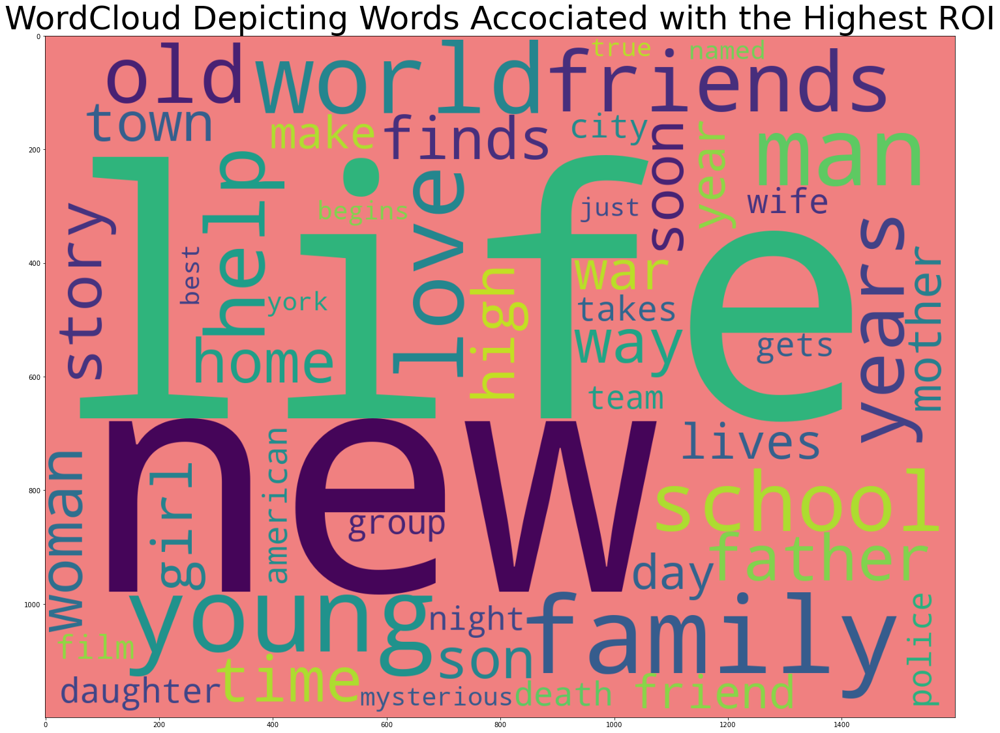

In [193]:
w = WordCloud(width = 1600 , height = 1200, background_color = 'lightcoral').fit_words(top_roi_dict)
plt.figure(figsize = (25,25));
plt.imshow(w);
plt.title('WordCloud Depicting Words Accociated with the Highest ROI', fontsize = 50);

We find that for high ROI films the blurb tends to contain heartwarming words such as life, family, freinds. One could argue that these are generic words for storys, but they also make you think of films such as 'up' or 'home alone'. We can also see that death makes an appearance. Again, a lot of stories contain death so this may not shock you, but we could infer containing death is more likely to be profitable.

This word cloud may also suggest that films about peoples lives, true storys, may be more gripping for an audience. 

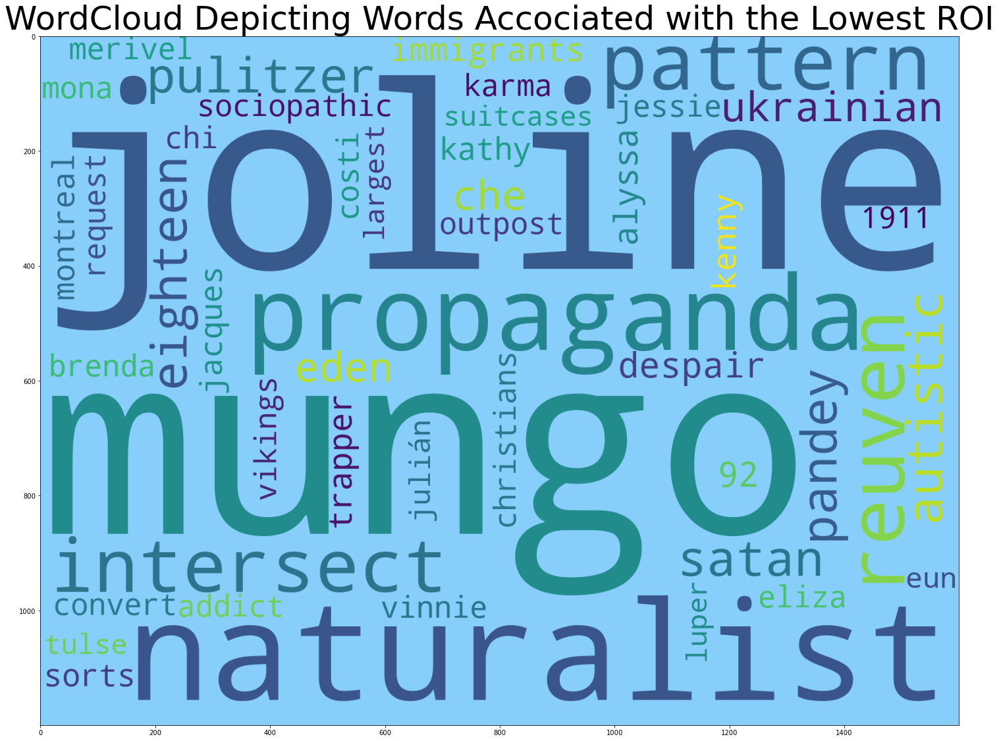

In [194]:
w = WordCloud(width = 1600 , height = 1200, background_color = 'lightskyblue').fit_words(low_roi_dict)
plt.figure(figsize = (25,25));
plt.imshow(w);
plt.title('WordCloud Depicting Words Accociated with the Lowest ROI', fontsize = 50);

On the flip side we learn that low ROI films are likely to contain names

puting the words that accociate with high roi into the dataframe for the ml model, since low roi words actually had very low means equating to very low impact in thier own.

In [195]:
roi_top = blurb_roi.describe().loc['mean'].sort_values(ascending = False)[1:].head(100).copy()
roi_top.drop('t', axis = 0, inplace = True)
roi_top

life            27.705313
new             23.533096
family          20.171632
young           19.203182
world           16.392184
                  ...    
relationship     4.068119
killer           4.034785
big              4.023365
little           3.999401
left             3.991980
Name: mean, Length: 99, dtype: float64

In [196]:
#a peice of code that runs through the blurbs and identifies one of the top words for roi in a split list of the words

data.blurb = data.blurb.replace(np.nan , '')

for number ,x in tqdm(enumerate(data.blurb)):
    for word in roi_top.index:
        if word in x.replace(',', '').replace('.','').lower().split():
            data.loc[number , f'BLURB_{word}'] = 1
            

data[[x for x in data.columns if 'BLURB' in x]] = data[[x for x in data.columns if 'BLURB' in x]].replace(np.nan,0)
data[[x for x in data.columns if 'BLURB' in x]]

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
0it [00:00, ?it/s]/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

,BLURB_new,BLURB_woman,BLURB_takes,BLURB_police,BLURB_york,BLURB_girlfriend,BLURB_love,BLURB_city,BLURB_falls,BLURB_save,...,BLURB_face,BLURB_left,BLURB_live,BLURB_earth,BLURB_past,BLURB_begins,BLURB_couple,BLURB_small,BLURB_come,BLURB_wants
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9533,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9534,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9535,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<b> Composer vs ROI </b>

A films score is incredibly important when trying to convey emotions in films, but whose scores attract the most watchers and increase profits the most?

In [197]:
#create the columns
for index ,movie in tqdm(enumerate(data.composer)):
    try:
        for composer in movie[1:-1].replace("'",'').replace('"','').split(','):
            print(composer.strip())
            data.loc[index, f'{composer.strip()}'] = 1
    except:
        print(data.composer[index], index)
        continue
    

data

0it [00:00, ?it/s]/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


COMPOSER_Alex North


/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
1it [00:01,  1.42s/it]

COMPOSER_Leo Erdody


2it [00:02,  1.31s/it]

COMPOSER_Miklós Rózsa


3it [00:03,  1.24s/it]

COMPOSER_James Newton Howard


4it [00:04,  1.20s/it]

COMPOSER_Mychael Danna


5it [00:05,  1.18s/it]

COMPOSER_Patrick Doyle


6it [00:06,  1.16s/it]

COMPOSER_Christophe Beck


7it [00:08,  1.14s/it]

COMPOSER_Thomas Newman


8it [00:09,  1.13s/it]

COMPOSER_Trevor Jones


9it [00:10,  1.15s/it]

COMPOSER_Danny Elfman


10it [00:11,  1.30s/it]

COMPOSER_Henry Jackman


11it [00:13,  1.37s/it]

COMPOSER_Robert Israel


12it [00:14,  1.35s/it]

COMPOSER_Nick Cave
COMPOSER_Warren Ellis


13it [00:17,  1.89s/it]

COMPOSER_John Powell


14it [00:19,  1.79s/it]

COMPOSER_Mark Snow


15it [00:20,  1.64s/it]

COMPOSER_Tim Jones
COMPOSER_Johnny Lee Schell


16it [00:23,  1.93s/it]

COMPOSER_Elliot Goldenthal


17it [00:24,  1.74s/it]

COMPOSER_Paul J. Smith


18it [00:26,  1.62s/it]

COMPOSER_Trevor Jones
COMPOSER_Carl Davis
COMPOSER_Joseph Carl Breil
COMPOSER_Felix Günther


20it [00:30,  1.76s/it]

nan 20
COMPOSER_Hans Zimmer


22it [00:31,  1.43s/it]

COMPOSER_Hans Zimmer
COMPOSER_Bruce Broughton


24it [00:32,  1.21s/it]

COMPOSER_Michael Tavera


25it [00:34,  1.28s/it]

COMPOSER_Miklós Rózsa
COMPOSER_James Newton Howard
COMPOSER_Harold Faltermeyer


28it [00:35,  1.05s/it]

COMPOSER_Moritz Freise
COMPOSER_Biber Gullatz
COMPOSER_Andreas Schäfer


29it [00:40,  2.04s/it]

COMPOSER_Irwin Kostal


30it [00:41,  1.86s/it]

COMPOSER_Ryan Otter


31it [00:43,  1.76s/it]

COMPOSER_Guy Moon


32it [00:44,  1.70s/it]

COMPOSER_Alexandre Desplat


33it [00:46,  1.62s/it]

COMPOSER_Bruce Broughton
COMPOSER_William Ross


35it [00:47,  1.35s/it]

COMPOSER_David Shire


36it [00:49,  1.37s/it]

COMPOSER_John Williams


37it [00:50,  1.39s/it]

COMPOSER_Richard Harvey


38it [00:52,  1.42s/it]

COMPOSER_Joe Renzetti


39it [00:53,  1.44s/it]

COMPOSER_Bill Conti


40it [00:55,  1.49s/it]

COMPOSER_Edward H. Plumb
COMPOSER_Paul J. Smith
COMPOSER_Oliver Wallace


41it [00:58,  1.90s/it]

nan 41
COMPOSER_Andy Garfield


43it [00:59,  1.55s/it]

COMPOSER_Randy Edelman


44it [01:00,  1.53s/it]

COMPOSER_Trevor Jones
COMPOSER_Paul J. Smith
COMPOSER_Christian Henson


46it [01:02,  1.29s/it]

COMPOSER_Michael Andrews


47it [01:03,  1.34s/it]

COMPOSER_Stephen Trask


48it [01:05,  1.37s/it]

COMPOSER_Aaron Zigman
COMPOSER_Dean Landon


49it [01:08,  1.87s/it]

COMPOSER_Aaron Zigman
nan 50
COMPOSER_Marcus Miller


52it [01:09,  1.46s/it]

nan 52
COMPOSER_Carter Burwell


54it [01:11,  1.25s/it]

COMPOSER_Ralph Sall


55it [01:12,  1.35s/it]

COMPOSER_Marc Shaiman
COMPOSER_Jason White


56it [01:15,  1.80s/it]

COMPOSER_Latham Gaines
COMPOSER_Shelby Gaines


57it [01:18,  2.11s/it]

COMPOSER_Charles Chaplin


58it [01:20,  1.89s/it]

COMPOSER_James Horner


59it [01:21,  1.74s/it]

COMPOSER_Bill Conti
COMPOSER_Electric Wave Bureau


61it [01:22,  1.43s/it]

COMPOSER_Bruce Broughton
COMPOSER_Bob Dylan


63it [01:24,  1.21s/it]

COMPOSER_Randy Edelman
COMPOSER_Rupert Gregson-Williams


65it [01:25,  1.06s/it]

COMPOSER_Paul Intson


66it [01:27,  1.15s/it]

COMPOSER_Heitor Pereira


67it [01:28,  1.23s/it]

COMPOSER_Armand Amar


68it [01:29,  1.28s/it]

COMPOSER_Paul Haslinger


69it [01:31,  1.32s/it]

COMPOSER_Michael Kamen


70it [01:32,  1.35s/it]

COMPOSER_James Horner
COMPOSER_Ennio Morricone


72it [01:34,  1.16s/it]

COMPOSER_András Hamary
COMPOSER_Sigmund Romberg


73it [01:37,  1.70s/it]

nan 73
COMPOSER_Waddy Wachtel


75it [01:38,  1.42s/it]

COMPOSER_Ludwig Göransson


76it [01:40,  1.43s/it]

COMPOSER_Edward Shearmur


77it [01:41,  1.46s/it]

COMPOSER_Rachel Portman


78it [01:43,  1.46s/it]

COMPOSER_Jeff Rona


79it [01:44,  1.39s/it]

COMPOSER_Jonny Greenwood


80it [01:45,  1.34s/it]

COMPOSER_David Newman


81it [01:46,  1.32s/it]

COMPOSER_John Williams
nan 82
COMPOSER_Joseph Trapanese


84it [01:47,  1.05s/it]

COMPOSER_George Bruns


85it [01:49,  1.10s/it]

COMPOSER_Marc Streitenfeld


86it [01:50,  1.13s/it]

COMPOSER_Michael Kamen
COMPOSER_Hummie Mann


88it [01:51,  1.03it/s]

COMPOSER_Marc Shaiman
COMPOSER_Danny Elfman
nan 90
COMPOSER_Steve Jablonsky


92it [01:52,  1.30it/s]

COMPOSER_Plan 9


93it [01:53,  1.11it/s]

COMPOSER_Michael Giacchino


94it [01:55,  1.01it/s]

COMPOSER_Alan Silvestri


95it [01:56,  1.05s/it]

COMPOSER_Alan Menken


96it [01:57,  1.09s/it]

COMPOSER_Alfred Newman


97it [01:58,  1.12s/it]

COMPOSER_Carl Davis
COMPOSER_Don Hulette


98it [01:59,  1.14s/it]

COMPOSER_Victor Young


99it [02:01,  1.17s/it]

COMPOSER_Max Steiner


100it [02:02,  1.20s/it]

COMPOSER_Jack Nitzsche


101it [02:03,  1.21s/it]

COMPOSER_David Wittman


102it [02:05,  1.25s/it]

nan 102
COMPOSER_Elmer Bernstein


104it [02:06,  1.06s/it]

COMPOSER_Reg Powell


105it [02:07,  1.14s/it]

COMPOSER_Daniel Figueiredo


106it [02:08,  1.16s/it]

COMPOSER_Yuriy Poteenko
COMPOSER_Konstantin Shevelyov


107it [02:11,  1.58s/it]

COMPOSER_Henry Jackman
COMPOSER_Nile Rodgers


109it [02:12,  1.30s/it]

COMPOSER_Alan Silvestri
COMPOSER_Henry Jackman
COMPOSER_Mark Isham


112it [02:13,  1.03s/it]

COMPOSER_James Newton Howard
COMPOSER_Steve Jablonsky
COMPOSER_Nathan Whitehead


114it [02:15,  1.11it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_James Newton Howard
COMPOSER_Alan Howarth


117it [02:16,  1.32it/s]

COMPOSER_Alan Howarth
COMPOSER_Alan Howarth
COMPOSER_Paul Rabjohns


119it [02:17,  1.39it/s]

COMPOSER_Alan Silvestri
COMPOSER_Oliver Wallace
COMPOSER_James Newton Howard
COMPOSER_Erich Wolfgang Korngold


123it [02:18,  1.63it/s]

COMPOSER_John Williams
COMPOSER_Andrew Dickson


125it [02:20,  1.47it/s]

COMPOSER_John Paesano


126it [02:22,  1.07it/s]

COMPOSER_Trevor Rabin


127it [02:23,  1.11s/it]

COMPOSER_Mortimer Wilson


128it [02:25,  1.25s/it]

COMPOSER_James Horner
COMPOSER_Danny Elfman
COMPOSER_Henry Jackman
COMPOSER_Matthew Margeson


131it [02:26,  1.02s/it]

COMPOSER_Sylvester Levay


132it [02:28,  1.17s/it]

COMPOSER_Alan Silvestri
COMPOSER_Matthew Margeson
COMPOSER_Atli Örvarsson


135it [02:29,  1.03it/s]

COMPOSER_Charles Chaplin
COMPOSER_William P. Perry
COMPOSER_Carli Elinor


136it [02:32,  1.61s/it]

COMPOSER_George Fenton


137it [02:34,  1.58s/it]

COMPOSER_John Williams
COMPOSER_tomandandy


139it [02:35,  1.33s/it]

COMPOSER_Bruce Broughton
COMPOSER_Terence Blanchard


141it [02:37,  1.14s/it]

COMPOSER_Paul Haslinger
COMPOSER_David Mansfield


143it [02:38,  1.02it/s]

nan 143
COMPOSER_Christophe Beck
COMPOSER_Cyril J. Mockridge


146it [02:39,  1.23it/s]

nan 146
COMPOSER_Leigh Harline


148it [02:41,  1.33it/s]

COMPOSER_Michael Kamen
COMPOSER_Robert John Lange


149it [02:42,  1.13it/s]

COMPOSER_Carl Davis
COMPOSER_Ramin Djawadi


151it [02:43,  1.25it/s]

COMPOSER_Danny Elfman
COMPOSER_Craig Armstrong


153it [02:44,  1.36it/s]

COMPOSER_John Debney


154it [02:45,  1.13it/s]

COMPOSER_Joseph Trapanese
COMPOSER_Andrew M. Edwards


155it [02:46,  1.03it/s]

COMPOSER_Christophe Beck
COMPOSER_Peter Golub


157it [02:48,  1.17it/s]

COMPOSER_James Newton Howard
COMPOSER_Trevor Rabin
nan 158
COMPOSER_Don Cherry
COMPOSER_Ronald Frangipane
COMPOSER_Alejandro Jodorowsky


160it [02:51,  1.06it/s]

COMPOSER_Nathan Barr


161it [02:52,  1.01s/it]

COMPOSER_Toshiyuki Honda


162it [02:53,  1.06s/it]

COMPOSER_James Duhamel
COMPOSER_Sandro Forte
COMPOSER_Gottfried Huppertz
COMPOSER_Abel Korzeniowski
COMPOSER_Giorgio Moroder
COMPOSER_Peter Osborne
COMPOSER_Bernd Schultheis
COMPOSER_Benjamin Speed


163it [03:03,  3.65s/it]

COMPOSER_Dickon Hinchliffe


164it [03:04,  2.92s/it]

COMPOSER_Bruce Broughton
COMPOSER_John Barry


166it [03:06,  2.22s/it]

nan 166
COMPOSER_Roque Baños


168it [03:07,  1.74s/it]

COMPOSER_Roque Baños
COMPOSER_Alex Martinez


169it [03:08,  1.59s/it]

COMPOSER_Sol Kaplan


170it [03:09,  1.47s/it]

nan 170
COMPOSER_Daniel Pemberton


172it [03:10,  1.21s/it]

COMPOSER_Page Hamilton


173it [03:12,  1.23s/it]

COMPOSER_Transcenders


174it [03:13,  1.22s/it]

COMPOSER_Edward Shearmur
COMPOSER_Carter Burwell
COMPOSER_Benjamin Wallfisch


177it [03:14,  1.03it/s]

COMPOSER_Benjamin Wallfisch
COMPOSER_Henry Jackman
COMPOSER_Disasterpeace


180it [03:15,  1.24it/s]

COMPOSER_Rupert Gregson-Williams
COMPOSER_Marc Shaiman
COMPOSER_Michael Bearden


183it [03:17,  1.43it/s]

COMPOSER_Christophe Beck
COMPOSER_Thomas Newman
COMPOSER_Marco Beltrami
COMPOSER_Marcus Trumpp


186it [03:19,  1.36it/s]

COMPOSER_James Newton Howard
COMPOSER_Rob Simonsen


188it [03:20,  1.44it/s]

COMPOSER_Christophe Beck
COMPOSER_Nick Urata


189it [03:22,  1.18it/s]

nan 189
COMPOSER_Jon Brion


191it [03:23,  1.29it/s]

COMPOSER_Benjamin Esdraffo


192it [03:24,  1.09it/s]

COMPOSER_Craig Armstrong
COMPOSER_Christophe Beck
nan 194
COMPOSER_John Debney
COMPOSER_Hans Zimmer
COMPOSER_Henning Lohner
COMPOSER_Martin Tillman


198it [03:26,  1.31it/s]

COMPOSER_Howard Shore


199it [03:28,  1.12it/s]

COMPOSER_Daniel Lopatin
COMPOSER_Brian Reitzell


200it [03:30,  1.33s/it]

COMPOSER_Burkhard von Dallwitz


201it [03:31,  1.30s/it]

COMPOSER_Michael Wandmacher


202it [03:32,  1.29s/it]

COMPOSER_Paul Haslinger
COMPOSER_Paul Haslinger
COMPOSER_Marco Beltrami
COMPOSER_Paul Haslinger
COMPOSER_Shane Carruth


207it [03:34,  1.02it/s]

COMPOSER_George Fenton
COMPOSER_George S. Clinton


209it [03:35,  1.15it/s]

nan 209
COMPOSER_Les Baxter


211it [03:36,  1.26it/s]

nan 211
COMPOSER_Tyler Bates


213it [03:37,  1.35it/s]

COMPOSER_James Horner
COMPOSER_James Horner
COMPOSER_Mark Isham
nan 216
COMPOSER_Craig Armstrong
COMPOSER_Vivek Maddala
COMPOSER_William Axt


219it [03:40,  1.55it/s]

COMPOSER_Theodore Shapiro


220it [03:41,  1.23it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Elliot Goldenthal
COMPOSER_Stomu Yamashta


223it [03:42,  1.44it/s]

COMPOSER_William Axt
COMPOSER_George Fenton
COMPOSER_Maxime Desprez
COMPOSER_Michaël Tordjman


226it [03:45,  1.36it/s]

COMPOSER_Michel Legrand


227it [03:46,  1.13it/s]

nan 227
nan 228
COMPOSER_Jonathan Sheffer


230it [03:47,  1.36it/s]

COMPOSER_Frank Tours


231it [03:49,  1.12it/s]

COMPOSER_Adrian Younge


232it [03:50,  1.01it/s]

nan 232
COMPOSER_Alan Silvestri
COMPOSER_Marco Beltrami
COMPOSER_Basil Poledouris


236it [03:51,  1.26it/s]

COMPOSER_Daniel Pemberton
COMPOSER_Mike Patton


238it [03:52,  1.33it/s]

COMPOSER_Max Steiner
COMPOSER_Christopher Young


240it [03:54,  1.37it/s]

COMPOSER_Nick Glennie-Smith


241it [03:55,  1.10it/s]

COMPOSER_J. Peter Robinson


242it [03:56,  1.02s/it]

COMPOSER_Michael Penn


243it [03:58,  1.07s/it]

COMPOSER_Alan Silvestri
COMPOSER_Mark Isham
COMPOSER_Andrew Lockington


246it [03:59,  1.15it/s]

nan 246
COMPOSER_Jerry Goldsmith


248it [04:00,  1.27it/s]

COMPOSER_John Williams
COMPOSER_Malcolm Arnold


250it [04:01,  1.36it/s]

nan 250
COMPOSER_Adolph Deutsch
COMPOSER_Conrad Salinger


252it [04:04,  1.14it/s]

COMPOSER_Stan Ridgway


253it [04:05,  1.02it/s]

COMPOSER_George Blondheim


254it [04:06,  1.04s/it]

COMPOSER_Simon Goldenberg
COMPOSER_Geoff MacCormack


255it [04:08,  1.46s/it]

COMPOSER_Henry Jackman
COMPOSER_Sam Perry
COMPOSER_Heinz Roemheld


257it [04:11,  1.40s/it]

COMPOSER_Donald Fagen


258it [04:12,  1.38s/it]

COMPOSER_Carter Burwell
COMPOSER_Leslie Bricusse


260it [04:14,  1.16s/it]

COMPOSER_Jerry Goldsmith
COMPOSER_Randy Edelman
COMPOSER_Alan Silvestri
COMPOSER_Hugo Riesenfeld


264it [04:15,  1.10it/s]

nan 264
COMPOSER_Howard Goodall


266it [04:16,  1.20it/s]

COMPOSER_Hans Zimmer
COMPOSER_George Fenton
COMPOSER_Georges Auric


269it [04:17,  1.40it/s]

COMPOSER_Henry Mancini


270it [04:19,  1.11it/s]

COMPOSER_Irwin Kostal
COMPOSER_Marc Shaiman
COMPOSER_Fil Eisler


273it [04:20,  1.31it/s]

COMPOSER_Patrick Doyle
COMPOSER_Jonathan Richman


275it [04:21,  1.38it/s]

COMPOSER_George Fenton
COMPOSER_Dale Cornelius


277it [04:23,  1.44it/s]

COMPOSER_Max Richter


278it [04:24,  1.14it/s]

COMPOSER_Philip Sainton


279it [04:25,  1.02s/it]

COMPOSER_Michael Giacchino
COMPOSER_James Newton Howard
COMPOSER_Clint Mansell


282it [04:27,  1.19it/s]

COMPOSER_Christopher Young
COMPOSER_Patrick Doyle
COMPOSER_Alexandre Desplat
COMPOSER_Anton Sanko


286it [04:28,  1.39it/s]

COMPOSER_Thomas Newman
COMPOSER_Éric Serra


288it [04:30,  1.31it/s]

COMPOSER_Hans Zimmer
COMPOSER_Carole King


290it [04:31,  1.36it/s]

COMPOSER_James Newton Howard
nan 291
COMPOSER_Keyvan Kiaras


293it [04:33,  1.55it/s]

COMPOSER_Lorne Balfe


294it [04:34,  1.18it/s]

COMPOSER_Craig Armstrong
COMPOSER_A.R. Rahman


295it [04:35,  1.04it/s]

COMPOSER_Hans Zimmer
COMPOSER_Charles Chaplin
COMPOSER_Tetsuya Takahashi


298it [04:36,  1.26it/s]

COMPOSER_Christopher Gordon


299it [04:38,  1.10it/s]

COMPOSER_Michael Giacchino
COMPOSER_Wojciech Kilar


301it [04:39,  1.22it/s]

COMPOSER_Marco Beltrami
COMPOSER_Ramin Djawadi
nan 303
COMPOSER_Jerry Goldsmith
COMPOSER_Lalo Schifrin


306it [04:40,  1.56it/s]

COMPOSER_Jonathan Sadoff


307it [04:41,  1.19it/s]

COMPOSER_Rob Simonsen
COMPOSER_Elmer Bernstein
COMPOSER_Craig Armstrong
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek


310it [04:44,  1.21it/s]

COMPOSER_Carl Davis
COMPOSER_Franz Waxman


312it [04:45,  1.32it/s]

COMPOSER_Sam Cardon


313it [04:46,  1.13it/s]

COMPOSER_Bernard Herrmann


314it [04:47,  1.02it/s]

COMPOSER_Ramin Djawadi
COMPOSER_Brian Tyler


316it [04:48,  1.16it/s]

COMPOSER_John Debney
COMPOSER_Marcus Miller
COMPOSER_Adolph Deutsch
COMPOSER_Goran Bregovic


320it [04:50,  1.44it/s]

COMPOSER_Carter Burwell
COMPOSER_Calexico


322it [04:51,  1.51it/s]

COMPOSER_Teddy Castellucci


323it [04:52,  1.21it/s]

COMPOSER_David Kitay


324it [04:53,  1.07it/s]

COMPOSER_Lyle Workman


325it [04:54,  1.01s/it]

COMPOSER_Michael Convertino


326it [04:56,  1.07s/it]

COMPOSER_George S. Clinton
COMPOSER_Alexandre Desplat
COMPOSER_Henry Jackman
COMPOSER_Matthew Margeson
COMPOSER_Alexandre Desplat
COMPOSER_Lorne Balfe
COMPOSER_Jerry Goldsmith
COMPOSER_Federico Jusid


333it [04:57,  1.25it/s]

COMPOSER_David Foster


334it [04:58,  1.10it/s]

COMPOSER_Pino Donaggio


335it [04:59,  1.03s/it]

COMPOSER_Garth Stevenson


336it [05:01,  1.11s/it]

nan 336
COMPOSER_Harald Kloser


338it [05:02,  1.03it/s]

COMPOSER_Robert Folk


339it [05:03,  1.07s/it]

COMPOSER_Michael Giacchino
COMPOSER_The Newton Brothers


341it [05:04,  1.07it/s]

COMPOSER_John Debney
COMPOSER_David Schweitzer
COMPOSER_Isobel Waller-Bridge


343it [05:07,  1.02s/it]

COMPOSER_Rachel Portman
COMPOSER_Marc Shaiman
COMPOSER_Peter Bernstein


346it [05:08,  1.20it/s]

COMPOSER_Alex North
COMPOSER_Daniel Bell


348it [05:09,  1.30it/s]

COMPOSER_Mathias Duplessy
COMPOSER_Jigar Saraiya


349it [05:12,  1.25s/it]

COMPOSER_Mario Nascimbene


350it [05:13,  1.27s/it]

COMPOSER_Paul Michael Thomas


351it [05:14,  1.25s/it]

COMPOSER_David Buckley


352it [05:15,  1.24s/it]

nan 352
COMPOSER_John Ottman


354it [05:17,  1.05s/it]

COMPOSER_Charles Maxwell


355it [05:18,  1.10s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Jerry Goldsmith
COMPOSER_Ennio Morricone
COMPOSER_Herbert Grönemeyer


359it [05:19,  1.17it/s]

COMPOSER_William Axt
COMPOSER_Roger Edens


361it [05:20,  1.29it/s]

COMPOSER_Brian Tyler
COMPOSER_Jerry Goldsmith
COMPOSER_Alan Silvestri
COMPOSER_Randy Edelman
COMPOSER_Marc Donahue


366it [05:21,  1.63it/s]

COMPOSER_Ric Markmann


367it [05:23,  1.27it/s]

COMPOSER_Laura Karpman


368it [05:24,  1.08it/s]

COMPOSER_David Julyan


369it [05:25,  1.02s/it]

COMPOSER_Christopher Young
COMPOSER_Hans Zimmer
COMPOSER_Hans Zimmer
COMPOSER_Volker Bertelmann
COMPOSER_Dustin OHalloran


373it [05:27,  1.12it/s]

COMPOSER_Michel Colombier
COMPOSER_Prince


374it [05:30,  1.34s/it]

COMPOSER_Lennie Hayton


375it [05:31,  1.29s/it]

COMPOSER_Paul Misraki


376it [05:32,  1.25s/it]

COMPOSER_Christophe Beck
COMPOSER_Tim Boland


377it [05:33,  1.23s/it]

COMPOSER_Akhenaton


378it [05:35,  1.22s/it]

COMPOSER_Bernard Herrmann
COMPOSER_DJ Kore
COMPOSER_Charlie Nguyen Kim


380it [05:37,  1.22s/it]

COMPOSER_Al Khemya


381it [05:38,  1.21s/it]

COMPOSER_Romaric Laurence
COMPOSER_Maste
COMPOSER_Damien Roques
COMPOSER_Tefa
COMPOSER_Wealstarr


382it [05:44,  2.65s/it]

COMPOSER_DJ Kore
COMPOSER_DJ Skalp


383it [05:45,  2.22s/it]

COMPOSER_Ivor Guest
COMPOSER_Robert Logan


384it [05:48,  2.29s/it]

COMPOSER_Nigel Clarke
COMPOSER_Michael Csányi-Wills


385it [05:50,  2.36s/it]

COMPOSER_Mychael Danna
COMPOSER_Antonio Sanchez


387it [05:52,  1.83s/it]

nan 387
COMPOSER_Trevor Horn


389it [05:53,  1.47s/it]

COMPOSER_Tyler Bates
COMPOSER_Basil Poledouris
COMPOSER_Pino Donaggio
COMPOSER_Pierre Aviat


393it [05:54,  1.13s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Peter Brunelli
COMPOSER_Louis De Francesco
COMPOSER_Arthur Lange
COMPOSER_J.S. Zamecnik


395it [05:59,  1.53s/it]

COMPOSER_Wil Hendricks
COMPOSER_Michael Krassner
COMPOSER_Robin Vining


396it [06:03,  2.17s/it]

COMPOSER_Mark Mancina


397it [06:04,  1.88s/it]

COMPOSER_Roque Baños
COMPOSER_Howard Shore
COMPOSER_Kôji Endô


400it [06:05,  1.44s/it]

COMPOSER_Herman Hand
COMPOSER_Howard Jackson
COMPOSER_Rudolph G. Kopp
COMPOSER_John Leipold


401it [06:10,  2.49s/it]

COMPOSER_Heinz Roemheld
COMPOSER_Benjamin Wallfisch
COMPOSER_James Newton Howard
COMPOSER_John Barry
COMPOSER_Max Steiner
COMPOSER_John Scott


406it [06:11,  1.81s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Thomas Newman
COMPOSER_Joseph Bishara


409it [06:12,  1.39s/it]

COMPOSER_Randy Edelman
COMPOSER_David Arnold


411it [06:14,  1.15s/it]

COMPOSER_John Swihart


412it [06:15,  1.17s/it]

COMPOSER_Aaron Zigman
COMPOSER_Georges Delerue


414it [06:16,  1.00it/s]

COMPOSER_John Leipold
COMPOSER_Elmer Bernstein
COMPOSER_Hans Zimmer
COMPOSER_Edward Shearmur
COMPOSER_Edward Shearmur
COMPOSER_Graham Reynolds


420it [06:17,  1.32it/s]

COMPOSER_Heinz Roemheld
COMPOSER_Henry Mancini
COMPOSER_Daniel Pemberton
COMPOSER_George Fenton
COMPOSER_John Debney
COMPOSER_Germaine Franco


425it [06:18,  1.66it/s]

COMPOSER_James Horner
COMPOSER_Martin Phipps


427it [06:20,  1.67it/s]

COMPOSER_Hans Zimmer
COMPOSER_Daniel Pemberton
COMPOSER_Patrick Doyle
COMPOSER_Howard Jackson
COMPOSER_Joseph Bishara
COMPOSER_Edward Shearmur
COMPOSER_Bernard Herrmann
COMPOSER_Arthur Benjamin


434it [06:21,  2.11it/s]

COMPOSER_Robin Coudert


435it [06:22,  1.44it/s]

COMPOSER_Jay Chattaway


436it [06:23,  1.17it/s]

COMPOSER_James Horner
COMPOSER_Steve Jablonsky
COMPOSER_Steve Jablonsky
COMPOSER_Tobe Hooper
COMPOSER_Jerry Lambert


440it [06:26,  1.28it/s]

COMPOSER_Wayne Bell
COMPOSER_Robert Jacks


441it [06:28,  1.29s/it]

COMPOSER_Danny Elfman
COMPOSER_John Barry
COMPOSER_David Wingo


444it [06:30,  1.04s/it]

nan 444
COMPOSER_Giorgio Moroder
nan 446
COMPOSER_James Horner
COMPOSER_Alexandre Desplat
COMPOSER_Herbert Stothart


450it [06:31,  1.26it/s]

COMPOSER_Rachel Portman
COMPOSER_James Horner
COMPOSER_William Axt
nan 453
COMPOSER_Martin Unterberger


455it [06:32,  1.60it/s]

COMPOSER_Christophe Beck
nan 456
COMPOSER_Herbert Stothart
COMPOSER_Diego Navarro


459it [06:33,  1.90it/s]

COMPOSER_James Ackley
COMPOSER_Art Podell


460it [06:36,  1.07s/it]

COMPOSER_John Powell
COMPOSER_Christopher Spelman


462it [06:37,  1.08it/s]

COMPOSER_Andy Garcia


463it [06:38,  1.01it/s]

COMPOSER_Lisa Coleman
COMPOSER_Wendy Melvoin


464it [06:40,  1.39s/it]

COMPOSER_Brian Tyler
COMPOSER_George Fenton
COMPOSER_Bill Meyers


467it [06:42,  1.12s/it]

COMPOSER_Howard Shore
COMPOSER_Joe Delia


469it [06:43,  1.00it/s]

COMPOSER_Alex Wurman


470it [06:45,  1.13s/it]

COMPOSER_T Bone Burnett


471it [06:46,  1.14s/it]

COMPOSER_David Mansfield
COMPOSER_Frank De Vol


472it [06:47,  1.12s/it]

COMPOSER_Alfred Newman
COMPOSER_Christopher Lennertz


474it [06:48,  1.05it/s]

nan 474
COMPOSER_Dario Marianelli


476it [06:49,  1.20it/s]

COMPOSER_Thomas Newman
COMPOSER_José Nieto


478it [06:50,  1.34it/s]

COMPOSER_Simon Boswell


479it [06:51,  1.18it/s]

COMPOSER_Trevor Jones
COMPOSER_Marc Shaiman
COMPOSER_L. Subramaniam


482it [06:52,  1.42it/s]

COMPOSER_Bronislau Kaper


483it [06:54,  1.19it/s]

COMPOSER_Herbert Stothart
COMPOSER_Vangelis


485it [06:55,  1.30it/s]

COMPOSER_Kevin Manthei


486it [06:56,  1.14it/s]

COMPOSER_Paul Leonard-Morgan


487it [06:57,  1.06it/s]

COMPOSER_James Newton Howard
COMPOSER_Lucas Vidal


489it [06:58,  1.20it/s]

COMPOSER_Steve Jablonsky
nan 490
COMPOSER_Junkie XL


492it [06:59,  1.45it/s]

COMPOSER_George Fenton
COMPOSER_Andrea Guerra


494it [07:00,  1.54it/s]

COMPOSER_Christophe Beck
COMPOSER_Lucas Vidal
COMPOSER_Les Baxter
COMPOSER_Vishal Bhardwaj


498it [07:01,  1.86it/s]

COMPOSER_Randy Edelman
COMPOSER_Randy Edelman
COMPOSER_Klaus Badelt


501it [07:02,  2.05it/s]

COMPOSER_George Harrison


502it [07:04,  1.47it/s]

COMPOSER_Michael Kamen
COMPOSER_Edward Shearmur
nan 503
COMPOSER_Max Steiner
COMPOSER_Steven Price


506it [07:05,  1.78it/s]

COMPOSER_Roy Webb


507it [07:06,  1.38it/s]

nan 507
COMPOSER_Elmer Bernstein
COMPOSER_CJ Vanston


510it [07:07,  1.62it/s]

COMPOSER_Artyom Vasilev


511it [07:08,  1.31it/s]

COMPOSER_Marco Beltrami
COMPOSER_Michael Corcoran
COMPOSER_Eric Goldman
COMPOSER_Robin Tadross


513it [07:11,  1.04s/it]

COMPOSER_Max Steiner
COMPOSER_Michael Brook


515it [07:13,  1.12it/s]

COMPOSER_Alex North
COMPOSER_Howard Blake
COMPOSER_Queen


517it [07:15,  1.04it/s]

COMPOSER_Steven Price
COMPOSER_Junkie XL
COMPOSER_Franz Waxman
COMPOSER_John Williams
COMPOSER_Herbert Stothart
COMPOSER_Christophe Beck
COMPOSER_Nathaniel Shilkret


524it [07:16,  1.38it/s]

COMPOSER_Charles Chaplin
COMPOSER_Ralph Burns
COMPOSER_Billy May


526it [07:18,  1.17it/s]

COMPOSER_Satoshi Takebe


527it [07:19,  1.04it/s]

COMPOSER_Mark Mothersbaugh


528it [07:21,  1.25s/it]

COMPOSER_Stephen Blake Kanicka


529it [07:23,  1.30s/it]

nan 529
COMPOSER_David Sardy


531it [07:24,  1.10s/it]

COMPOSER_Herbert Stothart
COMPOSER_Edward Ward


532it [07:25,  1.15s/it]

COMPOSER_Jerry Goldsmith
COMPOSER_Philip Sheppard


534it [07:27,  1.01it/s]

COMPOSER_Mark Mancina
COMPOSER_Nathan Furst


536it [07:28,  1.14it/s]

COMPOSER_Michael Giacchino
COMPOSER_Mark Mancina
nan 538
COMPOSER_Jerome Kern
COMPOSER_Robert Russell Bennett


540it [07:31,  1.23it/s]

nan 540
COMPOSER_Richard Hageman


542it [07:32,  1.30it/s]

COMPOSER_James Newton Howard
COMPOSER_Angelo Badalamenti


544it [07:33,  1.38it/s]

COMPOSER_John Frizzell


545it [07:34,  1.16it/s]

COMPOSER_Junkie XL
COMPOSER_David Buckley
nan 547
COMPOSER_Marco Beltrami
COMPOSER_Trevor Jones
COMPOSER_Anja Garbarek


551it [07:35,  1.51it/s]

COMPOSER_Jan Hammer


552it [07:37,  1.21it/s]

COMPOSER_Craig Safan


553it [07:38,  1.05it/s]

COMPOSER_Vangelis
COMPOSER_Tom Scott


555it [07:39,  1.17it/s]

COMPOSER_Van Cleave


556it [07:40,  1.04it/s]

COMPOSER_Danny Elfman
COMPOSER_Jim ORourke
COMPOSER_Sonic Youth


558it [07:43,  1.04s/it]

COMPOSER_Roy Budd


559it [07:44,  1.10s/it]

COMPOSER_Marco Beltrami
COMPOSER_Philip Glass


560it [07:45,  1.14s/it]

COMPOSER_Bear McCreary


561it [07:47,  1.17s/it]

COMPOSER_James Newton Howard
COMPOSER_Daniel Pemberton
COMPOSER_James Newton Howard
COMPOSER_John Ottman
COMPOSER_Alex Somers


566it [07:48,  1.12it/s]

COMPOSER_Alexandre Desplat
COMPOSER_James Levine


568it [07:50,  1.00s/it]

COMPOSER_Michio Mamiya


569it [07:52,  1.26s/it]

COMPOSER_Mica Levi


570it [07:53,  1.26s/it]

COMPOSER_Stephen James Taylor


571it [07:54,  1.20s/it]

COMPOSER_Alex Wurman
COMPOSER_Lorne Balfe
COMPOSER_Jeremy Sweet


574it [07:56,  1.06it/s]

COMPOSER_Christopher Young
COMPOSER_Jerry Goldsmith
COMPOSER_Edward Ward
COMPOSER_William Axt
COMPOSER_John Altman
COMPOSER_Gabriel Yared


578it [07:58,  1.22it/s]

COMPOSER_Devonté Hynes


579it [07:59,  1.03it/s]

COMPOSER_Pino Donaggio
nan 580
COMPOSER_Ray Heindorf


582it [08:00,  1.26it/s]

COMPOSER_Roger Kellaway


583it [08:01,  1.13it/s]

COMPOSER_Arthur Honegger
COMPOSER_Maurice Thiriet


584it [08:03,  1.32s/it]

COMPOSER_Alfred Newman
COMPOSER_Ennio Morricone
COMPOSER_Gillo Pontecorvo


586it [08:05,  1.09s/it]

COMPOSER_Alan Silvestri
COMPOSER_Clint Eastwood


588it [08:06,  1.02it/s]

COMPOSER_A.R. Rahman
COMPOSER_Brian Eno
COMPOSER_Jon Hassell
COMPOSER_Daniel Lanois


590it [08:10,  1.33s/it]

COMPOSER_Howard Shore
nan 591
COMPOSER_Hans Zimmer
COMPOSER_John Barry
COMPOSER_Sylvester Levay
COMPOSER_David McHugh


596it [08:12,  1.00it/s]

COMPOSER_Dustin OHalloran
COMPOSER_Alexandre Desplat
COMPOSER_Trevor Rabin
COMPOSER_Roque Baños
COMPOSER_James Newton Howard
COMPOSER_David Newman
COMPOSER_Alfred Newman
COMPOSER_Hubert Bath


604it [08:13,  1.34it/s]

COMPOSER_Edward Ward
COMPOSER_Dimitri Tiomkin


605it [08:14,  1.11it/s]

COMPOSER_Theodore Shapiro
COMPOSER_Lakshman Joseph De Saram


607it [08:16,  1.20it/s]

COMPOSER_Rachel Portman
COMPOSER_Tyler Bates
COMPOSER_Brian Tyler
COMPOSER_Lucas Vidal
COMPOSER_Brian Tyler
COMPOSER_BT


612it [08:17,  1.50it/s]

COMPOSER_Alexander Gerens


613it [08:18,  1.17it/s]

COMPOSER_Brian Tyler
COMPOSER_Brian Tyler
COMPOSER_László Melis


616it [08:19,  1.38it/s]

COMPOSER_Nathan Larson
COMPOSER_Craig Wedren


617it [08:22,  1.27s/it]

COMPOSER_Frederik Wiedmann


618it [08:23,  1.28s/it]

COMPOSER_Jonathan Edwards


619it [08:25,  1.26s/it]

COMPOSER_John Ottman
COMPOSER_James Newton Howard
COMPOSER_Henry Jackman
COMPOSER_Alfred Newman
COMPOSER_Joseph Arthur


624it [08:26,  1.05it/s]

COMPOSER_Bryce Dessner


625it [08:27,  1.04s/it]

COMPOSER_Nick Urata
COMPOSER_Dimitri Tiomkin
COMPOSER_Werner R. Heymann


628it [08:28,  1.17it/s]

COMPOSER_John Ottman
COMPOSER_tomandandy
COMPOSER_Mark Mancina
COMPOSER_Mark Mancina
COMPOSER_James Seymour Brett


633it [08:29,  1.49it/s]

COMPOSER_Graeme Revell


634it [08:31,  1.19it/s]

COMPOSER_Mervyn Warren


635it [08:32,  1.04it/s]

COMPOSER_Marcelo Zarvos


636it [08:33,  1.04s/it]

COMPOSER_Trevor Rabin
COMPOSER_Hugo Friedhofer


638it [08:34,  1.10it/s]

COMPOSER_Joseph Kosma


639it [08:36,  1.00s/it]

COMPOSER_Christophe Beck
COMPOSER_Adolph Deutsch
COMPOSER_Gerard Carbonara


642it [08:37,  1.21it/s]

COMPOSER_Graeme Revell
COMPOSER_John Debney
COMPOSER_Geoff Zanelli


645it [08:38,  1.42it/s]

COMPOSER_Mark Isham
COMPOSER_Lyle Lovett


647it [08:39,  1.48it/s]

COMPOSER_David Snell


648it [08:40,  1.20it/s]

COMPOSER_Edward Ward
nan 648
COMPOSER_Stephen Trask
nan 650
COMPOSER_Takeshi Kobayashi


652it [08:42,  1.49it/s]

nan 652
COMPOSER_Joel P. West


654it [08:43,  1.55it/s]

COMPOSER_Indian Ocean


655it [08:44,  1.23it/s]

COMPOSER_Franz Waxman
COMPOSER_Gopi Sundar


657it [08:45,  1.33it/s]

COMPOSER_Clinton Shorter


658it [08:46,  1.11it/s]

COMPOSER_Jeff Claus
COMPOSER_Judy Hyman


659it [08:49,  1.35s/it]

COMPOSER_Chip Davis


660it [08:50,  1.30s/it]

COMPOSER_Alex Heffes


661it [08:51,  1.27s/it]

COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders


662it [08:52,  1.25s/it]

COMPOSER_John Carey


663it [08:54,  1.23s/it]

COMPOSER_Brian Tyler
COMPOSER_Heitor Pereira
COMPOSER_Hans Zimmer
COMPOSER_John Carpenter
COMPOSER_Shirley Walker


665it [08:56,  1.22s/it]

COMPOSER_Graeme Revell
COMPOSER_Aaron Zigman
COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_Jerry Fielding


669it [08:57,  1.05it/s]

COMPOSER_Charles Chaplin
COMPOSER_Meredith Willson


670it [08:59,  1.04s/it]

COMPOSER_Werner Janssen


671it [09:00,  1.10s/it]

COMPOSER_Frank Skinner


672it [09:01,  1.12s/it]

COMPOSER_Lee Scott
COMPOSER_Pete Yorn


673it [09:03,  1.52s/it]

COMPOSER_Max Richter
COMPOSER_Dario Marianelli
COMPOSER_Nicola Piovani


676it [09:05,  1.18s/it]

COMPOSER_Brian Banks
COMPOSER_Anthony Marinelli


677it [09:07,  1.56s/it]

COMPOSER_Franz Waxman
COMPOSER_Miklós Rózsa
COMPOSER_William Alwyn


680it [09:08,  1.21s/it]

COMPOSER_Rolfe Kent


681it [09:09,  1.21s/it]

nan 681
COMPOSER_Rupert Gregson-Williams
COMPOSER_Pino Donaggio
COMPOSER_Frank Churchill
COMPOSER_Oliver Wallace
COMPOSER_Walter Greene


685it [09:12,  1.03s/it]

COMPOSER_Danny Elfman
COMPOSER_Elmer Bernstein
COMPOSER_George Martin


687it [09:13,  1.10it/s]

COMPOSER_Alfred Newman
COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Shirodkar


689it [09:16,  1.02s/it]

COMPOSER_Thomas Newman
COMPOSER_Rolfe Kent
COMPOSER_Danny Elfman
COMPOSER_Teddy Castellucci
COMPOSER_Carter Burwell
COMPOSER_Pierre van Dormael


695it [09:17,  1.29it/s]

COMPOSER_John Powell
COMPOSER_Rolfe Kent
COMPOSER_Theodore Shapiro
COMPOSER_Aaron Zigman
COMPOSER_Ramin Djawadi
COMPOSER_Michael Kamen
COMPOSER_Mark Isham
COMPOSER_Michael Tavera
COMPOSER_John Powell
COMPOSER_Larry Groupé


705it [09:18,  1.72it/s]

COMPOSER_Max Steiner
COMPOSER_BT
COMPOSER_Franz Waxman
COMPOSER_John Frizzell
COMPOSER_Ry Cooder


710it [09:19,  2.08it/s]

COMPOSER_Peter Harris


711it [09:21,  1.43it/s]

COMPOSER_Roy Webb
COMPOSER_Plínio Profeta


713it [09:22,  1.50it/s]

nan 713
nan 714
COMPOSER_Alex Wurman
COMPOSER_Dick Hyman


717it [09:23,  1.78it/s]

COMPOSER_Miklós Rózsa
COMPOSER_Max Steiner
COMPOSER_Giorgio Moroder
COMPOSER_Trevor Jones
COMPOSER_Junkie XL
COMPOSER_Howard Shore
COMPOSER_David Snell
COMPOSER_Lennie Hayton
COMPOSER_Roger Edens
COMPOSER_Conrad Salinger
COMPOSER_Benny Andersson
COMPOSER_Anne Dudley
COMPOSER_Björn Ulvaeus


726it [09:27,  1.95it/s]

COMPOSER_Roy Webb
COMPOSER_Hans J. Salter


728it [09:28,  1.85it/s]

COMPOSER_John Debney
COMPOSER_Steve Harwell
COMPOSER_Joel McNeely


730it [09:30,  1.33it/s]

COMPOSER_Bill Conti
COMPOSER_Herbert Stothart
COMPOSER_Danny Elfman
COMPOSER_J. Peter Robinson
COMPOSER_Brian May


735it [09:32,  1.68it/s]

COMPOSER_Christopher Farrell


736it [09:33,  1.29it/s]

COMPOSER_Steve Jablonsky
COMPOSER_Jim Dooley


738it [09:34,  1.37it/s]

COMPOSER_Frank Skinner
COMPOSER_Andreas Radzuweit


740it [09:35,  1.40it/s]

COMPOSER_Rolfe Kent
COMPOSER_David Buttolph


742it [09:37,  1.45it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_Jerry Goldsmith
COMPOSER_Trevor Jones
COMPOSER_David A. Stewart


745it [09:38,  1.65it/s]

COMPOSER_Victor Young
COMPOSER_Danny Elfman
COMPOSER_James Newton Howard
COMPOSER_Hans Zimmer
COMPOSER_Elliot Goldenthal
COMPOSER_Danny Elfman
COMPOSER_Junkie XL
COMPOSER_Hans Zimmer
COMPOSER_Elliot Goldenthal
COMPOSER_Kristopher Carter
COMPOSER_Michael McCuistion
COMPOSER_Lolita Ritmanis


753it [09:42,  1.78it/s]

COMPOSER_George Bassman


754it [09:43,  1.32it/s]

COMPOSER_Roger Edens
COMPOSER_George Fenton
nan 755
COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_Graeme Revell
COMPOSER_Graeme Revell
COMPOSER_Noia


760it [09:44,  1.68it/s]

COMPOSER_George Fenton
COMPOSER_Theodore Shapiro
COMPOSER_Basil Poledouris
COMPOSER_Rachel Portman
COMPOSER_Manel Gil-Inglada


765it [09:45,  2.03it/s]

COMPOSER_André Previn


766it [09:47,  1.40it/s]

COMPOSER_Herbert Stothart
COMPOSER_Robert Folk
COMPOSER_Bill Stafford


769it [09:48,  1.60it/s]

COMPOSER_Robert Folk
COMPOSER_Michael Kamen
COMPOSER_Jerry Fielding
COMPOSER_Michel Cusson


773it [09:49,  1.88it/s]

COMPOSER_Clint Mansell
COMPOSER_James Horner
COMPOSER_Sol Kaplan
COMPOSER_John Barry
COMPOSER_Daniele Amfitheatrof
COMPOSER_Johnny Green


778it [09:52,  1.91it/s]

COMPOSER_Michael Kamen
COMPOSER_Mark Isham
COMPOSER_Armand Amar
COMPOSER_Khaled


781it [09:53,  2.04it/s]

COMPOSER_David Newman
COMPOSER_Andrew Gross
COMPOSER_John King


783it [09:55,  1.41it/s]

COMPOSER_Miklós Rózsa
COMPOSER_Hugo Friedhofer
COMPOSER_Jerry Fielding
nan 786
COMPOSER_Quincy Jones III


788it [09:56,  1.75it/s]

COMPOSER_Maurice Jarre


789it [09:58,  1.31it/s]

COMPOSER_James Horner
COMPOSER_David Raksin


791it [09:59,  1.39it/s]

COMPOSER_Artie Kane


792it [10:00,  1.04it/s]

COMPOSER_Jeff Gibbs


793it [10:02,  1.13s/it]

nan 793
COMPOSER_Michael Kamen
nan 795
COMPOSER_Robert Rodriguez


797it [10:03,  1.14it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Shirodkar
COMPOSER_Marius De Vries
COMPOSER_Nellee Hooper


799it [10:05,  1.05it/s]

COMPOSER_Roy Webb
COMPOSER_Matthew Caws
COMPOSER_Niki Reiser


801it [10:08,  1.01s/it]

COMPOSER_Leonard Bernstein


802it [10:09,  1.07s/it]

COMPOSER_Alfred Newman
COMPOSER_James Newton Howard
COMPOSER_John Debney
COMPOSER_Danny Elfman
COMPOSER_David Newman
COMPOSER_George Fenton
COMPOSER_Carmen Dragon


809it [10:10,  1.24it/s]

COMPOSER_Denny Zeitlin


810it [10:11,  1.08it/s]

COMPOSER_John Ottman
COMPOSER_Ry Cooder
COMPOSER_Adolph Deutsch
COMPOSER_Klaus Badelt
COMPOSER_Barry De Vorzon


815it [10:13,  1.38it/s]

COMPOSER_Oliver Dax
COMPOSER_Dominique Gauriaud
COMPOSER_Charles Olins


816it [10:16,  1.61s/it]

COMPOSER_Dong-jun Lee


817it [10:17,  1.50s/it]

COMPOSER_Bernard Herrmann
COMPOSER_John Ottman
COMPOSER_Alexander Rudd


819it [10:19,  1.23s/it]

COMPOSER_Jean-Louis Aubert


820it [10:20,  1.24s/it]

COMPOSER_Christopher Lennertz
COMPOSER_Miklós Rózsa
COMPOSER_Ralph Jones


823it [10:21,  1.01it/s]

COMPOSER_Max Steiner
COMPOSER_Junkie XL
COMPOSER_Graeme Revell
COMPOSER_Atli Örvarsson
COMPOSER_Lyle Workman
COMPOSER_Klaus Badelt
COMPOSER_Johnny Green
COMPOSER_Hans J. Salter
COMPOSER_Daniel Pemberton
COMPOSER_James Horner
COMPOSER_Michael Einziger
COMPOSER_Junkie XL
COMPOSER_Andrew Kawczynski
COMPOSER_Johnny Marr
COMPOSER_Steve Mazzaro
COMPOSER_Pharrell Williams


834it [10:27,  1.16it/s]

COMPOSER_Hans Zimmer
nan 834
COMPOSER_Maurice Jarre
COMPOSER_Michael Kamen
nan 837
COMPOSER_Elmer Bernstein
COMPOSER_Herbert Stothart
COMPOSER_Antoine Duhamel


841it [10:28,  1.53it/s]

COMPOSER_Pierre Adenot


842it [10:30,  1.20it/s]

COMPOSER_Alan Menken
COMPOSER_Alan Menken
COMPOSER_Marco Beltrami
COMPOSER_Brandon Roberts


845it [10:31,  1.40it/s]

COMPOSER_Marcus Trumpp
COMPOSER_Richard Gibbs


846it [10:32,  1.12it/s]

COMPOSER_Ramin Djawadi
nan 847
COMPOSER_Daryl Bennett
COMPOSER_Jim Guttridge


849it [10:35,  1.14it/s]

COMPOSER_Dimitri Tiomkin
nan 850
COMPOSER_James Newton Howard
COMPOSER_Nicholas OToole
COMPOSER_Slash


853it [10:38,  1.22it/s]

COMPOSER_Bernard Herrmann
COMPOSER_Michael Wandmacher
COMPOSER_Empire of the Sun


856it [10:39,  1.42it/s]

COMPOSER_Todd Rundgren


857it [10:40,  1.11it/s]

COMPOSER_Christopher Young
COMPOSER_Alex Heffes
COMPOSER_Dimitri Tiomkin
COMPOSER_Harry Gregson-Williams


861it [10:42,  1.37it/s]

COMPOSER_John Debney
COMPOSER_Miklós Rózsa
COMPOSER_Henry Mancini
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani


865it [10:46,  1.19it/s]

COMPOSER_John Powell
COMPOSER_Danny Elfman
COMPOSER_Roy Webb
COMPOSER_Michael Small


869it [10:47,  1.44it/s]

COMPOSER_George Bassman
COMPOSER_Adolph Deutsch
COMPOSER_Mark Adler


872it [10:49,  1.60it/s]

COMPOSER_Clint Mansell
COMPOSER_Trond Bjerknes


874it [10:50,  1.52it/s]

COMPOSER_Herbert Stothart
COMPOSER_Johnny Mandel


876it [10:52,  1.54it/s]

COMPOSER_Thomas Newman
COMPOSER_Michael Wandmacher
nan 878
COMPOSER_Marcus Miller
COMPOSER_Brent Lewis


881it [10:53,  1.88it/s]

COMPOSER_Guy Farley


882it [10:54,  1.31it/s]

COMPOSER_Hans Zimmer
COMPOSER_Patrick Doyle
COMPOSER_Michael Wandmacher
COMPOSER_Franz Waxman
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Trevor Jones
COMPOSER_David Mansfield
COMPOSER_James Newton Howard
COMPOSER_Theodore Shapiro
COMPOSER_Deborah Lurie


892it [10:55,  1.74it/s]

COMPOSER_Victor Young
COMPOSER_John Morris


894it [10:57,  1.70it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani


895it [10:59,  1.22s/it]

COMPOSER_Charlie Mole


896it [11:01,  1.24s/it]

COMPOSER_David Michael Frank


897it [11:02,  1.24s/it]

nan 897
COMPOSER_Charles Chaplin
COMPOSER_Mark Isham
COMPOSER_Franz Waxman
COMPOSER_Herbert Stothart
COMPOSER_Theodore Shapiro
COMPOSER_Howard Shore
COMPOSER_Bronislau Kaper
COMPOSER_Howie B.
COMPOSER_Ry Cooder
COMPOSER_DJ Shadow


906it [11:04,  1.05it/s]

COMPOSER_John Frizzell
COMPOSER_John Adams


908it [11:06,  1.18it/s]

COMPOSER_Atli Örvarsson
COMPOSER_Alan Silvestri
COMPOSER_Tom Eyen
COMPOSER_Henry Krieger


911it [11:08,  1.18it/s]

COMPOSER_Evgueni Galperine
COMPOSER_Sacha Galperine


912it [11:11,  1.36s/it]

COMPOSER_Dario Marianelli
COMPOSER_Richard Hageman
COMPOSER_Franco Piersanti


915it [11:12,  1.08s/it]

COMPOSER_Michael Giacchino
COMPOSER_Brian Tyler
COMPOSER_Leonard Eto
COMPOSER_Motofumi Yamaguchi


918it [11:14,  1.00s/it]

COMPOSER_David Newman
COMPOSER_Éric Serra
COMPOSER_Alessandro Cicognini


921it [11:16,  1.21it/s]

COMPOSER_Christophe Beck
COMPOSER_Jed Kurzel


923it [11:17,  1.31it/s]

COMPOSER_Temple Abady


924it [11:18,  1.10it/s]

COMPOSER_Lennie Hayton
COMPOSER_Conrad Salinger
COMPOSER_Chris Boardman


926it [11:19,  1.21it/s]

COMPOSER_Dimitri Tiomkin
COMPOSER_Michael Kamen
COMPOSER_David Buttolph
COMPOSER_James Horner
COMPOSER_Marco Beltrami
COMPOSER_John Williams
COMPOSER_John Ottman
COMPOSER_Ken Thorne


934it [11:21,  1.60it/s]

COMPOSER_Ken Thorne
COMPOSER_Max Steiner
COMPOSER_Michael Giacchino
COMPOSER_Justin Hurwitz


938it [11:22,  1.89it/s]

COMPOSER_James Horner
COMPOSER_Basil Poledouris
COMPOSER_Basil Poledouris
COMPOSER_Cliff Duren


942it [11:23,  2.16it/s]

COMPOSER_Dimitri Tiomkin
COMPOSER_Cliff Eidelman


944it [11:24,  1.96it/s]

COMPOSER_Terence Blanchard
COMPOSER_Hans Zimmer
COMPOSER_Rachel Portman
COMPOSER_Stephen Endelman


948it [11:26,  2.21it/s]

COMPOSER_Alex Wurman
COMPOSER_Arthur Kempel


950it [11:27,  1.99it/s]

COMPOSER_James Horner
COMPOSER_Lalo Schifrin
COMPOSER_Charlie Clouser


953it [11:28,  2.09it/s]

COMPOSER_Thomas Newman
COMPOSER_James Horner
COMPOSER_Roy Webb
COMPOSER_Robert Hood Bowers


957it [11:29,  2.34it/s]

COMPOSER_Danny Elfman
COMPOSER_Hans Zimmer
COMPOSER_Paul Buckmaster


960it [11:31,  2.37it/s]

COMPOSER_Christophe Beck
COMPOSER_John Van Tongeren


962it [11:32,  2.09it/s]

COMPOSER_Conrad Salinger
COMPOSER_David Buckley
COMPOSER_Harry Gregson-Williams
COMPOSER_Victor Young
COMPOSER_Victor Young
COMPOSER_Harold Faltermeyer
COMPOSER_Gary Chang


967it [11:33,  2.43it/s]

COMPOSER_Richard Hageman
nan 968
COMPOSER_Richard Addinsell


970it [11:34,  2.44it/s]

COMPOSER_Alan Silvestri
COMPOSER_Georges Delerue
COMPOSER_Peter Gordon


972it [11:36,  2.12it/s]

COMPOSER_Patrick Doyle
COMPOSER_Alfred Newman
COMPOSER_Joel P. West
nan 975
COMPOSER_David Sardy
COMPOSER_Christophe Beck
COMPOSER_John Debney
COMPOSER_Harry Gregson-Williams
COMPOSER_David Wingo
COMPOSER_Junkie XL
nan 982
COMPOSER_Trevor Jones
COMPOSER_Leith Stevens


985it [11:37,  2.79it/s]

COMPOSER_Ed Tomney


986it [11:38,  1.61it/s]

COMPOSER_Michael Richard Plowman


987it [11:39,  1.25it/s]

COMPOSER_Mark Isham
COMPOSER_Manuel Riveiro


989it [11:40,  1.34it/s]

COMPOSER_Ron Mael
COMPOSER_Russell Mael


990it [11:43,  1.27s/it]

COMPOSER_Jeff Cardoni


991it [11:44,  1.26s/it]

COMPOSER_Rolfe Kent
COMPOSER_Alexandre Desplat
COMPOSER_Aaron Zigman
COMPOSER_John Debney
nan 995
COMPOSER_Broken Social Scene


997it [11:45,  1.06it/s]

COMPOSER_Maurice Jarre
COMPOSER_Mondo Boys


999it [11:47,  1.17it/s]

COMPOSER_Fumio Hayasaka


1000it [11:48,  1.03it/s]

COMPOSER_Jonathan Elias


1001it [11:49,  1.05s/it]

COMPOSER_Marco Beltrami
COMPOSER_Leighton Lucas


1003it [11:50,  1.09it/s]

COMPOSER_Franz Waxman
COMPOSER_Edward Shearmur
COMPOSER_John Debney
COMPOSER_Graeme Revell
COMPOSER_Robert Rodriguez
COMPOSER_John Williams
COMPOSER_John Powell
COMPOSER_Allan Gray


1009it [11:52,  1.42it/s]

COMPOSER_Conrad Salinger
COMPOSER_Wilbert Hirsch


1011it [11:53,  1.47it/s]

COMPOSER_Scratch Massive


1012it [11:54,  1.18it/s]

COMPOSER_Éric Serra
COMPOSER_George Fenton
COMPOSER_Terence Blanchard
COMPOSER_Hugo Friedhofer
COMPOSER_Walter Scharf


1017it [11:55,  1.50it/s]

COMPOSER_Tyler Bates
COMPOSER_Jerry Fielding
COMPOSER_David Buttolph
COMPOSER_Brian Tyler
COMPOSER_Breton Vivian


1021it [11:57,  1.79it/s]

COMPOSER_Howard Shore
COMPOSER_Brian Tyler
nan 1023
COMPOSER_Danny Elfman
COMPOSER_Charles Chaplin
COMPOSER_Max Steiner
COMPOSER_Mason Daring


1028it [11:58,  2.25it/s]

COMPOSER_Jóhann Jóhannsson


1029it [11:59,  1.44it/s]

COMPOSER_Tim Williams


1030it [12:00,  1.13it/s]

COMPOSER_Joachim Holbek


1031it [12:02,  1.02it/s]

COMPOSER_Dimitri Tiomkin
COMPOSER_Johnny Mandel
nan 1033
COMPOSER_Steven Price
COMPOSER_David Byrne


1036it [12:03,  1.30it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_Frank Fitzpatrick
COMPOSER_Hidden Faces
COMPOSER_David Kitay
COMPOSER_Larry Steelman


1038it [12:07,  1.12s/it]

COMPOSER_Bann Chakraborty
COMPOSER_Karan Gour
COMPOSER_Savera Mehta
COMPOSER_Darshan Rathod
COMPOSER_Sanjeev Rathod
COMPOSER_Ayush Man Shrestha


1039it [12:15,  3.18s/it]

COMPOSER_Panu Aaltio
COMPOSER_Jean de Aguiar
COMPOSER_Anna-Karin Korhonen
COMPOSER_Timo Lassy
COMPOSER_Milla Viljamaa


1040it [12:21,  4.10s/it]

COMPOSER_Alan Rawsthorne


1041it [12:22,  3.25s/it]

COMPOSER_Dimitri Tiomkin
COMPOSER_Heinz Roemheld
COMPOSER_Michael Simpson


1044it [12:24,  2.40s/it]

COMPOSER_Lorne Balfe
COMPOSER_Ramin Djawadi
nan 1046
COMPOSER_David Raksin
COMPOSER_Hans Zimmer
COMPOSER_Hans Zimmer
COMPOSER_Hans Zimmer
COMPOSER_Marco Beltrami
COMPOSER_Pino Donaggio
COMPOSER_Danny B. Harvey


1054it [12:25,  1.72s/it]

COMPOSER_Tom Scott
COMPOSER_Carter Burwell
COMPOSER_Geoff Zanelli
COMPOSER_Michael Brook
COMPOSER_Stephen Endelman
COMPOSER_Jessie Lasaten


1060it [12:26,  1.27s/it]

COMPOSER_John Frizzell
COMPOSER_Victor Young
COMPOSER_Dimitri Tiomkin
COMPOSER_Henry Jackman
COMPOSER_Marc Shaiman
COMPOSER_Nathan Waks


1066it [12:28,  1.05it/s]

COMPOSER_Charles Chaplin
COMPOSER_Max Steiner
COMPOSER_Jim Johnston


1069it [12:29,  1.25it/s]

nan 1069
COMPOSER_Claudio Simonetti


1071it [12:30,  1.31it/s]

COMPOSER_Neo


1072it [12:32,  1.08it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Leonard Rosenman


1074it [12:33,  1.19it/s]

COMPOSER_John Paesano
COMPOSER_Michael Small
COMPOSER_John Debney
COMPOSER_David Burman
COMPOSER_David Cullen
COMPOSER_Robert Folk
COMPOSER_Peter Shade


1078it [12:37,  1.13it/s]

COMPOSER_Michael Nyman


1079it [12:38,  1.01it/s]

COMPOSER_Christophe Beck
COMPOSER_Ernest Gold


1081it [12:39,  1.13it/s]

COMPOSER_Tobias Karlsson


1082it [12:41,  1.01it/s]

COMPOSER_Christopher Young
COMPOSER_Fernando Velázquez


1083it [12:42,  1.06s/it]

COMPOSER_John Powell
COMPOSER_Hans Zimmer
COMPOSER_Dharan Kumar


1085it [12:43,  1.07it/s]

COMPOSER_David Buttolph
COMPOSER_Henry Mancini
COMPOSER_Marco Beltrami
COMPOSER_Marcus Trumpp
COMPOSER_George Duning


1089it [12:44,  1.34it/s]

COMPOSER_Paul Haslinger
nan 1090
COMPOSER_Cezary Skubiszewski


1092it [12:46,  1.55it/s]

COMPOSER_John Ottman
COMPOSER_James Newton Howard
COMPOSER_Mark Mothersbaugh
COMPOSER_Hans Zimmer
COMPOSER_Manuel Riveiro
COMPOSER_John Williams
COMPOSER_Irving Gertz
COMPOSER_Henry Mancini
COMPOSER_Herman Stein


1099it [12:48,  1.80it/s]

COMPOSER_Christopher Young
COMPOSER_Stephen Barton


1101it [12:49,  1.74it/s]

COMPOSER_Theodore Shapiro
COMPOSER_Normand Corbeil


1102it [12:50,  1.28it/s]

COMPOSER_Eddy Lawrence Manson


1103it [12:52,  1.09it/s]

COMPOSER_Roque Baños
COMPOSER_Conrad Pope


1105it [12:53,  1.19it/s]

COMPOSER_Mark Adler
COMPOSER_John Paesano
COMPOSER_John Paesano
COMPOSER_John Paesano
COMPOSER_Mark Isham
COMPOSER_Rachel Portman
COMPOSER_James Newton Howard
COMPOSER_Shantanu Moitra


1113it [12:54,  1.57it/s]

COMPOSER_Harry Gregson-Williams
COMPOSER_Atticus Ross
COMPOSER_Leopold Ross


1114it [12:57,  1.21s/it]

COMPOSER_Anton Sanko
COMPOSER_Brian Tyler
COMPOSER_Alfred Newman
COMPOSER_John Mark Painter
COMPOSER_Michael W. Smith


1118it [12:59,  1.04s/it]

COMPOSER_Victor Young
COMPOSER_Puggy


1120it [13:01,  1.09it/s]

COMPOSER_David Newman
COMPOSER_Francis Haines
COMPOSER_Stephen W. Parsons


1122it [13:03,  1.03s/it]

COMPOSER_Donn Bann
COMPOSER_Ayushmann Khurrana
COMPOSER_Rochak Kohli
COMPOSER_Ketan Sodha
COMPOSER_Abhishek Verma
COMPOSER_Akshay Verma


1123it [13:11,  3.00s/it]

nan 1123
COMPOSER_Ralf Wengenmayr


1125it [13:12,  2.28s/it]

COMPOSER_Mark Mancina
COMPOSER_Joe Ng
COMPOSER_Alex Oh


1127it [13:15,  1.97s/it]

COMPOSER_George Fenton
COMPOSER_Ira Newborn


1129it [13:16,  1.56s/it]

COMPOSER_Bernard Herrmann
COMPOSER_Alfred Newman
COMPOSER_David Arnold
COMPOSER_Albert Sendrey
COMPOSER_George Stoll
COMPOSER_Robert Van Eps


1132it [13:20,  1.47s/it]

COMPOSER_Lennie Niehaus


1133it [13:21,  1.42s/it]

COMPOSER_Dave Grusin


1134it [13:22,  1.37s/it]

COMPOSER_Clint Mansell
COMPOSER_Alexandre Desplat
COMPOSER_Miklós Rózsa
COMPOSER_Nick Cave
COMPOSER_Warren Ellis
COMPOSER_Michael J. Lewis


1139it [13:23,  1.03s/it]

COMPOSER_FM Le Sieur


1140it [13:25,  1.09s/it]

COMPOSER_André Brummer


1141it [13:26,  1.14s/it]

COMPOSER_Dimitri Tiomkin
COMPOSER_Pino Donaggio
COMPOSER_Dickon Hinchliffe
nan 1144
COMPOSER_Bear McCreary
COMPOSER_Aria Prayogi
COMPOSER_Joseph Trapanese
COMPOSER_Fajar Yuskemal


1147it [13:28,  1.09it/s]

COMPOSER_Aria Prayogi
COMPOSER_Mike Shinoda


1148it [13:30,  1.02s/it]

COMPOSER_Joseph Trapanese
COMPOSER_Fajar Yuskemal
nan 1148
COMPOSER_Christopher Young
COMPOSER_John Williams
nan 1151
nan 1152
COMPOSER_Fumio Hayasaka
COMPOSER_Franz Waxman
COMPOSER_Yeong-wook Jo


1156it [13:31,  1.32it/s]

nan 1156
COMPOSER_Daniel Hart


1158it [13:32,  1.39it/s]

COMPOSER_Henry Mancini
COMPOSER_Hans J. Salter
COMPOSER_Herman Stein
COMPOSER_Brad Mehldau


1160it [13:33,  1.45it/s]

COMPOSER_Paul Buckley
COMPOSER_James L. Venable


1161it [13:36,  1.24s/it]

COMPOSER_Michael Andrews
COMPOSER_André Previn
COMPOSER_Ohad Benchetrit
COMPOSER_Justin Small


1164it [13:38,  1.12s/it]

COMPOSER_Dustin OHalloran
COMPOSER_Ismail Darbar
COMPOSER_Monty Sharma


1166it [13:41,  1.16s/it]

COMPOSER_Georges Auric
COMPOSER_Michael Nyman
COMPOSER_Geoff Zanelli
COMPOSER_Masaru Satô


1170it [13:42,  1.10it/s]

COMPOSER_Cliff Martinez


1171it [13:43,  1.01s/it]

COMPOSER_Geoff Zanelli
COMPOSER_Frank De Vol
COMPOSER_Oliver Wallace
COMPOSER_Jan A.P. Kaczmarek


1175it [13:45,  1.25it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Johnny Jewel


1177it [13:46,  1.33it/s]

COMPOSER_John Debney
COMPOSER_Robert Rodriguez
COMPOSER_Bruce Broughton
COMPOSER_Michael Giacchino
COMPOSER_John Barry
COMPOSER_Elmer Bernstein
COMPOSER_Roy Webb
COMPOSER_tomandandy
COMPOSER_Adrian Johnston


1185it [13:47,  1.74it/s]

COMPOSER_Antonio Pinto


1186it [13:48,  1.29it/s]

COMPOSER_Keefus Ciancia


1187it [13:50,  1.10it/s]

COMPOSER_Jim Dooley
COMPOSER_John Williams
COMPOSER_Carter Burwell
COMPOSER_Leonard Rosenman
COMPOSER_Adam Burke
COMPOSER_Darius Holbert
COMPOSER_Russ Howard III


1192it [13:53,  1.16it/s]

COMPOSER_Roy Budd
COMPOSER_Joseph LoDuca


1194it [13:55,  1.27it/s]

COMPOSER_Michael Tavera
COMPOSER_Harry Gregson-Williams
COMPOSER_Michel Colombier
COMPOSER_Lyn Murray


1197it [13:56,  1.47it/s]

COMPOSER_David Buckley
COMPOSER_Bernard Herrmann
COMPOSER_Lasse Enersen


1200it [13:57,  1.66it/s]

nan 1200
COMPOSER_Marco Beltrami
COMPOSER_Brandon Roberts
COMPOSER_Harry Sukman


1203it [13:58,  1.84it/s]

COMPOSER_George Fenton
COMPOSER_Hans Zimmer
COMPOSER_Vangelis
COMPOSER_Steven Price
COMPOSER_John Williams
COMPOSER_David Shire
COMPOSER_Steve Mazzaro
COMPOSER_Hans Zimmer
COMPOSER_Christopher Lennertz
COMPOSER_Dario Marianelli
COMPOSER_Julio de la Rosa


1213it [14:00,  2.39it/s]

COMPOSER_David Kitay
COMPOSER_Terence Blanchard
COMPOSER_Christopher Lennertz
COMPOSER_David Campbell


1217it [14:01,  2.60it/s]

COMPOSER_Carter Burwell
COMPOSER_Dimitri Tiomkin
COMPOSER_Ramin Djawadi
COMPOSER_Brad Fiedel


1221it [14:02,  2.75it/s]

COMPOSER_Maurice Jarre
COMPOSER_Michael Kamen
COMPOSER_John Ottman
COMPOSER_Dimitri Tiomkin
COMPOSER_Randy Newman


1226it [14:03,  3.02it/s]

COMPOSER_Mark Isham
COMPOSER_James Horner
COMPOSER_Theodore Shapiro
COMPOSER_Elmer Bernstein
COMPOSER_Joseph Julián González


1231it [14:05,  3.25it/s]

COMPOSER_Sylvester Levay
COMPOSER_Basil Poledouris
COMPOSER_Alexandre Desplat
COMPOSER_Mike Oldfield


1235it [14:06,  3.24it/s]

COMPOSER_Alfred Newman
nan 1236
COMPOSER_Tetsuya Takahashi
COMPOSER_Howard Shore
COMPOSER_Danny Elfman
COMPOSER_Dan Jones


1241it [14:07,  3.60it/s]

COMPOSER_Lionel Newman


1242it [14:08,  1.77it/s]

nan 1242
COMPOSER_Ramin Djawadi
COMPOSER_Michael Melvoin


1245it [14:10,  1.93it/s]

COMPOSER_Ira Newborn
COMPOSER_Ira Newborn
COMPOSER_Ira Newborn
COMPOSER_Mason Daring
COMPOSER_James Horner
COMPOSER_Elmer Bernstein
COMPOSER_James Horner
COMPOSER_David A. Hughes
COMPOSER_John Murphy


1253it [14:12,  2.19it/s]

COMPOSER_Lex de Azevedo


1254it [14:13,  1.45it/s]

COMPOSER_Jerry Bock


1255it [14:15,  1.16it/s]

COMPOSER_Malcolm Arnold
COMPOSER_Nino Rota


1257it [14:16,  1.27it/s]

COMPOSER_Vyacheslav Ovchinnikov


1258it [14:17,  1.08it/s]

COMPOSER_Nick Glennie-Smith
COMPOSER_Stephen Graziano


1259it [14:18,  1.02s/it]

COMPOSER_Ennio Morricone
COMPOSER_Kenyon Hopkins


1261it [14:19,  1.11it/s]

COMPOSER_Marco Beltrami
COMPOSER_Ryomei Shirai


1263it [14:21,  1.23it/s]

COMPOSER_Harry Manfredini


1264it [14:22,  1.06it/s]

COMPOSER_Jake Monaco


1265it [14:23,  1.03s/it]

COMPOSER_John Debney
COMPOSER_Danny Elfman
COMPOSER_Harry Gregson-Williams
COMPOSER_Los Lobos


1266it [14:24,  1.09s/it]

COMPOSER_Robert Rodriguez
COMPOSER_Nick Glennie-Smith
COMPOSER_Robert Mervak
COMPOSER_Julian Wass


1268it [14:27,  1.14s/it]

COMPOSER_Paul Dunlap


1269it [14:28,  1.17s/it]

COMPOSER_Ezio Bosso
COMPOSER_Federico De Robertis


1270it [14:31,  1.59s/it]

COMPOSER_Malcolm Arnold
COMPOSER_Teddy Castellucci
COMPOSER_Angelo Francesco Lavagnino


1273it [14:32,  1.24s/it]

COMPOSER_David A. Stewart
COMPOSER_k.d. lang
COMPOSER_Ben Mink


1275it [14:35,  1.26s/it]

COMPOSER_Cliff Eidelman
COMPOSER_Edward Shearmur
COMPOSER_Julio de la Rosa
COMPOSER_Harry Gregson-Williams
COMPOSER_Evgueni Galperine
COMPOSER_Sacha Galperine
COMPOSER_Dennis Michael Tenney


1281it [14:36,  1.06it/s]

COMPOSER_Chuck Cirino


1282it [14:37,  1.04s/it]

COMPOSER_Ronald Stein


1283it [14:38,  1.09s/it]

COMPOSER_Deborah Lurie
COMPOSER_Philip White


1285it [14:40,  1.05it/s]

COMPOSER_Henry Mancini
COMPOSER_Mark Willott


1287it [14:41,  1.18it/s]

COMPOSER_Joe Gracy
COMPOSER_Michel Paje


1288it [14:43,  1.33s/it]

COMPOSER_Carter Burwell
COMPOSER_Simon Kölle


1290it [14:44,  1.12s/it]

COMPOSER_Gary Chang
COMPOSER_Matty Malneck


1292it [14:46,  1.03it/s]

COMPOSER_Bernard Herrmann
COMPOSER_J. Ralph


1294it [14:47,  1.15it/s]

COMPOSER_Ronald Stein
COMPOSER_Michael Hoenig


1296it [14:48,  1.26it/s]

COMPOSER_Charles Wolcott


1297it [14:49,  1.08it/s]

COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_Elliot Goldenthal
COMPOSER_Gerald Fried


1300it [14:51,  1.27it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_Hans Zimmer
COMPOSER_Howard Shore
COMPOSER_Paul Sawtell


1304it [14:52,  1.54it/s]

COMPOSER_Don Davis


1305it [14:54,  1.16it/s]

COMPOSER_A.R. Rahman
COMPOSER_William Alwyn
COMPOSER_Michael Small
COMPOSER_Eric D. Johnson


1309it [14:55,  1.41it/s]

COMPOSER_Nathan Larson
COMPOSER_Christophe Beck
COMPOSER_Deborah Lurie
COMPOSER_Michel Colombier
COMPOSER_Daniel Pemberton
COMPOSER_Brahm Wenger


1314it [14:56,  1.76it/s]

COMPOSER_Fil Eisler
COMPOSER_Ennio Morricone
COMPOSER_Nathan Johnson


1317it [14:57,  1.95it/s]

COMPOSER_Craig Armstrong
COMPOSER_Alfred Newman
COMPOSER_Stephen James Taylor
COMPOSER_Jeff Rona
COMPOSER_Brian Tyler
COMPOSER_James Horner
COMPOSER_Jan Hung Mak


1324it [14:58,  2.45it/s]

COMPOSER_Henry Mancini
COMPOSER_Michael Giacchino
COMPOSER_Anu Malik
COMPOSER_Salim Merchant


1327it [15:01,  1.91it/s]

COMPOSER_Andy Hunter


1328it [15:02,  1.39it/s]

COMPOSER_Brian Reitzell
COMPOSER_Theodore Shapiro
COMPOSER_Ludwig Göransson
COMPOSER_David Grisman


1332it [15:03,  1.70it/s]

nan 1332
COMPOSER_Duke Ellington


1334it [15:04,  1.72it/s]

COMPOSER_Jeff Alexander


1335it [15:05,  1.35it/s]

COMPOSER_Marco Beltrami
COMPOSER_Carl Davis
COMPOSER_William Axt
COMPOSER_David Mendoza


1337it [15:07,  1.46it/s]

COMPOSER_Lennie Niehaus
COMPOSER_Thomas Newman
nan 1339
COMPOSER_The Newton Brothers
COMPOSER_Nathan Barr
COMPOSER_Andrew Lockington
COMPOSER_Bernard Herrmann
COMPOSER_A.R. Rahman
COMPOSER_Michael Cera
COMPOSER_Charlyne Yi


1346it [15:09,  1.80it/s]

COMPOSER_Harry Bluestone
COMPOSER_Emil Cadkin


1347it [15:11,  1.09s/it]

COMPOSER_Joby Talbot


1348it [15:12,  1.11s/it]

COMPOSER_John Debney
COMPOSER_Lorne Balfe
COMPOSER_Rupert Gregson-Williams
COMPOSER_Vangelis
COMPOSER_Laurence Rosenthal


1353it [15:13,  1.19it/s]

nan 1353
COMPOSER_Bernard Herrmann
COMPOSER_Franz Waxman
COMPOSER_Maurice Jarre
COMPOSER_Mark Mancina
COMPOSER_Danny Elfman
COMPOSER_Goran Bregovic
COMPOSER_Lennie Niehaus
COMPOSER_Carter Burwell
COMPOSER_Henry Mancini
COMPOSER_Mario Grigorov


1364it [15:15,  1.61it/s]

COMPOSER_Alan Menken
COMPOSER_Paul J. Smith
nan 1366
COMPOSER_Ben Frost


1368it [15:16,  1.92it/s]

COMPOSER_Mario Nascimbene
COMPOSER_Malcolm Arnold
COMPOSER_Fred Mollin


1370it [15:17,  1.87it/s]

COMPOSER_Hans Zimmer
COMPOSER_Jerry Goldsmith
COMPOSER_Mark McKenzie


1373it [15:18,  2.05it/s]

COMPOSER_Carter Burwell
COMPOSER_Dimitri Tiomkin
COMPOSER_Adolph Deutsch
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer


1377it [15:19,  2.33it/s]

COMPOSER_Elia Cmiral


1378it [15:20,  1.52it/s]

COMPOSER_Elia Cmiral
COMPOSER_Johnny Mandel
COMPOSER_Walter Scharf
COMPOSER_Serge Pizzorno


1382it [15:22,  1.78it/s]

COMPOSER_George S. Clinton
COMPOSER_Roque Baños
COMPOSER_Rosino Serrano


1385it [15:23,  1.96it/s]

COMPOSER_Christophe Jacquelin


1386it [15:24,  1.36it/s]

COMPOSER_Jeff Danna


1387it [15:25,  1.15it/s]

COMPOSER_Mychael Danna
COMPOSER_James Newton Howard
COMPOSER_Paul Leonard-Morgan
COMPOSER_John Powell
COMPOSER_André Previn
COMPOSER_Alberto Iglesias


1392it [15:26,  1.47it/s]

COMPOSER_Ernest Gold
COMPOSER_Quincy Jones


1394it [15:28,  1.53it/s]

COMPOSER_Charles Strouse


1395it [15:29,  1.23it/s]

COMPOSER_James Horner
COMPOSER_Michel Rubini


1397it [15:30,  1.35it/s]

COMPOSER_Graeme Revell
COMPOSER_Simon Franglen


1399it [15:31,  1.42it/s]

COMPOSER_James Horner
COMPOSER_Elmer Bernstein
COMPOSER_Anton Garcia


1401it [15:32,  1.49it/s]

COMPOSER_David Holmes


1402it [15:34,  1.20it/s]

COMPOSER_Brian Easdale


1403it [15:35,  1.04it/s]

COMPOSER_Maurice Leroux


1404it [15:36,  1.08s/it]

COMPOSER_David Rose


1405it [15:37,  1.13s/it]

COMPOSER_Jon Brion
COMPOSER_Bernard Herrmann
COMPOSER_John Cale


1408it [15:39,  1.10it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Ben Vaughn


1410it [15:40,  1.22it/s]

COMPOSER_John Powell
COMPOSER_Clint Mansell
COMPOSER_Andrew Spence


1413it [15:41,  1.43it/s]

COMPOSER_Christopher Young
COMPOSER_Jimmy Page


1414it [15:42,  1.17it/s]

COMPOSER_Christophe Beck
COMPOSER_Alex North
COMPOSER_Klaus Badelt
COMPOSER_John Barry
COMPOSER_John Dickson


1419it [15:44,  1.48it/s]

COMPOSER_Tuomas Kantelinen


1420it [15:45,  1.18it/s]

COMPOSER_Ron Goodwin


1421it [15:46,  1.05it/s]

COMPOSER_Gérard Presgurvic


1422it [15:47,  1.05s/it]

COMPOSER_Hervé Rakotofiringa


1423it [15:49,  1.10s/it]

COMPOSER_D.J. Abdel


1424it [15:50,  1.13s/it]

COMPOSER_Hervé Rakotofiringa
COMPOSER_Herschell Gordon Lewis


1425it [15:51,  1.15s/it]

COMPOSER_Geoff Zanelli
COMPOSER_Marcelo Zarvos
COMPOSER_Joseph J. Lilley


1428it [15:52,  1.09it/s]

COMPOSER_Dirty Vegas
COMPOSER_Gene Williams


1429it [15:54,  1.35s/it]

COMPOSER_Henry Mancini
COMPOSER_Matthew Margeson
COMPOSER_Don Ellis


1432it [15:56,  1.06s/it]

COMPOSER_Guillaume Roussel


1433it [15:57,  1.10s/it]

COMPOSER_Dimitri Tiomkin
COMPOSER_Kenyon Hopkins
nan 1435
nan 1436
COMPOSER_Miklós Rózsa
COMPOSER_Henry Jackman
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer
COMPOSER_Edward Shearmur
COMPOSER_R.E.M.


1442it [15:58,  1.24it/s]

COMPOSER_Randy Edelman
COMPOSER_Randy Edelman
COMPOSER_Alex North
COMPOSER_Dee Barton


1446it [15:59,  1.53it/s]

COMPOSER_Kow Otani


1447it [16:00,  1.23it/s]

COMPOSER_John Debney
COMPOSER_Pasquale Catalano


1449it [16:02,  1.34it/s]

COMPOSER_André Previn
COMPOSER_Hugo Friedhofer
COMPOSER_Alexandre Desplat
COMPOSER_Max Steiner
COMPOSER_Les Baxter
COMPOSER_Walter Scharf
COMPOSER_Michel Legrand
COMPOSER_Paul Sawtell
COMPOSER_Bert Shefter


1457it [16:03,  1.77it/s]

COMPOSER_Leonard Bernstein
COMPOSER_Irwin Kostal
COMPOSER_Dana Kaproff


1459it [16:04,  1.73it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Paul Cantelon


1461it [16:05,  1.71it/s]

COMPOSER_Gary Chang
COMPOSER_Mark McKenzie
COMPOSER_Christophe Beck
COMPOSER_Dalpalan
COMPOSER_Young-gyu Jang


1465it [16:08,  1.70it/s]

COMPOSER_Cliff Martinez
COMPOSER_Ry Cooder
nan 1467
COMPOSER_Alfred Newman
COMPOSER_Henry Jackman
COMPOSER_Christophe Beck
COMPOSER_Marcelo Zarvos
COMPOSER_Ron Grainer


1473it [16:09,  2.18it/s]

COMPOSER_RZA


1474it [16:10,  1.47it/s]

COMPOSER_Thomas Newman
COMPOSER_Maurice Jarre
COMPOSER_Hans Zimmer
COMPOSER_Hans Zimmer
COMPOSER_Ennio Morricone
COMPOSER_Nelson Riddle


1480it [16:11,  1.87it/s]

COMPOSER_Chih-Yuan Hsu
COMPOSER_Giong Lim


1481it [16:14,  1.09s/it]

COMPOSER_Maurice Jarre
COMPOSER_David Newman
COMPOSER_John Frizzell
COMPOSER_Randy Edelman
COMPOSER_Gary Gold


1485it [16:15,  1.17it/s]

COMPOSER_John Debney
COMPOSER_Patrick Doyle
COMPOSER_Cyril J. Mockridge
COMPOSER_Rachel Portman
COMPOSER_David Amram


1490it [16:16,  1.50it/s]

COMPOSER_Henry Mancini
COMPOSER_Steven Price
COMPOSER_Mark Mancina
COMPOSER_John Tavener


1494it [16:17,  1.79it/s]

COMPOSER_Dave Grusin
COMPOSER_David Newman
COMPOSER_Bear McCreary
COMPOSER_David Newman
COMPOSER_Murray Gold
COMPOSER_Tom Keane


1499it [16:20,  1.82it/s]

COMPOSER_Dean Landon
COMPOSER_John Mark Painter
COMPOSER_Franz Waxman
COMPOSER_Igor Kornelyuk


1502it [16:21,  1.92it/s]

COMPOSER_Frederik Wiedmann
COMPOSER_Jonathan Davis


1504it [16:22,  1.78it/s]

COMPOSER_Richard Gibbs
COMPOSER_Rob Lane


1505it [16:24,  1.07it/s]

COMPOSER_Elmer Bernstein
COMPOSER_James L. Venable
COMPOSER_Michel Legrand
nan 1508
COMPOSER_Mick Giacchino


1510it [16:26,  1.33it/s]

COMPOSER_Krishna Levy


1511it [16:27,  1.09it/s]

nan 1511
COMPOSER_James Newton Howard
nan 1513
COMPOSER_Heitor Pereira
COMPOSER_Heitor Pereira
COMPOSER_Benjamin Wallfisch
COMPOSER_Maksim Dunaevskiy


1518it [16:29,  1.42it/s]

COMPOSER_Dominic Lewis


1519it [16:30,  1.14it/s]

COMPOSER_Danny Elfman
COMPOSER_Clint Mansell
COMPOSER_Randy Newman
COMPOSER_George Fenton
COMPOSER_Cyril J. Mockridge
COMPOSER_David Newman
COMPOSER_Laurie Johnson


1526it [16:31,  1.49it/s]

COMPOSER_Joel McNeely
COMPOSER_Ed Bogas
COMPOSER_Ray Shanklin


1528it [16:34,  1.17it/s]

COMPOSER_Bruce Broughton
COMPOSER_Dre Gray


1530it [16:35,  1.26it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Jerry Goldsmith
COMPOSER_Robert J. Kral


1533it [16:36,  1.46it/s]

COMPOSER_Gleb Matveychuk


1534it [16:38,  1.16it/s]

COMPOSER_Steve Jablonsky
COMPOSER_Patrick Copeland


1536it [16:39,  1.26it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Christian Jacob
COMPOSER_Tierney Sutton Band


1538it [16:41,  1.07it/s]

COMPOSER_Michael Kamen
COMPOSER_Robert Kraft


1539it [16:43,  1.04s/it]

COMPOSER_Carter Burwell
COMPOSER_Marco Beltrami
COMPOSER_Ernest Gold
COMPOSER_Kôji Endô
COMPOSER_David Newman
COMPOSER_Andrew Lockington
COMPOSER_Georges Delerue
COMPOSER_Piero Piccioni


1546it [16:44,  1.28it/s]

COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Henry Mancini
COMPOSER_Henry Mancini
COMPOSER_Henry Mancini
COMPOSER_Howard Shore
COMPOSER_Alan Silvestri
COMPOSER_Andrew Lockington
COMPOSER_Ennio Morricone
COMPOSER_Harold Faltermeyer
COMPOSER_Vassal Benford


1556it [16:45,  1.71it/s]

COMPOSER_David Michael Frank
COMPOSER_Jerry Goldsmith
COMPOSER_Aaron Zigman
COMPOSER_George Fenton
COMPOSER_Rob Simonsen
COMPOSER_George Bruns
COMPOSER_Masaru Satô
COMPOSER_Alex North
nan 1564
nan 1565
COMPOSER_Ian Hultquist


1567it [16:47,  2.25it/s]

COMPOSER_John Ottman
COMPOSER_Harry Manfredini
COMPOSER_Anne Dudley
COMPOSER_Terence Blanchard
COMPOSER_Mark Snow
COMPOSER_Jess Stroup


1573it [16:48,  2.66it/s]

COMPOSER_Mikis Theodorakis


1574it [16:49,  1.53it/s]

COMPOSER_Michel Legrand
COMPOSER_Stanley Clarke


1576it [16:50,  1.54it/s]

COMPOSER_Stanley Clarke
COMPOSER_Keefus Ciancia
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Brahm Wenger
COMPOSER_Howard Shore
COMPOSER_Dimitri Tiomkin
nan 1582
COMPOSER_David Newman
COMPOSER_Bear McCreary
COMPOSER_Hans Zimmer
COMPOSER_Bernard Herrmann
COMPOSER_Thomas Newman
COMPOSER_André Previn
COMPOSER_Benjamin Frankel


1590it [16:52,  2.07it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Alan Silvestri
COMPOSER_Reijiro Koroku


1593it [16:53,  2.13it/s]

COMPOSER_Robert Lydecker


1594it [16:54,  1.40it/s]

COMPOSER_Brian Tyler
COMPOSER_Mark Mothersbaugh
COMPOSER_Mark Isham
COMPOSER_Matt Clifford


1597it [16:56,  1.59it/s]

COMPOSER_Hans Zimmer
COMPOSER_Mychael Danna
COMPOSER_Joel McNeely
COMPOSER_Nelson Riddle
COMPOSER_John Barry
COMPOSER_Benjamin Frankel
COMPOSER_James Horner
COMPOSER_Angelo Francesco Lavagnino
COMPOSER_Michael Yezerski


1606it [16:57,  2.07it/s]

COMPOSER_Craig Armstrong
COMPOSER_Kow Otani
COMPOSER_Aldo De Scalzi
COMPOSER_Pivio


1609it [16:59,  1.69it/s]

COMPOSER_Maurice Jarre
COMPOSER_James Bernard


1611it [17:01,  1.65it/s]

COMPOSER_Tuomas Kantelinen
COMPOSER_Henry Mancini
COMPOSER_Alfred Newman
COMPOSER_Thomas Newman
COMPOSER_Stacy Wilde


1615it [17:02,  1.92it/s]

COMPOSER_Cliff Martinez
COMPOSER_Ravi


1617it [17:03,  1.81it/s]

COMPOSER_Jon Brion
COMPOSER_Mark Orton


1619it [17:05,  1.73it/s]

COMPOSER_Leiva


1620it [17:06,  1.28it/s]

COMPOSER_Matthew Margeson
COMPOSER_Daniele Amfitheatrof
COMPOSER_Christopher Caliendo


1622it [17:07,  1.35it/s]

COMPOSER_Mark Suozzo


1623it [17:08,  1.11it/s]

COMPOSER_Ennio Morricone
COMPOSER_Thomas Newman
COMPOSER_Hans Zimmer
COMPOSER_The Red Elvises


1627it [17:10,  1.38it/s]

COMPOSER_Brian Tyler
COMPOSER_RZA
COMPOSER_Stephen Warbeck


1629it [17:11,  1.43it/s]

COMPOSER_John Williams
COMPOSER_Ghulam Ali


1631it [17:12,  1.48it/s]

COMPOSER_Gabriel Yared
COMPOSER_John Barry
COMPOSER_David Newman
COMPOSER_Andrew Dost


1635it [17:13,  1.76it/s]

COMPOSER_Johannes Kobilke
COMPOSER_Robbie C. Williamson


1636it [17:16,  1.18s/it]

COMPOSER_Aleksey Shelygin


1637it [17:17,  1.21s/it]

COMPOSER_Alan Silvestri
COMPOSER_Jeff Grace


1639it [17:19,  1.04s/it]

COMPOSER_Mick Jagger


1640it [17:20,  1.10s/it]

COMPOSER_John Powell
COMPOSER_David A. Stewart
COMPOSER_Stephen Trask
COMPOSER_Nelson Riddle
COMPOSER_Ennio Morricone
COMPOSER_Nathan Barr
COMPOSER_Scott Glasgow


1645it [17:21,  1.18it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_Marco Beltrami
COMPOSER_Marilyn Manson


1647it [17:22,  1.25it/s]

COMPOSER_Tyler Bates
COMPOSER_David Newman
COMPOSER_George S. Clinton
COMPOSER_Marvin Hamlisch


1651it [17:24,  1.53it/s]

COMPOSER_John Williams
nan 1652
COMPOSER_Jay Ferguson
COMPOSER_Tolga Katas


1654it [17:26,  1.39it/s]

COMPOSER_Kôji Endô
COMPOSER_James Newton Howard
COMPOSER_Maika Makovski


1657it [17:28,  1.57it/s]

COMPOSER_Bernard Herrmann
COMPOSER_Ivri Lider


1659it [17:29,  1.57it/s]

COMPOSER_Leonard Rosenman
COMPOSER_Adam Walacinski


1661it [17:30,  1.56it/s]

COMPOSER_Alan Silvestri
COMPOSER_Marvin Hamlisch
nan 1663
COMPOSER_Maurice Jarre
COMPOSER_Johnny Mandel
COMPOSER_Elmer Bernstein
COMPOSER_Leo Birenberg
COMPOSER_Paul Jones
COMPOSER_Zach Robinson


1668it [17:34,  1.63it/s]

nan 1668
COMPOSER_Georges Delerue
COMPOSER_S. Thaman


1671it [17:35,  1.79it/s]

COMPOSER_Joby Talbot
COMPOSER_Éric Serra
COMPOSER_Laurent Eyquem


1674it [17:37,  1.94it/s]

COMPOSER_Peter Bernstein
COMPOSER_Mark Goldenberg


1675it [17:38,  1.34it/s]

COMPOSER_Abel Korzeniowski
COMPOSER_Jerry Goldsmith
COMPOSER_Trevor Rabin
COMPOSER_Gustavo Farias


1679it [17:39,  1.62it/s]

nan 1679
COMPOSER_Griffin Boice
COMPOSER_John 5


1681it [17:42,  1.23it/s]

COMPOSER_Julius Packiam


1682it [17:43,  1.06it/s]

COMPOSER_James Horner
COMPOSER_John Addison


1684it [17:44,  1.18it/s]

COMPOSER_Alex North
COMPOSER_John Dankworth


1686it [17:46,  1.27it/s]

COMPOSER_Ralph Burns
COMPOSER_David Newman
COMPOSER_John Barry
COMPOSER_Ennio Morricone
nan 1690
COMPOSER_David Arnold
COMPOSER_Burt Bacharach


1693it [17:47,  1.65it/s]

COMPOSER_Lalo Schifrin
COMPOSER_Carl Zittrer


1695it [17:48,  1.62it/s]

COMPOSER_Los Lobos
COMPOSER_Frank De Vol
COMPOSER_Richard Gibbs
COMPOSER_Danny Elfman
COMPOSER_Nicholas Britell


1700it [17:49,  1.96it/s]

COMPOSER_Nelson Riddle
COMPOSER_James Newton Howard
COMPOSER_James Newton Howard
COMPOSER_James Newton Howard
COMPOSER_James Horner
COMPOSER_James Newton Howard
COMPOSER_Alan Silvestri
nan 1707
nan 1708
COMPOSER_Frank De Vol
COMPOSER_Dominic Frontiere


1711it [17:51,  2.55it/s]

COMPOSER_James Newton Howard
COMPOSER_David Rose
COMPOSER_Mark Mothersbaugh
COMPOSER_Cliff Martinez
COMPOSER_Mark Mothersbaugh
COMPOSER_Mark Mothersbaugh
COMPOSER_Tiësto


1717it [17:52,  2.95it/s]

COMPOSER_Afro Celt Sound System


1718it [17:53,  1.60it/s]

COMPOSER_Rupert Gregson-Williams
COMPOSER_Andrea Guerra
COMPOSER_John Debney
COMPOSER_Quincy Jones
COMPOSER_Marco Beltrami
COMPOSER_Quincy Jones
nan 1722
COMPOSER_John Ottman
COMPOSER_David Hirschfelder


1725it [17:55,  2.04it/s]

COMPOSER_Graeme Revell
COMPOSER_Vishal Dadlani
COMPOSER_Salim Merchant
COMPOSER_Shekhar Ravjiani
COMPOSER_Bernard Herrmann
COMPOSER_Aldo De Scalzi
COMPOSER_Pivio
COMPOSER_Nathan Johnson
COMPOSER_Elmer Bernstein
COMPOSER_Johnny Mandel
COMPOSER_Klaus Badelt
COMPOSER_Jerry Goldsmith
COMPOSER_Isao Tomita


1735it [17:56,  2.63it/s]

COMPOSER_Tim Jones
COMPOSER_Harry Manfredini
COMPOSER_Zbigniew Preisner


1738it [17:57,  2.55it/s]

COMPOSER_John Williams
COMPOSER_Trevor Rabin
COMPOSER_John Williams
COMPOSER_Dee Barton
COMPOSER_Christophe Beck
COMPOSER_John Williams
COMPOSER_John Williams
COMPOSER_Harry Manfredini
COMPOSER_Fred Mollin
COMPOSER_Charlie Clouser
COMPOSER_Henry Mancini
COMPOSER_John Barry
nan 1749
COMPOSER_Black Rebel Motorcycle Club


1751it [17:58,  3.29it/s]

COMPOSER_John Debney
COMPOSER_José Nieto
COMPOSER_Sang-joon Hwang


1754it [18:00,  2.94it/s]

COMPOSER_Robert Folk
COMPOSER_Philippe Chany


1756it [18:01,  2.32it/s]

COMPOSER_Antoine Duhamel
COMPOSER_Bob Crewe
COMPOSER_Charles Fox


1758it [18:04,  1.41it/s]

nan 1758
COMPOSER_Christophe Beck
COMPOSER_Jake Monaco
COMPOSER_Geoff Zanelli
COMPOSER_Angelo Badalamenti
COMPOSER_Jonathon Deering


1763it [18:05,  1.75it/s]

COMPOSER_Paul Haslinger
COMPOSER_Edward Shearmur
COMPOSER_Paul Haslinger
nan 1766
COMPOSER_Grizzly Bear


1768it [18:06,  2.08it/s]

COMPOSER_Trevor Rabin
COMPOSER_Brooke Blair
COMPOSER_Will Blair


1770it [18:09,  1.39it/s]

COMPOSER_Terence Blanchard
COMPOSER_Bill Conti
COMPOSER_Dong-jun Lee
COMPOSER_Lalo Schifrin
COMPOSER_Harry Escott
COMPOSER_Molly Nyman


1775it [18:12,  1.47it/s]

COMPOSER_Ravi Shankar


1776it [18:13,  1.16it/s]

COMPOSER_Brian Tyler
COMPOSER_Richard M. Sherman
COMPOSER_Robert B. Sherman


1778it [18:16,  1.01it/s]

COMPOSER_Irwin Kostal
COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans


1779it [18:18,  1.49s/it]

COMPOSER_John Scott
COMPOSER_Peter Golub
nan 1781
COMPOSER_Henry Mancini
COMPOSER_John E. Keane


1784it [18:20,  1.12s/it]

COMPOSER_Marvin Hamlisch
COMPOSER_David Arnold
COMPOSER_Buddy Baker


1787it [18:21,  1.09it/s]

COMPOSER_Jule Styne


1788it [18:22,  1.03s/it]

COMPOSER_Walter Scharf
COMPOSER_Miklós Rózsa
COMPOSER_Nick Soole


1790it [18:23,  1.09it/s]

COMPOSER_Steve Mazzaro
COMPOSER_DJ Quik


1792it [18:25,  1.20it/s]

COMPOSER_Marcus Miller
COMPOSER_Randy Edelman
COMPOSER_Steve Porcaro


1793it [18:26,  1.03it/s]

COMPOSER_Brian Tyler
COMPOSER_Austin Creek


1795it [18:27,  1.15it/s]

COMPOSER_Richard Band


1796it [18:29,  1.02it/s]

COMPOSER_Danny Elfman
COMPOSER_Ennio Morricone
COMPOSER_Paul McCollough


1799it [18:30,  1.22it/s]

COMPOSER_Jason Brandt


1800it [18:31,  1.02it/s]

COMPOSER_Lionel Bart


1801it [18:32,  1.07s/it]

COMPOSER_Johnny Green
COMPOSER_J.A.C. Redford


1802it [18:34,  1.13s/it]

COMPOSER_Guillaume Roussel
COMPOSER_Marc Shaiman
COMPOSER_Larry Groupé
COMPOSER_Geoff Zanelli
COMPOSER_Mowg


1807it [18:35,  1.15it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Bruno Coon


1809it [18:36,  1.25it/s]

COMPOSER_Paul Robb


1810it [18:38,  1.06it/s]

COMPOSER_Fil Eisler
COMPOSER_Michael Giacchino
COMPOSER_Danny Elfman
COMPOSER_Michael Giacchino
COMPOSER_Patrick Doyle
COMPOSER_Jerry Goldsmith
COMPOSER_Leonard Rosenman
COMPOSER_Leonard Rosenman
COMPOSER_Jerry Goldsmith
COMPOSER_Michael Simpson
COMPOSER_Stewart Copeland


1821it [18:39,  1.43it/s]

COMPOSER_Glen Kelly


1822it [18:40,  1.14it/s]

COMPOSER_John Morris
COMPOSER_Alexandre Desplat
COMPOSER_James Horner
nan 1825
COMPOSER_Alex Heffes
COMPOSER_Brian Reitzell
COMPOSER_Krzysztof Komeda


1828it [18:41,  1.48it/s]

COMPOSER_Sattar Oraki


1829it [18:43,  1.15it/s]

COMPOSER_Robert Farnon


1830it [18:44,  1.01it/s]

COMPOSER_Michael Giacchino
COMPOSER_John Williams
COMPOSER_Michael Giacchino
COMPOSER_John Powell
COMPOSER_Trevor Rabin
COMPOSER_Jerry Goldsmith
COMPOSER_Michael Giacchino
COMPOSER_Michael Giacchino
COMPOSER_John Williams
COMPOSER_Jerry Goldsmith
COMPOSER_Mark Bradshaw


1840it [18:45,  1.37it/s]

COMPOSER_Christopher Young
COMPOSER_George Fenton
COMPOSER_Bill Conti
COMPOSER_Ramin Djawadi
COMPOSER_Hans Zimmer
COMPOSER_Christophe Beck
COMPOSER_Heitor Pereira
COMPOSER_Adrian Johnston
COMPOSER_A.C. Newman


1848it [18:47,  1.79it/s]

COMPOSER_John Williams
COMPOSER_Nicholas Britell
COMPOSER_David Newman
COMPOSER_George S. Clinton
COMPOSER_David Hirschfelder
COMPOSER_Miles Goodman


1854it [18:48,  2.20it/s]

COMPOSER_James L. Venable
COMPOSER_Quincy Jones
COMPOSER_Burt Bacharach
COMPOSER_Óscar Araujo


1858it [18:49,  2.41it/s]

COMPOSER_Julio de la Rosa
COMPOSER_Alberto Iglesias
COMPOSER_Alberto Iglesias
COMPOSER_Stephen Warbeck
COMPOSER_James Newton Howard
nan 1862
COMPOSER_James Newton Howard
COMPOSER_Lisa Gerrard


1865it [18:51,  2.85it/s]

COMPOSER_Hans Zimmer
COMPOSER_Vladislav Delay
COMPOSER_Jon Ekstrand
COMPOSER_Carl-Johan Sevedag
COMPOSER_Jonas Struck


1866it [18:56,  1.86s/it]

COMPOSER_George S. Clinton
COMPOSER_Alex North
COMPOSER_Lennie Hayton
COMPOSER_Lionel Newman
COMPOSER_David Newman
COMPOSER_Will Edwards


1871it [18:57,  1.38s/it]

COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_John Debney
COMPOSER_Christophe Beck
COMPOSER_William Kraft


1875it [18:58,  1.06s/it]

COMPOSER_Tanishk Bagchi
COMPOSER_BT
COMPOSER_Bappi Lahiri
COMPOSER_Amaal Mallik


1876it [19:02,  1.91s/it]

COMPOSER_Michael Andrews
COMPOSER_Edward Shearmur
COMPOSER_John Debney
COMPOSER_John Frizzell
COMPOSER_The Blacksmoke Organisation


1881it [19:04,  1.43s/it]

COMPOSER_Mark Mothersbaugh
COMPOSER_David Shire
nan 1882
COMPOSER_Éloi Painchaud


1884it [19:05,  1.13s/it]

COMPOSER_John Barry
nan 1885
COMPOSER_Junkie XL
COMPOSER_Miguel Mera


1888it [19:06,  1.13it/s]

COMPOSER_Philippe Rombi


1889it [19:08,  1.01s/it]

COMPOSER_Tod Dockstader
COMPOSER_Ilhan Mimaroglu
COMPOSER_Nino Rota
COMPOSER_Andrew Rudin


1890it [19:12,  1.89s/it]

COMPOSER_Antoine Duhamel
COMPOSER_Cy Coleman


1892it [19:13,  1.51s/it]

COMPOSER_Pritesh Mehta
COMPOSER_RDB
COMPOSER_Krsna Solo


1893it [19:17,  2.19s/it]

COMPOSER_Marius De Vries
COMPOSER_Graeme Revell
COMPOSER_Aaron Zigman
COMPOSER_David McHugh
COMPOSER_Graeme Revell
COMPOSER_Danny Elfman
COMPOSER_Carter Burwell
COMPOSER_Tangerine Dream


1901it [19:18,  1.58s/it]

COMPOSER_Maurice Jarre
COMPOSER_Carter Burwell
COMPOSER_David Cebert


1904it [19:19,  1.23s/it]

COMPOSER_Andrew Feltenstein
COMPOSER_John Nau


1905it [19:22,  1.62s/it]

COMPOSER_Ron Goodwin
COMPOSER_Jerry Fielding
COMPOSER_Peter Horn
COMPOSER_Andrej Melita


1908it [19:24,  1.39s/it]

COMPOSER_Peter Horn
COMPOSER_Andrej Melita
COMPOSER_Marco Beltrami
COMPOSER_Norihito Sumitomo


1911it [19:26,  1.10s/it]

COMPOSER_David Hirschfelder
COMPOSER_Klaus Badelt
COMPOSER_Hans Zimmer
COMPOSER_Carmine Coppola


1914it [19:27,  1.10it/s]

COMPOSER_Mark Isham
COMPOSER_Christophe Beck
COMPOSER_Lorne Balfe
COMPOSER_A.R. Rahman
COMPOSER_Trevor Rabin
COMPOSER_Paul Buckmaster
COMPOSER_Alfred Newman
COMPOSER_John Cacavas


1922it [19:28,  1.46it/s]

COMPOSER_Lalo Schifrin
COMPOSER_John Cacavas
COMPOSER_Jonathan Sadoff
COMPOSER_George Bruns
COMPOSER_Michael Tavera
COMPOSER_Stuart Matthewman


1928it [19:29,  1.84it/s]

COMPOSER_Marco Antônio Guimarães


1929it [19:31,  1.27it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Kiyoshi Yoshida


1931it [19:32,  1.31it/s]

COMPOSER_Phoenix


1932it [19:34,  1.05it/s]

COMPOSER_Justin Caine Burnett


1933it [19:35,  1.07s/it]

COMPOSER_M.M. Keeravani


1934it [19:36,  1.14s/it]

COMPOSER_Roger Neill
COMPOSER_Dave Palmer


1935it [19:39,  1.56s/it]

COMPOSER_Brian Reitzell
COMPOSER_Ennio Morricone
COMPOSER_James Horner
COMPOSER_Stu Phillips


1938it [19:40,  1.22s/it]

COMPOSER_Amit Trivedi


1939it [19:41,  1.23s/it]

COMPOSER_John Debney
nan 1940
COMPOSER_Georges Delerue
COMPOSER_Howard Shore
COMPOSER_David Whitaker


1944it [19:43,  1.07it/s]

COMPOSER_David Hirschfelder
COMPOSER_James Newton Howard
COMPOSER_Ennio Morricone
COMPOSER_Jacob Groth


1948it [19:44,  1.30it/s]

COMPOSER_T Bone Burnett
COMPOSER_Patrick Doyle
COMPOSER_Ennio Morricone
COMPOSER_Henry Jackman
COMPOSER_Jeff McIlwain


1953it [19:45,  1.62it/s]

COMPOSER_David Wingo
COMPOSER_Tyler Bates
COMPOSER_Waddy Wachtel
COMPOSER_Thomas Newman
COMPOSER_George S. Clinton
COMPOSER_Lalo Schifrin
COMPOSER_John Hammond


1959it [19:47,  2.02it/s]

COMPOSER_Lalo Schifrin
COMPOSER_David Wingo
COMPOSER_Federico Jusid
COMPOSER_Nile Rodgers
COMPOSER_Harold Faltermeyer
COMPOSER_Harold Faltermeyer
COMPOSER_Ira Newborn
COMPOSER_Henry Mancini
COMPOSER_Michael Wandmacher
nan 1968
COMPOSER_Peter Nashel


1970it [19:48,  2.63it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Kevin Lax


1972it [19:49,  2.19it/s]

COMPOSER_John Ottman
COMPOSER_Maksim Dunaevskiy
COMPOSER_Maksim Dunaevskiy
COMPOSER_Ruslan Muratov
COMPOSER_Anton Novoseltsev
COMPOSER_Alex Sparrow


1975it [19:53,  1.42it/s]

COMPOSER_Burton Lane


1976it [19:54,  1.13it/s]

COMPOSER_Nelson Riddle
COMPOSER_Jerry Goldsmith
COMPOSER_Michel Colombier
COMPOSER_Patrice Renson
COMPOSER_Víctor Reyes


1979it [19:57,  1.15it/s]

COMPOSER_Jon Brion
COMPOSER_Jared Lee Gosselin


1981it [19:58,  1.25it/s]

COMPOSER_Hans Zimmer
COMPOSER_Graeme Revell
COMPOSER_Lalo Schifrin
COMPOSER_Jerry Goldsmith
COMPOSER_Rolfe Kent
COMPOSER_Nino Rota
COMPOSER_Jerry Garcia
COMPOSER_Pink Floyd


1987it [20:01,  1.46it/s]

COMPOSER_Sachin Warrier


1988it [20:02,  1.16it/s]

COMPOSER_Gil Mellé


1989it [20:03,  1.02it/s]

COMPOSER_Marvin Hamlisch
COMPOSER_Irwin Kostal
COMPOSER_Peter Sculthorpe


1992it [20:04,  1.24it/s]

COMPOSER_John Lurie


1993it [20:06,  1.06it/s]

nan 1993
COMPOSER_Brian May
COMPOSER_Christian Henson
COMPOSER_John Barry
COMPOSER_Lalo Schifrin
COMPOSER_Lalo Schifrin
COMPOSER_Artie Butler


2000it [20:07,  1.39it/s]

nan 2000
COMPOSER_Jonny Greenwood
nan 2002
COMPOSER_Matthew Simpson


2004it [20:08,  1.69it/s]

COMPOSER_Rickie Lee Jones
COMPOSER_Craig Richey


2005it [20:11,  1.13s/it]

nan 2005
nan 2006
COMPOSER_Tyler Bates
COMPOSER_Tyler Bates
COMPOSER_Brad Fiedel
COMPOSER_Riichirô Manabe


2011it [20:12,  1.17it/s]

COMPOSER_Joby Talbot
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Mike Kourtzer


2014it [20:13,  1.39it/s]

COMPOSER_Graeme Revell
COMPOSER_Robin Coudert
COMPOSER_Dave Edmunds


2016it [20:14,  1.46it/s]

COMPOSER_Michael Small
COMPOSER_John Williams
COMPOSER_Henry Jackman
nan 2019
COMPOSER_Nick Urata
COMPOSER_Theodore Shapiro
COMPOSER_Michael Small
COMPOSER_Bob Wills and His Texas Playboys
COMPOSER_Phil Harris
COMPOSER_Johnny Standley
COMPOSER_Hank Thompson


2024it [20:19,  1.51it/s]

COMPOSER_Trevor Jones
nan 2025
COMPOSER_Tyler Bates
COMPOSER_Stewart Copeland
COMPOSER_Christopher Lennertz
COMPOSER_David Arnold
COMPOSER_Isaac Hayes
COMPOSER_J.J. Johnson


2031it [20:22,  1.76it/s]

COMPOSER_Johnny Pate


2032it [20:23,  1.32it/s]

COMPOSER_Gordon Parks


2033it [20:24,  1.13it/s]

COMPOSER_Paul M. van Brugge


2034it [20:25,  1.02it/s]

COMPOSER_Howard Shore
COMPOSER_Larry Groupé
COMPOSER_Jerry Fielding
COMPOSER_Harry Gregson-Williams
COMPOSER_Alejandro Jodorowsky
COMPOSER_Alberto Iglesias
COMPOSER_Jack Nitzsche
COMPOSER_Ludwig Göransson
COMPOSER_John Du Prez


2043it [20:26,  1.38it/s]

COMPOSER_Shirley Walker
nan 2044
COMPOSER_Danny Elfman
COMPOSER_Roman Dormidoshin


2047it [20:28,  1.67it/s]

COMPOSER_Alan Silvestri
COMPOSER_Lou Pomanti


2049it [20:29,  1.67it/s]

COMPOSER_Trevor Rabin
COMPOSER_Dickon Hinchliffe
COMPOSER_Alex Wurman
COMPOSER_Richard Gibbs
COMPOSER_Sergey Shnurov


2054it [20:30,  2.03it/s]

COMPOSER_Sergey Shnurov
COMPOSER_Stephen Warbeck
COMPOSER_Jason La Rocca


2057it [20:31,  2.14it/s]

COMPOSER_Bear McCreary
COMPOSER_John DAndrea
COMPOSER_Cory Lerios


2058it [20:34,  1.08s/it]

COMPOSER_Graeme Revell
COMPOSER_Graeme Revell
COMPOSER_Randy Edelman
COMPOSER_Ballady i Romanse


2062it [20:35,  1.17it/s]

COMPOSER_Brian McKnight


2063it [20:36,  1.02it/s]

COMPOSER_John Williams
COMPOSER_Jingle Jungle
COMPOSER_Ozan Çolakoglu
COMPOSER_Ömer Özgür


2065it [20:40,  1.32s/it]

COMPOSER_Jessica de Rooij


2066it [20:42,  1.29s/it]

nan 2066
COMPOSER_Bradford Craig


2068it [20:43,  1.07s/it]

COMPOSER_Alan Silvestri
COMPOSER_Jonathan Elias
COMPOSER_Mundell Lowe


2070it [20:44,  1.08it/s]

COMPOSER_John Powell
COMPOSER_Ramin Djawadi
COMPOSER_Ron Goodwin
COMPOSER_David Arnold
COMPOSER_Klaus Doldinger


2075it [20:45,  1.40it/s]

COMPOSER_Giorgio Moroder
COMPOSER_Carter Burwell
COMPOSER_Nino Rota
COMPOSER_Carmine Coppola
COMPOSER_John Lissauer


2079it [20:46,  1.70it/s]

COMPOSER_Michael Cohen


2080it [20:47,  1.33it/s]

COMPOSER_Bill Ryan
COMPOSER_Brendan Ryan


2081it [20:50,  1.20s/it]

COMPOSER_Michael Andrews
COMPOSER_James Horner
COMPOSER_John Barry
COMPOSER_Lennie Niehaus
COMPOSER_Ernest Troost


2086it [20:51,  1.09it/s]

COMPOSER_Alfonso de Vilallonga


2087it [20:52,  1.01s/it]

COMPOSER_Jay Ferguson
COMPOSER_Brian Tyler
COMPOSER_Robert Rodriguez
COMPOSER_Jim Williams


2091it [20:53,  1.26it/s]

COMPOSER_John Murphy
COMPOSER_Nathan Wang


2093it [20:54,  1.38it/s]

COMPOSER_Guillaume Roussel
COMPOSER_Daniel Pemberton
COMPOSER_Clint Mansell
COMPOSER_Osvaldo Golijov


2097it [20:56,  1.68it/s]

COMPOSER_Carter Burwell
COMPOSER_Mark Isham
COMPOSER_Alberto Iglesias
COMPOSER_James Newton Howard
COMPOSER_Jon Brion
COMPOSER_Stephen Warbeck
COMPOSER_Paul Cantelon
COMPOSER_Jerry Goldsmith
COMPOSER_Rachel Portman
COMPOSER_Michael Wandmacher
COMPOSER_Pino Donaggio
COMPOSER_Elia Cmiral
COMPOSER_John Williams
COMPOSER_Klaus Badelt
COMPOSER_Klaus Badelt
nan 2112
nan 2113
COMPOSER_Bruno Zambrini


2115it [20:57,  2.29it/s]

COMPOSER_Adam Peters


2116it [20:58,  1.53it/s]

nan 2116
COMPOSER_Peter Kyed
COMPOSER_Peter Peter


2118it [21:00,  1.24it/s]

COMPOSER_Ira Newborn
COMPOSER_Tyler Bates
COMPOSER_John Williams
COMPOSER_Elia Cmiral
COMPOSER_Billy Corgan


2122it [21:01,  1.54it/s]

COMPOSER_Chris Boardman
COMPOSER_David Arnold
COMPOSER_Carter Burwell
COMPOSER_Dario Marianelli
COMPOSER_Rolfe Kent
COMPOSER_Haim Mazar


2128it [21:03,  1.95it/s]

COMPOSER_Hervé Lavandier


2129it [21:04,  1.41it/s]

COMPOSER_Mark Isham
COMPOSER_Harry Gregson-Williams
COMPOSER_Josh Kramon


2132it [21:05,  1.64it/s]

COMPOSER_Eric Levi


2133it [21:06,  1.28it/s]

COMPOSER_Eric Levi
COMPOSER_Transcenders
COMPOSER_Nathan Barr
COMPOSER_Johan Söderqvist


2137it [21:07,  1.58it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Basil Poledouris
COMPOSER_George Fenton
COMPOSER_Scott Bomar


2141it [21:08,  1.88it/s]

COMPOSER_Benjamin Wallfisch
COMPOSER_Hans Zimmer
COMPOSER_Mark Isham
COMPOSER_Vangelis
COMPOSER_Marco Beltrami
COMPOSER_Ramin Djawadi
COMPOSER_RZA
COMPOSER_Daniel Lanois
COMPOSER_Jerry Goldsmith
COMPOSER_Mark Isham
COMPOSER_Stephen Edwards


2150it [21:10,  2.43it/s]

COMPOSER_Carter Burwell
COMPOSER_James Horner
COMPOSER_Danny Elfman
COMPOSER_Angelo Badalamenti
COMPOSER_Dog Fashion Disco


2154it [21:11,  2.66it/s]

COMPOSER_Trevor Rabin
COMPOSER_Trevor Rabin
COMPOSER_Riichirô Manabe
COMPOSER_Marco Beltrami
COMPOSER_Mastodon


2157it [21:12,  2.60it/s]

COMPOSER_Graeme Revell
nan 2158
COMPOSER_Christof Unterberger
COMPOSER_Ying-Wah Wong


2160it [21:14,  1.96it/s]

COMPOSER_Paul Cantelon
COMPOSER_Yu Kobayashi


2162it [21:16,  1.87it/s]

COMPOSER_Johnny Mandel
COMPOSER_George Martin
COMPOSER_John Williams
COMPOSER_Richard Harvey
nan 2166
COMPOSER_Yuriy Poteenko
COMPOSER_Masaru Satô
COMPOSER_Georges Delerue
nan 2170
COMPOSER_Jerry Goldsmith
COMPOSER_Paul Cantelon
COMPOSER_David Robbins


2174it [21:17,  2.47it/s]

COMPOSER_John Debney
COMPOSER_Jay Chattaway
COMPOSER_George Fenton
COMPOSER_Mikis Theodorakis
COMPOSER_Christophe Beck
nan 2179
COMPOSER_Woody Allen


2181it [21:18,  3.00it/s]

COMPOSER_Michael Been


2182it [21:19,  1.69it/s]

COMPOSER_David Nichtern


2183it [21:20,  1.31it/s]

COMPOSER_Graeme Revell
COMPOSER_Angelo Badalamenti
COMPOSER_Paul Giovanni


2186it [21:21,  1.54it/s]

COMPOSER_Clint Mansell
COMPOSER_Dario Marianelli
COMPOSER_Theodore Shapiro
COMPOSER_Vincent Courtois


2190it [21:23,  1.84it/s]

COMPOSER_Brooke Blair
COMPOSER_Will Blair
COMPOSER_Shirley Walker
COMPOSER_Craig Harris


2193it [21:24,  2.02it/s]

COMPOSER_Mark Isham
COMPOSER_RZA
COMPOSER_Brian Tyler
COMPOSER_James Newton Howard
COMPOSER_Jerry Goldsmith
COMPOSER_Sven Faulconer


2198it [21:25,  2.40it/s]

COMPOSER_Yodelice


2199it [21:26,  1.56it/s]

COMPOSER_Lennie Niehaus
COMPOSER_Ramin Djawadi
COMPOSER_Paul Westerberg


2201it [21:27,  1.60it/s]

COMPOSER_David Shire
COMPOSER_Dario Marianelli
COMPOSER_BT
COMPOSER_Gregory Tripi


2204it [21:29,  1.78it/s]

COMPOSER_Ludwig Göransson
COMPOSER_Herbie Hancock


2206it [21:30,  1.76it/s]

COMPOSER_Jimmy Page
COMPOSER_John Bisharat
COMPOSER_Paul McCallum
COMPOSER_Valentine McCallum


2208it [21:33,  1.08it/s]

COMPOSER_Terry Plumeri


2209it [21:34,  1.00it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Guy Farley
COMPOSER_John Williams
COMPOSER_Christopher Young
COMPOSER_Jon Brion
COMPOSER_Theo Green


2214it [21:36,  1.30it/s]

COMPOSER_Michiru Oshima


2215it [21:37,  1.10it/s]

COMPOSER_Akira Ifukube


2216it [21:38,  1.01s/it]

COMPOSER_Bill Conti
COMPOSER_Niki Reiser
COMPOSER_Nicholas Pike


2219it [21:39,  1.22it/s]

COMPOSER_Richard Harvey
COMPOSER_Hans Zimmer
COMPOSER_Teddy Castellucci
COMPOSER_Frank De Vol
COMPOSER_Joseph Brooks


2223it [21:40,  1.52it/s]

nan 2223
COMPOSER_Jamie Hall


2225it [21:41,  1.56it/s]

COMPOSER_Daniel Hart
COMPOSER_Christopher Lennertz
COMPOSER_Danny Elfman
COMPOSER_Alejandro Amenábar


2229it [21:43,  1.87it/s]

COMPOSER_Francesco De Masi


2230it [21:44,  1.40it/s]

nan 2230
COMPOSER_Trevor Morris


2232it [21:45,  1.48it/s]

COMPOSER_James Newton Howard
COMPOSER_James Newton Howard
COMPOSER_Alan Silvestri
COMPOSER_Thomas Newman
COMPOSER_Frederik Wiedmann
nan 2237
COMPOSER_Alberto Iglesias
COMPOSER_Ilan Eshkeri


2240it [21:46,  1.94it/s]

nan 2240
COMPOSER_Angelo Milli


2242it [21:47,  1.88it/s]

nan 2242
COMPOSER_Alan Silvestri
COMPOSER_Terence Blanchard
COMPOSER_John Williams
COMPOSER_Ralph Burns
COMPOSER_Swizz Beatz


2248it [21:48,  2.34it/s]

COMPOSER_Aaron Zigman
COMPOSER_Christopher Lennertz
COMPOSER_Henry Mancini
COMPOSER_John Powell
COMPOSER_John Murphy
COMPOSER_Eduard Artemyev


2253it [21:50,  2.70it/s]

COMPOSER_James Horner
COMPOSER_Joel Burleson


2255it [21:51,  2.32it/s]

COMPOSER_Edward Shearmur
nan 2255
nan 2256
COMPOSER_James Newton Howard
COMPOSER_Jerry Goldsmith
COMPOSER_Freddie Perren


2260it [21:52,  2.70it/s]

COMPOSER_Paul Haslinger
COMPOSER_David Holmes
COMPOSER_David Holmes
COMPOSER_Cliff Martinez
COMPOSER_David Sardy
COMPOSER_Al Capps


2266it [21:53,  3.14it/s]

COMPOSER_Rachel Portman
COMPOSER_Tuomas Kantelinen
COMPOSER_Laibach


2268it [21:54,  2.53it/s]

nan 2268
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Christopher Young
COMPOSER_Fred Myrow
COMPOSER_Christopher L. Stone


2272it [21:56,  2.21it/s]

COMPOSER_Nick Urata
COMPOSER_Barry De Vorzon
COMPOSER_Anne Dudley
COMPOSER_Danny Elfman
COMPOSER_Scott Bomar
COMPOSER_Lars Bo Jensen


2278it [21:58,  2.67it/s]

COMPOSER_Alan Parker


2279it [21:59,  1.64it/s]

COMPOSER_John Williams
COMPOSER_Ibrahim Maalouf


2281it [22:00,  1.66it/s]

nan 2281
COMPOSER_Gunnard Doboze


2283it [22:01,  1.68it/s]

COMPOSER_Christophe Beck
COMPOSER_John OBrien


2285it [22:02,  1.70it/s]

COMPOSER_Lyle Workman
COMPOSER_Rupert Gregson-Williams
COMPOSER_Maurice Jarre
COMPOSER_Atilla Özdemiroglu


2288it [22:03,  1.88it/s]

COMPOSER_Mychael Danna
COMPOSER_A.R. Rahman
COMPOSER_Thomas Newman
COMPOSER_Jed Kurzel
COMPOSER_Gabriel Yared
COMPOSER_Anton Sanko
COMPOSER_Lalo Schifrin
COMPOSER_Nathaniel Méchaly


2296it [22:05,  2.38it/s]

COMPOSER_Éric Serra
COMPOSER_Rahul Dev Burman


2298it [22:06,  2.07it/s]

COMPOSER_John Barry
COMPOSER_David Arnold
nan 2300
COMPOSER_John Swihart
COMPOSER_Michael Brook
COMPOSER_John Debney
COMPOSER_Jerry Fielding
COMPOSER_Giorgio Moroder
COMPOSER_Johnny Mandel
COMPOSER_Mychael Danna
COMPOSER_Alan Silvestri
COMPOSER_David Axelrod


2310it [22:07,  2.70it/s]

COMPOSER_Francis Lai


2311it [22:09,  1.56it/s]

COMPOSER_David Kitay
COMPOSER_Daniel Licht


2313it [22:10,  1.57it/s]

COMPOSER_Cliff Martinez
COMPOSER_John Debney
nan 2315
COMPOSER_Cliff Martinez
COMPOSER_John Debney
COMPOSER_John Debney
COMPOSER_Heitor Pereira
COMPOSER_Alexandre Desplat
COMPOSER_Craig Armstrong
COMPOSER_Trevor Jones
COMPOSER_Rachel Portman
COMPOSER_John Williams
COMPOSER_Ólafur Arnalds


2326it [22:11,  2.11it/s]

COMPOSER_Bear McCreary
COMPOSER_Bear McCreary
COMPOSER_Edward Shearmur
COMPOSER_Alberto Iglesias
COMPOSER_Mick Giacchino
COMPOSER_Michael Giacchino
COMPOSER_Joe Kraemer


2333it [22:12,  2.60it/s]

COMPOSER_Rupert Gregson-Williams
COMPOSER_Waddy Wachtel
COMPOSER_Michael Kamen
COMPOSER_Henry Jackman
COMPOSER_Patrick Doyle
COMPOSER_Trevor Rabin
COMPOSER_Jonathan Goldsmith


2339it [22:14,  3.03it/s]

COMPOSER_Vassal Benford
COMPOSER_Michel Colombier
COMPOSER_Dionysos


2341it [22:15,  2.38it/s]

COMPOSER_L. Loren Newkirk


2342it [22:16,  1.52it/s]

nan 2342
nan 2343
COMPOSER_Joel Cadbury
COMPOSER_Melissa Parmenter


2345it [22:19,  1.41it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Alan Menken
COMPOSER_John Phillips


2348it [22:20,  1.62it/s]

COMPOSER_Stomu Yamashta
COMPOSER_Björn J:son Lindh


2349it [22:21,  1.25it/s]

COMPOSER_Michael Small
nan 2350
COMPOSER_Maurice Jarre
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker


2353it [22:22,  1.53it/s]

COMPOSER_Alex Ebert


2354it [22:23,  1.19it/s]

COMPOSER_Trent Reznor


2355it [22:25,  1.05it/s]

COMPOSER_Atticus Ross
COMPOSER_Elliot Lawrence


2356it [22:26,  1.04s/it]

COMPOSER_Michel Legrand
COMPOSER_Marco Beltrami
COMPOSER_Jerry Goldsmith
COMPOSER_Jerry Goldsmith
COMPOSER_Toby Chu


2361it [22:27,  1.24it/s]

COMPOSER_David Shire
COMPOSER_Gaute Storaas


2363it [22:28,  1.33it/s]

COMPOSER_Vince DiCola


2364it [22:30,  1.13it/s]

COMPOSER_Bill Conti
COMPOSER_Bill Conti
COMPOSER_Bill Conti
COMPOSER_Bill Conti
COMPOSER_Mark Mothersbaugh
COMPOSER_Miles Goodman
COMPOSER_David Kitay
COMPOSER_Nicolas Errèra


2372it [22:31,  1.49it/s]

COMPOSER_Paul Haslinger
COMPOSER_Brian May
COMPOSER_Henry Mancini
COMPOSER_Salaam Remi


2376it [22:32,  1.78it/s]

COMPOSER_Byron Berline
COMPOSER_Bruce Langhorne


2377it [22:35,  1.12s/it]

COMPOSER_Alan Silvestri
COMPOSER_Rolfe Kent
COMPOSER_Vidyasagar


2380it [22:36,  1.10it/s]

COMPOSER_John Williams
COMPOSER_John Williams
COMPOSER_David Sardy
COMPOSER_Michael Giacchino
COMPOSER_Aaron Zigman
COMPOSER_Bill Conti
COMPOSER_Mychael Danna
COMPOSER_Aaron Zigman
COMPOSER_Bear McCreary
COMPOSER_Richard Gibbs
COMPOSER_David Hirschfelder
COMPOSER_John Debney
COMPOSER_Joe Henry
COMPOSER_Loudon Wainwright III


2393it [22:38,  1.44it/s]

COMPOSER_Librado Pastor


2394it [22:40,  1.15it/s]

COMPOSER_Lorne Balfe
COMPOSER_Trevor Rabin
COMPOSER_Michael Andrews
nan 2397
COMPOSER_Kool G. Murder
COMPOSER_Sam Spiegel


2399it [22:42,  1.30it/s]

COMPOSER_John Williams
COMPOSER_Teddy Castellucci
nan 2401
COMPOSER_John Addison
COMPOSER_Thomas Newman
COMPOSER_Dario Marianelli
COMPOSER_David Arnold
COMPOSER_Paul Shaffer


2407it [22:44,  1.70it/s]

COMPOSER_Jon Brion
nan 2408
COMPOSER_Nathan Johnson
COMPOSER_Kevin Peek


2411it [22:45,  1.96it/s]

COMPOSER_AC/DC


2412it [22:46,  1.33it/s]

COMPOSER_Michael Brook
COMPOSER_Christopher Young
COMPOSER_Michel Colombier
COMPOSER_John Williams
COMPOSER_Mark Isham
COMPOSER_Howard Shore
COMPOSER_Marc Canham


2419it [22:48,  1.72it/s]

COMPOSER_Duncan Sheik


2420it [22:49,  1.27it/s]

COMPOSER_Clint Mansell
COMPOSER_Brian Tyler
COMPOSER_Ennio Morricone
COMPOSER_Rolfe Kent
COMPOSER_Michael Andrews
COMPOSER_Jason Schwartzman


2425it [22:50,  1.60it/s]

COMPOSER_Edward D. Barnes
COMPOSER_Bad Livers


2426it [22:53,  1.25s/it]

COMPOSER_John Ottman
COMPOSER_Brian Tyler
COMPOSER_Jon Spurney


2429it [22:54,  1.01s/it]

nan 2429
COMPOSER_Jesse Voccia


2431it [22:55,  1.12it/s]

COMPOSER_Mark Mancina
COMPOSER_Deborah Lurie
COMPOSER_Jack Nitzsche
COMPOSER_John Morris
nan 2435
COMPOSER_Marco Beltrami
nan 2437
nan 2438
COMPOSER_Groove Myers


2440it [22:57,  1.50it/s]

COMPOSER_Andrej Acin


2441it [22:58,  1.17it/s]

COMPOSER_Franco Piersanti
COMPOSER_Ralf Wengenmayr
COMPOSER_Trevor Rabin
COMPOSER_Edward Shearmur
COMPOSER_Patrick Doyle
nan 2446
COMPOSER_Ennio Morricone
COMPOSER_Daniel Hart
COMPOSER_Irwin Kostal
COMPOSER_Sheldon Mirowitz


2451it [22:59,  1.57it/s]

COMPOSER_Bruce Broughton
COMPOSER_Alex Heffes
COMPOSER_Nick Urata
COMPOSER_Charles Engstrom


2455it [23:01,  1.85it/s]

COMPOSER_Christophe Beck
COMPOSER_Tangerine Dream
COMPOSER_J. Peter Robinson
COMPOSER_Kevin Kiner


2459it [23:02,  2.09it/s]

COMPOSER_Thom Yorke


2460it [23:03,  1.39it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Philip White
COMPOSER_Harry Gregson-Williams
COMPOSER_Stelvio Cipriani


2463it [23:04,  1.57it/s]

COMPOSER_Cliff Martinez
COMPOSER_Toshiaki Tsushima


2465it [23:06,  1.54it/s]

COMPOSER_Andrew Belling


2466it [23:07,  1.19it/s]

COMPOSER_Jay McCarrol


2467it [23:08,  1.04it/s]

COMPOSER_Explosions in the Sky


2468it [23:10,  1.05s/it]

COMPOSER_David Wingo
COMPOSER_Jack Nitzsche
COMPOSER_Marc Shaiman
COMPOSER_Joe Renzetti
COMPOSER_Trevor Rabin
nan 2472
COMPOSER_Tyler Bates
COMPOSER_Nino Rota
COMPOSER_Stanley Myers


2476it [23:11,  1.28it/s]

COMPOSER_Nathan Johnson
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Thomas Newman
nan 2479
COMPOSER_Henry Jackman
COMPOSER_Steven Price
COMPOSER_Theo Green
nan 2483
COMPOSER_David Newman
COMPOSER_Nathan Wang
COMPOSER_Ron Goodwin
COMPOSER_Charles Fox
COMPOSER_Louis St. Louis


2489it [23:12,  1.74it/s]

COMPOSER_Cody Carpenter
COMPOSER_John Carpenter
COMPOSER_Daniel A. Davies


2490it [23:15,  1.15s/it]

COMPOSER_Tyler Bates
COMPOSER_Tyler Bates
COMPOSER_Danny Lux


2493it [23:16,  1.08it/s]

COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_tomandandy
COMPOSER_Trevor Morris
COMPOSER_Bill Justis


2498it [23:17,  1.39it/s]

COMPOSER_Andrew Lloyd Webber


2499it [23:18,  1.13it/s]

COMPOSER_Corey Allen Jackson


2500it [23:20,  1.01it/s]

nan 2500
nan 2501
COMPOSER_Robbie Robertson


2503it [23:21,  1.23it/s]

COMPOSER_Azaan Sami Khan


2504it [23:22,  1.05it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Ouseppachan


2505it [23:23,  1.04s/it]

COMPOSER_Howard Shore
COMPOSER_Leonard Rosenman
COMPOSER_Alan Silvestri
nan 2508
nan 2509
COMPOSER_Ramin Djawadi
nan 2511
COMPOSER_Marco Messina
COMPOSER_Sacha Ricci


2513it [23:26,  1.22it/s]

nan 2513
COMPOSER_David Newman
COMPOSER_Bruce Broughton
COMPOSER_Patrick Doyle
COMPOSER_James Newton Howard
COMPOSER_John Debney
COMPOSER_Tangerine Dream
COMPOSER_Keith Emerson


2521it [23:27,  1.61it/s]

COMPOSER_Lennie Niehaus
COMPOSER_Kris Bowers


2523it [23:28,  1.59it/s]

COMPOSER_Yuji Ohno


2524it [23:30,  1.23it/s]

nan 2524
nan 2525
nan 2526
COMPOSER_Eduard Artemyev
COMPOSER_Christopher Drake


2529it [23:31,  1.55it/s]

COMPOSER_John Charles


2530it [23:32,  1.21it/s]

COMPOSER_James Horner
COMPOSER_John Frizzell
COMPOSER_Mark Mothersbaugh
COMPOSER_Robert Mothersbaugh


2533it [23:33,  1.42it/s]

COMPOSER_Nicola Piovani
COMPOSER_Peter Mundinger


2535it [23:35,  1.47it/s]

COMPOSER_Bill Conti
COMPOSER_Angela Morley


2537it [23:36,  1.51it/s]

COMPOSER_Charlie Smalls


2538it [23:37,  1.19it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Bear McCreary
COMPOSER_Richard Gibbs
COMPOSER_John Williams
COMPOSER_Deke Dickerson


2543it [23:38,  1.51it/s]

COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
COMPOSER_Michael Kamen
COMPOSER_Herbie Hancock
COMPOSER_Michael Kamen
COMPOSER_Jerry Goldsmith
COMPOSER_Jay Chattaway
COMPOSER_Danny Elfman
COMPOSER_Brian May
COMPOSER_Jed Kurzel
COMPOSER_Jerry Goldsmith
COMPOSER_Elliot Goldenthal
COMPOSER_John Frizzell
COMPOSER_Harald Kloser
COMPOSER_Kenneth Wannberg


2555it [23:40,  2.02it/s]

COMPOSER_Christophe Beck
COMPOSER_David Wingo
COMPOSER_Carmine Coppola
COMPOSER_Francis Ford Coppola


2558it [23:41,  2.12it/s]

COMPOSER_John Debney
COMPOSER_Nathan Larson
COMPOSER_Daniel Licht
COMPOSER_Ry Cooder
nan 2562
COMPOSER_Mark Isham
COMPOSER_Tyler Bates
COMPOSER_Joel J. Richard


2565it [23:42,  2.62it/s]

COMPOSER_James Newton Howard
COMPOSER_Hans Zimmer
COMPOSER_Brian Tyler
COMPOSER_Hans Zimmer
COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders
COMPOSER_Christopher Young
COMPOSER_Reinhard Besser
COMPOSER_Oliver Lieb
COMPOSER_Bernd Wendlandt
COMPOSER_Peter Zweier


2571it [23:47,  1.94it/s]

COMPOSER_Björk


2572it [23:48,  1.37it/s]

COMPOSER_Alex Parker
COMPOSER_Jake Parker


2573it [23:51,  1.26s/it]

COMPOSER_Jonatan Bengta


2574it [23:52,  1.25s/it]

COMPOSER_Christopher Willis


2575it [23:53,  1.25s/it]

nan 2575
COMPOSER_Rob Simonsen
COMPOSER_Craig Safan
COMPOSER_Assassin


2579it [23:55,  1.03it/s]

COMPOSER_Asche & Spencer
COMPOSER_Chris Beaty


2580it [23:57,  1.47s/it]

COMPOSER_Galt MacDermot


2581it [23:58,  1.42s/it]

COMPOSER_Daniel D. Crawford
COMPOSER_Paul Mounsey


2582it [24:01,  1.73s/it]

COMPOSER_Darya Charusha


2583it [24:02,  1.58s/it]

COMPOSER_Laura Rossi


2584it [24:03,  1.49s/it]

COMPOSER_Mark Mancina
nan 2585
COMPOSER_Joe Henry
nan 2587
COMPOSER_James Newton Howard
COMPOSER_Geoffrey Burgon


2590it [24:05,  1.10s/it]

COMPOSER_Brian May
COMPOSER_Maurice Jarre
COMPOSER_Chad Fischer


2593it [24:06,  1.12it/s]

COMPOSER_Alan Silvestri
COMPOSER_Philippe Sarde


2595it [24:07,  1.23it/s]

nan 2595
COMPOSER_Mark Mothersbaugh
COMPOSER_Mark Mothersbaugh
COMPOSER_Laurence Rosenthal
COMPOSER_Cliff Eidelman
COMPOSER_Paul Haslinger
COMPOSER_Douglas Pipes


2602it [24:08,  1.61it/s]

COMPOSER_David Sardy
COMPOSER_BT
COMPOSER_David Newman
COMPOSER_Rosey


2605it [24:10,  1.79it/s]

COMPOSER_Dominic Lewis
COMPOSER_Jimmy Harry


2607it [24:11,  1.73it/s]

COMPOSER_Fernando Velázquez
COMPOSER_John Barry
COMPOSER_Sergey Nikitin


2610it [24:12,  1.89it/s]

COMPOSER_David Shire
COMPOSER_Tim Boland
COMPOSER_Sam Retzer


2612it [24:13,  1.80it/s]

COMPOSER_Shirley Walker
COMPOSER_Frank Fitzpatrick
COMPOSER_Hidden Faces
COMPOSER_David Tobocman


2614it [24:15,  1.75it/s]

COMPOSER_Laurent Perez Del Mar
COMPOSER_Cedryck Santens


2615it [24:17,  1.14s/it]

COMPOSER_Leonard Rosenman
COMPOSER_David Williams


2617it [24:18,  1.01it/s]

COMPOSER_Nuno Malo


2618it [24:20,  1.07s/it]

COMPOSER_James Horner
nan 2619
COMPOSER_Hans Zimmer
COMPOSER_Stewart Copeland
COMPOSER_Sondre Lerche


2623it [24:21,  1.21it/s]

COMPOSER_Ludwig Göransson
nan 2624
COMPOSER_James Horner
COMPOSER_Mark Isham
COMPOSER_James S. Levine


2628it [24:22,  1.53it/s]

COMPOSER_Angelo Milli
COMPOSER_Carter Burwell
COMPOSER_Randy Edelman
COMPOSER_David Darling
COMPOSER_Michael Stearns


2632it [24:25,  1.56it/s]

COMPOSER_James Newton Howard
COMPOSER_Jerry Goldsmith
COMPOSER_Edward Shearmur
COMPOSER_Ira Newborn
COMPOSER_David Newman
COMPOSER_Miles Goodman
COMPOSER_Clarence Hui
COMPOSER_Peter Kam


2639it [24:27,  1.80it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Danny Elfman
nan 2640
COMPOSER_Michael Convertino
COMPOSER_Eric Jupp


2643it [24:28,  2.08it/s]

COMPOSER_David Sardy
COMPOSER_Fernando Velázquez
COMPOSER_Christophe Julien


2646it [24:29,  2.17it/s]

COMPOSER_Nicola Piovani
COMPOSER_Barry De Vorzon
COMPOSER_Javier Navarrete


2649it [24:31,  2.24it/s]

COMPOSER_John Corigliano


2650it [24:32,  1.46it/s]

COMPOSER_Giorgio Moroder
COMPOSER_Daniel Pemberton
COMPOSER_Atli Örvarsson
COMPOSER_Angelo Badalamenti
COMPOSER_John Harrison
COMPOSER_Chaz Jankel
COMPOSER_Jim Manzie
COMPOSER_Pat Regan
COMPOSER_Donald Rubinstein


2655it [24:38,  1.17it/s]

COMPOSER_Lalo Schifrin
COMPOSER_Bruno Nicolai
COMPOSER_Renzo Rossellini


2657it [24:41,  1.01it/s]

COMPOSER_Rick Wilkins


2658it [24:42,  1.11s/it]

COMPOSER_James Newton Howard
COMPOSER_John Barry
COMPOSER_Jack Baran


2661it [24:43,  1.10it/s]

nan 2661
COMPOSER_Robert Hurst


2663it [24:45,  1.21it/s]

COMPOSER_Stanley Clarke
COMPOSER_John Morris
COMPOSER_Michiru Oshima
COMPOSER_Steve Jablonsky
COMPOSER_John Carpenter
COMPOSER_Graeme Revell
COMPOSER_Elmer Bernstein
COMPOSER_Chris Weller


2671it [24:46,  1.59it/s]

COMPOSER_Steve Jablonsky
COMPOSER_Harry Manfredini
COMPOSER_Harry Manfredini
COMPOSER_Harry Manfredini
COMPOSER_Harry Manfredini
COMPOSER_Harry Manfredini
nan 2677
COMPOSER_Howard Shore
COMPOSER_Alberto Iglesias
COMPOSER_Johnny Boshoff


2681it [24:47,  2.09it/s]

COMPOSER_Keegan DeWitt


2682it [24:49,  1.40it/s]

COMPOSER_David Mansfield
nan 2683
COMPOSER_Steve Jablonsky
COMPOSER_Steve Jablonsky
COMPOSER_Shinichirô Ikebe


2687it [24:50,  1.74it/s]

COMPOSER_Maurice Jarre
COMPOSER_Ry Cooder
COMPOSER_Joshua Chia


2690it [24:51,  1.89it/s]

COMPOSER_Lance Rubin


2691it [24:52,  1.33it/s]

COMPOSER_John Debney
COMPOSER_Bobby Johnston


2693it [24:54,  1.38it/s]

nan 2693
nan 2694
COMPOSER_Paul Haslinger
COMPOSER_Paul Zaza


2697it [24:55,  1.65it/s]

COMPOSER_Carl Zittrer
nan 2697
COMPOSER_Mikie Da Poet


2699it [24:56,  1.63it/s]

COMPOSER_Dario Marianelli
COMPOSER_James Horner
COMPOSER_Don Davis
COMPOSER_Chuck Cirino
COMPOSER_Craig Huxley


2704it [24:58,  1.98it/s]

COMPOSER_Nelson Riddle
COMPOSER_Howard Shore
COMPOSER_Basil Poledouris
COMPOSER_Ken Hale
COMPOSER_Steven A. Jones
COMPOSER_Robert McNaughton


2708it [25:01,  1.56it/s]

COMPOSER_Wendy Carlos
COMPOSER_Rachel Elkind


2709it [25:04,  1.21s/it]

COMPOSER_Marc Shaiman
COMPOSER_John Barry
COMPOSER_Danny Elfman
COMPOSER_Hans Zimmer
COMPOSER_Nathan Lanier


2714it [25:05,  1.08it/s]

COMPOSER_Mervyn Warren
COMPOSER_James Newton Howard
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Mike Moran


2718it [25:06,  1.34it/s]

COMPOSER_David Newman
COMPOSER_William Ross
COMPOSER_Patrick Williams


2721it [25:08,  1.54it/s]

COMPOSER_John Debney
COMPOSER_Christophe Beck
COMPOSER_Carter Burwell
COMPOSER_Claude Bolling


2725it [25:09,  1.76it/s]

COMPOSER_Georges Delerue
COMPOSER_Jorge Magaz


2726it [25:11,  1.23it/s]

COMPOSER_Barry De Vorzon
COMPOSER_Danny Chung


2728it [25:12,  1.25it/s]

COMPOSER_Daniel Pemberton
COMPOSER_Dave Grusin
COMPOSER_Theodore Shapiro
COMPOSER_Burt Bacharach
COMPOSER_Harry Gregson-Williams
COMPOSER_Éric Serra
COMPOSER_Daniel Pemberton
COMPOSER_Randy Newman
COMPOSER_Stephen Trask
COMPOSER_Charlie Clouser
COMPOSER_Randy Newman
COMPOSER_Pino Donaggio
COMPOSER_Klaus Doldinger
COMPOSER_Omar Rodriguez-Lopez


2742it [25:14,  1.70it/s]

COMPOSER_Hans Zimmer
COMPOSER_Michael Suby


2743it [25:15,  1.27it/s]

COMPOSER_Stephen Endelman
COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans
COMPOSER_Bill Conti
COMPOSER_Vangelis
COMPOSER_Ramin Djawadi
COMPOSER_Laurence Rosenthal
COMPOSER_Javier Navarrete
COMPOSER_Jack Nitzsche
COMPOSER_Charlie Clouser
COMPOSER_Roque Baños
COMPOSER_Will Musser


2754it [25:16,  1.70it/s]

COMPOSER_Will Musser
COMPOSER_Graeme Revell
COMPOSER_James Horner
COMPOSER_Charles Bernstein


2758it [25:17,  1.94it/s]

COMPOSER_John Powell
COMPOSER_Tonino Baliardo
COMPOSER_Nicholas Britell
COMPOSER_Paul Cantelon
COMPOSER_Mychael Danna
COMPOSER_Ilhan Ersahin
COMPOSER_Jack Livesey
COMPOSER_Shoji Mitsui
COMPOSER_Mark Mothersbaugh
COMPOSER_Peter Nashel
COMPOSER_Atticus Ross
COMPOSER_Leopold Ross
COMPOSER_Claudia Sarne


2760it [25:24,  1.40s/it]

COMPOSER_Marcelo Zarvos
COMPOSER_Theodore Shapiro
nan 2761
COMPOSER_Nick Urata
COMPOSER_Trevor Jones
COMPOSER_Patrick Doyle
COMPOSER_Richard Einhorn


2766it [25:26,  1.04s/it]

COMPOSER_Mark Mancina
COMPOSER_Krishna Levy
COMPOSER_Gary S. Scott


2769it [25:27,  1.17it/s]

COMPOSER_Bill Conti
COMPOSER_Steven M. Stern


2771it [25:28,  1.28it/s]

COMPOSER_Steve Porcaro
COMPOSER_Harry Manfredini
COMPOSER_Graeme Revell
nan 2774
COMPOSER_John Charles
COMPOSER_Joe Raposo


2777it [25:29,  1.63it/s]

COMPOSER_Philippe Sarde
COMPOSER_Morton Stevens


2779it [25:31,  1.62it/s]

COMPOSER_John Williams
COMPOSER_Elmer Bernstein
COMPOSER_John Morris
COMPOSER_Pino Donaggio
COMPOSER_Joel McNeely
COMPOSER_Steve Bartek


2785it [25:32,  2.01it/s]

COMPOSER_Dominic Frontiere
COMPOSER_Michael Wandmacher
COMPOSER_Paul Zaza
COMPOSER_David Newman
COMPOSER_Michel Corriveau


2790it [25:33,  2.37it/s]

COMPOSER_Berndt Egerbladh


2791it [25:34,  1.52it/s]

COMPOSER_John Frizzell
nan 2792
COMPOSER_John Williams
COMPOSER_Stephen Sondheim


2795it [25:36,  1.80it/s]

COMPOSER_Ilan Eshkeri
COMPOSER_Brian Tyler
COMPOSER_Clint Mansell
COMPOSER_Terrence P. Minogue


2799it [25:37,  2.08it/s]

COMPOSER_Sergio de la Puente


2800it [25:38,  1.40it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Michael J. Lewis
COMPOSER_Mark Isham
COMPOSER_Elmer Bernstein
COMPOSER_Maurice Jarre
COMPOSER_Trent Reznor
COMPOSER_Atticus Ross
COMPOSER_Christopher Lennertz
COMPOSER_Harold Faltermeyer
COMPOSER_Walter Scharf
COMPOSER_Brian Banks
COMPOSER_Anthony Marinelli
COMPOSER_Joe Renzetti
COMPOSER_Franco Piersanti
COMPOSER_Christopher Young
COMPOSER_Christophe Beck
COMPOSER_Andrew Hollander


2815it [25:39,  1.91it/s]

COMPOSER_Marc Streitenfeld
COMPOSER_Harris Jayaraj


2817it [25:41,  1.82it/s]

COMPOSER_James Horner
COMPOSER_James Horner
COMPOSER_Danny Elfman
COMPOSER_Greg Kurstin


2821it [25:42,  2.08it/s]

COMPOSER_Charles Strouse
COMPOSER_Steven Bramson


2823it [25:43,  1.90it/s]

nan 2823
COMPOSER_David Newman
COMPOSER_Lee Holdridge


2826it [25:44,  2.02it/s]

COMPOSER_Carol Hall


2827it [25:46,  1.39it/s]

COMPOSER_Patrick Williams
COMPOSER_Rachel Portman
nan 2828
COMPOSER_John Harrison
COMPOSER_Les Reed


2831it [25:47,  1.67it/s]

COMPOSER_Trevor Jones
COMPOSER_Javier Navarrete
COMPOSER_Vladimir Cosma


2834it [25:48,  1.85it/s]

COMPOSER_Michael Nyman
COMPOSER_Joseph LoDuca
nan 2836
COMPOSER_Maurice Jarre
COMPOSER_Jerry Goldsmith
COMPOSER_Brian Tyler
COMPOSER_Ravi Shankar
COMPOSER_Craig Wedren
COMPOSER_James Horner
COMPOSER_Alan Silvestri
COMPOSER_Arturo Sandoval


2845it [25:49,  2.42it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_Brian McOmber


2847it [25:51,  2.07it/s]

COMPOSER_Michael Giacchino
COMPOSER_Jerry Goldsmith
COMPOSER_Lalo Schifrin
COMPOSER_Miles Goodman
COMPOSER_Johnny Mandel
COMPOSER_Charles Fox
COMPOSER_Bruce Rowland


2853it [25:52,  2.50it/s]

COMPOSER_Bruce Rowland
COMPOSER_Carter Burwell
COMPOSER_Arian Levin


2856it [25:53,  2.49it/s]

COMPOSER_Jack Nitzsche
COMPOSER_Bruce Broughton
COMPOSER_Harold Faltermeyer
COMPOSER_Colin Stetson


2860it [25:54,  2.66it/s]

COMPOSER_Marc Fantini
COMPOSER_Steffan Fantini


2861it [25:57,  1.00s/it]

COMPOSER_David Michael Frank
COMPOSER_Denis M. Hannigan


2863it [25:58,  1.13it/s]

COMPOSER_David Newman
COMPOSER_Jina Sumedi


2865it [25:59,  1.23it/s]

COMPOSER_David Mansfield
COMPOSER_Van Dyke Parks


2866it [26:01,  1.07it/s]

COMPOSER_Richard Band
COMPOSER_Jaeil Jung


2868it [26:02,  1.19it/s]

COMPOSER_Roger Waters


2869it [26:03,  1.05it/s]

COMPOSER_Marc Streitenfeld
COMPOSER_Jerry Goldsmith
COMPOSER_Joe Renzetti
COMPOSER_Carl Zittrer
COMPOSER_Michl Britsch


2874it [26:04,  1.35it/s]

COMPOSER_Britt Daniel


2875it [26:06,  1.13it/s]

COMPOSER_Brian Reitzell
COMPOSER_Alexandre Desplat
COMPOSER_Aaron Zigman
COMPOSER_Jerry Goldsmith
COMPOSER_Phil Marshall


2879it [26:07,  1.40it/s]

COMPOSER_Maxime Barzel
COMPOSER_Paul-Étienne Côté
COMPOSER_Francois-Pierre Lue


2880it [26:11,  1.61s/it]

COMPOSER_Joseph Vitarelli


2881it [26:12,  1.50s/it]

COMPOSER_Marvin Hamlisch
COMPOSER_James Horner
COMPOSER_John Kander


2884it [26:13,  1.18s/it]

COMPOSER_David Julyan
COMPOSER_Brad Fiedel
COMPOSER_Ennio Morricone
COMPOSER_Marco Beltrami
COMPOSER_G. Marq Roswell


2889it [26:14,  1.11it/s]

COMPOSER_Edward Shearmur
COMPOSER_Bill Lee


2891it [26:16,  1.23it/s]

COMPOSER_Dave Grusin
COMPOSER_Thomas Bangalter
COMPOSER_Guy-Manuel De Homem-Christo
COMPOSER_Daft Punk


2893it [26:19,  1.12s/it]

COMPOSER_Wendy Carlos
COMPOSER_Ennio Morricone
nan 2895
COMPOSER_Michael J. Lewis
COMPOSER_Robert O. Ragland


2898it [26:21,  1.15it/s]

COMPOSER_Nathan Whitehead
COMPOSER_Nathan Whitehead
COMPOSER_Mason Daring
COMPOSER_Michael Brook
COMPOSER_The Beets
COMPOSER_Alex Billig
COMPOSER_Noah Britton
COMPOSER_Haruki Naginata
COMPOSER_Tiny Seas
COMPOSER_Stephen Valand
COMPOSER_Carson Werner


2903it [26:30,  1.15s/it]

COMPOSER_Stanley Myers
COMPOSER_Arthur B. Rubinstein


2905it [26:31,  1.00it/s]

COMPOSER_Mark Isham
COMPOSER_Randy Edelman
COMPOSER_Max Richter
COMPOSER_Paul Zaza
COMPOSER_Carl Zittrer
COMPOSER_Michael Hoenig
COMPOSER_James Newton Howard
COMPOSER_Charles Bernstein
COMPOSER_Michael Kamen
COMPOSER_Kenji Kawai


2914it [26:32,  1.35it/s]

COMPOSER_Mowg
COMPOSER_Max Richter
COMPOSER_George S. Clinton
COMPOSER_Paul Hertzog


2918it [26:34,  1.62it/s]

COMPOSER_John Powell
COMPOSER_Giorgio Moroder
COMPOSER_Trevor Rabin
COMPOSER_Adam F.


2922it [26:35,  1.91it/s]

COMPOSER_Trevor Jones
COMPOSER_Alex Wurman
COMPOSER_Miles Goodman
COMPOSER_Alan Menken
COMPOSER_Fernando Velázquez
COMPOSER_Johannes Vogel


2927it [26:36,  2.25it/s]

COMPOSER_Tuomas Kantelinen
COMPOSER_Alexandre Desplat
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_David Arnold
COMPOSER_David Campbell
COMPOSER_West Dylan Thordson


2932it [26:37,  2.60it/s]

COMPOSER_Yo La Tengo


2933it [26:39,  1.54it/s]

COMPOSER_Ennio Morricone
nan 2934
COMPOSER_Tangerine Dream
COMPOSER_Robbie Robertson
COMPOSER_James Horner
COMPOSER_Mason Daring
COMPOSER_Brad Fiedel
COMPOSER_Marc Streitenfeld
COMPOSER_Cliff Martinez
COMPOSER_Kenneth Wannberg
COMPOSER_Joel Goldsmith


2944it [26:40,  2.05it/s]

COMPOSER_Rachel Portman
COMPOSER_Jay Gruska


2946it [26:41,  1.89it/s]

COMPOSER_Bill Lee
COMPOSER_John Du Prez
COMPOSER_Ralph Burns
COMPOSER_Angelo Badalamenti
COMPOSER_Michel Legrand
COMPOSER_John Barry
COMPOSER_Kenneth Wannberg
COMPOSER_Carmine Coppola
COMPOSER_John Powell
COMPOSER_Hans Zimmer
COMPOSER_Michl Britsch
COMPOSER_Nicklas Schmidt


2957it [26:42,  2.47it/s]

COMPOSER_Mike Kourtzer
COMPOSER_Howard Shore
COMPOSER_Hans Zimmer
COMPOSER_Christophe Beck
COMPOSER_John Powell
COMPOSER_Hans Zimmer
COMPOSER_John Frizzell
COMPOSER_Theodore Shapiro
COMPOSER_John Williams
COMPOSER_Bill Conti
COMPOSER_Tangerine Dream
COMPOSER_Nick Glennie-Smith
COMPOSER_Hans Zimmer
COMPOSER_Rolfe Kent
COMPOSER_Craig Wedren
COMPOSER_Adam Anders
COMPOSER_Peer Astrom


2970it [26:45,  2.93it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_William Olvis


2972it [26:46,  2.35it/s]

COMPOSER_Christophe Beck
COMPOSER_Stewart Copeland
COMPOSER_Lalo Schifrin
COMPOSER_Hans Zimmer
COMPOSER_Lalo Schifrin
COMPOSER_Lalo Schifrin
COMPOSER_Mark Mancina
COMPOSER_Alex Lasarenko


2980it [26:47,  2.90it/s]

COMPOSER_Marco Beltrami
COMPOSER_Marco Beltrami
COMPOSER_Marco Beltrami
COMPOSER_Marco Beltrami
COMPOSER_Yoshi Miyamoto


2985it [26:49,  3.16it/s]

nan 2985
COMPOSER_Miles Goodman
COMPOSER_John Morris
COMPOSER_Michael Gore


2988it [26:50,  2.89it/s]

COMPOSER_An Pierlé


2989it [26:51,  1.60it/s]

COMPOSER_James Horner
COMPOSER_Theodore Shapiro
COMPOSER_Hans Zimmer
COMPOSER_Nick Glennie-Smith
COMPOSER_Elmer Bernstein
COMPOSER_Jerry Goldsmith
COMPOSER_Ennio Morricone
COMPOSER_James Horner
COMPOSER_Howard Shore
COMPOSER_Arthur B. Rubinstein
COMPOSER_Maurice Jarre
COMPOSER_Michel Legrand
COMPOSER_James Newton Howard
COMPOSER_David Shire
COMPOSER_Harald Kloser
nan 3004
COMPOSER_Robert Folk
COMPOSER_Rahul Raj


3007it [26:52,  2.18it/s]

COMPOSER_Alan Silvestri
COMPOSER_Patrick Williams
COMPOSER_Charlie Clouser
COMPOSER_Peter Gabriel


3011it [26:54,  2.41it/s]

COMPOSER_Carter Burwell
COMPOSER_David A. Hughes
COMPOSER_Nicholas Pike
COMPOSER_Jacob Shea


3015it [26:55,  2.60it/s]

nan 3015
COMPOSER_Gustavo Santaolalla


3017it [26:56,  2.18it/s]

COMPOSER_Michael Brook
COMPOSER_Carter Burwell
COMPOSER_Christopher Young
COMPOSER_Laurent Eyquem
COMPOSER_TOTO


3022it [26:57,  2.52it/s]

COMPOSER_Cliff Martinez
COMPOSER_Tangerine Dream
COMPOSER_Kwong Wing Chan


3025it [26:59,  2.47it/s]

COMPOSER_Deborah Lurie
nan 3026
COMPOSER_Theodore Shapiro
COMPOSER_Elmer Bernstein
COMPOSER_Randy Edelman
COMPOSER_Jerry Goldsmith
COMPOSER_Jerry Goldsmith
COMPOSER_Mark Snow
COMPOSER_Patrick Doyle
COMPOSER_Nicholas Hooper


3035it [27:00,  3.11it/s]

COMPOSER_Nicholas Hooper
COMPOSER_Alexandre Desplat
COMPOSER_Alexandre Desplat
COMPOSER_Ruth Barrett


3039it [27:01,  3.13it/s]

COMPOSER_Martin Phipps
nan 3039
COMPOSER_Bruce Broughton
COMPOSER_John Debney
COMPOSER_Lennie Niehaus
COMPOSER_Klaus Badelt
COMPOSER_Peter Bernstein
nan 3045
COMPOSER_Matti Bye


3047it [27:02,  3.67it/s]

COMPOSER_Bruce Broughton
COMPOSER_Sylvain Chomet


3049it [27:04,  2.61it/s]

COMPOSER_Francesco De Masi
COMPOSER_Walter Rizzati


3050it [27:05,  1.55it/s]

COMPOSER_John Frizzell
COMPOSER_John Williams
COMPOSER_Dave Grusin
COMPOSER_Ronald Schilperoort


3054it [27:06,  1.83it/s]

COMPOSER_Marco Beltrami
COMPOSER_Brandon Roberts
COMPOSER_Trevor Jones
COMPOSER_Tôru Takemitsu


3057it [27:08,  1.91it/s]

COMPOSER_Bill Conti
COMPOSER_Bill Conti
COMPOSER_Craig Safan
COMPOSER_Andrey Dergachev


3061it [27:09,  2.18it/s]

COMPOSER_Philip Glass
COMPOSER_Jerry Goldsmith
COMPOSER_Alan Silvestri
COMPOSER_John Barry
COMPOSER_James L. Venable
COMPOSER_Randy Newman
COMPOSER_Thomas Newman
COMPOSER_Christopher Young
COMPOSER_Craig Safan
COMPOSER_Angelo Badalamenti
COMPOSER_Mike Figgis


3071it [27:10,  2.79it/s]

COMPOSER_Brian Cullman
COMPOSER_Glenn H. Patscha


3072it [27:13,  1.00s/it]

COMPOSER_Maurice Jarre
COMPOSER_Kenneth Wannberg
COMPOSER_James Newton Howard
COMPOSER_Alan Silvestri
COMPOSER_Theodore Shapiro
COMPOSER_Robert Folk
COMPOSER_Michael Giacchino
COMPOSER_Dave Grusin
COMPOSER_Iva Davies


3081it [27:14,  1.34it/s]

COMPOSER_Ramin Djawadi
COMPOSER_Basil Poledouris
COMPOSER_Liguang Wang


3084it [27:15,  1.54it/s]

COMPOSER_Steven Hufsteter
COMPOSER_Tito Larriva


3085it [27:18,  1.24s/it]

COMPOSER_Dolly Parton


3086it [27:19,  1.25s/it]

COMPOSER_Jack Nitzsche
COMPOSER_Trevor Jones
COMPOSER_Christopher Young
COMPOSER_Richard Hartley


3090it [27:20,  1.03it/s]

COMPOSER_Perry Botkin Jr.


3091it [27:22,  1.05s/it]

COMPOSER_Michael Armstrong


3092it [27:23,  1.12s/it]

COMPOSER_Herbie Hancock
COMPOSER_Lee Holdridge
COMPOSER_Jack Nitzsche
COMPOSER_Ry Cooder
COMPOSER_Charlie Gartner


3097it [27:24,  1.16it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Graeme Revell
COMPOSER_Phonso Martin


3100it [27:25,  1.37it/s]

COMPOSER_Brad Fiedel
COMPOSER_A.R. Rahman
COMPOSER_Christopher Guest
COMPOSER_Michael McKean
COMPOSER_Rob Reiner
COMPOSER_Harry Shearer


3103it [27:31,  1.04s/it]

COMPOSER_Maurice Jarre
COMPOSER_Robert Folk
COMPOSER_Nick Glennie-Smith
COMPOSER_Basil Poledouris
COMPOSER_John Frizzell
COMPOSER_Howard Shore
COMPOSER_John Williams
COMPOSER_Michael Linn


3111it [27:32,  1.28it/s]

COMPOSER_Howard Shore
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_James L. Venable
COMPOSER_Elmer Bernstein
COMPOSER_Peter Best


3118it [27:33,  1.66it/s]

COMPOSER_Ben Holbrook


3119it [27:35,  1.24it/s]

COMPOSER_Mark Knopfler


3120it [27:36,  1.03it/s]

COMPOSER_John Morris
COMPOSER_Quincy Jones
COMPOSER_James Horner
COMPOSER_David Michael Frank
COMPOSER_Kevin Haskins


3125it [27:37,  1.33it/s]

COMPOSER_Robert Rodriguez
COMPOSER_Carl Thiel


3126it [27:39,  1.10it/s]

COMPOSER_John Harrison
COMPOSER_Gustavo Santaolalla
COMPOSER_Dan Marocco


3129it [27:40,  1.31it/s]

COMPOSER_Klaus Badelt
nan 3130
COMPOSER_Thomas Newman
COMPOSER_Nathan Larson
COMPOSER_Jared Lee Gosselin
COMPOSER_Harry Gregson-Williams
COMPOSER_Henry Jackman
COMPOSER_Maurice Jarre
COMPOSER_Jerry Goldsmith
COMPOSER_Lalo Schifrin
COMPOSER_John Powell
COMPOSER_Mark Mancina
COMPOSER_Rupert Gregson-Williams
COMPOSER_Craig Armstrong
COMPOSER_Harold Faltermeyer
COMPOSER_Harold Faltermeyer
COMPOSER_Dave Grusin
COMPOSER_Alfi Kabiljo


3146it [27:41,  1.79it/s]

COMPOSER_John Barry
COMPOSER_Mac Chew
COMPOSER_Jenny Chinn
COMPOSER_Tsung-Sheng Lee


3148it [27:45,  1.02s/it]

COMPOSER_Joel McNeely
COMPOSER_James Newton Howard
COMPOSER_Tom Scott
nan 3150
COMPOSER_Andrew Powell


3152it [27:47,  1.23it/s]

COMPOSER_Misha Segal


3153it [27:48,  1.01s/it]

COMPOSER_Carter Burwell
COMPOSER_James Newton Howard
COMPOSER_Rupert Gregson-Williams
COMPOSER_Jerry Goldsmith
COMPOSER_Tangerine Dream
COMPOSER_Eric Allaman


3157it [27:49,  1.24it/s]

COMPOSER_Christopher Young
COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
COMPOSER_Creighton Lindsay


3160it [27:51,  1.44it/s]

COMPOSER_Labrinth


3161it [27:52,  1.16it/s]

COMPOSER_George Fenton
COMPOSER_Philip Glass
COMPOSER_John Du Prez
COMPOSER_Nathan Barr
COMPOSER_John Barry
COMPOSER_Lennie Niehaus
COMPOSER_Mark Mothersbaugh
COMPOSER_Christophe Beck
COMPOSER_Mark Kilian


3169it [27:53,  1.52it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Boris Elkis


3171it [27:55,  1.49it/s]

COMPOSER_Lennie Niehaus
COMPOSER_Ralph Burns
COMPOSER_Carter Burwell
COMPOSER_Harry Gregson-Williams
COMPOSER_Howard Drossin


3176it [27:56,  1.79it/s]

COMPOSER_Haowei Guo


3177it [27:58,  1.28it/s]

COMPOSER_Richard Band
COMPOSER_Ennio Morricone
COMPOSER_John Corigliano
COMPOSER_Harry Gregson-Williams
COMPOSER_Robert Kraft
COMPOSER_Bruce Broughton
COMPOSER_Andrew Belling
COMPOSER_Joseph Conlan


3185it [27:59,  1.66it/s]

COMPOSER_Barry De Vorzon
COMPOSER_Paul McDonnell


3186it [28:00,  1.20it/s]

COMPOSER_Éric Serra
COMPOSER_John Debney
COMPOSER_Graeme Revell
COMPOSER_Tim Simonec


3189it [28:02,  1.40it/s]

COMPOSER_Michael Price


3190it [28:03,  1.13it/s]

COMPOSER_Steve Bartek
COMPOSER_Jean-Baptiste de Laubier
COMPOSER_Jerôme Echenoz


3192it [28:06,  1.07s/it]

COMPOSER_Barrie Guard


3193it [28:08,  1.22s/it]

COMPOSER_Paul Zaza
COMPOSER_Craig Safan
COMPOSER_Alexandre Desplat
COMPOSER_Angelo Badalamenti
COMPOSER_John Debney
COMPOSER_Rafael May


3199it [28:09,  1.09it/s]

COMPOSER_James Newton Howard
COMPOSER_Ira Newborn
COMPOSER_Robert Folk
COMPOSER_Eduard Artemyev
COMPOSER_Dennis Michael Tenney
COMPOSER_David Mansfield
COMPOSER_Basil Poledouris
COMPOSER_James Newton Howard
COMPOSER_Joel McNeely
COMPOSER_Marcus Miller
COMPOSER_James Horner
COMPOSER_Harry Gregson-Williams
COMPOSER_Henry Jackman
COMPOSER_Alan Silvestri
COMPOSER_James Horner
COMPOSER_Charles Bernstein
COMPOSER_Thomas Chase
COMPOSER_Steve Rucker


3216it [28:12,  1.45it/s]

COMPOSER_Patrick Leonard


3217it [28:13,  1.15it/s]

COMPOSER_Danny Elfman
COMPOSER_James Newton Howard
COMPOSER_Rob Simonsen
COMPOSER_Lorne Balfe
COMPOSER_Teresa Barrozo


3222it [28:14,  1.45it/s]

COMPOSER_Robbie Robertson
COMPOSER_David Newman
COMPOSER_Nicholas Pike
COMPOSER_Andy Summers


3226it [28:15,  1.74it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Alan Silvestri
COMPOSER_Ira Newborn
COMPOSER_Trevor Morris
COMPOSER_Leoncio Lara


3231it [28:17,  2.08it/s]

COMPOSER_Frédéric Talgorn


3232it [28:18,  1.39it/s]

COMPOSER_Richard Band
COMPOSER_Mikel Salas


3234it [28:19,  1.44it/s]

COMPOSER_Julian Chan
COMPOSER_Henry Lai
COMPOSER_Kwan Fai Lam


3235it [28:23,  1.66s/it]

COMPOSER_Michael Kamen
COMPOSER_Stewart Copeland
COMPOSER_Steve Jablonsky
COMPOSER_Pedro Aznar


3239it [28:25,  1.26s/it]

COMPOSER_Jerry Goldsmith
COMPOSER_Harry Manfredini
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_Richard Gibbs
COMPOSER_Ramin Djawadi
COMPOSER_Jeff Cardoni
COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
COMPOSER_John Barry
COMPOSER_Dave Storrs


3248it [28:26,  1.08it/s]

COMPOSER_Christopher Young
COMPOSER_Jean-Claude Petit


3249it [28:27,  1.07s/it]

COMPOSER_Trevor Jones
COMPOSER_Javier Navarrete
COMPOSER_Vito Lo Re


3252it [28:29,  1.14it/s]

COMPOSER_Stephen Oliver


3253it [28:30,  1.01it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Miles Goodman
COMPOSER_Alexandre Desplat
COMPOSER_Simon Jeffes


3257it [28:31,  1.27it/s]

COMPOSER_The Reds


3258it [28:32,  1.06it/s]

COMPOSER_Michel Rubini
COMPOSER_Carlo Siliotto


3259it [28:34,  1.04s/it]

COMPOSER_Ennio Morricone
COMPOSER_Rachel Portman
COMPOSER_Marc Donahue
COMPOSER_Valentine McCallum
COMPOSER_Stanley Myers
COMPOSER_Hans Zimmer
COMPOSER_Daniel Ingram


3264it [28:35,  1.24it/s]

COMPOSER_James Mtume


3265it [28:36,  1.03it/s]

COMPOSER_Jack Nitzsche
COMPOSER_Philip White
COMPOSER_Terence Blanchard
COMPOSER_Bill Conti
COMPOSER_James Newton Howard
COMPOSER_Eduard Artemyev
COMPOSER_Pyotr Ilyich Tchaikovsky


3272it [28:38,  1.36it/s]

COMPOSER_James Horner
COMPOSER_Jim Manzie
COMPOSER_John Debney
COMPOSER_Keith Power


3276it [28:39,  1.61it/s]

COMPOSER_Don Davis
COMPOSER_Cory Lerios
COMPOSER_Bruce Miller
COMPOSER_Joel Rosenbaum


3279it [28:42,  1.42it/s]

COMPOSER_Don Davis
COMPOSER_John Williams
COMPOSER_John Barry
COMPOSER_Philippe Sarde
COMPOSER_Georges Delerue
COMPOSER_Andrea Guerra
COMPOSER_Brian Tyler
COMPOSER_Lennie Niehaus
COMPOSER_Cy Coleman
COMPOSER_Graeme Revell
COMPOSER_Rick Hromadka
COMPOSER_Shuki Levy


3290it [28:45,  1.76it/s]

COMPOSER_Jürgen Knieper


3291it [28:46,  1.28it/s]

COMPOSER_Richard Robbins


3292it [28:47,  1.07it/s]

COMPOSER_Georges Delerue
COMPOSER_Mark Russell


3294it [28:48,  1.17it/s]

COMPOSER_Patrick Doyle
nan 3295
COMPOSER_David Shire
COMPOSER_Charles Fox
COMPOSER_Mehul Surti


3299it [28:50,  1.48it/s]

COMPOSER_Dan Wool


3300it [28:51,  1.16it/s]

COMPOSER_Ryuichi Sakamoto


3301it [28:52,  1.00it/s]

COMPOSER_Nicholas Pike
COMPOSER_Maurice Jarre
COMPOSER_John Williams
COMPOSER_Naoki Satô


3305it [28:54,  1.24it/s]

COMPOSER_Jack Nitzsche
COMPOSER_Leonard Rosenman
COMPOSER_Stavros Xarhakos


3308it [28:55,  1.43it/s]

COMPOSER_Maurice Jarre
COMPOSER_Vince DiCola
COMPOSER_Richard Band
COMPOSER_Mark Isham
COMPOSER_Jonathan Elias
COMPOSER_Dario Marianelli
COMPOSER_Paul Zaza
COMPOSER_Ira Newborn
COMPOSER_Michael Hoenig
COMPOSER_J. Peter Robinson
COMPOSER_James Horner
COMPOSER_Howard Shore
COMPOSER_Ian Hultquist
COMPOSER_Daniele Luppi


3321it [28:56,  1.93it/s]

COMPOSER_Sam Lipman


3322it [28:58,  1.32it/s]

COMPOSER_Graham Reynolds
COMPOSER_Rolfe Kent
COMPOSER_Arturo B. Kress
COMPOSER_Sergio Pena II


3324it [29:00,  1.08it/s]

COMPOSER_Bill Conti
COMPOSER_Robert Folk
COMPOSER_Alan Silvestri
COMPOSER_Basil Poledouris
COMPOSER_Howard Shore
COMPOSER_Michel Corriveau
COMPOSER_Rupert Gregson-Williams
COMPOSER_Waddy Wachtel
COMPOSER_Deborah Lurie
COMPOSER_Alan Silvestri
COMPOSER_George Fenton
COMPOSER_Jonas Gwangwa


3335it [29:02,  1.47it/s]

COMPOSER_Julian Nott


3336it [29:03,  1.17it/s]

COMPOSER_Teddy Castellucci
COMPOSER_David Newman
COMPOSER_Jim Dooley
COMPOSER_Richard Gibbs
COMPOSER_Michael Andrews
COMPOSER_Michael Andrews
COMPOSER_Dan Mudford
COMPOSER_Pete Woodhead


3343it [29:05,  1.42it/s]

COMPOSER_Robert Carli


3344it [29:07,  1.13it/s]

COMPOSER_Reinhard Besser
COMPOSER_Norman Orenstein


3346it [29:08,  1.23it/s]

COMPOSER_Heitor Pereira
COMPOSER_John Williams
COMPOSER_Klaus Badelt
COMPOSER_BC Smith


3350it [29:09,  1.50it/s]

COMPOSER_Shane Keister


3351it [29:11,  1.16it/s]

COMPOSER_Joseph LoDuca
COMPOSER_Maurice Jarre
COMPOSER_Vivian Kubrick


3354it [29:12,  1.36it/s]

COMPOSER_Michael Hoenig
COMPOSER_J. Peter Robinson
COMPOSER_Wojciech Kilar
COMPOSER_Yoncarlos Medina


3357it [29:13,  1.55it/s]

COMPOSER_Nathan Larson
COMPOSER_Alex North
COMPOSER_Brian Banks
COMPOSER_Anthony Marinelli
COMPOSER_Atli Örvarsson
nan 3361
COMPOSER_John Debney
COMPOSER_Christopher Young
COMPOSER_Christopher Young
COMPOSER_Randy Miller


3366it [29:15,  2.02it/s]

COMPOSER_John Powell
COMPOSER_Michael Convertino
COMPOSER_Jürgen Knieper
COMPOSER_Haruo Kubota
COMPOSER_Yûji Nomi
COMPOSER_Ryuichi Sakamoto
COMPOSER_Kôji Ueno


3370it [29:18,  1.58it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Dong-jun Lee
COMPOSER_Dave Grusin
COMPOSER_Miles Goodman
COMPOSER_Carlos Santana


3374it [29:20,  1.86it/s]

COMPOSER_David Byrne
COMPOSER_Ryuichi Sakamoto
COMPOSER_Cong Su


3375it [29:21,  1.32it/s]

COMPOSER_Eric Clapton


3376it [29:22,  1.10it/s]

COMPOSER_Michael Kamen
COMPOSER_Eric Clapton
COMPOSER_Michael Kamen
COMPOSER_David Sanborn


3377it [29:23,  1.03s/it]

COMPOSER_Eric Clapton
COMPOSER_Michael Kamen
COMPOSER_David Sanborn
COMPOSER_Eric Clapton
COMPOSER_Michael Kamen
COMPOSER_David Sanborn
COMPOSER_Lucas Vidal
COMPOSER_John Scott
COMPOSER_John Barry
COMPOSER_Thomas Newman
COMPOSER_Bill Conti
COMPOSER_Kevin Bassinson


3385it [29:25,  1.30it/s]

COMPOSER_Michel Cusson
COMPOSER_Benny Andersson
COMPOSER_Anders Eljas


3387it [29:26,  1.38it/s]

COMPOSER_David Kitay
COMPOSER_Howard Shore
COMPOSER_Basil Poledouris
COMPOSER_Danis Tanovic


3391it [29:27,  1.66it/s]

COMPOSER_Deborah Lurie
COMPOSER_Barbra Streisand


3393it [29:29,  1.61it/s]

COMPOSER_George Fenton
COMPOSER_Darren Smith
COMPOSER_Terrance Zdunich


3395it [29:31,  1.20it/s]

COMPOSER_Giorgio Moroder
COMPOSER_Lyle Workman
COMPOSER_Alan Silvestri
COMPOSER_Misha Segal
COMPOSER_Bill Conti
COMPOSER_Henry Jackman
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_David Baerwald


3405it [29:33,  1.61it/s]

COMPOSER_Maurice Jarre
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer
COMPOSER_Pedro Bromfman


3408it [29:34,  1.74it/s]

COMPOSER_Basil Poledouris
COMPOSER_Leonard Rosenman
COMPOSER_Basil Poledouris
COMPOSER_William Ross
COMPOSER_Harry Escott
COMPOSER_John Debney
COMPOSER_George S. Clinton
COMPOSER_Marcus Miller
COMPOSER_David Mansfield
COMPOSER_Richard Einhorn
COMPOSER_Vinny Smith


3419it [29:35,  2.27it/s]

COMPOSER_John Morris
COMPOSER_Philippe Rombi
COMPOSER_Alexander Courage


3422it [29:37,  2.28it/s]

COMPOSER_Bruno Coulais


3423it [29:38,  1.42it/s]

COMPOSER_Jean-Claude Petit
COMPOSER_Marvin Hamlisch
COMPOSER_Chris Boardman
nan 3426
COMPOSER_Randy Edelman
COMPOSER_Rob Simonsen
COMPOSER_Andrew Dickson
COMPOSER_Theodore Shapiro
nan 3431
COMPOSER_Stewart Copeland
COMPOSER_Craig Armstrong
COMPOSER_Simon Franglen
COMPOSER_Carter Burwell
COMPOSER_Karen O


3436it [29:39,  1.92it/s]

COMPOSER_George S. Clinton
COMPOSER_David Michael Frank
COMPOSER_Jun-seok Bang
COMPOSER_Myung Hwan Kim


3439it [29:42,  1.60it/s]

COMPOSER_Antony Partos


3440it [29:43,  1.21it/s]

COMPOSER_Shôji Yamashiro


3441it [29:44,  1.03it/s]

COMPOSER_Curt Sobel


3442it [29:46,  1.08s/it]

COMPOSER_Philip Glass
COMPOSER_Elia Cmiral
COMPOSER_Jed Kurzel
COMPOSER_Ilan Eshkeri
COMPOSER_Steven Price
COMPOSER_Jay Ferguson
COMPOSER_Henry Jackman
COMPOSER_Danny Elfman
COMPOSER_Juri Seppä
COMPOSER_Miska Seppä


3451it [29:48,  1.19it/s]

COMPOSER_Howard Shore
COMPOSER_George S. Clinton
COMPOSER_Carter Burwell
COMPOSER_Michael Andrews
COMPOSER_Éric Serra
COMPOSER_Georges Delerue
COMPOSER_Hans Zimmer
COMPOSER_Stanley Myers
COMPOSER_Michael Convertino
COMPOSER_Elmer Bernstein
COMPOSER_Éric Serra
COMPOSER_Thomas Chase
COMPOSER_Steve Rucker
nan 3463
COMPOSER_Leo Brouwer


3465it [29:50,  1.62it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Herbie Hancock
COMPOSER_Ry Cooder
COMPOSER_Trevor Jones
COMPOSER_Calexico
COMPOSER_Bruce Smeaton


3471it [29:51,  2.02it/s]

COMPOSER_Hans Zimmer
COMPOSER_Enis Rotthoff


3473it [29:52,  1.85it/s]

COMPOSER_Sung-woo Jo


3474it [29:54,  1.29it/s]

COMPOSER_Stephen Warbeck
nan 3475
COMPOSER_Vladimir Cosma
COMPOSER_Fernando Velázquez
COMPOSER_Theodore Shapiro
COMPOSER_Michael Kamen
COMPOSER_Michael Kamen
COMPOSER_Marco Beltrami
COMPOSER_Michael Kamen
COMPOSER_Marco Beltrami
COMPOSER_David Hirschfelder
COMPOSER_Mark Snow
COMPOSER_Brian Tyler
COMPOSER_Brian Tyler
COMPOSER_Brian Tyler
COMPOSER_Clint Mansell
COMPOSER_Ennio Morricone
COMPOSER_Danny Elfman
COMPOSER_Randy Newman
COMPOSER_Elmer Bernstein
COMPOSER_John Debney
COMPOSER_Elmer Bernstein
COMPOSER_Marc Shaiman
COMPOSER_Kenny Vance


3498it [29:55,  1.79it/s]

COMPOSER_Danny Elfman
COMPOSER_Phil Marshall
COMPOSER_Jeff Rona
COMPOSER_Keith Power
COMPOSER_Brian Tyler
nan 3502
COMPOSER_John Massari


3504it [29:56,  2.20it/s]

COMPOSER_Thomas Newman
COMPOSER_Frank LaLoggia


3506it [29:57,  1.95it/s]

COMPOSER_Stanislas Syrewicz


3507it [29:59,  1.31it/s]

COMPOSER_James Horner
COMPOSER_Peter Gabriel
COMPOSER_Jay Ferguson
COMPOSER_David Holmes
COMPOSER_David Shire
COMPOSER_Maurice Jarre
COMPOSER_Bruce Broughton
COMPOSER_Bernardo Bonezzi


3515it [30:00,  1.72it/s]

COMPOSER_Federico Jusid
COMPOSER_Marco Beltrami
COMPOSER_Miles Hankins


3517it [30:01,  1.66it/s]

COMPOSER_Philippe Sarde
COMPOSER_Joe Strummer


3519it [30:03,  1.63it/s]

COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Richard Band
COMPOSER_Christopher L. Stone
COMPOSER_Alan Elliott


3522it [30:04,  1.79it/s]

COMPOSER_Danny Elfman
COMPOSER_Elia Cmiral
COMPOSER_Richard Stone


3525it [30:05,  1.92it/s]

COMPOSER_Charles Gross


3526it [30:07,  1.32it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_tomandandy
COMPOSER_J. Peter Robinson
COMPOSER_Danny Elfman
COMPOSER_Brad Fiedel
COMPOSER_Cliff Eidelman
COMPOSER_Rachel Portman
COMPOSER_Sergey Chekryzhov
COMPOSER_Andrey Pisklov


3534it [30:09,  1.60it/s]

COMPOSER_Paul Zaza
COMPOSER_David Lawrence


3536it [30:10,  1.59it/s]

nan 3536
COMPOSER_Lalo Schifrin
COMPOSER_Henry Mancini
COMPOSER_Michel Legrand
COMPOSER_Dave Grusin
COMPOSER_John Carpenter
COMPOSER_Alan Howarth
COMPOSER_Alberto Iglesias
COMPOSER_Rufus Cappadocia
COMPOSER_Christian Frederickson
COMPOSER_Alexis Krauss
COMPOSER_Xiuhtezcatl Martinez
COMPOSER_Ryan Rumery


3544it [30:17,  1.45it/s]

COMPOSER_Joe Hisaishi


3545it [30:19,  1.10it/s]

COMPOSER_Stanley Myers
COMPOSER_Joe Jackson


3547it [30:20,  1.19it/s]

COMPOSER_Georges Delerue
COMPOSER_Randy Edelman
COMPOSER_Mark Mancina
COMPOSER_Mark Adler
COMPOSER_James Horner
COMPOSER_Joe Strummer
COMPOSER_Anne Dudley
COMPOSER_Conrad Keely
COMPOSER_Chang Liu
COMPOSER_Scotty-James


3554it [30:24,  1.31it/s]

COMPOSER_Kwong Wing Chan
COMPOSER_Peter Kam
COMPOSER_Leon Ko
COMPOSER_Chatchai Pongprapaphan


3555it [30:27,  1.31s/it]

COMPOSER_James Horner
nan 3556
COMPOSER_Brian Banks
COMPOSER_Anthony Marinelli
COMPOSER_Alan Silvestri
COMPOSER_Jerry Goldsmith
COMPOSER_Alan Silvestri
COMPOSER_Joel McNeely
COMPOSER_Ralph Burns
COMPOSER_David Hirschfelder
COMPOSER_John Williams
COMPOSER_Paul Gilman


3566it [30:28,  1.05it/s]

COMPOSER_David Nichtern
COMPOSER_Mark Isham
COMPOSER_Van Dyke Parks
COMPOSER_Jeremy Schmidt


3570it [30:29,  1.30it/s]

nan 3570
COMPOSER_John Williams
COMPOSER_Johnny Klimek
COMPOSER_Carter Burwell
COMPOSER_Carter Burwell
COMPOSER_Harry Manfredini
COMPOSER_Ennio Morricone
nan 3577
COMPOSER_Bohemia


3579it [30:30,  1.72it/s]

COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Michael Boddicker


3580it [30:32,  1.26it/s]

COMPOSER_Ryuichi Sakamoto
COMPOSER_Bruce Rowland
COMPOSER_Mark McDuff


3582it [30:33,  1.34it/s]

COMPOSER_David A. Stewart
COMPOSER_Angelo Badalamenti
COMPOSER_Diego Pardo


3585it [30:34,  1.53it/s]

nan 3585
COMPOSER_Gerald Brunskill


3587it [30:36,  1.53it/s]

COMPOSER_James Horner
COMPOSER_Joel Goldsmith
COMPOSER_Alex Wilkinson


3589it [30:37,  1.50it/s]

COMPOSER_Harry Gregson-Williams
COMPOSER_Christopher Lennertz
COMPOSER_Hans Zimmer
COMPOSER_Michael Andrews
COMPOSER_Theodore Shapiro
COMPOSER_Nile Rodgers
COMPOSER_Karsten Fundal


3596it [30:38,  1.91it/s]

COMPOSER_Elia Cmiral
COMPOSER_Michael Giacchino
COMPOSER_Basil Poledouris
COMPOSER_Rachel Portman
COMPOSER_Rob Simonsen
COMPOSER_James Seymour Brett
nan 3602
COMPOSER_Alexandre Desplat
COMPOSER_Jay Ferguson
COMPOSER_Kôichi Sugiyama


3606it [30:40,  2.47it/s]

COMPOSER_Herbie Hancock
COMPOSER_Patrick Doyle
COMPOSER_Michael Giacchino
COMPOSER_Hans Zimmer
COMPOSER_James Horner
COMPOSER_James Horner
COMPOSER_John Williams
COMPOSER_Ry Cooder
COMPOSER_Miles Goodman
COMPOSER_William Olvis
COMPOSER_Michael Kamen
COMPOSER_William Ross
COMPOSER_Pasquale Catalano
COMPOSER_Paul Zaza
COMPOSER_Joe Hisaishi
COMPOSER_James Newton Howard
nan 3622
nan 3623
COMPOSER_Takayuki Hattori


3625it [30:41,  3.29it/s]

COMPOSER_Paul Haslinger
COMPOSER_Tangerine Dream
COMPOSER_Elmer Bernstein
COMPOSER_John Lurie
COMPOSER_Carmine Coppola
COMPOSER_Cliff Martinez
nan 3630
COMPOSER_Alexandre Desplat
COMPOSER_Jim Farmer


3633it [30:42,  3.81it/s]

COMPOSER_Michael Andrews
nan 3634
COMPOSER_Elliot Goldenthal
COMPOSER_Christopher Young
COMPOSER_Mark Governor


3638it [30:44,  3.80it/s]

COMPOSER_Henry Mancini
nan 3639
COMPOSER_Carlo Siliotto
COMPOSER_Michael Wandmacher
COMPOSER_Lyle Workman
COMPOSER_Elvin Ross


3644it [30:45,  4.03it/s]

COMPOSER_Mychael Danna
COMPOSER_Yeong-wook Jo
COMPOSER_Sandeep Chowta


3647it [30:46,  3.31it/s]

COMPOSER_Philip Glass
COMPOSER_Trevor Jones
COMPOSER_William Goldstein


3650it [30:47,  2.90it/s]

COMPOSER_Joby Talbot
COMPOSER_Gary Clark


3652it [30:49,  2.29it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Hiroshima


3653it [30:50,  1.43it/s]

COMPOSER_Graeme Revell
COMPOSER_Byung-woo Lee


3655it [30:51,  1.46it/s]

COMPOSER_Danny Elfman
COMPOSER_Charles Gross
COMPOSER_John Du Prez
COMPOSER_Ira Newborn
COMPOSER_Christopher Palmer


3660it [30:53,  1.79it/s]

COMPOSER_Colin Towns


3661it [30:54,  1.26it/s]

COMPOSER_David Newman
COMPOSER_Andy Summers
COMPOSER_David Newman
COMPOSER_Yello


3665it [30:55,  1.52it/s]

COMPOSER_Justin Caine Burnett
COMPOSER_Harry Gregson-Williams
COMPOSER_James Newton Howard
COMPOSER_Paul Haslinger
COMPOSER_John Murphy
COMPOSER_Manuel Riveiro
COMPOSER_Liguang Wang
COMPOSER_Ajay Gogavale
COMPOSER_Atul Gogavale


3673it [30:58,  1.80it/s]

COMPOSER_Ilan Eshkeri
COMPOSER_Maurice Jarre
COMPOSER_Trevor Jones
COMPOSER_Arthur Kempel
COMPOSER_Kenji Kawai
COMPOSER_Dave Grusin
COMPOSER_David Lawrence
COMPOSER_Peter Rotter


3681it [30:59,  2.29it/s]

COMPOSER_Patrick Williams
COMPOSER_John Barry
COMPOSER_Steve Jablonsky
COMPOSER_Gary Chang
COMPOSER_Dominik Hauser


3686it [31:01,  2.61it/s]

COMPOSER_Björn Isfält


3687it [31:02,  1.53it/s]

COMPOSER_Alan Parker
COMPOSER_Mischa Chillak
COMPOSER_Kenny Neal Jr.


3688it [31:04,  1.24s/it]

COMPOSER_Danny Elfman
COMPOSER_David Newman
COMPOSER_Nathan Barr
COMPOSER_James Newton Howard
COMPOSER_Joe Renzetti
COMPOSER_Maurice Jarre
COMPOSER_Lorne Balfe
COMPOSER_Clint Mansell
COMPOSER_David Sardy
nan 3696
COMPOSER_Trevor Rabin
COMPOSER_Alexandre Desplat
COMPOSER_Clinton Shorter
COMPOSER_David Michael Frank
COMPOSER_Simon Boswell
COMPOSER_Nick Glennie-Smith
COMPOSER_John Williams
COMPOSER_Bei Ru


3705it [31:06,  1.12it/s]

COMPOSER_Marcus Miller
COMPOSER_Lenny White


3706it [31:07,  1.02s/it]

COMPOSER_Basil Poledouris
COMPOSER_David Newman
COMPOSER_Hans Zimmer
COMPOSER_Laibach
COMPOSER_Maurice Jarre
nan 3711
COMPOSER_Michael Hoenig
COMPOSER_Jack Nitzsche
COMPOSER_Claes Eriksson


3714it [31:08,  1.31it/s]

COMPOSER_James Newton Howard
COMPOSER_David Newman
COMPOSER_George Fenton
COMPOSER_Jack Nitzsche
COMPOSER_Tom Judson


3719it [31:10,  1.63it/s]

COMPOSER_Mark Suozzo
COMPOSER_Carter Burwell
COMPOSER_Alan Menken
COMPOSER_Marc Shaiman
COMPOSER_Indraadip Dasgupta


3723it [31:11,  1.89it/s]

COMPOSER_Danny Elfman
COMPOSER_Éric Serra
COMPOSER_Hans Zimmer
COMPOSER_James L. Venable
COMPOSER_Carly Simon


3728it [31:12,  2.21it/s]

COMPOSER_John Debney
COMPOSER_John Williams
COMPOSER_Randy Edelman
COMPOSER_Christopher Young
COMPOSER_Ludwig Göransson
COMPOSER_Stanley Clarke
COMPOSER_Mark Isham
COMPOSER_Salim Merchant
COMPOSER_Sean Lennon


3737it [31:14,  2.77it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_David Torn


3739it [31:15,  2.22it/s]

COMPOSER_Ryuichi Sakamoto
nan 3740
COMPOSER_David E. Russo


3742it [31:16,  2.24it/s]

COMPOSER_Brian Tyler
COMPOSER_John Du Prez
COMPOSER_John Du Prez
COMPOSER_John Du Prez
COMPOSER_John Hunter


3747it [31:18,  2.56it/s]

COMPOSER_Harry Gregson-Williams
COMPOSER_Jerry Goldsmith
COMPOSER_Ernest Troost
COMPOSER_Pino Donaggio
COMPOSER_Van Dyke Parks
COMPOSER_Marcelo Zarvos
COMPOSER_Rolfe Kent
COMPOSER_Adam Schlesinger


3755it [31:19,  3.10it/s]

COMPOSER_Mason Daring
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Marc Shaiman
COMPOSER_Mychael Danna
COMPOSER_Philippe Rombi
COMPOSER_Theodore Shapiro
COMPOSER_Craig Wedren
COMPOSER_Charles Gross
COMPOSER_Danny Elfman
COMPOSER_Hans Zimmer
COMPOSER_Carter Burwell
COMPOSER_Robert Folk
COMPOSER_Amir Derakh
COMPOSER_Ryan Shuck
COMPOSER_Anthony Valcic


3767it [31:23,  3.08it/s]

COMPOSER_Mark Isham
COMPOSER_Richard Gibbs
COMPOSER_Graeme Revell
COMPOSER_Iva Davies
COMPOSER_Christopher Gordon
COMPOSER_Richard Tognetti


3771it [31:24,  3.10it/s]

COMPOSER_Georges Delerue
COMPOSER_Vytas Nagisetty


3773it [31:25,  2.39it/s]

COMPOSER_Paul Englishby


3774it [31:27,  1.47it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Harry Gregson-Williams
COMPOSER_Cécile Corbel


3777it [31:28,  1.64it/s]

COMPOSER_Lyle Workman
nan 3778
COMPOSER_Stewart Copeland
COMPOSER_Mark Mothersbaugh
COMPOSER_Christopher Young
COMPOSER_Nathan Larson
COMPOSER_Ennio Morricone
COMPOSER_Stephen Warbeck
COMPOSER_Marc Shaiman
COMPOSER_Richard Einhorn
COMPOSER_Stanley Clarke
COMPOSER_Carlo Giacco


3789it [31:29,  2.18it/s]

COMPOSER_Carlos DAlessio


3790it [31:31,  1.41it/s]

COMPOSER_Cliff Eidelman
COMPOSER_J. Ralph
COMPOSER_Michael Convertino
nan 3793
COMPOSER_Randy Edelman
COMPOSER_Alan Silvestri
COMPOSER_Simon Fisher-Turner


3797it [31:32,  1.82it/s]

COMPOSER_Bear McCreary
COMPOSER_Philippe Sarde
COMPOSER_Carter Burwell
COMPOSER_Rachel Portman
COMPOSER_George Fenton
COMPOSER_Stephen Endelman
COMPOSER_Akira Ifukube
COMPOSER_Basil Poledouris
COMPOSER_John Williams
COMPOSER_Danny Elfman
COMPOSER_Gilad Benamram


3808it [31:33,  2.38it/s]

COMPOSER_Jack Nitzsche
COMPOSER_Hildur Guðnadóttir


3810it [31:34,  2.06it/s]

COMPOSER_Terence Blanchard
COMPOSER_Cliff Martinez
COMPOSER_Alan Silvestri
COMPOSER_Marco Beltrami
COMPOSER_Sohail Sen


3815it [31:36,  2.40it/s]

nan 3815
COMPOSER_George S. Clinton
COMPOSER_Theodore Shapiro
COMPOSER_Rupert Gregson-Williams
COMPOSER_McNikhil
COMPOSER_Rajendra Salil
COMPOSER_Vinay


3820it [31:40,  1.92it/s]

COMPOSER_Michael Kamen
COMPOSER_Mark Isham
COMPOSER_Arkadiy Ukupnik


3823it [31:41,  2.03it/s]

nan 3823
nan 3824
COMPOSER_Mark Isham
COMPOSER_Brett Boyett


3827it [31:42,  2.27it/s]

COMPOSER_Kenji Kawai
COMPOSER_Ed Côrtes


3829it [31:43,  1.99it/s]

COMPOSER_Antonio Pinto
COMPOSER_Chris Boardman
COMPOSER_Ryan Lott


3831it [31:45,  1.83it/s]

COMPOSER_Ornette Coleman


3832it [31:46,  1.30it/s]

COMPOSER_Howard Shore
COMPOSER_M.G. Radhakrishnan


3833it [31:47,  1.08it/s]

COMPOSER_Tom Waits


3834it [31:49,  1.03s/it]

COMPOSER_Umberto Scipione


3835it [31:50,  1.10s/it]

COMPOSER_David Foster
COMPOSER_William Ross
COMPOSER_Jim Latham


3837it [31:51,  1.03it/s]

COMPOSER_Bill Conti
COMPOSER_Wojciech Kilar
COMPOSER_Mark Isham
COMPOSER_James Bennett


3841it [31:52,  1.29it/s]

COMPOSER_James Newton Howard
nan 3842
COMPOSER_Stephen Warbeck
COMPOSER_Michael Nyman
COMPOSER_Jonathan Sheffer
COMPOSER_Salim Merchant
COMPOSER_Elmer Bernstein
COMPOSER_Jeff Vincent


3848it [31:54,  1.67it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Frédéric Talgorn
COMPOSER_James Horner
COMPOSER_Steve Mazzaro
COMPOSER_Hans Zimmer
COMPOSER_Harry Gregson-Williams
COMPOSER_John Powell
COMPOSER_Alex Wurman
COMPOSER_Junkie XL
COMPOSER_Scott Allan Mathews


3856it [31:55,  2.14it/s]

COMPOSER_Devin Powers


3857it [31:56,  1.40it/s]

COMPOSER_John Powell
COMPOSER_Terence Blanchard
COMPOSER_Marc Shaiman
COMPOSER_Hans Zimmer
COMPOSER_Joey Altruda
COMPOSER_Venus Brown
COMPOSER_Justin Stanley


3862it [32:00,  1.37it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Cliff Eidelman
COMPOSER_Alex Wurman
COMPOSER_Walter Murphy


3866it [32:02,  1.64it/s]

COMPOSER_Walter Murphy
COMPOSER_Kennard Ramsey


3868it [32:03,  1.60it/s]

COMPOSER_Ola Fløttum


3869it [32:04,  1.21it/s]

COMPOSER_Hans Zimmer
COMPOSER_Marc Marder


3871it [32:05,  1.29it/s]

COMPOSER_The Great Outdoors
COMPOSER_Philip Reed


3872it [32:08,  1.32s/it]

COMPOSER_Guillaume Roussel
COMPOSER_Ramin Djawadi
COMPOSER_Alan Menken
COMPOSER_Gam-Wing Chow
COMPOSER_Johnny Njo
COMPOSER_James L. Venable
COMPOSER_Wai Lap Wu


3876it [32:12,  1.22s/it]

COMPOSER_Bill Conti
COMPOSER_Robert J. Walsh


3877it [32:13,  1.24s/it]

COMPOSER_Simon Boswell
COMPOSER_Richard Marvin


3879it [32:15,  1.07s/it]

COMPOSER_Richard Marvin
COMPOSER_Alan Menken
COMPOSER_Alan Menken
COMPOSER_Ilan Eshkeri
COMPOSER_Chuck D
COMPOSER_Joel Diamond
COMPOSER_Gary G-Wiz


3884it [32:19,  1.01it/s]

COMPOSER_Christophe Beck
COMPOSER_Gustavo Santaolalla
COMPOSER_Nigel Westlake


3887it [32:20,  1.22it/s]

COMPOSER_Joe Delia
COMPOSER_Jerry Goldsmith
COMPOSER_John Murphy
nan 3890
COMPOSER_Randy Edelman
COMPOSER_Nicolas Bedos
COMPOSER_Anne-Sophie Versnaeyen


3893it [32:22,  1.42it/s]

COMPOSER_Rolfe Kent
COMPOSER_Rupert Gregson-Williams
COMPOSER_Richard Gibbs
nan 3896
COMPOSER_Peter Dasent


3898it [32:24,  1.75it/s]

COMPOSER_Alex Heffes
COMPOSER_Philip Glass
COMPOSER_Joel Goodman


3901it [32:25,  1.88it/s]

COMPOSER_Nicholas Pike
COMPOSER_John Barry
COMPOSER_Debbie Clemmer
COMPOSER_Michael Allen Harrison
COMPOSER_Ray Obiedo


3904it [32:29,  1.30it/s]

COMPOSER_Michael Small
COMPOSER_Rupert Gregson-Williams
COMPOSER_Hans Zimmer
COMPOSER_Mark Isham
COMPOSER_Bear McCreary
COMPOSER_Trevor Horn
COMPOSER_Graeme Revell
COMPOSER_Anne Dudley
COMPOSER_Alan Silvestri
COMPOSER_James Newton Howard
COMPOSER_Miles Davis


3914it [32:30,  1.73it/s]

COMPOSER_Michel Legrand
COMPOSER_Carter Burwell
COMPOSER_Charles Bernstein
COMPOSER_John Williams
COMPOSER_Graeme Revell
COMPOSER_James Newton Howard
COMPOSER_Clint Eastwood
COMPOSER_Karim Sebastian Elias


3921it [32:32,  2.17it/s]

COMPOSER_Alan Silvestri
COMPOSER_Marc Shaiman
COMPOSER_Trevor Jones
COMPOSER_James Newton Howard
COMPOSER_John Debney
COMPOSER_George Fenton
COMPOSER_Patrick Doyle
COMPOSER_Richard Robbins
nan 3929
COMPOSER_Stuart Matthewman
COMPOSER_James L. Venable
COMPOSER_Jim Farmer
nan 3933
COMPOSER_The Bomb Squad
COMPOSER_Hank Shocklee


3935it [32:34,  2.65it/s]

COMPOSER_Jeff Rona
COMPOSER_Harry Gregson-Williams
COMPOSER_Dan Wyman


3938it [32:36,  2.53it/s]

COMPOSER_Hans Zimmer
COMPOSER_Alberto Iglesias
COMPOSER_Eric Guthrie
COMPOSER_Chris Knudson
COMPOSER_Cecilio Rodríguez
COMPOSER_Álvaro Rodríguez
COMPOSER_Mark Trujillo


3941it [32:42,  1.07it/s]

COMPOSER_Trevor Rabin
COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders
COMPOSER_Dan Jones
COMPOSER_Jerry Goldsmith
COMPOSER_Shirley Walker
COMPOSER_David Newman
COMPOSER_Geoff Zanelli
COMPOSER_Miles Goodman
COMPOSER_Randy Edelman
COMPOSER_J.A.C. Redford
nan 3951
COMPOSER_Van Dyke Parks
COMPOSER_Stanley Clarke
COMPOSER_Don Peake


3955it [32:43,  1.46it/s]

COMPOSER_Thomas Newman
COMPOSER_John Lissauer
COMPOSER_John Loeffler
COMPOSER_Shinji Miyazaki
COMPOSER_Ralph Schuckett


3957it [32:47,  1.06s/it]

COMPOSER_Pino Donaggio
COMPOSER_Lorne Balfe
COMPOSER_Mark Isham
COMPOSER_Lowell Lo
COMPOSER_Barrington Pheloung


3961it [32:50,  1.07it/s]

COMPOSER_Michael Wandmacher
COMPOSER_Marc Shaiman
COMPOSER_Miles Goodman
COMPOSER_Tim Truman


3964it [32:51,  1.28it/s]

COMPOSER_Bruce Broughton
COMPOSER_David Hirschfelder
COMPOSER_David Williams
COMPOSER_James Bennett
COMPOSER_Jan Hammer
COMPOSER_Patrick Leonard
COMPOSER_Christopher Lennertz
COMPOSER_David Buckley
COMPOSER_Ry Cooder
COMPOSER_Christophe Beck
nan 3974
COMPOSER_Tai-An Hsu
COMPOSER_Xiaosong Qu


3976it [32:54,  1.63it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_Klaus Badelt
COMPOSER_Gary Chang
COMPOSER_Basil Poledouris
COMPOSER_Lennie Niehaus
COMPOSER_Christopher Franke


3982it [32:55,  2.02it/s]

COMPOSER_Kris Hill


3983it [32:56,  1.35it/s]

COMPOSER_Michael Krassner
COMPOSER_James Horner
COMPOSER_Shaun Davey


3985it [32:58,  1.37it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Carter Burwell
COMPOSER_Mark Morgan


3988it [32:59,  1.55it/s]

COMPOSER_Elmer Bernstein
COMPOSER_Nick Cave
COMPOSER_Warren Ellis
nan 3990
COMPOSER_Basil Poledouris
COMPOSER_Def Con Dos


3993it [33:01,  1.87it/s]

COMPOSER_Marc Shaiman
COMPOSER_Stewart Copeland
COMPOSER_John Frizzell
COMPOSER_Jozef van Wissem


3997it [33:02,  2.10it/s]

nan 3997
COMPOSER_Michael Gibbs


3999it [33:03,  1.89it/s]

COMPOSER_Michael Convertino
COMPOSER_Shayne Fair
COMPOSER_Larry Herbstritt


4001it [33:06,  1.30it/s]

COMPOSER_Joe Delia
COMPOSER_John DAndrea
COMPOSER_Cory Lerios
COMPOSER_James Horner
COMPOSER_Bill Conti
COMPOSER_Butch Barbella


4006it [33:07,  1.62it/s]

COMPOSER_Nigel Holton


4007it [33:09,  1.21it/s]

COMPOSER_Roger Neill
COMPOSER_Rolfe Kent
COMPOSER_Christophe Beck
COMPOSER_Hahn Rowe


4011it [33:10,  1.48it/s]

COMPOSER_Trevor Jones
COMPOSER_Hans Zimmer
COMPOSER_Ryuichi Sakamoto
COMPOSER_Mark Sayfritz


4015it [33:11,  1.74it/s]

COMPOSER_John Debney
COMPOSER_Jeff Cardoni
COMPOSER_Cory Smith


4018it [33:13,  1.86it/s]

nan 4018
COMPOSER_Mark Mothersbaugh
COMPOSER_Elliot Goldenthal
COMPOSER_Randy Edelman
COMPOSER_Mani Sharma


4023it [33:14,  2.13it/s]

COMPOSER_James Newton Howard
COMPOSER_Michael Giacchino
COMPOSER_Mark Isham
COMPOSER_Dave Grusin
COMPOSER_Cliff Martinez
COMPOSER_Basil Poledouris
COMPOSER_Randy Edelman
COMPOSER_Graeme Revell
COMPOSER_Elmer Bernstein
COMPOSER_George Fenton
nan 4033
COMPOSER_Michael W. Smith
COMPOSER_Tyler Michael Smith


4035it [33:16,  2.75it/s]

COMPOSER_Nick Glennie-Smith
COMPOSER_Harry Gregson-Williams
COMPOSER_Rolfe Kent
COMPOSER_Elmer Bernstein
COMPOSER_John Debney
COMPOSER_Michael Convertino
COMPOSER_Mader


4042it [33:17,  3.23it/s]

COMPOSER_Ennio Morricone
COMPOSER_Jessica de Rooij
COMPOSER_Henning Lohner
COMPOSER_John Barry
COMPOSER_Roque Baños
COMPOSER_Thomas Newman
COMPOSER_Rachel Portman
COMPOSER_Alan Silvestri
COMPOSER_John Williams
COMPOSER_Don Davis
COMPOSER_Mick Giacchino
COMPOSER_Michael Giacchino
COMPOSER_Carter Burwell
COMPOSER_Disasterpeace
COMPOSER_Justin Hurwitz
COMPOSER_Satnam Ramgotra


4057it [33:18,  4.12it/s]

COMPOSER_Martin Tillman
COMPOSER_Carter Burwell
COMPOSER_Kevin Kiner
COMPOSER_Robert J. Walsh
COMPOSER_Jonathan Elias
COMPOSER_Ryuichi Sakamoto
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Dickon Hinchliffe
COMPOSER_Aaron Zigman
COMPOSER_Christophe Beck
COMPOSER_Aaron Zigman
COMPOSER_Bruce Broughton
COMPOSER_Rich Alick
COMPOSER_Paleo


4068it [33:21,  4.15it/s]

COMPOSER_Craig Safan
COMPOSER_George S. Clinton
COMPOSER_Howard Shore
COMPOSER_Patrick Doyle
COMPOSER_Jeff Cardoni
COMPOSER_Jeff Cardoni
COMPOSER_Nate Heller


4075it [33:22,  4.44it/s]

COMPOSER_Cherilyn MacNeil
COMPOSER_The Major Minors


4076it [33:25,  1.05it/s]

COMPOSER_Harvey W. Mason


4077it [33:26,  1.07s/it]

COMPOSER_David Motion
COMPOSER_Sally Potter


4078it [33:29,  1.52s/it]

COMPOSER_James Horner
COMPOSER_Howard Shore
COMPOSER_Michael Nyman
COMPOSER_Stanley Clarke
COMPOSER_Richard Robbins
COMPOSER_Maximilian Kabong


4084it [33:30,  1.13s/it]

COMPOSER_Trevor Jones
COMPOSER_Barry Goldberg


4086it [33:31,  1.01it/s]

COMPOSER_Tôru Takemitsu
COMPOSER_Bill Conti
COMPOSER_David J. White


4089it [33:33,  1.21it/s]

COMPOSER_John Williams
COMPOSER_Atli Örvarsson
COMPOSER_George Fenton
COMPOSER_Marc Shaiman
COMPOSER_Howard Shore
nan 4094
COMPOSER_Alec Puro


4096it [33:34,  1.58it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_Umberto Scipione
COMPOSER_Frédéric Talgorn
nan 4099
COMPOSER_Rick Marotta


4101it [33:35,  1.92it/s]

COMPOSER_Carlos Rafael Rivera


4102it [33:36,  1.31it/s]

COMPOSER_James L. Venable
COMPOSER_Tyler Bates
COMPOSER_David Sardy
COMPOSER_Christophe Beck
COMPOSER_Marco Beltrami
COMPOSER_Yuriy Poteenko
COMPOSER_Stanley Clarke
COMPOSER_David Newman
COMPOSER_Pritam Chakraborty
COMPOSER_Salim Merchant
COMPOSER_Mark Suozzo
COMPOSER_Nicholas Pike
COMPOSER_Alan Silvestri
COMPOSER_Patrick Doyle
COMPOSER_Joseph Trapanese
COMPOSER_Kimo Cornwell


4117it [33:38,  1.79it/s]

COMPOSER_Klaus Badelt
COMPOSER_Win Butler
COMPOSER_Régine Chassagne
COMPOSER_Owen Pallett


4119it [33:42,  1.00it/s]

COMPOSER_John Altman
COMPOSER_Stephen Endelman
COMPOSER_Daniel Lanois
COMPOSER_Elmer Bernstein
COMPOSER_Peter Bernstein
COMPOSER_Dan Wool
COMPOSER_Bernie Worrell


4122it [33:43,  1.20it/s]

COMPOSER_Frankie Chan
COMPOSER_Michael Galasso
COMPOSER_Roel A. García


4123it [33:47,  1.76s/it]

COMPOSER_James Horner
COMPOSER_James L. Venable
COMPOSER_Howard Shore
COMPOSER_Richard Gibbs
COMPOSER_Dominic Frontiere
COMPOSER_Terence Blanchard
COMPOSER_Riccardo Biseo
COMPOSER_Manuel De Sica


4130it [33:50,  1.35s/it]

COMPOSER_Chris Wright


4131it [33:51,  1.33s/it]

COMPOSER_Ennio Morricone
COMPOSER_Hans Zimmer
COMPOSER_Eban Schletter


4134it [33:52,  1.06s/it]

COMPOSER_Howard Shore
COMPOSER_Howard Shore
COMPOSER_Matthieu Chabrol


4137it [33:54,  1.15it/s]

COMPOSER_Thomas Newman
COMPOSER_David Newman
COMPOSER_David Newman
COMPOSER_Alan Silvestri
COMPOSER_Francis and the Lights


4142it [33:55,  1.45it/s]

COMPOSER_Stephen Rennicks


4143it [33:56,  1.15it/s]

COMPOSER_Kevin Kiner
COMPOSER_David Majzlin


4145it [33:57,  1.25it/s]

COMPOSER_Randy Edelman
COMPOSER_John Debney
COMPOSER_Carter Burwell
COMPOSER_Peter Dasent
COMPOSER_J.A.C. Redford
COMPOSER_John Debney
COMPOSER_Hans Zimmer
COMPOSER_Afrika
COMPOSER_Matt Noble


4153it [34:00,  1.52it/s]

COMPOSER_Robbie Robertson
COMPOSER_Dickon Hinchliffe
COMPOSER_David Newman
COMPOSER_Chris Bacon


4157it [34:01,  1.79it/s]

COMPOSER_Theodore Shapiro
COMPOSER_Trevor Morris
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_tomandandy
COMPOSER_Boris Basurov


4161it [34:03,  2.04it/s]

COMPOSER_James Horner
COMPOSER_Alexandre Desplat
COMPOSER_Simon Fisher-Turner
COMPOSER_Charles Ludig


4165it [34:04,  2.22it/s]

COMPOSER_Randy Newman
COMPOSER_Peter Best
COMPOSER_Mark Isham
COMPOSER_Mark Mothersbaugh
COMPOSER_Marc Shaiman
COMPOSER_Stephen McKeon


4171it [34:05,  2.63it/s]

COMPOSER_Anthony Gonzalez
COMPOSER_M83


4172it [34:08,  1.06s/it]

COMPOSER_Joseph Trapanese
COMPOSER_Basil Poledouris
COMPOSER_Terdsak Janpan


4174it [34:09,  1.08it/s]

COMPOSER_Steve Vai


4175it [34:11,  1.04s/it]

COMPOSER_James Horner
COMPOSER_Randy Newman
COMPOSER_Jeff Herriott
COMPOSER_The OJays
COMPOSER_S. Craig Zahler


4178it [34:14,  1.11s/it]

COMPOSER_Michel Legrand
COMPOSER_Stewart Copeland
nan 4180
COMPOSER_David A. Stewart
COMPOSER_Hans Zimmer
COMPOSER_Graham Reynolds
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Uttank Vora


4185it [34:19,  1.02it/s]

COMPOSER_Marcus Miller
COMPOSER_Thomas Newman
COMPOSER_David Robbins
COMPOSER_Jóhann Jóhannsson
COMPOSER_Hildur Guðnadóttir
COMPOSER_Stewart Copeland
COMPOSER_David Carbonara


4192it [34:22,  1.24it/s]

COMPOSER_Danny Elfman
COMPOSER_Christopher Young
COMPOSER_Danny Elfman
COMPOSER_Jerry Goldsmith
COMPOSER_Dennis McCarthy


4197it [34:24,  1.45it/s]

COMPOSER_David Arnold
COMPOSER_Joel Goldsmith
COMPOSER_Graeme Revell
COMPOSER_Stewart Copeland
COMPOSER_Randy Edelman
COMPOSER_Joel McNeely
COMPOSER_Barry Manilow


4204it [34:26,  1.83it/s]

COMPOSER_William Ross
COMPOSER_Mark Isham
COMPOSER_Wai Lap Wu
COMPOSER_Von De Guzman


4207it [34:27,  1.90it/s]

COMPOSER_Sune Martin


4208it [34:29,  1.22it/s]

COMPOSER_Aaron Zigman
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Aaron Zigman
COMPOSER_Johnny Klimek
COMPOSER_James Newton Howard
COMPOSER_Michael Andrews
COMPOSER_Harry Cohen


4215it [34:30,  1.57it/s]

COMPOSER_Mark Thomas


4216it [34:32,  1.04it/s]

COMPOSER_Marco Beltrami
COMPOSER_Joe Hisaishi
COMPOSER_Dustin OHalloran
COMPOSER_John Carpenter
COMPOSER_Jim Lang


4220it [34:33,  1.25it/s]

COMPOSER_Marc Shaiman
COMPOSER_Ilona Sekacz


4222it [34:35,  1.27it/s]

COMPOSER_John Frizzell
COMPOSER_David Donaldson
COMPOSER_Plan 9
COMPOSER_Steve Roche
COMPOSER_Janet Roddick


4224it [34:39,  1.23s/it]

COMPOSER_Mark Isham
COMPOSER_James Horner
COMPOSER_Ivan Burlyaev


4227it [34:41,  1.01s/it]

COMPOSER_Richard Hartley
COMPOSER_Nigel Westlake
COMPOSER_Don Davis
COMPOSER_Fred Frith


4231it [34:43,  1.20it/s]

COMPOSER_Hans Zimmer
COMPOSER_Randy Edelman
nan 4233
COMPOSER_David Newman
COMPOSER_Marc Shaiman
COMPOSER_The Newton Brothers
nan 4237
COMPOSER_James Horner
COMPOSER_Terence Blanchard
COMPOSER_Joseph LoDuca
COMPOSER_Hans Zimmer
COMPOSER_Neil Young


4243it [34:44,  1.60it/s]

COMPOSER_Danny Elfman
COMPOSER_Howard Shore
COMPOSER_Elmer Bernstein
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Harvey Schmidt


4248it [34:46,  1.88it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Jerry Goldsmith
COMPOSER_Carlo Siliotto
COMPOSER_Combustible Edison


4252it [34:47,  2.04it/s]

COMPOSER_Lionel Flairs
COMPOSER_Riad Sattouf


4253it [34:51,  1.37s/it]

COMPOSER_Frank Fitzpatrick
COMPOSER_Simon Franglen
COMPOSER_Chuck Wild


4254it [34:53,  1.47s/it]

COMPOSER_Terence Blanchard
COMPOSER_Explosions in the Sky
COMPOSER_Brian Reitzell
COMPOSER_David Torn
COMPOSER_Tyler Bates
COMPOSER_Tyler Bates
COMPOSER_Evan Wise


4259it [34:54,  1.11s/it]

COMPOSER_John Lurie
COMPOSER_John Powell
COMPOSER_Akira Ifukube
COMPOSER_Éric Serra
COMPOSER_Simon Boswell
COMPOSER_Guy Pratt


4264it [34:55,  1.16it/s]

COMPOSER_Carter Burwell
COMPOSER_Julian Nott
COMPOSER_Trevor Jones
COMPOSER_J. Peter Robinson
COMPOSER_Nathan Wang
COMPOSER_Thomas Newman
COMPOSER_Trevor Jones
COMPOSER_James Horner
COMPOSER_Richard Robbins
COMPOSER_Mychael Danna
COMPOSER_Brad Fiedel
COMPOSER_Alan Silvestri
COMPOSER_Paul Leonard-Morgan
COMPOSER_Henry Jackman
COMPOSER_James Horner
COMPOSER_Rajesh Roshan


4278it [34:57,  1.58it/s]

COMPOSER_Mark Isham
COMPOSER_Robert Rodriguez
COMPOSER_Lou Barlow
COMPOSER_John Davis


4281it [35:00,  1.37it/s]

COMPOSER_Robert Rodriguez
COMPOSER_Carl Thiel
COMPOSER_Terje Rypdal


4283it [35:01,  1.38it/s]

COMPOSER_Mike Figgis
COMPOSER_Michael Giacchino
COMPOSER_Patrick Doyle
COMPOSER_Henning Lohner
COMPOSER_Mark Isham
COMPOSER_Ira Newborn
COMPOSER_David Newman
COMPOSER_Graeme Revell
nan 4291
COMPOSER_Noia
COMPOSER_George S. Clinton
COMPOSER_George S. Clinton
COMPOSER_Vik Sharma


4296it [35:03,  1.82it/s]

COMPOSER_Mark McKenzie
COMPOSER_Wendy Blackstone


4298it [35:04,  1.65it/s]

COMPOSER_Arthur B. Rubinstein
COMPOSER_Hans Zimmer
COMPOSER_A.R. Rahman
COMPOSER_Robert Folk
COMPOSER_James Horner
COMPOSER_Cliff Eidelman
COMPOSER_David Kitay
COMPOSER_James Newton Howard
COMPOSER_John Powell
COMPOSER_tomandandy
COMPOSER_David Newman
COMPOSER_David Benoit
COMPOSER_Woody Pak


4310it [35:07,  2.00it/s]

COMPOSER_John Powell
COMPOSER_Ludwig Göransson
COMPOSER_Anupam Roy


4313it [35:09,  2.01it/s]

COMPOSER_Ketan Sodha
COMPOSER_Christian Jacob
COMPOSER_Mark Watters


4315it [35:10,  1.72it/s]

COMPOSER_Alan Silvestri
COMPOSER_Hans Zimmer
nan 4317
COMPOSER_Alan Menken
COMPOSER_Graeme Revell
COMPOSER_Junkie XL
nan 4321
COMPOSER_Craig Armstrong
COMPOSER_Graeme Revell
COMPOSER_Anu Malik
COMPOSER_Shyam-Surender


4325it [35:12,  2.20it/s]

COMPOSER_A.R. Rahman
COMPOSER_Yuvan Shankar Raja


4327it [35:13,  1.81it/s]

COMPOSER_James Newton Howard
COMPOSER_Carter Burwell
COMPOSER_Elmer Bernstein
COMPOSER_Mark Mothersbaugh
COMPOSER_Chris Jagich


4332it [35:15,  2.07it/s]

COMPOSER_Fernando Velázquez
COMPOSER_Howard Shore
COMPOSER_Normand Corbeil
COMPOSER_Rachel Portman
COMPOSER_Joseph Bishara
COMPOSER_Joseph Bishara
COMPOSER_Mark Isham
COMPOSER_Christopher Young
COMPOSER_Edward Shearmur
COMPOSER_William Olvis
COMPOSER_Rob Simonsen
COMPOSER_Graeme Revell
COMPOSER_Howard Shore
COMPOSER_Michael Convertino
COMPOSER_Cynthia Millar


4347it [35:17,  2.70it/s]

COMPOSER_Graeme Revell
COMPOSER_George S. Clinton
COMPOSER_Randy Newman
COMPOSER_Randy Newman
COMPOSER_Randy Newman
COMPOSER_Randy Newman
COMPOSER_Laxmikant Shantaram Kudalkar
COMPOSER_Pyarelal Ramprasad Sharma


4354it [35:20,  2.57it/s]

COMPOSER_Rajesh Ramanath


4355it [35:21,  1.33it/s]

COMPOSER_Cliff Martinez
COMPOSER_John Ottman
COMPOSER_J. Peter Robinson
COMPOSER_Christopher Young
nan 4359
COMPOSER_Kenneth Babyface Edmonds


4361it [35:23,  1.66it/s]

COMPOSER_Alan Silvestri
COMPOSER_Jill Wisoff


4363it [35:24,  1.51it/s]

COMPOSER_Randy Edelman
COMPOSER_Howard Shore
COMPOSER_Harry Gregson-Williams
COMPOSER_George S. Clinton
COMPOSER_Hans Zimmer
COMPOSER_Shravan Rathod
COMPOSER_Nadeem Saifi
COMPOSER_Naresh Sharma


4369it [35:29,  1.45it/s]

COMPOSER_Michael Kamen
COMPOSER_Reg Powell
COMPOSER_Carter Burwell
COMPOSER_Carter Burwell
COMPOSER_Danny Elfman
COMPOSER_Andy Hull
COMPOSER_Robert McDowell


4375it [35:32,  1.58it/s]

COMPOSER_Gustavo Santaolalla
COMPOSER_Daniel Licht
COMPOSER_Mica Levi
COMPOSER_John Cale
COMPOSER_Julian Schnabel


4379it [35:34,  1.80it/s]

COMPOSER_John Frizzell
COMPOSER_Howard Shore
COMPOSER_Graham Reynolds
COMPOSER_David Newman
COMPOSER_Andrew Gross
nan 4384
COMPOSER_Steve Dorff


4386it [35:35,  2.20it/s]

COMPOSER_Michal Lorenc


4387it [35:37,  1.29it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Don Davis
COMPOSER_Hans Zimmer
COMPOSER_Nicholas Pike
COMPOSER_John Ottman
COMPOSER_John Debney
COMPOSER_Jerry Goldsmith
COMPOSER_Michele Braga


4395it [35:38,  1.66it/s]

COMPOSER_Mowg
COMPOSER_Joseph Julián González
COMPOSER_Tulio Zuloaga


4397it [35:40,  1.53it/s]

COMPOSER_Yuriy Poteenko
COMPOSER_Randy Edelman
COMPOSER_Angelo Badalamenti
COMPOSER_Michael Wandmacher
COMPOSER_Greg Kendall


4402it [35:41,  1.82it/s]

COMPOSER_Miles Goodman
COMPOSER_Machine Head


4404it [35:43,  1.63it/s]

COMPOSER_Michael Richard Plowman
COMPOSER_Edward Shearmur
COMPOSER_Gabriel Yared
COMPOSER_Blake Neely


4408it [35:44,  1.83it/s]

COMPOSER_Andrew Lloyd Webber
COMPOSER_Jerry Goldsmith
COMPOSER_Danny Elfman
COMPOSER_Phillip Johnston


4412it [35:46,  1.99it/s]

COMPOSER_Geoff Barrow
COMPOSER_Ben Salisbury


4413it [35:49,  1.25s/it]

COMPOSER_Nathan Wang
COMPOSER_Philip Miller


4415it [35:50,  1.08s/it]

COMPOSER_Edward Shearmur
COMPOSER_Loudboy


4417it [35:52,  1.05it/s]

COMPOSER_Marc Shaiman
COMPOSER_Graeme Revell
COMPOSER_Nick Urata
COMPOSER_Angelo Badalamenti
COMPOSER_Danny Elfman
COMPOSER_Graeme Revell
COMPOSER_Joe Delia
COMPOSER_Trevor Rabin
COMPOSER_Terence Blanchard
COMPOSER_Jerry Goldsmith
nan 4427
COMPOSER_Trent Reznor
COMPOSER_Atticus Ross
COMPOSER_Rolfe Kent
COMPOSER_Trevor Rabin
COMPOSER_Aaron Zigman
COMPOSER_Jim Papoulis


4433it [35:53,  1.45it/s]

COMPOSER_Damon Grease Blackman


4434it [35:54,  1.15it/s]

COMPOSER_John Frizzell
COMPOSER_Ralph Sall
COMPOSER_David Fleming


4436it [35:55,  1.24it/s]

COMPOSER_Atli Örvarsson
COMPOSER_tomandandy
COMPOSER_Mark Mothersbaugh
nan 4438
COMPOSER_Mark Mothersbaugh
COMPOSER_Jamshied Sharifi


4441it [35:57,  1.55it/s]

COMPOSER_Dave Grusin
COMPOSER_George Fenton
COMPOSER_J. Peter Robinson
COMPOSER_Alan Silvestri
nan 4445
COMPOSER_David Newman
COMPOSER_Adrian Johnston
COMPOSER_James Newton Howard
COMPOSER_Mychael Danna
COMPOSER_Christopher Tyng


4451it [35:58,  2.04it/s]

nan 4451
COMPOSER_Rolfe Kent
COMPOSER_Freedy Johnston


4454it [35:59,  2.12it/s]

COMPOSER_David Newman
COMPOSER_Ondrej Soukup


4456it [36:01,  1.90it/s]

COMPOSER_Miles Goodman
COMPOSER_Ry Cooder
COMPOSER_Marcelo Zarvos
COMPOSER_John Lurie
COMPOSER_Danny Elfman
COMPOSER_Robert Folk
COMPOSER_Joel P. West
COMPOSER_Rutger Hoedemaekers


4464it [36:02,  2.40it/s]

COMPOSER_Jóhann Jóhannsson
COMPOSER_Joe Kraemer
COMPOSER_Michael Giacchino
COMPOSER_Danny Elfman
COMPOSER_Hans Zimmer
COMPOSER_Arturo Annecchino
COMPOSER_Eduardo Cruz


4469it [36:05,  2.24it/s]

nan 4469
COMPOSER_Edward Shearmur
COMPOSER_Jeremy Sams


4472it [36:06,  2.25it/s]

COMPOSER_Patrick Doyle
COMPOSER_George Fenton
COMPOSER_Rob Simonsen
COMPOSER_Burkhard von Dallwitz
COMPOSER_Mychael Danna
COMPOSER_Dae-hong Kim
COMPOSER_Yang-hee Kim


4478it [36:08,  2.26it/s]

COMPOSER_Vladimir Horunzhy


4479it [36:10,  1.43it/s]

COMPOSER_Stewart Copeland
COMPOSER_Christopher Lennertz
COMPOSER_Alan Menken
COMPOSER_Theodore Shapiro
COMPOSER_Thomas Newman
COMPOSER_Thomas Newman
COMPOSER_Rob Cairns


4485it [36:11,  1.80it/s]

COMPOSER_Povl Kristian


4486it [36:12,  1.27it/s]

COMPOSER_Peter Peter
COMPOSER_Ilan Eshkeri
COMPOSER_Lisa Gerrard
COMPOSER_Randy Edelman
COMPOSER_David Hirschfelder
COMPOSER_Stefano Mainetti


4490it [36:14,  1.51it/s]

COMPOSER_John Williams
COMPOSER_James Newton Howard
COMPOSER_Bill Conti
COMPOSER_Dow Brain
COMPOSER_Bruce Flowers


4494it [36:17,  1.50it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Christopher L. Stone
COMPOSER_Richard Robbins
COMPOSER_Justin Reinhardt


4498it [36:18,  1.77it/s]

COMPOSER_William Ross
nan 4499
nan 4500
COMPOSER_Evan Lurie


4502it [36:20,  1.82it/s]

COMPOSER_James Newton Howard
COMPOSER_Michel Camilo


4504it [36:22,  1.62it/s]

COMPOSER_Toby Chu
COMPOSER_Christopher Young
COMPOSER_Christopher Guest
COMPOSER_Michael McKean
COMPOSER_Harry Shearer
COMPOSER_Mychael Danna
COMPOSER_Harry Gregson-Williams
COMPOSER_Hans Zimmer
COMPOSER_Maurice Jarre
COMPOSER_Matthew Herbert
COMPOSER_Roberto Mello


4511it [36:24,  1.82it/s]

COMPOSER_Terence Blanchard
COMPOSER_Miles Goodman
COMPOSER_David Byrne
nan 4513
COMPOSER_Michael Brook
COMPOSER_Brahm Wenger
COMPOSER_Jason Moran


4517it [36:26,  2.20it/s]

COMPOSER_Terence Blanchard
COMPOSER_John Williams
COMPOSER_Gary Go
COMPOSER_Martin Todsharow


4520it [36:28,  1.72it/s]

nan 4520
nan 4521
COMPOSER_Randy Edelman
COMPOSER_David Newman
COMPOSER_David Mansfield
COMPOSER_Austin Wintory


4526it [36:30,  2.10it/s]

COMPOSER_Stephen Trask
COMPOSER_George S. Clinton
COMPOSER_Alan Silvestri
COMPOSER_Joel McNeely
COMPOSER_Alan Silvestri
COMPOSER_Danny Elfman
COMPOSER_Brian Tyler
COMPOSER_Paul Zaza
COMPOSER_Richard Gibbs
COMPOSER_Christopher Young
COMPOSER_Howard Goodall
COMPOSER_Cliff Eidelman
COMPOSER_Guy Gross


4538it [36:31,  2.74it/s]

COMPOSER_Michael Penn
COMPOSER_Basil Poledouris
COMPOSER_tomandandy
COMPOSER_Elmer Bernstein
COMPOSER_Vincent Gallo


4543it [36:32,  2.99it/s]

COMPOSER_Ennio Morricone
COMPOSER_Edmund Choi
COMPOSER_Craig Harnath


4545it [36:35,  1.59it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Steve Goldstein


4547it [36:36,  1.52it/s]

COMPOSER_Randy Newman
COMPOSER_Kayvan Jahanshahi


4548it [36:38,  1.14it/s]

COMPOSER_Stephen Endelman
COMPOSER_Mark Mancina
COMPOSER_Trevor Rabin
COMPOSER_Alan Silvestri
COMPOSER_Jerry Goldsmith
COMPOSER_Keefus Ciancia
COMPOSER_David Holmes
COMPOSER_Uttam Singh


4554it [36:39,  1.47it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Patrick Doyle
COMPOSER_Graeme Revell
COMPOSER_Gary Chang
COMPOSER_Theodore Shapiro
COMPOSER_David Julyan
COMPOSER_Atli Örvarsson
COMPOSER_Harry Gregson-Williams
COMPOSER_Stuart Roslyn


4562it [36:40,  1.90it/s]

COMPOSER_Pawel Mykietyn


4563it [36:42,  1.31it/s]

COMPOSER_Normand Corbeil
COMPOSER_Michael Kamen
COMPOSER_Orbital


4565it [36:43,  1.36it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Adam Taylor


4567it [36:44,  1.40it/s]

COMPOSER_Trevor Morris
COMPOSER_Trevor Morris
COMPOSER_Éric Serra
COMPOSER_Danny Elfman
COMPOSER_Randy Edelman
COMPOSER_Luis Bacalov


4573it [36:46,  1.76it/s]

COMPOSER_Christophe Beck
COMPOSER_Roddy Bottum


4575it [36:47,  1.67it/s]

COMPOSER_Lito Vitale


4576it [36:48,  1.23it/s]

COMPOSER_Howard Shore
COMPOSER_Nathan Wang
COMPOSER_John Paesano
COMPOSER_Basil Poledouris
COMPOSER_Michael Nyman
COMPOSER_Mark Isham
COMPOSER_Dominic Lewis
COMPOSER_Basil Poledouris
COMPOSER_Ralph Sall
nan 4585
COMPOSER_Rupert Gregson-Williams
nan 4587
COMPOSER_Edward Shearmur
COMPOSER_Ilan Eshkeri
COMPOSER_Shigeru Umebayashi


4590it [36:50,  1.68it/s]

COMPOSER_Deborah Lurie
COMPOSER_Andy OCallaghan


4592it [36:51,  1.62it/s]

COMPOSER_John E. Keane
COMPOSER_Elmer Bernstein
COMPOSER_Dave Grusin
COMPOSER_Thomas Newman
COMPOSER_Gwil Owen


4596it [36:52,  1.88it/s]

COMPOSER_Rolfe Kent
COMPOSER_Mychael Danna
COMPOSER_Chris Bacon
COMPOSER_Danny Elfman
COMPOSER_Craig Armstrong
COMPOSER_Danny Elfman
COMPOSER_Ryan Beveridge


4602it [36:54,  2.27it/s]

COMPOSER_Marvin Hamlisch
COMPOSER_David Julyan
nan 4604
nan 4605
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Meet Bros


4607it [36:58,  1.84it/s]

COMPOSER_Anu Malik
COMPOSER_Sandeep Shirodkar
COMPOSER_Michael Convertino
COMPOSER_Edward Shearmur
COMPOSER_Michael Keenan
COMPOSER_Melanie Martinez


4610it [37:00,  1.53it/s]

COMPOSER_Klaus Badelt
COMPOSER_Paleis van Boem


4612it [37:02,  1.52it/s]

COMPOSER_Anna Meredith


4613it [37:03,  1.17it/s]

COMPOSER_Philip Glass
COMPOSER_Jerry Goldsmith
nan 4615
COMPOSER_David Arnold
nan 4617
COMPOSER_Wyclef Jean
COMPOSER_Darryl Jones


4619it [37:06,  1.37it/s]

COMPOSER_Harold Wheeler


4620it [37:07,  1.10it/s]

COMPOSER_Thomas Newman
COMPOSER_Carter Burwell
COMPOSER_Danny Elfman
COMPOSER_Mark Isham
COMPOSER_Danny Elfman
COMPOSER_Marco Beltrami
COMPOSER_Stephen Warbeck
COMPOSER_John Ottman
COMPOSER_William Ross
COMPOSER_Danny Elfman
COMPOSER_Marco Beltrami
COMPOSER_Mateo Messina


4632it [37:08,  1.49it/s]

COMPOSER_Heitor Pereira
COMPOSER_Hans Zimmer
COMPOSER_Joe Hisaishi
COMPOSER_Alan Silvestri
COMPOSER_David Bridie


4636it [37:10,  1.77it/s]

COMPOSER_John Phillips
COMPOSER_Brian Keane


4637it [37:11,  1.20it/s]

COMPOSER_Rica Amabis
COMPOSER_Tejo Damasceno


4638it [37:14,  1.42s/it]

COMPOSER_Eric Clapton
COMPOSER_Antonio Pinto
COMPOSER_Tom Russell


4641it [37:15,  1.13s/it]

COMPOSER_Kathryn Bostic


4642it [37:17,  1.20s/it]

COMPOSER_Hans Zimmer
COMPOSER_Ross Edwards


4644it [37:18,  1.05s/it]

COMPOSER_John Debney
COMPOSER_Mario Millo


4646it [37:19,  1.07it/s]

COMPOSER_Simon Boswell
COMPOSER_Kevin Kiner
COMPOSER_James Newton Howard
COMPOSER_Randy Miller
COMPOSER_Mason Daring
COMPOSER_Nick Cave
COMPOSER_Warren Ellis
COMPOSER_Thomas Newman
COMPOSER_John Debney
COMPOSER_Matthew Margeson
COMPOSER_Graeme Revell
nan 4656
COMPOSER_David Robbins
COMPOSER_Anton Sanko
COMPOSER_Dave Grusin
COMPOSER_Joseph Vitarelli
COMPOSER_J. Peter Robinson
COMPOSER_David Wingo
COMPOSER_Ólafur Arnalds
COMPOSER_David Hirschfelder
COMPOSER_Harry Gregson-Williams
COMPOSER_Hans Zimmer
COMPOSER_Joel McNeely
COMPOSER_Graeme Revell
COMPOSER_Elliot Goldenthal
COMPOSER_Paul Hardcastle


4670it [37:21,  1.49it/s]

COMPOSER_Jason Brandt
COMPOSER_Colin Towns
COMPOSER_Richard Horowitz
COMPOSER_Paul Kelly


4673it [37:23,  1.36it/s]

COMPOSER_Mychael Danna
COMPOSER_Eric Allaman
COMPOSER_Nathan Barr
COMPOSER_Danny Elfman
COMPOSER_Michael Andrews
COMPOSER_James Newton Howard
COMPOSER_Ram Sampath


4680it [37:25,  1.76it/s]

COMPOSER_Shirley Walker
COMPOSER_Aaron Zigman
COMPOSER_Bent Fabricius-Bjerre


4683it [37:26,  1.89it/s]

COMPOSER_Ryan Shore


4684it [37:27,  1.30it/s]

COMPOSER_Alan Pasqua


4685it [37:29,  1.07it/s]

COMPOSER_Adrian Johnston
nan 4686
COMPOSER_Edmund Choi
COMPOSER_Shok


4688it [37:30,  1.26it/s]

COMPOSER_David Lawrence
COMPOSER_Michel Colombier
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Marco Beltrami
COMPOSER_Harry Gregson-Williams
COMPOSER_John Powell
COMPOSER_Trevor Rabin
COMPOSER_Carter Burwell
COMPOSER_Alan Silvestri
COMPOSER_Ben Watkins


4697it [37:31,  1.66it/s]

COMPOSER_George S. Clinton
COMPOSER_Mason Daring
COMPOSER_Randy Newman
COMPOSER_George Fenton
COMPOSER_Gabriel Yared
COMPOSER_Steve Bartek
COMPOSER_Richard Gibbs
COMPOSER_Howard Shore
COMPOSER_Jerry Goldsmith
COMPOSER_Frank Fitzpatrick
COMPOSER_Hidden Faces
COMPOSER_David Kitay
nan 4707
COMPOSER_Harry Gregson-Williams
COMPOSER_Trevor Rabin
COMPOSER_Jocelyn Pook


4710it [37:33,  2.20it/s]

COMPOSER_John Ottman
COMPOSER_Ray Cooper


4712it [37:34,  1.94it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_Zeuss


4714it [37:36,  1.77it/s]

COMPOSER_Carter Burwell
COMPOSER_Junkie XL
COMPOSER_David Arnold
COMPOSER_Michael Lloyd


4717it [37:37,  1.89it/s]

COMPOSER_John Williams
COMPOSER_Peter Michael Davison


4719it [37:38,  1.76it/s]

COMPOSER_Alf Clausen


4720it [37:40,  1.25it/s]

COMPOSER_John Ottman
COMPOSER_Alan Silvestri
nan 4722
COMPOSER_Mark Isham
COMPOSER_Christopher Lennertz
COMPOSER_Christopher Lennertz
COMPOSER_Elliot Goldenthal
COMPOSER_George Fenton
COMPOSER_Mark Suozzo
COMPOSER_David A. Hughes
COMPOSER_John Murphy
COMPOSER_John Barry
COMPOSER_BC Smith
COMPOSER_Harry Gregson-Williams
COMPOSER_Jerry Goldsmith
COMPOSER_John Debney
COMPOSER_Graeme Revell
COMPOSER_David Kitay
COMPOSER_David Holmes
COMPOSER_Hans Zimmer
COMPOSER_Anne Dudley
COMPOSER_Adam Hamilton
COMPOSER_Chris Seefried


4740it [37:42,  1.67it/s]

COMPOSER_John Corigliano
COMPOSER_Jeff Danna
COMPOSER_Paul Haslinger
COMPOSER_tomandandy
COMPOSER_John Williams
COMPOSER_Rolfe Kent
COMPOSER_Mark Mancina
COMPOSER_Stefano Arnaldi
COMPOSER_Alessio Vlad


4748it [37:45,  1.93it/s]

COMPOSER_John Zorn


4749it [37:46,  1.31it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_John Carpenter
COMPOSER_Mark Knopfler
COMPOSER_Teddy Castellucci
COMPOSER_Michael Kamen
COMPOSER_Harry Gregson-Williams
COMPOSER_Michael Kamen
COMPOSER_The Greyboy Allstars


4757it [37:48,  1.70it/s]

COMPOSER_Graeme Revell
COMPOSER_Tim Simonec
COMPOSER_John Debney
COMPOSER_Trevor Rabin
COMPOSER_Bear McCreary
COMPOSER_Bickram Ghosh


4762it [37:49,  2.03it/s]

COMPOSER_Nicholas Pike
COMPOSER_Jacob Bunton
COMPOSER_Jorge Gomez
COMPOSER_Pitbull


4764it [37:53,  1.06it/s]

COMPOSER_Ilan Eshkeri
COMPOSER_Elia Cmiral
COMPOSER_Jerry Goldsmith
COMPOSER_Eef Barzelay


4768it [37:54,  1.31it/s]

COMPOSER_Jack Livesey
COMPOSER_Howard Shore
COMPOSER_David Holmes
COMPOSER_Erran Baron Cohen


4771it [37:56,  1.50it/s]

COMPOSER_Camara Kambon


4772it [37:57,  1.17it/s]

COMPOSER_Mark Korven


4773it [37:58,  1.01it/s]

COMPOSER_Andrea Guerra
COMPOSER_Benjamin Wallfisch
COMPOSER_Jon Ekstrand
COMPOSER_Mychael Danna
COMPOSER_Dave Porter


4778it [38:00,  1.30it/s]

COMPOSER_Federico Jusid
COMPOSER_James Newton Howard
COMPOSER_Stuart Staples
COMPOSER_Tindersticks


4781it [38:02,  1.25it/s]

COMPOSER_Wyclef Jean
COMPOSER_Craig Armstrong
nan 4783
COMPOSER_Ilona Sekacz
COMPOSER_Stewart Copeland
COMPOSER_Rachel Portman
nan 4787
COMPOSER_Winston Raval


4789it [38:03,  1.64it/s]

COMPOSER_Trevor Jones
COMPOSER_Alejandro Amenábar
COMPOSER_Mariano Marín


4791it [38:05,  1.60it/s]

COMPOSER_Stephen Edwards
COMPOSER_Tyler Bates
COMPOSER_John Ottman
COMPOSER_Harry Gregson-Williams
COMPOSER_John Powell
COMPOSER_Harry Gregson-Williams
COMPOSER_Jared Lee Gosselin
COMPOSER_Harry Gregson-Williams
COMPOSER_Harry Gregson-Williams
COMPOSER_Darren Ng


4799it [38:06,  2.06it/s]

COMPOSER_Mike Figgis
COMPOSER_Scott Shields


4801it [38:08,  1.78it/s]

COMPOSER_tomandandy
COMPOSER_Kwong Wing Chan
COMPOSER_David Arnold
COMPOSER_John DAndrea
COMPOSER_Cory Lerios
COMPOSER_David Hirschfelder
COMPOSER_Nancy Wilson


4806it [38:09,  2.09it/s]

COMPOSER_David Kitay
COMPOSER_George Fenton
COMPOSER_Jesse Voccia
COMPOSER_Graeme Revell
COMPOSER_Danny Elfman
COMPOSER_Air


4812it [38:10,  2.47it/s]

COMPOSER_Paul Haslinger
COMPOSER_Philip Glass
COMPOSER_Christopher Young
COMPOSER_Mark Mothersbaugh
COMPOSER_Lorne Balfe
COMPOSER_Hans Zimmer
COMPOSER_Marc Shaiman
COMPOSER_Marc Shaiman
COMPOSER_Marc Shaiman
COMPOSER_Pedro Marques
COMPOSER_Marcel Noll


4821it [38:13,  2.68it/s]

COMPOSER_Damon Albarn


4822it [38:14,  1.52it/s]

COMPOSER_Michael Nyman
COMPOSER_A.D. Boys
COMPOSER_Clinton Cerejo
COMPOSER_Luv Ranjan
COMPOSER_Hitesh Sonik


4823it [38:20,  2.07s/it]

COMPOSER_Trevor Rabin
COMPOSER_Stephen Bruton


4825it [38:21,  1.64s/it]

COMPOSER_T Bone Burnett
COMPOSER_Roque Baños
COMPOSER_Harry Escott
COMPOSER_Molly Nyman
nan 4827
COMPOSER_Randy Edelman
COMPOSER_Nima Fakhrara


4830it [38:22,  1.23s/it]

COMPOSER_David Arnold
COMPOSER_Kevin Kiner
COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
COMPOSER_John Swihart
COMPOSER_BT
COMPOSER_Clare Manchon
COMPOSER_Olivier Manchon


4835it [38:25,  1.02s/it]

COMPOSER_John Frizzell
COMPOSER_Don Davis
COMPOSER_Don Davis
COMPOSER_Don Davis
COMPOSER_Murielle Hamilton


4840it [38:26,  1.26it/s]

COMPOSER_James Newton Howard
COMPOSER_Brian Tyler
COMPOSER_Frédéric Talgorn
COMPOSER_Marco Beltrami
COMPOSER_Graeme Revell
COMPOSER_Mark Mothersbaugh
COMPOSER_Gabriel Yared
COMPOSER_Mychael Danna
COMPOSER_Paul Hepker


4849it [38:28,  1.65it/s]

COMPOSER_Mark Kilian
COMPOSER_Mark Snow
COMPOSER_Graeme Revell
COMPOSER_Graeme Revell
COMPOSER_Joseph Stephens


4853it [38:29,  1.90it/s]

COMPOSER_Robin Foster


4854it [38:31,  1.27it/s]

COMPOSER_Yuriy Poteenko
COMPOSER_Michael Andrews
COMPOSER_Ryan Beveridge
COMPOSER_Jeff Toyne


4858it [38:32,  1.52it/s]

COMPOSER_Gopi Sundar
COMPOSER_Mani Sharma
COMPOSER_James Newton Howard
COMPOSER_McNikhil
COMPOSER_Vinay
COMPOSER_John Debney
COMPOSER_Daníel Bjarnason


4864it [38:33,  1.90it/s]

COMPOSER_Theodore Shapiro
COMPOSER_John Powell
COMPOSER_Anthrax


4867it [38:35,  2.00it/s]

COMPOSER_John Carpenter
COMPOSER_Mark Isham
COMPOSER_Al Kasha


4869it [38:36,  1.82it/s]

COMPOSER_Michael Lloyd
COMPOSER_Rachel Portman
COMPOSER_Paul M. van Brugge
COMPOSER_Angelo Badalamenti
COMPOSER_Christopher Young
COMPOSER_Dust Brothers


4873it [38:37,  2.06it/s]

COMPOSER_John King
COMPOSER_Michael Simpson
COMPOSER_Edward Shearmur
COMPOSER_Jack Lenz


4875it [38:39,  1.85it/s]

COMPOSER_David Kitay
COMPOSER_Mark McGrath


4877it [38:40,  1.74it/s]

COMPOSER_James L. Venable
COMPOSER_James L. Venable
COMPOSER_James L. Venable
COMPOSER_John Ottman
COMPOSER_Marco Prince


4882it [38:41,  2.08it/s]

COMPOSER_Tom Bailey


4883it [38:43,  1.35it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Stephen Warbeck
COMPOSER_Mychael Danna
nan 4886
COMPOSER_Carter Burwell
COMPOSER_Marius De Vries
COMPOSER_Ilan Eshkeri
COMPOSER_Henry Jackman
COMPOSER_John Murphy
COMPOSER_Henry Jackman
COMPOSER_Matthew Margeson
COMPOSER_Anjjan Bhattacharya
COMPOSER_Meet Bros
COMPOSER_Julius Packiam
COMPOSER_Himesh Reshammiya
COMPOSER_Yo Yo Honey Singh


4891it [38:47,  1.49it/s]

COMPOSER_Romaric Laurence
COMPOSER_Richard Wells


4892it [38:48,  1.15it/s]

COMPOSER_Richard Gibbs
COMPOSER_Brian Byrne


4894it [38:49,  1.24it/s]

COMPOSER_Edward Shearmur
COMPOSER_BT
COMPOSER_Moby


4896it [38:51,  1.30it/s]

COMPOSER_Francis Kuipers


4897it [38:52,  1.07it/s]

COMPOSER_Jared Faber


4898it [38:53,  1.05s/it]

COMPOSER_Mark Mothersbaugh
COMPOSER_John Ottman
COMPOSER_Mark Isham
COMPOSER_Mark Korven
COMPOSER_Gabriel Yared
COMPOSER_Danny Elfman
COMPOSER_Danny Elfman
COMPOSER_Jim Dooley
COMPOSER_Dickon Hinchliffe
nan 4907
COMPOSER_Mark Mancina
COMPOSER_David Arnold
nan 4910
COMPOSER_Gilberto Gil


4912it [38:55,  1.30it/s]

COMPOSER_Pieter Bourke


4913it [38:57,  1.01s/it]

COMPOSER_Lisa Gerrard
COMPOSER_Aaron Zigman
COMPOSER_V. Harikrishna


4915it [38:58,  1.07it/s]

COMPOSER_Devi Sri Prasad


4916it [39:00,  1.09s/it]

nan 4916
COMPOSER_Edward Shearmur
COMPOSER_Jaques Morelenbaum


4919it [39:01,  1.11it/s]

COMPOSER_Antonio Pinto
COMPOSER_John Powell
COMPOSER_John Debney
COMPOSER_Burt Bacharach
COMPOSER_Jim Dooley
COMPOSER_John Swihart
COMPOSER_Richard Marvin
COMPOSER_Danny Elfman
COMPOSER_Junior Cyrus Baron


4927it [39:02,  1.48it/s]

COMPOSER_Carter Burwell
COMPOSER_Alan Silvestri
COMPOSER_Rachel Portman
COMPOSER_Trevor Rabin
COMPOSER_Mark Isham
COMPOSER_David Arnold
COMPOSER_Tortoise


4933it [39:03,  1.85it/s]

COMPOSER_Christophe Beck
COMPOSER_Jeff Danna
COMPOSER_Jeff Danna
COMPOSER_John Debney
COMPOSER_John Murphy
COMPOSER_Michael Penn
COMPOSER_Mychael Danna
COMPOSER_DeVotchKa


4940it [39:05,  2.30it/s]

COMPOSER_Jared C. Balogh
COMPOSER_John Erik Kaada


4941it [39:07,  1.10s/it]

COMPOSER_John Barry
COMPOSER_Gil Goldstein


4943it [39:09,  1.03it/s]

COMPOSER_Trevor Jones
COMPOSER_Alan Silvestri
COMPOSER_John Ottman
COMPOSER_Damon Intrabartolo


4946it [39:10,  1.23it/s]

nan 4946
COMPOSER_A. Hameed


4948it [39:12,  1.28it/s]

COMPOSER_Howard Shore
COMPOSER_Rachel Portman
COMPOSER_Christophe Beck
COMPOSER_Richard Gibbs
COMPOSER_Christopher Lennertz
COMPOSER_Robbie Kondor


4954it [39:13,  1.63it/s]

COMPOSER_Jeet Gannguli
COMPOSER_Mithun Sharma
COMPOSER_Ankit Tiwari


4955it [39:18,  2.11s/it]

COMPOSER_Larry Paxton
COMPOSER_Marty Stuart
COMPOSER_Kristin Wilkinson


4956it [39:23,  2.85s/it]

COMPOSER_Danny Elfman
COMPOSER_Michael Lloyd
COMPOSER_American Cream Team
COMPOSER_Oliver Power Grant


4959it [39:26,  2.28s/it]

COMPOSER_Hong-jip Kim


4960it [39:27,  1.98s/it]

COMPOSER_A.R. Rahman
COMPOSER_Suso Sáiz


4962it [39:29,  1.59s/it]

nan 4962
COMPOSER_Khayyam


4964it [39:30,  1.34s/it]

COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans
COMPOSER_Armand Amar
COMPOSER_Philip Glass
COMPOSER_Anirudh Ravichander


4968it [39:32,  1.06s/it]

COMPOSER_Guy Gross
COMPOSER_John Debney
COMPOSER_Stephen Endelman
nan 4971
COMPOSER_Pritam Chakraborty
COMPOSER_Salim Merchant
COMPOSER_Rachel Portman
COMPOSER_Santhosh Narayanan


4975it [39:33,  1.25it/s]

COMPOSER_G.V. Prakash Kumar


4976it [39:35,  1.03s/it]

COMPOSER_Clint Mansell
COMPOSER_William Ross
COMPOSER_Gabriel Yared
COMPOSER_Ibrahim Maalouf
COMPOSER_A.R. Rahman
COMPOSER_James Newton Howard
COMPOSER_Thomas Newman
COMPOSER_Marco Beltrami
COMPOSER_Jamshied Sharifi
COMPOSER_Mark Mothersbaugh
COMPOSER_Rick Smith


4987it [39:36,  1.31it/s]

COMPOSER_Jamshied Sharifi
COMPOSER_Marc Shaiman
COMPOSER_Gabriel Yared
COMPOSER_Graeme Revell
COMPOSER_Bruce Fowler


4992it [39:37,  1.63it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Normand Corbeil
COMPOSER_Steve Dorff
COMPOSER_Christophe Beck
COMPOSER_Mark Isham
COMPOSER_Christopher Young
COMPOSER_Andrew Spence
COMPOSER_Christopher Young
COMPOSER_Eric Allaman
COMPOSER_John Koenig


4999it [39:39,  2.05it/s]

COMPOSER_Joseph Bishara
COMPOSER_Mark Isham
COMPOSER_Lisa Gerrard
COMPOSER_Hans Zimmer
COMPOSER_Stewart Copeland
COMPOSER_Eric Clapton
COMPOSER_Marc Shaiman
COMPOSER_Tyler Bates
COMPOSER_Max Richter
COMPOSER_Jeff Danna
COMPOSER_Gary Koftinoff


5008it [39:40,  2.58it/s]

COMPOSER_David Kitay
COMPOSER_Danny Elfman
COMPOSER_David Friedman


5011it [39:41,  2.46it/s]

COMPOSER_John Swihart
COMPOSER_Fernando Velázquez
COMPOSER_Jeff Richmond


5014it [39:43,  2.39it/s]

COMPOSER_John Powell
COMPOSER_Hans Zimmer
COMPOSER_David Lawrence
COMPOSER_Wendall J. Yuponce


5017it [39:44,  2.18it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_John Debney
COMPOSER_Elmer Bernstein
COMPOSER_Jerry Goldsmith
COMPOSER_Mason Daring
COMPOSER_Jerry Goldsmith
COMPOSER_A.R. Rahman
COMPOSER_Louis Banks


5025it [39:46,  2.60it/s]

COMPOSER_Anu Malik
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_John Powell
COMPOSER_Jon Hopkins


5029it [39:48,  2.54it/s]

COMPOSER_Brian Byrne
COMPOSER_Alexandre Desplat
COMPOSER_Alejandro Amenábar
COMPOSER_Alberto Iglesias
COMPOSER_Kennard Ramsey
COMPOSER_J. Peter Robinson
COMPOSER_Cliff Martinez
COMPOSER_Elia Cmiral
COMPOSER_Brian Eno
COMPOSER_Deborah Mollison


5039it [39:49,  3.08it/s]

COMPOSER_Anne Dudley
COMPOSER_Matthieu Chedid


5041it [39:51,  2.09it/s]

COMPOSER_Mateo Messina
COMPOSER_Sinclair


5043it [39:53,  1.75it/s]

COMPOSER_Dario Marianelli
COMPOSER_Angelo Badalamenti
COMPOSER_Mason Daring
COMPOSER_Eduard Artemyev
COMPOSER_Benjamin Wallfisch
COMPOSER_Lauri Porra


5049it [39:54,  2.07it/s]

COMPOSER_Ivan Hlas
COMPOSER_Ivan Král


5050it [39:58,  1.30s/it]

COMPOSER_James Newton Howard
COMPOSER_Adrian Lee


5052it [39:59,  1.15s/it]

COMPOSER_Normand Corbeil
COMPOSER_Stephen McKeon
COMPOSER_Mychael Danna
COMPOSER_A.R. Rahman
COMPOSER_Thomas Newman
COMPOSER_James Horner
nan 5058
COMPOSER_Danny Elfman
COMPOSER_Nathan Larson
COMPOSER_Elmer Bernstein
COMPOSER_Paul Haslinger
COMPOSER_Émoi


5064it [40:01,  1.19it/s]

COMPOSER_Cliff Martinez
COMPOSER_Amar Haldipur


5066it [40:02,  1.24it/s]

COMPOSER_Anu Malik
COMPOSER_Andrew Hollander
COMPOSER_Harry Gregson-Williams
COMPOSER_Shaan Rahman


5069it [40:03,  1.41it/s]

COMPOSER_Nicholas Hooper
COMPOSER_Basil Poledouris
COMPOSER_Zoë Poledouris


5071it [40:05,  1.40it/s]

nan 5071
COMPOSER_Stewart Copeland
COMPOSER_Michael Montes


5074it [40:06,  1.57it/s]

COMPOSER_Gabriel Yared
COMPOSER_Jon Brion
COMPOSER_Ed Harcourt


5077it [40:08,  1.68it/s]

COMPOSER_Daniel Pemberton
COMPOSER_Graeme Revell
COMPOSER_Henry Jackman
COMPOSER_David Lawrence
COMPOSER_Mowg
COMPOSER_Danny Elfman
COMPOSER_Angelo Badalamenti
COMPOSER_Nathan Barr
COMPOSER_David Newman
COMPOSER_Damon Grease Blackman
COMPOSER_Jeff Rona
nan 5086
COMPOSER_Kenji Kawai
COMPOSER_Kenji Kawai
COMPOSER_Trevor Rabin
COMPOSER_Michael Kamen
COMPOSER_Carter Burwell
COMPOSER_Mark Isham
COMPOSER_Pat Irwin


5094it [40:09,  2.25it/s]

COMPOSER_Yury Krasavin


5095it [40:11,  1.30it/s]

COMPOSER_Aaron Zigman
COMPOSER_Anthony Marinelli
COMPOSER_J. Peter Robinson
COMPOSER_Miklos Malek


5098it [40:12,  1.45it/s]

COMPOSER_tomandandy
COMPOSER_John Debney
COMPOSER_David Buckley
COMPOSER_Lucius


5102it [40:14,  1.69it/s]

COMPOSER_Ola Fløttum
COMPOSER_Mark Isham
COMPOSER_Luis Bacalov
COMPOSER_Nathan Barr
COMPOSER_Carter Burwell
COMPOSER_Aaron Zigman
COMPOSER_Jonathan Kirkscey


5109it [40:15,  2.11it/s]

COMPOSER_Patrick Doyle
nan 5110
COMPOSER_Randy Edelman
COMPOSER_Marco Beltrami
COMPOSER_Cliff Martinez
COMPOSER_Nancy Wilson
COMPOSER_The Angel


5116it [40:17,  2.54it/s]

COMPOSER_Patrick Doyle
COMPOSER_James Horner
COMPOSER_James Newton Howard
COMPOSER_Brooke Blair
COMPOSER_Will Blair
COMPOSER_Ilan Eshkeri
COMPOSER_Thomas Newman
COMPOSER_Alberto Iglesias
COMPOSER_Elia Cmiral
COMPOSER_Teddy Castellucci
COMPOSER_Adam Jeremy Williams


5125it [40:18,  3.08it/s]

COMPOSER_Nathan Larson
COMPOSER_Nathan Johnson
COMPOSER_Rael Jones


5128it [40:20,  2.62it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Adam Wingard


5130it [40:21,  2.01it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Michael Tavera
COMPOSER_Michael Kamen
COMPOSER_Mark Mothersbaugh
COMPOSER_Robert Hurst
COMPOSER_Tae-seong Kim


5136it [40:22,  2.41it/s]

COMPOSER_Mychael Danna
COMPOSER_Dean Landon
COMPOSER_Wenjing Guo


5138it [40:24,  2.03it/s]

COMPOSER_Dario Marianelli
COMPOSER_Edmund Choi
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Sachin Sanghvi


5141it [40:25,  2.09it/s]

COMPOSER_Jigar Saraiya
COMPOSER_Sandeep Shirodkar
COMPOSER_Edward Shearmur
COMPOSER_Howard Goodall
nan 5143
COMPOSER_Julio de la Rosa
COMPOSER_tomandandy
COMPOSER_Lesley Barber


5147it [40:26,  2.49it/s]

COMPOSER_Hilmar Örn Hilmarsson


5148it [40:28,  1.48it/s]

COMPOSER_Stanley Clarke
COMPOSER_Christopher Young
COMPOSER_Éric Neveux


5151it [40:30,  1.52it/s]

COMPOSER_Michael Giacchino
COMPOSER_Dun Tan


5153it [40:31,  1.37it/s]

COMPOSER_Justin Caine Burnett
COMPOSER_Deva


5155it [40:33,  1.33it/s]

COMPOSER_T Bone Burnett
COMPOSER_James Horner
COMPOSER_David E. Russo
COMPOSER_Gaëtan Gravel
COMPOSER_Serge LaForest


5159it [40:36,  1.31it/s]

COMPOSER_Jimmy Jam
COMPOSER_Terry Lewis
COMPOSER_Big Jim Wright


5160it [40:41,  2.01s/it]

COMPOSER_John Debney
COMPOSER_John Murphy
COMPOSER_Richard Gibbs
COMPOSER_Steve Bartek
COMPOSER_Randy Edelman
COMPOSER_Dong-jun Lee
COMPOSER_Sam Spiegel
COMPOSER_Sam Spiegel
nan 5168
COMPOSER_Christophe Beck
COMPOSER_Lyle Workman
COMPOSER_Jon Brion
COMPOSER_Michael Penn
COMPOSER_Howard Shore
COMPOSER_Brian Tyler
COMPOSER_Anna Drubich
COMPOSER_Alina Orlova
COMPOSER_Igor Vdovin


5175it [40:46,  1.51s/it]

COMPOSER_Dennis Smith


5176it [40:48,  1.56s/it]

COMPOSER_Adam Hamilton
COMPOSER_Shirley Walker
COMPOSER_Brian Tyler
COMPOSER_Brian Tyler
COMPOSER_Shirley Walker
COMPOSER_Shirley Walker
COMPOSER_Andrea Morricone


5182it [40:50,  1.17s/it]

COMPOSER_Mogwai


5183it [40:51,  1.31s/it]

COMPOSER_David Arnold
COMPOSER_Theodore Shapiro
COMPOSER_Faris Badwan
COMPOSER_Rachel Zeffira


5186it [40:54,  1.25s/it]

nan 5186
COMPOSER_Jeroen Rietbergen


5188it [40:56,  1.13s/it]

COMPOSER_Randy Newman
nan 5189
COMPOSER_John Loeffler
COMPOSER_Shinji Miyazaki
COMPOSER_Ralph Schuckett
COMPOSER_Wayne Sharpe
COMPOSER_Hirokazu Tanaka


5191it [41:00,  1.13s/it]

COMPOSER_Alexander Hacke


5192it [41:01,  1.30s/it]

COMPOSER_Sanjoy Chowdhury
COMPOSER_Dheeraj-Dhanak


5193it [41:05,  1.93s/it]

COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Vidyasagar
COMPOSER_J. Peter Robinson
COMPOSER_Graeme Revell
COMPOSER_Rupert Gregson-Williams
COMPOSER_Richard Robbins
COMPOSER_Keiichi Suzuki


5199it [41:06,  1.44s/it]

COMPOSER_Jonny Greenwood
COMPOSER_Joe Kraemer
COMPOSER_Philippe Rombi
COMPOSER_Theodore Shapiro
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer
COMPOSER_Nigel Godrich


5205it [41:08,  1.08s/it]

COMPOSER_Roque Baños
COMPOSER_Wig


5207it [41:09,  1.05it/s]

COMPOSER_Alan Howarth
COMPOSER_Harry Manfredini
COMPOSER_Yutaka Yamada


5209it [41:10,  1.15it/s]

COMPOSER_Joseph Conlan
COMPOSER_Joseph Trapanese
COMPOSER_John Lurie
nan 5212
COMPOSER_Explosions in the Sky
COMPOSER_Steve Jablonsky
COMPOSER_Teddy Castellucci
COMPOSER_Christopher Lennertz
COMPOSER_Junior Campbell
COMPOSER_Hummie Mann
COMPOSER_Mike ODonnell


5217it [41:13,  1.40it/s]

COMPOSER_Alexander Balanescu


5218it [41:15,  1.12it/s]

nan 5218
COMPOSER_Pranaay
COMPOSER_Raju Singh


5220it [41:17,  1.03s/it]

nan 5220
nan 5221
COMPOSER_Lisa Coleman
COMPOSER_Wendy Melvoin
COMPOSER_Tanishk Bagchi
COMPOSER_Ami Mishra
COMPOSER_Rahul Mishra
COMPOSER_Rishi Rich
COMPOSER_Farhan Saeed


5224it [41:23,  1.16s/it]

COMPOSER_Mithun Sharma
COMPOSER_Steve Porcaro
COMPOSER_Joel Diamond
COMPOSER_Christopher OYoung


5227it [41:25,  1.01it/s]

COMPOSER_Michael Reola


5228it [41:26,  1.17s/it]

COMPOSER_Anu Malik
COMPOSER_Sukhwinder Singh


5229it [41:28,  1.31s/it]

COMPOSER_John Murphy
COMPOSER_Nathaniel Méchaly
COMPOSER_Nathaniel Méchaly
COMPOSER_Nathaniel Méchaly
COMPOSER_Christopher Young
COMPOSER_Larry Groupé
COMPOSER_David Julyan
COMPOSER_Mervyn Warren
COMPOSER_Howard Shore
COMPOSER_David Hirschfelder
COMPOSER_Thenewno2


5240it [41:30,  1.04it/s]

nan 5240
COMPOSER_James Horner
COMPOSER_Paul Haslinger
COMPOSER_Paul Mac


5244it [41:32,  1.25it/s]

COMPOSER_Jorge Arriagada
COMPOSER_Luís de Freitas Branco


5245it [41:35,  1.54s/it]

COMPOSER_Krzysztof Penderecki


5246it [41:36,  1.56s/it]

COMPOSER_Harry Gregson-Williams
COMPOSER_David Newman
COMPOSER_David Buckley
COMPOSER_John Powell
COMPOSER_Yann Tiersen


5250it [41:38,  1.22s/it]

COMPOSER_Graeme Revell
COMPOSER_Samuel Sim


5251it [41:40,  1.36s/it]

COMPOSER_Anu Malik
COMPOSER_Surendra Singh Sodhi


5252it [41:41,  1.45s/it]

COMPOSER_Tanishk Bagchi
COMPOSER_John Stewart Eduri


5253it [41:43,  1.50s/it]

COMPOSER_Ankit Tiwari
COMPOSER_Shigeru Umebayashi
COMPOSER_John Williams
COMPOSER_Hans Zimmer
COMPOSER_Jean-Michel Bernard


5257it [41:45,  1.18s/it]

COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Teho Teardo


5259it [41:46,  1.08s/it]

COMPOSER_Jonny Greenwood
COMPOSER_Michael Simpson
COMPOSER_Loïc Dury
COMPOSER_Bruno Epron Mahmoudi
COMPOSER_Laurent Levesque
COMPOSER_Christophe Minck


5262it [41:53,  1.40s/it]

COMPOSER_Stephen McKeon
COMPOSER_Brian Tyler
COMPOSER_Joseph LoDuca
COMPOSER_Trevor Rabin
COMPOSER_Dan The Automator


5267it [41:55,  1.09s/it]

COMPOSER_Steven Gutheinz


5268it [41:56,  1.26s/it]

COMPOSER_Steven Gutheinz
COMPOSER_Mike Skinner


5270it [41:58,  1.14s/it]

COMPOSER_Marc Shaiman
COMPOSER_George S. Clinton
COMPOSER_Lyle Workman
COMPOSER_James Newton Howard
COMPOSER_West Dylan Thordson
COMPOSER_Mikel Salas
COMPOSER_Daniel Licht
COMPOSER_Don Davis
COMPOSER_Danny Elfman
COMPOSER_David Julyan
COMPOSER_Nathan Larson
COMPOSER_John Abram


5282it [42:00,  1.19it/s]

COMPOSER_Christopher Young
COMPOSER_Harry Gregson-Williams
COMPOSER_Mike Figgis
COMPOSER_Anthony Marinelli
COMPOSER_A.R. Rahman
COMPOSER_Sandeep Chowta
COMPOSER_Shankar-Ehsaan-Loy


5287it [42:02,  1.42it/s]

COMPOSER_Paul Cantelon
COMPOSER_Craig Wedren
COMPOSER_Elliot Goldenthal
COMPOSER_Abel Korzeniowski
COMPOSER_Graeme Revell
COMPOSER_Christopher Young
COMPOSER_Viktor Lebedev


5294it [42:04,  1.71it/s]

COMPOSER_Ilaiyaraaja


5295it [42:05,  1.13it/s]

COMPOSER_Chingon


5296it [42:07,  1.11s/it]

COMPOSER_Robert Rodriguez
COMPOSER_Carl Thiel
COMPOSER_Roque Baños
COMPOSER_Tom Raybould


5299it [42:09,  1.06it/s]

COMPOSER_Geoff Barrow
COMPOSER_Ben Salisbury
COMPOSER_Miguel Miranda
COMPOSER_José Miguel Tobar


5301it [42:12,  1.18s/it]

COMPOSER_Asche & Spencer
COMPOSER_Daboo Malik


5303it [42:14,  1.06s/it]

COMPOSER_Shravan Rathod
COMPOSER_Nadeem Saifi
COMPOSER_Uttam Singh
COMPOSER_Gustavo Santaolalla
COMPOSER_Phil Collins


5305it [42:15,  1.01it/s]

COMPOSER_Mark Mancina
COMPOSER_Joe Hisaishi
COMPOSER_Stanley Clarke
COMPOSER_Pierre Adenot
COMPOSER_Michael Andrews
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer
COMPOSER_Richard Gibbs
COMPOSER_Thomas Newman
COMPOSER_A.R. Rahman
COMPOSER_Bruno Coulais
COMPOSER_Alan Silvestri
COMPOSER_Alan Silvestri
COMPOSER_Mark Mancina
COMPOSER_Lin-Manuel Miranda


5315it [42:17,  1.35it/s]

COMPOSER_Michael Giacchino
COMPOSER_John Debney
COMPOSER_Michael Giacchino
COMPOSER_James Newton Howard
COMPOSER_Michael J. McEvoy


5320it [42:19,  1.63it/s]

nan 5320
COMPOSER_George S. Clinton
COMPOSER_Robert Allen Elliott
COMPOSER_Anu Malik
COMPOSER_Craig Pruess


5323it [42:22,  1.32it/s]

COMPOSER_Yo La Tengo
COMPOSER_George Oldziey


5325it [42:24,  1.28it/s]

COMPOSER_Robert Rodriguez
COMPOSER_Carl Thiel
COMPOSER_Benjamin Kwasi Burrell


5326it [42:25,  1.03s/it]

COMPOSER_George Fenton
COMPOSER_Tarsha Vega


5327it [42:27,  1.21s/it]

COMPOSER_Kôji Endô
COMPOSER_Craig Armstrong
COMPOSER_Marcelo Zarvos
COMPOSER_Thomas Newman
COMPOSER_Ilaiyaraaja
COMPOSER_John Frizzell
COMPOSER_Alan Silvestri
nan 5334
COMPOSER_Shaun Davey
COMPOSER_G.V. Prakash Kumar
COMPOSER_Joseph LoDuca
COMPOSER_Alan Menken
COMPOSER_Normand Corbeil
COMPOSER_Stanislas Syrewicz
COMPOSER_Klaus Badelt
COMPOSER_Richard Marvin
COMPOSER_Edward Shearmur
COMPOSER_tomandandy
nan 5344
COMPOSER_Ivan Burlyaev
COMPOSER_Vyacheslav Butusov


5347it [42:28,  1.15it/s]

COMPOSER_Chris Paultre


5348it [42:30,  1.10s/it]

COMPOSER_Christian Wibe


5349it [42:32,  1.26s/it]

COMPOSER_Michael Simpson
COMPOSER_Mason Daring
COMPOSER_Alan Silvestri
COMPOSER_Benoît Charest


5353it [42:33,  1.01s/it]

COMPOSER_John Debney
COMPOSER_Bishop Allen
COMPOSER_Michael Furjanic


5355it [42:37,  1.23s/it]

COMPOSER_David Kitay
COMPOSER_A.R. Rahman
COMPOSER_Pierre Földes


5358it [42:39,  1.02s/it]

COMPOSER_Patrick Doyle
COMPOSER_Steffan Fantini
COMPOSER_Rolfe Kent
COMPOSER_Angelo Badalamenti
COMPOSER_Normand Corbeil
COMPOSER_Trevor Rabin
nan 5363
COMPOSER_Paul Oakenfold


5365it [42:40,  1.28it/s]

COMPOSER_Christopher Young
COMPOSER_Ondrej Soukup
COMPOSER_Conrad Pope
COMPOSER_Nicholas Britell
COMPOSER_Joe Hisaishi
COMPOSER_Ludovic Bource


5370it [42:41,  1.60it/s]

COMPOSER_Dave Porter
COMPOSER_Marc Ellis


5372it [42:43,  1.56it/s]

COMPOSER_John Swihart
COMPOSER_Yuvan Shankar Raja
COMPOSER_David Arnold
COMPOSER_Randy Edelman
COMPOSER_David Arnold
COMPOSER_Stephin Merritt


5378it [42:44,  1.93it/s]

COMPOSER_Michael Wandmacher
COMPOSER_tomandandy
COMPOSER_Hans Zimmer
COMPOSER_Thomas Newman
COMPOSER_César Lerner


5383it [42:45,  2.24it/s]

COMPOSER_John Debney
COMPOSER_John Debney
COMPOSER_Eagles of Death Metal


5386it [42:47,  2.23it/s]

nan 5386
COMPOSER_Rajesh Roshan
COMPOSER_Ranjit Barot


5389it [42:48,  2.23it/s]

COMPOSER_Anu Malik
COMPOSER_Rajesh Roshan
COMPOSER_Raju Singh
COMPOSER_Deva
COMPOSER_Pieter Bourke
COMPOSER_Lisa Gerrard
COMPOSER_Sandeep Chowta
COMPOSER_Anu Malik
COMPOSER_Stephen Warbeck
COMPOSER_Mark Mancina
COMPOSER_Walter Murphy
COMPOSER_Kevin Kiner
COMPOSER_Patrick Doyle
COMPOSER_Rolfe Kent
COMPOSER_Rolfe Kent
COMPOSER_Ben Lovett


5401it [42:50,  2.86it/s]

COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Brian Tyler
COMPOSER_John Powell
COMPOSER_Rachel Portman
COMPOSER_David Newman
COMPOSER_Tyler Bates
COMPOSER_Joel J. Richard
COMPOSER_Tyler Bates
COMPOSER_Joel J. Richard
COMPOSER_Michael Giacchino
COMPOSER_Deborah Lurie
COMPOSER_Richard Gibbs
COMPOSER_Scott Humphrey
COMPOSER_Rob Zombie


5412it [42:52,  3.13it/s]

COMPOSER_Randy Edelman
COMPOSER_Ilaiyaraaja
COMPOSER_Uwe Fahrenkrog-Petersen


5415it [42:54,  2.76it/s]

COMPOSER_Robert Folk
COMPOSER_Michael Lloyd
COMPOSER_David Holmes
COMPOSER_Theodore Shapiro
COMPOSER_James Edward Barker
COMPOSER_Tim Despic


5418it [42:56,  1.91it/s]

COMPOSER_Christophe Beck
COMPOSER_Jerry Goldsmith
nan 5420
COMPOSER_Anton Sanko
COMPOSER_Tom Howe


5423it [42:58,  2.23it/s]

nan 5423
COMPOSER_Aaron Zigman
COMPOSER_Jeet Gannguli
COMPOSER_Amaal Mallik
COMPOSER_Adnan Safir


5426it [42:59,  2.23it/s]

COMPOSER_Mithun Sharma
COMPOSER_Raju Singh
COMPOSER_Ankit Tiwari
COMPOSER_Ludovico Einaudi


5427it [43:00,  1.39it/s]

COMPOSER_Mark Isham
COMPOSER_Will.i.am


5428it [43:02,  1.11it/s]

COMPOSER_Alex Heffes
COMPOSER_Brian Tyler
COMPOSER_Brian Tyler
COMPOSER_Rob Simonsen
COMPOSER_Sang-yun Jeon


5433it [43:03,  1.40it/s]

COMPOSER_Javier Navarrete
COMPOSER_William Goodrum
COMPOSER_Ivy


5435it [43:06,  1.10it/s]

COMPOSER_George Fenton
COMPOSER_Rolfe Kent
COMPOSER_Marco Beltrami
COMPOSER_John Frizzell
COMPOSER_Craig Richey
nan 5440
COMPOSER_Gabriel Yared
COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_Christopher L. Stone
COMPOSER_Brian Tyler
COMPOSER_Nancy Wilson
COMPOSER_Udi Harpaz
COMPOSER_Amotz Plessner


5449it [43:09,  1.45it/s]

COMPOSER_Avishai Cohen


5450it [43:10,  1.12it/s]

nan 5450
nan 5451
COMPOSER_Mark Isham
COMPOSER_Pasquale Catalano
COMPOSER_Edward Shearmur
COMPOSER_John Murphy
COMPOSER_Climax Golden Twins


5457it [43:11,  1.46it/s]

COMPOSER_Marco Beltrami
COMPOSER_John Swihart
COMPOSER_Robbie C. Williamson
COMPOSER_Geoff Zanelli
COMPOSER_Michael Linnen


5461it [43:13,  1.72it/s]

COMPOSER_David Wingo
COMPOSER_William Ross
COMPOSER_George Duke


5463it [43:14,  1.64it/s]

COMPOSER_Melih Kibar


5464it [43:15,  1.20it/s]

COMPOSER_Metin Bükey


5465it [43:17,  1.01it/s]

nan 5465
COMPOSER_Bennett Salvay


5467it [43:18,  1.10it/s]

COMPOSER_Bennett Salvay
COMPOSER_Andrew Morgan Smith


5469it [43:20,  1.17it/s]

COMPOSER_Josh Ritter


5470it [43:23,  1.46s/it]

COMPOSER_Paul Gross


5471it [43:24,  1.53s/it]

COMPOSER_Jack Lenz
COMPOSER_Joel McNeely
COMPOSER_Theodore Shapiro
COMPOSER_RZA
COMPOSER_Klaus Badelt
COMPOSER_Mark Isham
COMPOSER_Randy Edelman
COMPOSER_Nathan Larson
COMPOSER_Anthony Marinelli
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Mark Mothersbaugh
COMPOSER_Jim Papoulis
COMPOSER_Radhan
COMPOSER_Harshavardhan Rameshwar


5483it [43:27,  1.14s/it]

COMPOSER_Vishal Mishra
COMPOSER_Mithun
COMPOSER_Harshavardhan Rameshwar
COMPOSER_Akhil Sachdeva
COMPOSER_Sachet Tandon


5484it [43:32,  2.39s/it]

COMPOSER_Masamichi Amano


5485it [43:33,  2.07s/it]

COMPOSER_Ian Whitcomb


5486it [43:35,  1.85s/it]

COMPOSER_David Newman
COMPOSER_Anne Dudley
COMPOSER_David Newman
COMPOSER_Thomas Newman
COMPOSER_Mervyn Warren
COMPOSER_Harry Gregson-Williams
COMPOSER_S. Thaman
COMPOSER_Clint Mansell
COMPOSER_Devi Sri Prasad
COMPOSER_Emile Mosseri


5496it [43:36,  1.34s/it]

COMPOSER_Gopi Sundar
COMPOSER_Yuvan Shankar Raja
COMPOSER_David Newman
COMPOSER_Carter Burwell
COMPOSER_Sam Cardon
COMPOSER_Brian Causey


5502it [43:38,  1.00s/it]

COMPOSER_John Debney
COMPOSER_Roque Baños
COMPOSER_Alex Martínez


5503it [43:39,  1.10s/it]

nan 5503
COMPOSER_Mark Isham
COMPOSER_John Murphy
COMPOSER_Marcus Miller
COMPOSER_Alex Heffes
COMPOSER_Jeff Russo


5509it [43:40,  1.20it/s]

COMPOSER_Max Richter
COMPOSER_Benjamin Wallfisch
COMPOSER_Adam Gorgoni


5512it [43:42,  1.39it/s]

COMPOSER_A.R. Rahman
COMPOSER_Martijn Schimmer


5514it [43:43,  1.42it/s]

COMPOSER_Elliot Goldenthal
COMPOSER_Teddy Castellucci
COMPOSER_Renaud Pion


5517it [43:44,  1.59it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Johnny Klimek
COMPOSER_Tom Tykwer
COMPOSER_Peter Kam
COMPOSER_Michael Wandmacher
COMPOSER_Cliff Martinez
COMPOSER_Sébastien Tellier


5522it [43:46,  1.90it/s]

COMPOSER_Cliff Martinez
COMPOSER_Zbigniew Preisner
COMPOSER_Carles Cases


5525it [43:47,  1.98it/s]

COMPOSER_Johnny Klimek
COMPOSER_Geoff Zanelli
COMPOSER_Alex Belcher


5528it [43:48,  2.04it/s]

COMPOSER_Henry Jackman
COMPOSER_Aaron Zigman
COMPOSER_Thomas Newman
COMPOSER_Clint Eastwood
COMPOSER_Christophe Beck
COMPOSER_Philip Glass
COMPOSER_Mark Thomas
COMPOSER_Terence Blanchard
COMPOSER_Angelo Badalamenti
COMPOSER_Nick Glennie-Smith
COMPOSER_Steve Moore


5538it [43:50,  2.61it/s]

COMPOSER_Clint Mansell
COMPOSER_Julian Wass
nan 5540
COMPOSER_Badly Drawn Boy


5542it [43:51,  2.70it/s]

COMPOSER_Ry Cooder
nan 5543
COMPOSER_Theodore Shapiro
COMPOSER_Brian Tyler
COMPOSER_Ivan Burlyaev
COMPOSER_John Murphy
COMPOSER_Mychael Danna
COMPOSER_David Arnold
nan 5550
COMPOSER_Alex Paul


5552it [43:53,  3.33it/s]

COMPOSER_Ofer Meiri


5553it [43:54,  1.63it/s]

nan 5553
COMPOSER_Randy Edelman
COMPOSER_John Frizzell
COMPOSER_Tony Maxwell
COMPOSER_James OBrien
COMPOSER_Mark Orton
COMPOSER_Joey Waronker


5556it [44:01,  1.12s/it]

COMPOSER_Joel McNeely
COMPOSER_John Flansburgh
COMPOSER_John Linnell


5558it [44:03,  1.16s/it]

COMPOSER_Joel McNeely
COMPOSER_Ginge Anvik


5559it [44:04,  1.18s/it]

COMPOSER_Patrick Doyle
COMPOSER_Uwe Fahrenkrog-Petersen
COMPOSER_Steven Price
COMPOSER_Craig Armstrong
COMPOSER_Stanley Clarke
COMPOSER_Julien Schultheis


5565it [44:06,  1.12it/s]

COMPOSER_Éric Serra
COMPOSER_Susan Hartford


5566it [44:07,  1.00it/s]

COMPOSER_Christopher Lennertz
COMPOSER_Drew Neumann


5568it [44:08,  1.12it/s]

COMPOSER_David Newman
COMPOSER_Billy Corgan
COMPOSER_Louis Febre


5571it [44:10,  1.32it/s]

COMPOSER_Benny Rietveld


5572it [44:11,  1.04it/s]

COMPOSER_D. Imman


5573it [44:13,  1.25s/it]

COMPOSER_Elia Cmiral
COMPOSER_Vishal Dadlani
COMPOSER_Salim Merchant
COMPOSER_Shekhar Ravjiani
nan 5575
nan 5576
nan 5577
COMPOSER_Tosh Zhang


5579it [44:14,  1.05it/s]

COMPOSER_Lyle Workman
COMPOSER_Kenji Kawai
COMPOSER_Baman
COMPOSER_Inder Bawra
COMPOSER_Sunny Bawra


5582it [44:18,  1.03s/it]

COMPOSER_Meet Bros
COMPOSER_Amaal Mallik
COMPOSER_Alan Silvestri
COMPOSER_Bernardo Bonezzi
COMPOSER_Josh Kramon
COMPOSER_Randy Newman
COMPOSER_Broken Social Scene
COMPOSER_Chris Crilly


5588it [44:19,  1.29it/s]

COMPOSER_Robert Folk
COMPOSER_Billy Childs


5590it [44:20,  1.38it/s]

COMPOSER_James Newton Howard
COMPOSER_Christina Agamanolis
COMPOSER_Mariana Bernoski
COMPOSER_Willow Williamson


5592it [44:24,  1.04s/it]

COMPOSER_Richard Grassby-Lewis
COMPOSER_The Insects


5593it [44:26,  1.44s/it]

COMPOSER_Steve Mazzaro
COMPOSER_Kathryn Kluge
COMPOSER_Kim Allen Kluge


5595it [44:29,  1.36s/it]

COMPOSER_Ying-Wah Wong
COMPOSER_Benoît Charest
COMPOSER_Andrew Dickson
COMPOSER_Anand Chitragupth
COMPOSER_Milind Chitragupth
COMPOSER_Aadesh Shrivastava


5599it [44:32,  1.22s/it]

COMPOSER_Craig Pruess
COMPOSER_Danny Elfman
COMPOSER_Craig Armstrong
COMPOSER_Rupert Gregson-Williams
COMPOSER_Amit Trivedi
COMPOSER_Vishal Bhardwaj
COMPOSER_Graeme Revell
COMPOSER_Georgiy Zheryakov


5607it [44:34,  1.11it/s]

COMPOSER_Dickon Hinchliffe
COMPOSER_Christopher Gordon
COMPOSER_Badshah
COMPOSER_Tanishk Bagchi
COMPOSER_Guru Randhawa
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Harsh Upadhyay


5610it [44:37,  1.00it/s]

COMPOSER_Danny Elfman
COMPOSER_Aaron Zigman
COMPOSER_Mowg
COMPOSER_Nicholas Pike
COMPOSER_Steven Price
COMPOSER_Christophe Beck
COMPOSER_John Debney
COMPOSER_Adam Gorgoni
COMPOSER_Jacques Davidovici


5618it [44:38,  1.34it/s]

COMPOSER_Camara Kambon
COMPOSER_John Ottman
COMPOSER_Roger Mason


5621it [44:40,  1.54it/s]

COMPOSER_Mychael Danna
COMPOSER_Rob Simonsen
COMPOSER_Atli Örvarsson
COMPOSER_Peter Nashel
COMPOSER_Klaus Badelt
COMPOSER_Jeff Beal


5626it [44:41,  1.89it/s]

COMPOSER_Basil C J


5627it [44:42,  1.35it/s]

COMPOSER_Roque Baños
COMPOSER_André Abujamra


5629it [44:43,  1.44it/s]

nan 5629
COMPOSER_Daniel B. George
COMPOSER_Girish Nakod
COMPOSER_Raftaar


5631it [44:47,  1.03s/it]

COMPOSER_Amit Trivedi
COMPOSER_Gaspard Augé
COMPOSER_Quentin Dupieux


5632it [44:49,  1.42s/it]

COMPOSER_Stanley Clarke
COMPOSER_Alexandre Azaria


5634it [44:51,  1.18s/it]

COMPOSER_Alexandre Azaria
COMPOSER_Alexandre Azaria
nan 5636
COMPOSER_Lorne Balfe
COMPOSER_Robin Coudert
COMPOSER_James Horner
COMPOSER_Najim Arshad
COMPOSER_Rahul Subrahmanian
COMPOSER_Gopi Sundar
COMPOSER_Siddharth Vipin


5641it [44:54,  1.02it/s]

COMPOSER_Arnau Bataller


5642it [44:55,  1.06s/it]

nan 5642
COMPOSER_George S. Clinton
COMPOSER_Gustavo Santaolalla
COMPOSER_Ludwig Göransson
COMPOSER_Randy Edelman
COMPOSER_Jasper Randall


5648it [44:57,  1.25it/s]

COMPOSER_Karera Musication
COMPOSER_Seiichi Yamamoto


5649it [44:59,  1.30s/it]

COMPOSER_Heitor Pereira
COMPOSER_Graeme Revell
COMPOSER_Van Dyke Parks
COMPOSER_Sandeep Chowta
COMPOSER_Tyler Bates
COMPOSER_Richard Gibbs
COMPOSER_Tuomas Kantelinen
COMPOSER_Tanishk Bagchi
COMPOSER_Shreyas Iyengar
COMPOSER_Sunai Marathe
COMPOSER_Amar Mohile
COMPOSER_Rishi Rich
COMPOSER_Harshad Sathe


5657it [45:04,  1.09s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Marcelo Zarvos
COMPOSER_Lisa Gerrard
COMPOSER_Fernando Velázquez
COMPOSER_Christopher Young
COMPOSER_Christopher Lennertz
COMPOSER_Christopher Young
COMPOSER_Yuki Hayashi


5665it [45:05,  1.24it/s]

COMPOSER_John Powell
COMPOSER_Dun Tan
COMPOSER_Nathan Larson
COMPOSER_Andres Gerszenzon


5669it [45:06,  1.51it/s]

COMPOSER_Brian Tyler
COMPOSER_Davy Bernagoult
COMPOSER_Yoann Bernagoult


5671it [45:10,  1.07it/s]

COMPOSER_V. Manohar


5672it [45:11,  1.10s/it]

COMPOSER_Yann Tiersen
COMPOSER_Nicholas Hooper
COMPOSER_Chirantan Bhatt
COMPOSER_Meet Bros
COMPOSER_Vishal Khurana
COMPOSER_Amar Mohile
COMPOSER_Manj Musik


5675it [45:15,  1.17s/it]

COMPOSER_Mark Isham
COMPOSER_Arvo Pärt


5677it [45:16,  1.02s/it]

COMPOSER_Mikel Salas
COMPOSER_Nicolás Baraldi
COMPOSER_Hugo Jasa


5679it [45:19,  1.12s/it]

COMPOSER_Brent Michael Davids


5680it [45:21,  1.20s/it]

COMPOSER_Jammes Luckett


5681it [45:22,  1.25s/it]

COMPOSER_Todd Bryanton


5682it [45:23,  1.28s/it]

COMPOSER_Terence Blanchard
nan 5683
COMPOSER_John Powell
COMPOSER_Michael Andrews
COMPOSER_Evgueni Galperine
COMPOSER_Sacha Galperine
COMPOSER_Elizabeth Drake


5688it [45:25,  1.04it/s]

nan 5688
COMPOSER_Dave Klotz
COMPOSER_Guy Zerafa


5690it [45:27,  1.08s/it]

COMPOSER_Teddy Castellucci
COMPOSER_A.R. Rahman
COMPOSER_John Debney
COMPOSER_Graeme Revell
COMPOSER_Robert Rodriguez
COMPOSER_Roque Baños
COMPOSER_Tessy Díez


5694it [45:29,  1.16it/s]

COMPOSER_Cliff Martinez
COMPOSER_Marco Beltrami
COMPOSER_Lorne Balfe
COMPOSER_Hans Zimmer
COMPOSER_Mark Adler
COMPOSER_Paul Oakenfold
COMPOSER_Joby Talbot
COMPOSER_Borut Krzisnik
COMPOSER_Eduardo Polonio


5700it [45:31,  1.35it/s]

COMPOSER_Yi Li


5701it [45:33,  1.02s/it]

COMPOSER_Terence Blanchard
COMPOSER_Rachel Portman
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Dmitriy Noskov


5705it [45:35,  1.22it/s]

COMPOSER_Peter Hinderthür
COMPOSER_Florian Tessloff


5706it [45:37,  1.45s/it]

COMPOSER_Alan Silvestri
COMPOSER_James Newton Howard
COMPOSER_Christian Henson
COMPOSER_Mark D. Todd


5710it [45:39,  1.12s/it]

COMPOSER_Hyeon-jin Baek
COMPOSER_Young-gyu Jang
COMPOSER_Byung-hoon Lee


5711it [45:42,  1.59s/it]

COMPOSER_Christophe Beck
COMPOSER_Nicola Piovani
COMPOSER_Graeme Revell
COMPOSER_Robert Burke


5715it [45:43,  1.22s/it]

COMPOSER_Loïc Dury
COMPOSER_Christophe Minck
COMPOSER_Laura Karpman
COMPOSER_Tyler Bates
COMPOSER_Marius De Vries
COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_Nacho Mastretta


5720it [45:44,  1.07it/s]

COMPOSER_Theodore Shapiro
COMPOSER_Halfdan E
COMPOSER_Lars Daniel Terkelsen


5722it [45:47,  1.09s/it]

COMPOSER_John Morris
COMPOSER_Roque Baños
COMPOSER_Scott Johnson
COMPOSER_Scott Wiley


5725it [45:50,  1.03s/it]

COMPOSER_John Debney
COMPOSER_John Debney
COMPOSER_Michael Bearden
COMPOSER_Stefan Dickerson
COMPOSER_Stanley A. Smith


5728it [45:53,  1.00it/s]

COMPOSER_Thomas Newman
COMPOSER_Nick Cave
COMPOSER_Warren Ellis
COMPOSER_Gustavo Santaolalla
COMPOSER_Advaita
COMPOSER_Gaurav Godkhindi
COMPOSER_Rochak Kohli
COMPOSER_Rohit Kulkarni
COMPOSER_Shantanu Moitra
COMPOSER_Prashant Pillai


5732it [45:58,  1.12s/it]

COMPOSER_Ankit Tiwari
COMPOSER_Gustavo Santaolalla
COMPOSER_Roy Nathanson


5734it [46:00,  1.02it/s]

COMPOSER_Michael Kamen
COMPOSER_Javier Navarrete
COMPOSER_Ali Dee


5737it [46:01,  1.22it/s]

COMPOSER_Randy Newman
COMPOSER_Randy Newman
COMPOSER_Michael Giacchino
COMPOSER_Lyle Workman
COMPOSER_Mark Isham
COMPOSER_Federico Jusid
COMPOSER_Anne Dudley
COMPOSER_Stanislas Syrewicz
COMPOSER_John McDowell


5746it [46:02,  1.61it/s]

COMPOSER_John Debney
COMPOSER_David Buckley
COMPOSER_John Ottman
COMPOSER_A.R. Rahman
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Lucio Godoy


5751it [46:04,  1.95it/s]

nan 5751
nan 5752
COMPOSER_Leonardo Heiblum
COMPOSER_Jacobo Lieberman


5754it [46:06,  1.59it/s]

COMPOSER_G.V. Prakash Kumar
COMPOSER_Rob Lane
COMPOSER_V. Harikrishna
COMPOSER_Mark Isham
COMPOSER_Patrick Savage
COMPOSER_Holeg Spies


5759it [46:09,  1.66it/s]

COMPOSER_Richard John Baker


5760it [46:10,  1.22it/s]

COMPOSER_Mervyn Warren
COMPOSER_Alex Somers
COMPOSER_Gabriel Yared
COMPOSER_Julio de la Rosa
nan 5764
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_M. Jayachandran
COMPOSER_Anil Johnson


5767it [46:13,  1.46it/s]

COMPOSER_Joe Hisaishi
COMPOSER_Carl Johnson


5769it [46:14,  1.48it/s]

COMPOSER_James Johnzen


5770it [46:16,  1.14it/s]

COMPOSER_Anne Dudley
COMPOSER_Nicholas Pike
COMPOSER_Orange Music


5773it [46:17,  1.34it/s]

COMPOSER_Tanishk Bagchi
COMPOSER_Vishal Dadlani
COMPOSER_Rochak Kohli
COMPOSER_Bappi Lahiri
COMPOSER_Pranaay
COMPOSER_Shekhar Ravjiani
COMPOSER_Sandeep Shirodkar
COMPOSER_Sachet Tandon
COMPOSER_Parampara Thakur


5774it [46:18,  1.08it/s]

COMPOSER_Mandrill


5775it [46:20,  1.05s/it]

COMPOSER_Normand Corbeil
COMPOSER_Mark Mothersbaugh
COMPOSER_Himesh Reshammiya
COMPOSER_Mikhail Morskov
COMPOSER_Marina Sobyanina


5779it [46:22,  1.06it/s]

COMPOSER_Rupert Gregson-Williams
COMPOSER_Klaus Badelt
COMPOSER_Bruno Coulais
COMPOSER_Lorne Balfe
COMPOSER_David Holmes
COMPOSER_Mark Mothersbaugh
COMPOSER_Brian Zarate


5785it [46:24,  1.37it/s]

COMPOSER_Thomas Newman
COMPOSER_Randy Newman
COMPOSER_Trevor Rabin
nan 5788
nan 5789
COMPOSER_Shiro Sato


5791it [46:25,  1.71it/s]

COMPOSER_Jeff Peterson


5792it [46:27,  1.22it/s]

COMPOSER_Nathan Barr
COMPOSER_Danny Elfman
COMPOSER_Kevin Kliesch


5795it [46:28,  1.40it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Aaron Zigman
COMPOSER_James Horner
COMPOSER_John Murphy
COMPOSER_Graeme Revell
COMPOSER_George S. Clinton
COMPOSER_Chad Fischer
COMPOSER_Graeme Revell
COMPOSER_Ivri Lider
COMPOSER_Keren Ann


5805it [46:29,  1.84it/s]

COMPOSER_Brian Tyler
COMPOSER_Theodore Shapiro
COMPOSER_Michl Britsch
COMPOSER_Pritam Chakraborty
COMPOSER_Amar Mohile
COMPOSER_Hans Zimmer
COMPOSER_Sergei Starostin


5811it [46:31,  2.23it/s]

COMPOSER_Alexandre Desplat
COMPOSER_John Ottman
COMPOSER_Christophe Beck
COMPOSER_Nguyen Ha


5815it [46:32,  2.42it/s]

COMPOSER_John Powell
COMPOSER_Barrington Pheloung
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Amit Trivedi
COMPOSER_Kwong Wing Chan
COMPOSER_Greg Siff


5820it [46:33,  2.71it/s]

COMPOSER_Michael Wandmacher
COMPOSER_Stephen McKeon
COMPOSER_Thomas Newman
COMPOSER_Marcelo Zarvos
nan 5823
COMPOSER_Marco Beltrami
COMPOSER_John Swihart
COMPOSER_Joel McNeely
COMPOSER_Marco Beltrami
COMPOSER_Raf Keunen


5828it [46:35,  3.25it/s]

COMPOSER_Lee John Blackmore


5829it [46:36,  1.59it/s]

COMPOSER_Stephen Trask
COMPOSER_Lawrence Rothman


5831it [46:37,  1.56it/s]

COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant


5832it [46:39,  1.19it/s]

nan 5832
COMPOSER_Deborah Lurie
COMPOSER_Clinton Shorter
nan 5835
COMPOSER_The Haxan Cloak


5837it [46:40,  1.50it/s]

COMPOSER_Atticus Ross
COMPOSER_Leopold Ross
COMPOSER_Claudia Sarne
COMPOSER_Dato Evgenidze


5838it [46:41,  1.15it/s]

COMPOSER_Jeff Gibbs
COMPOSER_John Barnes


5840it [46:43,  1.22it/s]

COMPOSER_David Bergeaud


5841it [46:44,  1.00s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Tuomas Kantelinen
COMPOSER_Patrick Doyle
COMPOSER_Teddy Castellucci
COMPOSER_Marco Beltrami
COMPOSER_Angelo Badalamenti
COMPOSER_Giuliano Taviani
COMPOSER_Carmelo Travia


5848it [46:47,  1.22it/s]

COMPOSER_Stephen Hilton


5849it [46:49,  1.01s/it]

COMPOSER_David Holmes
COMPOSER_Randy Edelman
COMPOSER_Christophe Beck
COMPOSER_Steve Belfer
COMPOSER_Gregor Narholz


5852it [46:51,  1.00it/s]

COMPOSER_Edward Shearmur
COMPOSER_A.R. Rahman
COMPOSER_Christophe Beck
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Aadesh Shrivastava
COMPOSER_Junkie XL
COMPOSER_Steve Jablonsky
COMPOSER_John Ottman
COMPOSER_M.M. Keeravani
COMPOSER_Barchie
COMPOSER_Vicky Goswami
COMPOSER_Arko Pravo Mukherjee


5861it [46:56,  1.20it/s]

COMPOSER_Mithun Sharma
COMPOSER_Ismail Darbar
COMPOSER_Robert C. Bowden


5863it [46:57,  1.26it/s]

COMPOSER_Murray Anderson


5864it [46:58,  1.02it/s]

COMPOSER_George S. Clinton
COMPOSER_William Ross
COMPOSER_Cliff Eidelman
COMPOSER_David Holmes
COMPOSER_John Debney
COMPOSER_Mark Vogel


5869it [47:00,  1.30it/s]

COMPOSER_Deborah Lurie
COMPOSER_BT
COMPOSER_Melrose


5872it [47:01,  1.48it/s]

COMPOSER_Hans Zimmer
COMPOSER_Lorne Balfe
COMPOSER_Tarô Iwashiro


5875it [47:02,  1.64it/s]

COMPOSER_Jean-Michel Bernard
COMPOSER_Deva
COMPOSER_Raj Kumar S.A.
COMPOSER_Sirpi


5877it [47:05,  1.20it/s]

COMPOSER_Vidyasagar
COMPOSER_Ludwig Göransson
COMPOSER_Theodore Shapiro
nan 5878
COMPOSER_Ryan Amon


5880it [47:07,  1.39it/s]

COMPOSER_Jim McGrath


5881it [47:08,  1.10it/s]

COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Jon Brion
COMPOSER_Erwin Romulo


5885it [47:09,  1.35it/s]

COMPOSER_Michael Rohatyn


5886it [47:11,  1.08it/s]

COMPOSER_Frédéric Talgorn
COMPOSER_James Newton Howard
COMPOSER_Alex Wurman
COMPOSER_Richard Marvin
COMPOSER_Joseph LoDuca
COMPOSER_Manuel Villalta


5892it [47:12,  1.40it/s]

COMPOSER_John Powell
COMPOSER_Heitor Pereira
nan 5894
COMPOSER_Joe Hisaishi
COMPOSER_Christopher Lennertz
COMPOSER_BC Smith
COMPOSER_John Colby


5899it [47:13,  1.80it/s]

COMPOSER_Edward Shearmur
COMPOSER_Klaus Badelt
COMPOSER_Brian Tyler
COMPOSER_Benjamin Wallfisch
COMPOSER_George Fenton
COMPOSER_Michael Convertino
COMPOSER_Edward Shearmur
COMPOSER_Geoff Zanelli
COMPOSER_Deva
COMPOSER_Michael Kamen
COMPOSER_Blake Neely
COMPOSER_Kôji Endô
COMPOSER_John Kimbrough


5909it [47:15,  2.33it/s]

COMPOSER_Machine Head
COMPOSER_Aaron Zigman
COMPOSER_George Acogny


5911it [47:16,  1.99it/s]

COMPOSER_John Debney
COMPOSER_Ron Goodwin
COMPOSER_Christophe Beck
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_John Williams
COMPOSER_Mark Mothersbaugh
COMPOSER_Claude Foisy


5917it [47:17,  2.38it/s]

COMPOSER_Fred Avril
COMPOSER_Magnus Börjeson
COMPOSER_Six Drummers


5918it [47:21,  1.48s/it]

COMPOSER_John Swihart
COMPOSER_Osvaldo Montes


5920it [47:23,  1.24s/it]

COMPOSER_Stephan Zacharias


5921it [47:24,  1.29s/it]

COMPOSER_George S. Clinton
nan 5922
nan 5923
COMPOSER_Steven Martini


5925it [47:25,  1.00s/it]

COMPOSER_Philip Glass
COMPOSER_Geoff Zanelli
COMPOSER_Amit Trivedi
COMPOSER_Yeong-wook Jo
COMPOSER_Stephen Trask
COMPOSER_Theodore Shapiro
COMPOSER_Zeltia Montes


5931it [47:27,  1.30it/s]

COMPOSER_Stefan Hansen
COMPOSER_Dirk Reichardt


5932it [47:29,  1.33s/it]

COMPOSER_Alexandre Desplat
COMPOSER_George S. Clinton
COMPOSER_Christopher Lennertz
COMPOSER_Christopher Willis
COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_William Ross
COMPOSER_Shantanu Moitra
COMPOSER_Shamir Tandon


5940it [47:31,  1.02it/s]

COMPOSER_Brian Eno
COMPOSER_Iain Ballamy


5942it [47:32,  1.12it/s]

COMPOSER_Dario Marianelli
COMPOSER_Britta Phillips
COMPOSER_Dean Wareham


5944it [47:35,  1.04s/it]

COMPOSER_A.R. Rahman
COMPOSER_Guy Farley
COMPOSER_Marco Beltrami
COMPOSER_Michal Jacaszek


5948it [47:36,  1.21it/s]

COMPOSER_Mladen Milicevic


5949it [47:38,  1.02it/s]

COMPOSER_Brian Tyler
COMPOSER_Robyn Hitchcock


5951it [47:39,  1.13it/s]

COMPOSER_Ilan Eshkeri
COMPOSER_Lyle Workman
COMPOSER_James Newton Howard
COMPOSER_David Newman
COMPOSER_Marco Castoldi
COMPOSER_Billy Corgan
COMPOSER_Kim Gordon


5956it [47:42,  1.29it/s]

nan 5956
COMPOSER_Trevor Rabin
COMPOSER_Deborah Lurie
COMPOSER_Kyle Newmaster


5960it [47:43,  1.56it/s]

COMPOSER_James Newton Howard
COMPOSER_Alex Wurman
COMPOSER_Indraadip Dasgupta
COMPOSER_Alejandro Amenábar
COMPOSER_Hans Zimmer
COMPOSER_Asche & Spencer
COMPOSER_Tom Scott
COMPOSER_Thad Spencer


5966it [47:44,  1.93it/s]

COMPOSER_Michael Suby
COMPOSER_William Brown


5968it [47:46,  1.79it/s]

COMPOSER_Steve Jablonsky
COMPOSER_Klaus Badelt
COMPOSER_Éric Serra
COMPOSER_J Bateman
COMPOSER_Bart Hendrickson


5972it [47:48,  1.70it/s]

COMPOSER_James Newton Howard
COMPOSER_Dickon Hinchliffe
COMPOSER_Todd Bryanton
COMPOSER_Brian Tyler
COMPOSER_Carlo Siliotto
COMPOSER_Mark Kilian
COMPOSER_Jose Ojeda


5978it [47:50,  2.10it/s]

COMPOSER_Mikel Salas
COMPOSER_Patrick Doyle
COMPOSER_John Powell
COMPOSER_A.R. Rahman
COMPOSER_Marco Beltrami
nan 5983
COMPOSER_Rolfe Kent
COMPOSER_Hans Zimmer
COMPOSER_John Ottman
COMPOSER_Clint Mansell
COMPOSER_Junkie XL
COMPOSER_Christopher Young
COMPOSER_James S. Levine
COMPOSER_Hans Zimmer
COMPOSER_Nico Muhly


5992it [47:51,  2.76it/s]

COMPOSER_Jeff Rona
nan 5993
COMPOSER_Christophe Beck
COMPOSER_Santhosh Narayanan
COMPOSER_John Powell
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_John Batdorf
COMPOSER_Michael McLean
COMPOSER_Scott McLean


5999it [47:55,  2.37it/s]

COMPOSER_Mark Oliver Everett


6000it [47:56,  1.45it/s]

COMPOSER_Lyle Workman
COMPOSER_Deva
COMPOSER_Nathan Barr
COMPOSER_Chris Bacon
COMPOSER_James Newton Howard
COMPOSER_Elton John


6003it [47:57,  1.63it/s]

COMPOSER_Chris Bacon
COMPOSER_Jeff Danna
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Julius Packiam
COMPOSER_Brad Segal


6007it [47:59,  1.89it/s]

COMPOSER_Hua Lun


6008it [48:00,  1.30it/s]

COMPOSER_Emilio Kauderer


6009it [48:01,  1.07it/s]

COMPOSER_Sandra Chechik


6010it [48:03,  1.05s/it]

COMPOSER_Rachel Portman
COMPOSER_Benjamin Wallfisch
COMPOSER_David Newman
COMPOSER_K.C. Loy
COMPOSER_Daboo Malik
COMPOSER_Xlnc


6014it [48:05,  1.06it/s]

COMPOSER_Randy Newman
COMPOSER_Arijit Dutta


6016it [48:07,  1.16it/s]

COMPOSER_Camara Kambon
COMPOSER_Stephen Warbeck
COMPOSER_Herbert Grönemeyer
COMPOSER_Nuno Bettencourt


6020it [48:08,  1.43it/s]

COMPOSER_Michal Lorenc
COMPOSER_Teddy Castellucci
COMPOSER_James Edward Barker
COMPOSER_Tim Despic
COMPOSER_Heitor Pereira
COMPOSER_John Ottman
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Rob Simonsen
nan 6027
COMPOSER_Sanjoy Chowdhury
COMPOSER_Rochak Kohli
COMPOSER_Ram Sampath
COMPOSER_Ankit Tiwari
COMPOSER_Jon Brion
COMPOSER_Christophe Beck
COMPOSER_Henning Lohner
COMPOSER_Steve Jablonsky
COMPOSER_Philippe Rombi
COMPOSER_Blain Morris


6035it [48:09,  1.93it/s]

COMPOSER_Ramon Pipin


6036it [48:11,  1.31it/s]

COMPOSER_Jeff Danna
COMPOSER_Akira Yamaoka


6037it [48:12,  1.06it/s]

COMPOSER_Roque Baños
COMPOSER_Roque Baños
COMPOSER_David Schommer


6040it [48:13,  1.27it/s]

COMPOSER_Elvin Ross
COMPOSER_Alexandre Desplat
COMPOSER_Daniel Pemberton
COMPOSER_Wolfgang Frisch
COMPOSER_Markus Kienzl
COMPOSER_Wolfgang Schlögl
COMPOSER_Sofa Surfers


6044it [48:19,  1.02it/s]

COMPOSER_David Byrne
COMPOSER_Chris Frantz
COMPOSER_Jerry Harrison
COMPOSER_Talking Heads
COMPOSER_Tina Weymouth


6045it [48:24,  2.14s/it]

COMPOSER_Daniel Lopatin
COMPOSER_George Fenton
COMPOSER_Loudboy
COMPOSER_Nicholas Dodd


6049it [48:25,  1.59s/it]

COMPOSER_John Tavener
COMPOSER_The Newton Brothers
COMPOSER_Charlie Clouser
COMPOSER_Charlie Clouser
COMPOSER_Charlie Clouser
COMPOSER_Charlie Clouser
COMPOSER_Aaron Zigman
COMPOSER_Jae-kwon Han
COMPOSER_Ji-soo Lee


6057it [48:28,  1.20s/it]

COMPOSER_Theodore Shapiro
nan 6058
COMPOSER_Graham Massey


6060it [48:29,  1.04it/s]

COMPOSER_Stevan Mena


6061it [48:30,  1.04s/it]

COMPOSER_Stevan Mena
COMPOSER_Brian Tyler
COMPOSER_Gavin Friday
COMPOSER_Quincy Jones
COMPOSER_Maurice Seezer


6064it [48:33,  1.03it/s]

COMPOSER_John Debney
COMPOSER_Paul Morabito


6065it [48:34,  1.08s/it]

COMPOSER_Arijit Dutta
COMPOSER_Amaal Mallik
COMPOSER_Ankit Tiwari
COMPOSER_Michael Andrews
COMPOSER_Gustavo Santaolalla
COMPOSER_Anne Dudley
COMPOSER_Rupert Gregson-Williams
COMPOSER_Bent Fabricius-Bjerre
COMPOSER_James Newton Howard
COMPOSER_Greg Duckwitz


6073it [48:35,  1.24it/s]

COMPOSER_Christopher Young
COMPOSER_The Newton Brothers
COMPOSER_Christopher Young
COMPOSER_Sean McMahon


6077it [48:36,  1.52it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Sanjoy Chowdhury
COMPOSER_Alex Wurman
COMPOSER_Marc Bell


6080it [48:38,  1.72it/s]

COMPOSER_Trevor Morris
COMPOSER_Nathan Johnson
COMPOSER_Marty Beller


6082it [48:39,  1.69it/s]

COMPOSER_Fons Merkies


6083it [48:40,  1.28it/s]

COMPOSER_Marco Betta


6084it [48:41,  1.10it/s]

COMPOSER_Roque Baños
COMPOSER_BT
COMPOSER_Tommy Stinson


6086it [48:42,  1.21it/s]

COMPOSER_John Debney
COMPOSER_Jed Kurzel
COMPOSER_Rolfe Kent
COMPOSER_Danny Elfman
COMPOSER_Christian Henson
COMPOSER_Michael Suby
COMPOSER_Zack Ryan


6093it [48:44,  1.59it/s]

COMPOSER_John Williams
COMPOSER_Ji Bark
COMPOSER_Park Ji


6095it [48:46,  1.22it/s]

COMPOSER_John Powell
COMPOSER_Edward Shearmur
COMPOSER_Peter Salett


6098it [48:47,  1.43it/s]

COMPOSER_Charlie Clouser
COMPOSER_Paul Hepker
COMPOSER_Mark Kilian
COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Thomas Newman
COMPOSER_Leonardo Heiblum
COMPOSER_Jacobo Lieberman
COMPOSER_Antonio Pinto
COMPOSER_Ronald Owen


6107it [48:49,  1.89it/s]

COMPOSER_Todd Cochran


6108it [48:50,  1.34it/s]

COMPOSER_Paul Oakenfold
COMPOSER_T. Raumschmiere


6109it [48:51,  1.12it/s]

COMPOSER_Ryuichi Sakamoto
COMPOSER_Marc Streitenfeld
COMPOSER_Ales Brezina


6111it [48:52,  1.22it/s]

COMPOSER_Anders Bjelland


6112it [48:54,  1.06it/s]

COMPOSER_Graeme Revell
COMPOSER_Amit Poznansky


6114it [48:55,  1.18it/s]

COMPOSER_Luca De Medici
COMPOSER_Grégory Fougères
COMPOSER_Dan Levy
COMPOSER_Olivia Merilahti
COMPOSER_Pascal Morel
COMPOSER_Samuel Narboni


6115it [49:02,  2.80s/it]

COMPOSER_Rupert Gregson-Williams
COMPOSER_John Swihart
COMPOSER_Elik Alvarez
COMPOSER_Joel Douek
COMPOSER_Freddy Sheinfeld


6118it [49:06,  2.32s/it]

COMPOSER_Heiko Maile


6119it [49:07,  2.01s/it]

COMPOSER_Thomas Newman
COMPOSER_Moby
COMPOSER_Michael Brook
COMPOSER_Kaki King
COMPOSER_Eddie Vedder


6122it [49:10,  1.65s/it]

COMPOSER_A.R. Rahman
COMPOSER_Michael Penn
COMPOSER_Shiro Sagisu


6125it [49:11,  1.28s/it]

nan 6125
COMPOSER_Marco Beltrami
COMPOSER_Anand Raj Anand


6128it [49:12,  1.02s/it]

COMPOSER_Darshan Rathod
COMPOSER_Sanjeev Rathod
COMPOSER_Arturo B. Kress
COMPOSER_Joel McNeely
COMPOSER_David Mansfield
COMPOSER_John Williams
COMPOSER_Charlie Campbell


6133it [49:14,  1.26it/s]

COMPOSER_William Ross
COMPOSER_Architorti


6135it [49:15,  1.34it/s]

COMPOSER_Borut Krzisnik
COMPOSER_Eduardo Polonio
COMPOSER_John Williams
COMPOSER_Edward Shearmur
COMPOSER_James Horner
COMPOSER_Emilio Kauderer
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Yuvan Shankar Raja
COMPOSER_Sam Cardon
COMPOSER_Sam Cardon
COMPOSER_Joel J. Richard
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Edward Shearmur
COMPOSER_Alexandre Desplat
COMPOSER_Krister Linder


6148it [49:16,  1.81it/s]

COMPOSER_Mulatu Astatke


6149it [49:17,  1.28it/s]

COMPOSER_Antony Partos
COMPOSER_Adrian Johnston
COMPOSER_Randy Edelman
COMPOSER_Christophe Beck
COMPOSER_Broken Social Scene
COMPOSER_Ross Godfrey


6155it [49:19,  1.64it/s]

COMPOSER_Bastide Donny


6156it [49:20,  1.24it/s]

COMPOSER_Damien Roques
COMPOSER_Charlie Nguyen Kim
COMPOSER_Damien Roques
COMPOSER_Trak Invaders


6157it [49:21,  1.06it/s]

COMPOSER_John Debney
COMPOSER_Jeff Rona
COMPOSER_Sajid Ali
COMPOSER_Anu Malik
COMPOSER_Jalees Sherwani


6160it [49:22,  1.27it/s]

COMPOSER_Valentin Vasenkov


6161it [49:24,  1.08it/s]

nan 6161
COMPOSER_Maksim Zolotov


6163it [49:25,  1.19it/s]

COMPOSER_Aleksey Shelygin
COMPOSER_Steve Jablonsky
COMPOSER_Paul Lawler


6166it [49:26,  1.38it/s]

COMPOSER_Mark Isham
COMPOSER_James Horner
COMPOSER_Eduard Artemyev
nan 6169
COMPOSER_Tyler Bates
COMPOSER_Christopher Bremus
COMPOSER_Michael Kadelbach


6172it [49:29,  1.56it/s]

COMPOSER_Éric Serra
COMPOSER_Adrian Johnston
COMPOSER_Toni Sanchez
COMPOSER_Siete7Black
COMPOSER_Toni Sánchez


6175it [49:33,  1.14it/s]

COMPOSER_Jacob Groth
COMPOSER_Paul Mills


6177it [49:35,  1.21it/s]

COMPOSER_Stephen Rennicks
COMPOSER_Ludovico Einaudi
nan 6179
COMPOSER_S. Thaman
COMPOSER_Pierre Földes
COMPOSER_Bobby Johnston
COMPOSER_Brian Tyler
nan 6184
nan 6185
COMPOSER_Paolo Buonvino


6187it [49:36,  1.61it/s]

COMPOSER_Steve Jablonsky
COMPOSER_Steve Jablonsky
COMPOSER_Steve Jablonsky
COMPOSER_Dario Marianelli
COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant
COMPOSER_Himesh Reshammiya
COMPOSER_Thomas Newman
COMPOSER_Yo La Tengo
COMPOSER_Stephen Warbeck
COMPOSER_Marco Beltrami
COMPOSER_Shantel


6197it [49:38,  2.08it/s]

COMPOSER_Danny Saber


6198it [49:39,  1.17it/s]

COMPOSER_Clint Mansell
COMPOSER_Jonathan Tunick


6200it [49:41,  1.24it/s]

COMPOSER_Don Davis
COMPOSER_Garrison Keillor


6202it [49:42,  1.28it/s]

COMPOSER_William Ross
COMPOSER_Sanjeev Kohli
COMPOSER_Madan Mohan


6204it [49:45,  1.05it/s]

COMPOSER_Dario Marianelli
COMPOSER_Jóhann Jóhannsson
COMPOSER_Graeme Revell
COMPOSER_Drazen Bosnjak


6208it [49:46,  1.30it/s]

COMPOSER_Stephen Barton
COMPOSER_Marco Beltrami
COMPOSER_Mark Kilian
COMPOSER_Vincent Gillioz


6212it [49:48,  1.56it/s]

COMPOSER_Ben Goldberg


6213it [49:49,  1.17it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant
COMPOSER_Pritam Chakraborty
COMPOSER_Julius Packiam
COMPOSER_J.B.
COMPOSER_Shakthikanth Karthick


6216it [49:52,  1.15it/s]

COMPOSER_Andy Garfield
COMPOSER_Andy Garfield
COMPOSER_Jack Livesey
COMPOSER_Harry Gregson-Williams
COMPOSER_Danny Elfman
COMPOSER_Alexandre Desplat
COMPOSER_Andrew Lockington
COMPOSER_Carter Burwell
COMPOSER_Ben Sidran


6225it [49:53,  1.54it/s]

COMPOSER_Clint Mansell
COMPOSER_Terence Blanchard
COMPOSER_David Benjamin Steinberg


6228it [49:54,  1.69it/s]

nan 6228
COMPOSER_Rupert Gregson-Williams
COMPOSER_Tarô Iwashiro
nan 6231
COMPOSER_Stephen Edwards
COMPOSER_James L. Venable
COMPOSER_Rolfe Kent
COMPOSER_James Newton Howard
COMPOSER_Ken Andrews


6237it [49:56,  2.18it/s]

COMPOSER_Brian Reitzell
COMPOSER_Stephen Endelman
nan 6238
COMPOSER_James Horner
COMPOSER_John E. Keane
COMPOSER_Harris Jayaraj
COMPOSER_Alan Silvestri
COMPOSER_Justin Caine Burnett
COMPOSER_Sebastián Escofet


6245it [49:57,  2.70it/s]

COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Ludwig Göransson
COMPOSER_Jóhann Jóhannsson
COMPOSER_David Torn
COMPOSER_Teddy Castellucci
COMPOSER_J.A.C. Redford
nan 6251
COMPOSER_Tony McAnaney


6253it [49:58,  3.22it/s]

COMPOSER_Jon Brion
COMPOSER_Stephen Endelman
COMPOSER_Jon Ekstrand
COMPOSER_Amar Mohile
COMPOSER_Bapi-Tutul


6258it [50:00,  3.36it/s]

COMPOSER_Amar Mohile
COMPOSER_Waddy Wachtel
COMPOSER_Salim Merchant
COMPOSER_Rajesh Roshan
COMPOSER_Anton Sanko
COMPOSER_The Newton Brothers
COMPOSER_Graeme Revell
COMPOSER_Christopher Wong


6264it [50:01,  3.64it/s]

COMPOSER_Nitin Sawhney


6265it [50:02,  1.68it/s]

COMPOSER_Salim Merchant
COMPOSER_Amar Mohile
COMPOSER_Shailendra Swapnil


6266it [50:04,  1.23it/s]

COMPOSER_Adrian Johnston
COMPOSER_Steve Jablonsky
COMPOSER_James Murphy


6269it [50:05,  1.42it/s]

COMPOSER_Klaus Badelt
COMPOSER_Jeff Eden Fair
COMPOSER_Starr Parodi


6271it [50:08,  1.12it/s]

COMPOSER_David Julyan
COMPOSER_Marco Beltrami
COMPOSER_Marco Beltrami
COMPOSER_The Angel
COMPOSER_Mark Isham
COMPOSER_Nathan Barr
COMPOSER_Randy Edelman
COMPOSER_Alexandre Desplat
COMPOSER_Niki Reiser
COMPOSER_S. Thaman
COMPOSER_Frédéric Bégin
COMPOSER_Phil Electric


6281it [50:10,  1.42it/s]

COMPOSER_Neil Davidge


6282it [50:12,  1.09it/s]

COMPOSER_Tony Finno
COMPOSER_Soma Sonic


6283it [50:15,  1.46s/it]

COMPOSER_Danny Elfman
COMPOSER_Arin Crumley
COMPOSER_Andrew Peterson


6285it [50:17,  1.43s/it]

COMPOSER_Paul Englishby
COMPOSER_Klaus Badelt
COMPOSER_Christopher Carmichael
COMPOSER_Jerry Marcellino
COMPOSER_Yochanan Marcellino


6287it [50:21,  1.61s/it]

COMPOSER_John Frizzell
nan 6288
COMPOSER_DJ Aqeel


6290it [50:23,  1.26s/it]

COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Eduard Artemyev
nan 6291
COMPOSER_Geoff Barrow
COMPOSER_Ben Salisbury
COMPOSER_Lorne Balfe
COMPOSER_Mark Isham
COMPOSER_Caitlin Yeo


6296it [50:24,  1.05it/s]

COMPOSER_Alberto Iglesias
COMPOSER_Denis Barthe
COMPOSER_Vincent Bosler
COMPOSER_Ramon Pipin
COMPOSER_Jean-Paul Roy


6298it [50:28,  1.30s/it]

COMPOSER_François Tétaz


6299it [50:30,  1.32s/it]

COMPOSER_John Williams
COMPOSER_Atli Örvarsson
COMPOSER_Erran Baron Cohen
COMPOSER_Bobby Johnston
COMPOSER_Philip Glass
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_David Shire
COMPOSER_Gary Chase


6307it [50:31,  1.03it/s]

COMPOSER_Nathan Wang
COMPOSER_Diego Rivera


6308it [50:32,  1.08s/it]

COMPOSER_Lorne Balfe
COMPOSER_Stargate


6309it [50:34,  1.17s/it]

COMPOSER_Joseph Bishara
COMPOSER_John Debney
COMPOSER_Michael Higham


6312it [50:35,  1.05it/s]

COMPOSER_Matthew Margeson
COMPOSER_Jonathan Elias
COMPOSER_Peter Rafelson


6314it [50:36,  1.15it/s]

nan 6314
COMPOSER_Philip Klein


6316it [50:38,  1.23it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Marco Beltrami
COMPOSER_Benjamin Wallfisch
COMPOSER_John Powell
COMPOSER_Patrick Doyle
COMPOSER_Adam Barber
COMPOSER_Benson Taylor
COMPOSER_Toydrum


6322it [50:42,  1.30it/s]

COMPOSER_James Newton Howard
COMPOSER_Thomas Newman
COMPOSER_A.R. Rahman
COMPOSER_A.R. Rahman
COMPOSER_Nathan Barr
COMPOSER_Nathan Barr
COMPOSER_Angelo Milli
COMPOSER_Gabriel Yared
COMPOSER_Billy Preston


6331it [50:43,  1.71it/s]

COMPOSER_Babloo Chakravorty
COMPOSER_Jaidev Kumar


6332it [50:46,  1.21s/it]

COMPOSER_M.M. Keeravani
COMPOSER_Aadesh Shrivastava
COMPOSER_Thomas Newman
COMPOSER_Harry Gregson-Williams
COMPOSER_Matthew Herbert
COMPOSER_Trilok Gurtu


6336it [50:47,  1.05it/s]

COMPOSER_Sakari Salli


6337it [50:49,  1.07s/it]

COMPOSER_Nathan Furst
COMPOSER_Michael Cohen
COMPOSER_Robert Pollard


6340it [50:50,  1.13it/s]

COMPOSER_Trevor Rabin
COMPOSER_Atticus Ross
COMPOSER_Leopold Ross
COMPOSER_Claudia Sarne
COMPOSER_James Newton Howard
COMPOSER_Danny Elfman
COMPOSER_Harry Gregson-Williams
COMPOSER_Paul Haslinger
COMPOSER_Jean-Pierre Taïeb


6347it [50:51,  1.48it/s]

COMPOSER_David Arnold
COMPOSER_Alex Heffes
nan 6349
COMPOSER_Harry Gregson-Williams
COMPOSER_Harry Gregson-Williams
COMPOSER_Varhan Orchestrovich Bauer


6353it [50:53,  1.85it/s]

COMPOSER_Melih Kibar
COMPOSER_Marco Beltrami
COMPOSER_Anna Drubich
COMPOSER_Shantanu Moitra
COMPOSER_Sanjay Wandrekar


6356it [50:54,  1.96it/s]

COMPOSER_Andreea Paduraru


6357it [50:55,  1.31it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Salim Merchant
COMPOSER_Shekhar Ravjiani
COMPOSER_Evgueni Galperine
COMPOSER_Alice Lewis
COMPOSER_David Reyes


6359it [50:58,  1.04it/s]

COMPOSER_Eun-il Kang


6360it [50:59,  1.10s/it]

COMPOSER_Deborah Lurie
COMPOSER_David Lawrence
COMPOSER_Colin OMalley


6363it [51:01,  1.11it/s]

COMPOSER_Kyle Eastwood
COMPOSER_Michael Stevens


6364it [51:03,  1.44s/it]

COMPOSER_Junkie XL
COMPOSER_Alan Brewer


6366it [51:05,  1.21s/it]

COMPOSER_Roque Baños
COMPOSER_Alex Heffes
COMPOSER_Alan Parker
COMPOSER_Don MacDonald


6370it [51:06,  1.06it/s]

COMPOSER_Christopher Young
COMPOSER_Bear McCreary
COMPOSER_Dee Jay Rafiq


6373it [51:08,  1.26it/s]

COMPOSER_Yuvan Shankar Raja
COMPOSER_Michael Brook
COMPOSER_West Dylan Thordson
COMPOSER_Tobias Enhus


6375it [51:09,  1.31it/s]

COMPOSER_Kalyana Ramana


6376it [51:10,  1.05it/s]

COMPOSER_Bear McCreary
COMPOSER_Kyle Warr


6378it [51:12,  1.14it/s]

COMPOSER_Stephen Warbeck
COMPOSER_Shani Arshad
COMPOSER_Zeeshan Vicky Haider


6380it [51:14,  1.03s/it]

COMPOSER_Alan Menken
COMPOSER_David Arnold
COMPOSER_Nathan Barr
COMPOSER_Tyler Bates
COMPOSER_Graeme Revell
COMPOSER_Robert Rodriguez
COMPOSER_Carl Thiel
COMPOSER_Carter Burwell
COMPOSER_Jean-Philippe Verdin


6384it [51:16,  1.22it/s]

COMPOSER_Klaus Badelt
COMPOSER_Hans Zimmer
COMPOSER_Ouseppachan
COMPOSER_John Murphy
COMPOSER_Anders Niska
COMPOSER_Klas Wahl


6389it [51:19,  1.35it/s]

COMPOSER_Brian Tyler
COMPOSER_George Fenton
COMPOSER_A.R. Rahman
COMPOSER_Alan Derian


6393it [51:20,  1.61it/s]

COMPOSER_Brian Batz
COMPOSER_Kaspar Kaae
COMPOSER_Kåre Vestrheim


6394it [51:24,  1.64s/it]

COMPOSER_Patrick Doyle
COMPOSER_Barry A.E. Covell


6396it [51:25,  1.35s/it]

nan 6396
COMPOSER_David Kitay
nan 6398
COMPOSER_Mike Hedges


6400it [51:27,  1.04s/it]

COMPOSER_Aaron Zigman
COMPOSER_Nico Muhly
COMPOSER_Randy Edelman
COMPOSER_Emilio Kauderer
COMPOSER_Tyler Bates
COMPOSER_Broken Social Scene
COMPOSER_Byung-woo Lee
COMPOSER_Paul Hepker
COMPOSER_Mark Kilian
COMPOSER_Ghibran


6409it [51:28,  1.29it/s]

COMPOSER_A.R. Rahman
COMPOSER_Johan Söderqvist
COMPOSER_Simon Boswell
COMPOSER_Jan Jirásek


6412it [51:29,  1.48it/s]

COMPOSER_Andy Spence
COMPOSER_Techung


6413it [51:32,  1.26s/it]

COMPOSER_Mikkel Maltha


6414it [51:33,  1.29s/it]

COMPOSER_Gigi DAlessio
COMPOSER_Adriano Pennino


6415it [51:36,  1.72s/it]

nan 6415
COMPOSER_Mark Isham
nan 6417
COMPOSER_CJ Vanston
COMPOSER_James Horner
COMPOSER_Jamie Lawrence


6421it [51:38,  1.28s/it]

COMPOSER_Heitor Pereira
COMPOSER_Heitor Pereira
COMPOSER_Matthias Weber


6424it [51:39,  1.06s/it]

COMPOSER_Harry Gregson-Williams
COMPOSER_Shigeru Umebayashi
COMPOSER_Andreas Kapsalis


6427it [51:41,  1.14it/s]

COMPOSER_Michael Andrews
nan 6428
nan 6429
COMPOSER_Tyler Bates
COMPOSER_Joe Hisaishi
COMPOSER_Stephen Edwards
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_David Newman
COMPOSER_Alexandre Desplat
COMPOSER_Igor Vdovin
COMPOSER_Alan Silvestri
COMPOSER_Mark Mothersbaugh
COMPOSER_Peter Nashel
COMPOSER_Alexandre Desplat
COMPOSER_Jon Brion
COMPOSER_Benjamin Wallfisch
COMPOSER_Pharrell Williams
COMPOSER_Hans Zimmer
COMPOSER_Alessandro Molinari


6444it [51:42,  1.57it/s]

COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Harry Gregson-Williams
COMPOSER_A.R. Rahman
COMPOSER_Paul Haslinger
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Jed Kurzel
COMPOSER_Rodrigo Leão


6452it [51:43,  2.02it/s]

COMPOSER_Vanessa Garde


6453it [51:44,  1.33it/s]

COMPOSER_Lucio Godoy
COMPOSER_Eugenio Mira


6454it [51:46,  1.12it/s]

nan 6454
COMPOSER_Paul Cantelon
COMPOSER_Alan Silvestri
COMPOSER_Michael Andrews
COMPOSER_Camille Bazbaz
COMPOSER_David Hadjadj


6459it [51:48,  1.28it/s]

COMPOSER_Christian Henson
nan 6460
COMPOSER_Nigel Westlake
COMPOSER_Chris Bacon
COMPOSER_Luke McQueen
COMPOSER_Shamanavi


6464it [51:51,  1.43it/s]

COMPOSER_Christophe Beck
COMPOSER_Antonio Pinto
COMPOSER_Salim Merchant
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Ender Akay


6469it [51:52,  1.78it/s]

COMPOSER_Terence Blanchard
COMPOSER_Marc Marder
COMPOSER_David Hirschfelder
COMPOSER_Marcelo Zarvos
COMPOSER_Geoff Zanelli
COMPOSER_Dalpalan
COMPOSER_Young-gyu Jang
COMPOSER_Tim Atack


6476it [51:53,  2.25it/s]

COMPOSER_Javier Navarrete
COMPOSER_Eduard Artemyev
COMPOSER_Michael Andrews
COMPOSER_Alan Silvestri
COMPOSER_Amit Trivedi
COMPOSER_Vishal Dadlani
COMPOSER_Julius Packiam
COMPOSER_Shekhar Ravjiani
COMPOSER_Alex HarDrum


6483it [51:54,  2.75it/s]

COMPOSER_John Powell
COMPOSER_Joseph LoDuca
COMPOSER_Ben McCain


6485it [51:56,  2.25it/s]

COMPOSER_John Powell
COMPOSER_Richard Wells
COMPOSER_Stephen Endelman
COMPOSER_Rolfe Kent
COMPOSER_Alex Wurman
COMPOSER_Alexandre Desplat
COMPOSER_Aaron Zigman
nan 6492
COMPOSER_Arturo Sandoval
COMPOSER_Jawan Koo


6495it [51:57,  2.85it/s]

COMPOSER_The Dynamite Brothers
COMPOSER_Pyramid


6496it [52:00,  1.00s/it]

COMPOSER_Tim Kasher


6497it [52:01,  1.08s/it]

COMPOSER_Mike Patton
COMPOSER_Javier Navarrete
nan 6499
COMPOSER_Marc Streitenfeld
COMPOSER_Steve Jablonsky
COMPOSER_Olivier Arson


6503it [52:02,  1.22it/s]

COMPOSER_Tamiya Terashima


6504it [52:03,  1.06it/s]

COMPOSER_Radio Sloan


6505it [52:05,  1.05s/it]

COMPOSER_Ary Sperling


6506it [52:06,  1.15s/it]

COMPOSER_Dickon Hinchliffe
COMPOSER_Wojciech Kilar
COMPOSER_Harry Gregson-Williams
COMPOSER_Craig Wedren
COMPOSER_James Newton Howard
COMPOSER_Brian Tyler
COMPOSER_John Williams
COMPOSER_Ankit Balhara
COMPOSER_Sanchit Balhara


6514it [52:09,  1.10it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Daniel B. George
COMPOSER_Shekhar Ravjiani
COMPOSER_Éric Serra
nan 6515
nan 6516
COMPOSER_Michael Picton


6518it [52:10,  1.35it/s]

COMPOSER_Christophe Beck
COMPOSER_Christophe Beck
COMPOSER_Mychael Danna
COMPOSER_Nicholas Britell
COMPOSER_Jonny Greenwood
COMPOSER_John Debney
COMPOSER_Howard Shore
COMPOSER_Aaron Zigman
COMPOSER_Ikuro Fujiwara


6527it [52:11,  1.77it/s]

nan 6527
COMPOSER_Carter Burwell
COMPOSER_Nima Fakhrara
COMPOSER_Ben Lovett
COMPOSER_Robert Miller


6532it [52:13,  2.11it/s]

COMPOSER_Christopher Benstead


6533it [52:14,  1.36it/s]

COMPOSER_Dario Marianelli
COMPOSER_George S. Clinton
COMPOSER_Michael Cohen
COMPOSER_Christophe Beck
COMPOSER_Benny Andersson
COMPOSER_Björn Ulvaeus
COMPOSER_Trevor Rabin
COMPOSER_Pino Donaggio
COMPOSER_Marcelo Zarvos
COMPOSER_Edward Shearmur
COMPOSER_Theodore Shapiro
COMPOSER_Alexandre Azaria
COMPOSER_Martijn Schimmer
COMPOSER_Jeff Beal
COMPOSER_Mark Mothersbaugh
COMPOSER_Patrick Doyle
COMPOSER_Dege Legg


6549it [52:15,  1.86it/s]

COMPOSER_Ramin Djawadi
COMPOSER_Claudio Simonetti
COMPOSER_tomandandy
COMPOSER_Nivas Prasanna


6553it [52:17,  2.08it/s]

COMPOSER_David Torn
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Salim Merchant
COMPOSER_Ehsaan Noorani
COMPOSER_Carlo Siliotto
COMPOSER_Stefan Will


6557it [52:18,  2.28it/s]

COMPOSER_Christopher Bowen
COMPOSER_Grégoire Hetzel


6558it [52:22,  1.38s/it]

COMPOSER_Salim Merchant
COMPOSER_Carter Burwell
COMPOSER_Orri Jonsson
COMPOSER_Dagur Kári


6561it [52:25,  1.24s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Olivier Bernet


6563it [52:26,  1.06s/it]

COMPOSER_Rotaria


6564it [52:27,  1.12s/it]

COMPOSER_Jean Derome


6565it [52:28,  1.17s/it]

COMPOSER_Harry Gregson-Williams
COMPOSER_Anand Raj Anand
COMPOSER_Biddu
COMPOSER_Euphoria
COMPOSER_Shibani Kashyap
COMPOSER_Mika Singh


6567it [52:34,  1.60s/it]

COMPOSER_Mondo Boys
nan 6568
COMPOSER_Kwong Wing Chan
nan 6570
COMPOSER_Jean-Pierre Taïeb
COMPOSER_Marco Beltrami
COMPOSER_Michael Andrews
COMPOSER_Vidyasagar
nan 6575
COMPOSER_Hans Zimmer
COMPOSER_Christian Basso


6578it [52:35,  1.16s/it]

COMPOSER_Michael Nyman
COMPOSER_Jadet Chawang
COMPOSER_Origin Kampanee
COMPOSER_Payont Permsith


6580it [52:39,  1.41s/it]

COMPOSER_Richard Harvey
COMPOSER_Sandy McLelland


6581it [52:40,  1.38s/it]

COMPOSER_Fahir Atakoglu


6582it [52:42,  1.36s/it]

COMPOSER_Dario Marianelli
COMPOSER_Theodore Shapiro
COMPOSER_Mark Mancina
COMPOSER_Carter Burwell
COMPOSER_Clint Eastwood
COMPOSER_Matus Siroky


6588it [52:43,  1.01s/it]

COMPOSER_Luka Kuncevic


6589it [52:44,  1.11s/it]

nan 6589
COMPOSER_Charles Scott IV


6591it [52:46,  1.02it/s]

COMPOSER_Heitor Pereira
COMPOSER_Pharrell Williams
COMPOSER_Craig Armstrong
COMPOSER_Heitor Pereira
COMPOSER_Pharrell Williams
COMPOSER_Heitor Pereira
COMPOSER_Pharrell Williams
COMPOSER_Lyle Workman
COMPOSER_David Arnold
COMPOSER_David Buckley
COMPOSER_Tom Hiel


6599it [52:47,  1.37it/s]

COMPOSER_Scott Starrett


6600it [52:48,  1.10it/s]

COMPOSER_John Powell
COMPOSER_Michael Andrews
COMPOSER_Clint Mansell
COMPOSER_Devi Sri Prasad
COMPOSER_Chris Bacon
COMPOSER_Ram Sampath
COMPOSER_Danny Elfman
COMPOSER_Ko Ishikawa
COMPOSER_Yoshihiko Sugiyama


6608it [52:51,  1.36it/s]

COMPOSER_Neil Davidge
COMPOSER_Robert Del Naja


6609it [52:52,  1.07it/s]

COMPOSER_Roque Baños
COMPOSER_Harry Gregson-Williams
COMPOSER_Tom Howe
COMPOSER_Marc Streitenfeld
COMPOSER_Stefan Maria Schneider


6613it [52:54,  1.31it/s]

COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_Abel Korzeniowski
COMPOSER_Kasper Winding


6617it [52:55,  1.57it/s]

COMPOSER_Martin Davich


6618it [52:57,  1.16it/s]

COMPOSER_Pedro Bromfman
COMPOSER_Panagiotis Kalatzopoulos


6620it [52:58,  1.23it/s]

COMPOSER_Rachel Portman
COMPOSER_Michael Yezerski
COMPOSER_Payont Permsith
COMPOSER_Shaan Rahman
COMPOSER_Kristian Eidnes Andersen


6625it [52:59,  1.53it/s]

COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant
COMPOSER_Chad Fischer
nan 6627
COMPOSER_Laura Karpman
COMPOSER_Raphael Saadiq


6629it [53:01,  1.79it/s]

COMPOSER_Andrea Guerra
COMPOSER_Jean-Jacques Hertz
COMPOSER_François Roy


6631it [53:03,  1.24it/s]

COMPOSER_Tim LeFebvre


6632it [53:05,  1.04it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Dario Marianelli
COMPOSER_Christopher Young
COMPOSER_Christophe Beck
nan 6635
COMPOSER_Peter Kam
COMPOSER_David Robbins
COMPOSER_Maurice Jarre
COMPOSER_Juan Manuel Langarica


6640it [53:06,  1.38it/s]

COMPOSER_Niall Byrne


6641it [53:07,  1.11it/s]

COMPOSER_Ilaiyaraaja
COMPOSER_John Debney
COMPOSER_Carter Burwell
COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders
COMPOSER_David Hirschfelder
COMPOSER_Richard Buckner


6647it [53:09,  1.43it/s]

COMPOSER_Chika Fujino
COMPOSER_Gen Wano


6648it [53:11,  1.29s/it]

COMPOSER_Mark Isham
COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Shirodkar
COMPOSER_Tong Liu


6651it [53:13,  1.04s/it]

COMPOSER_Annette Focks
COMPOSER_Laurent Petitgirard


6652it [53:15,  1.53s/it]

COMPOSER_Michael Suby
COMPOSER_tomandandy
COMPOSER_Joel McNeely
COMPOSER_John Frizzell
COMPOSER_Dalpalan
COMPOSER_Young-gyu Jang
COMPOSER_Howard Shore
COMPOSER_Eduard Artemyev
COMPOSER_Thomas Newman
COMPOSER_John Murphy
COMPOSER_Alberto Iglesias
COMPOSER_James Horner
COMPOSER_Guy Michelmore


6664it [53:17,  1.10s/it]

nan 6664
COMPOSER_Howard Shore
COMPOSER_Karsten Fundal
COMPOSER_Jayesh Gandhi
COMPOSER_Raiomond Mirza


6668it [53:19,  1.03it/s]

COMPOSER_Rahul Raj
COMPOSER_Sushin Shyam


6669it [53:21,  1.09s/it]

COMPOSER_Mark Isham
COMPOSER_Dmitry Katkhanov


6671it [53:22,  1.03it/s]

nan 6671
COMPOSER_Marcus Miller
COMPOSER_Steven Emerson


6674it [53:24,  1.23it/s]

COMPOSER_Vesa Mäkinen


6675it [53:25,  1.03it/s]

COMPOSER_Chris Bacon
COMPOSER_Tuur Florizoone


6677it [53:26,  1.14it/s]

COMPOSER_Aaron Zigman
COMPOSER_Christopher Lennertz
COMPOSER_Mark Mothersbaugh
COMPOSER_David Newman
COMPOSER_Ethan Gold


6682it [53:28,  1.44it/s]

COMPOSER_Nathan Wang
COMPOSER_Ilan Eshkeri
COMPOSER_Aleksey Belov


6685it [53:29,  1.61it/s]

COMPOSER_Anton Batagov


6686it [53:30,  1.20it/s]

COMPOSER_Osvaldo Golijov
COMPOSER_Salim Merchant
nan 6688
COMPOSER_Johannes Kobilke
COMPOSER_Robbie C. Williamson
COMPOSER_Henry Jackman
nan 6691
COMPOSER_Howard Shore
COMPOSER_Andrew Lockington
COMPOSER_Alan Silvestri
COMPOSER_Christophe Beck
COMPOSER_Víctor Reyes
COMPOSER_Benjamin Wallfisch
nan 6698
COMPOSER_Rolfe Kent
COMPOSER_Danny Elfman
COMPOSER_Nico Muhly
nan 6702
COMPOSER_Blake Neely
COMPOSER_Xavier Rudd


6704it [53:32,  1.65it/s]

COMPOSER_David Arnold
nan 6705
COMPOSER_Mark Mothersbaugh
COMPOSER_Bharathwaj


6708it [53:33,  1.91it/s]

COMPOSER_Deva
COMPOSER_Abel Korzeniowski
COMPOSER_Seung-Hyun Choi


6711it [53:34,  1.99it/s]

COMPOSER_John Ottman
COMPOSER_Mano Murthy


6713it [53:36,  1.81it/s]

COMPOSER_Yuriy Poteenko
COMPOSER_Tom Rowlands
COMPOSER_Ed Simons


6715it [53:38,  1.27it/s]

COMPOSER_Igor Vdovin
COMPOSER_Nick Laird-Clowes


6717it [53:40,  1.32it/s]

nan 6717
COMPOSER_Cliff Eidelman
COMPOSER_Lorne Balfe
COMPOSER_Hans Zimmer
COMPOSER_Byung-woo Lee
COMPOSER_Angelo Milli
COMPOSER_Pinar Toprak


6723it [53:41,  1.67it/s]

COMPOSER_Thomas Newman
COMPOSER_Ishaan Dev


6725it [53:42,  1.60it/s]

COMPOSER_John Williams
COMPOSER_Christophe Beck
COMPOSER_Anna Drubich
COMPOSER_Andrew Simon McAllister


6729it [53:44,  1.86it/s]

COMPOSER_Mark Thomas
COMPOSER_Jon Thor Birgisson


6730it [53:45,  1.29it/s]

COMPOSER_Hesham Nazih


6731it [53:46,  1.06it/s]

COMPOSER_Volker Bertelmann
COMPOSER_Roc Chen


6733it [53:48,  1.16it/s]

COMPOSER_Eef Barzelay
COMPOSER_Cyrille Aufort


6735it [53:49,  1.20it/s]

nan 6735
COMPOSER_Carter Burwell
COMPOSER_Mark Kilian
COMPOSER_Tyler Bates
nan 6739
COMPOSER_Teho Teardo
COMPOSER_Naoki Satô
COMPOSER_Michael Price
COMPOSER_Steven Pranoto


6744it [53:51,  1.59it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Pyarelal Ramprasad Sharma
nan 6745
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Alex Cortés
COMPOSER_Willie Cortés


6748it [53:54,  1.51it/s]

COMPOSER_Robert Allen Elliott
COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Vyas
COMPOSER_Sanjeev Vyas


6750it [53:56,  1.13it/s]

nan 6750
nan 6751
nan 6752
COMPOSER_Steve Isles


6754it [53:58,  1.38it/s]

nan 6754
COMPOSER_Antony Partos
COMPOSER_Matteo Zingales


6756it [53:59,  1.41it/s]

COMPOSER_Ashu
COMPOSER_Roshan Machado
COMPOSER_Mahesh Shankar


6757it [54:03,  1.73s/it]

COMPOSER_Shamir Tandon
COMPOSER_Ivan Burlyaev
COMPOSER_Dmitriy Noskov
COMPOSER_Roman Selivyorstov


6758it [54:05,  1.61s/it]

nan 6758
COMPOSER_Michael Andrews
COMPOSER_Yuvan Shankar Raja
COMPOSER_Atticus Ross
COMPOSER_Leopold Ross
COMPOSER_Claudia Sarne
COMPOSER_John Frizzell
nan 6763
nan 6764
COMPOSER_Arnau Bataller
nan 6766
COMPOSER_Brian Tyler
COMPOSER_Rolfe Kent
COMPOSER_21 Grams
COMPOSER_Sanjoy Das
COMPOSER_Raja Narayan Deb


6770it [54:09,  1.24s/it]

COMPOSER_Carlos Montenegro
COMPOSER_Otavio Santos


6771it [54:12,  1.75s/it]

COMPOSER_Raf Keunen
COMPOSER_Checco Zalone


6773it [54:13,  1.44s/it]

COMPOSER_Terence Blanchard
nan 6774
COMPOSER_Joseph Trapanese
COMPOSER_Danny Elfman
COMPOSER_G.V. Prakash Kumar
COMPOSER_Artem Erzinkyan
COMPOSER_Garik Saribekyan


6779it [54:16,  1.15s/it]

COMPOSER_Javier Limón


6780it [54:18,  1.25s/it]

COMPOSER_Claudia Montero


6781it [54:19,  1.31s/it]

nan 6781
COMPOSER_Marc Shaiman
COMPOSER_Robert Gulya


6784it [54:20,  1.06s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Shigeru Umebayashi
COMPOSER_Akihiko Matsumoto


6787it [54:22,  1.14it/s]

COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Blake Neely
COMPOSER_Anne Nikitin


6790it [54:23,  1.34it/s]

COMPOSER_Kyle Eastwood
COMPOSER_Michael Stevens
COMPOSER_Fil Eisler
COMPOSER_Dhruv Ghanekar


6793it [54:24,  1.52it/s]

COMPOSER_Heiko Maile
COMPOSER_Henry Jackman
COMPOSER_Mowg
nan 6796
COMPOSER_Jon Brion
COMPOSER_Geoff Zanelli
COMPOSER_Jasper Randall
COMPOSER_Peter Spierig


6800it [54:26,  1.93it/s]

COMPOSER_Marcello De Francisci


6801it [54:27,  1.29it/s]

COMPOSER_Lisa Gerrard
COMPOSER_Thomas Newman
COMPOSER_Mychael Danna
COMPOSER_Christopher Gordon
COMPOSER_Luc Rollinger


6805it [54:29,  1.56it/s]

COMPOSER_Jordan Dykstra


6806it [54:30,  1.16it/s]

COMPOSER_Danny Elfman
nan 6806
COMPOSER_Brett Detar


6808it [54:31,  1.23it/s]

COMPOSER_Stephan Altman
COMPOSER_Mark Foster


6809it [54:34,  1.39s/it]

nan 6809
COMPOSER_Lesley Barber
COMPOSER_David Torn
nan 6812
COMPOSER_Brian Tyler
COMPOSER_Philip Nashel-Watts


6815it [54:35,  1.04s/it]

COMPOSER_Vishal Dadlani
COMPOSER_Andrea Guerra
COMPOSER_Shekhar Ravjiani
nan 6816
nan 6817
COMPOSER_Mychael Danna
COMPOSER_Brian H. Kim


6820it [54:37,  1.24it/s]

COMPOSER_Anne Dudley
COMPOSER_David Arnold
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Tyler Bates
COMPOSER_Pritam Chakraborty
COMPOSER_Sanjoy Chowdhury
COMPOSER_Sandesh Shandilya


6825it [54:38,  1.55it/s]

COMPOSER_Johan Söderqvist
COMPOSER_Jeannot Sanavia


6827it [54:39,  1.53it/s]

COMPOSER_Khari Mateen


6828it [54:41,  1.14it/s]

COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_Rob Simonsen
COMPOSER_Gleb Matveychuk
COMPOSER_Ruslan Muratov
COMPOSER_Tae-seong Kim
COMPOSER_Nick Urata
COMPOSER_Dario Marianelli
COMPOSER_Andrey Feofanov


6835it [54:42,  1.49it/s]

COMPOSER_Scott Glasgow
COMPOSER_Pablo Cervantes


6837it [54:43,  1.49it/s]

COMPOSER_Víctor Reyes
COMPOSER_Peter Kam
COMPOSER_Nicholas Britell
COMPOSER_Vladimir Sayko


6841it [54:45,  1.76it/s]

COMPOSER_Danny Elfman
COMPOSER_Gianluca Misiti


6843it [54:46,  1.66it/s]

COMPOSER_Scot Blackwell Stafford


6844it [54:48,  1.22it/s]

COMPOSER_Alejandro Castaños
COMPOSER_Pablo Valero


6845it [54:50,  1.38s/it]

COMPOSER_Rob Simonsen
COMPOSER_Andy Mendelson


6847it [54:52,  1.17s/it]

COMPOSER_Gast Waltzing


6848it [54:53,  1.23s/it]

COMPOSER_Hans Zimmer
COMPOSER_Janusz Podrazik


6850it [54:54,  1.07s/it]

COMPOSER_Kristen Anderson-Lopez
COMPOSER_Henry Jackman
COMPOSER_Robert Lopez


6851it [54:57,  1.56s/it]

COMPOSER_Jacob Groth
COMPOSER_Ahmet Yamaci


6853it [54:58,  1.29s/it]

COMPOSER_Andrea Guerra
COMPOSER_Paul Haslinger
COMPOSER_James Newton Howard
COMPOSER_Nicholas Britell
COMPOSER_tomandandy
COMPOSER_Danny Elfman
COMPOSER_Jay Lifton


6860it [55:00,  1.04it/s]

COMPOSER_Anu Malik
COMPOSER_RDB
COMPOSER_Pritam Chakraborty
COMPOSER_RDB
COMPOSER_Raphaël Beau


6863it [55:01,  1.23it/s]

nan 6863
COMPOSER_Titas Petrikis


6865it [55:02,  1.29it/s]

COMPOSER_Jeff Danna
COMPOSER_Marcelo Zarvos
COMPOSER_Elliot Goldenthal
nan 6868
COMPOSER_Byung-woo Lee
COMPOSER_Alphons Joseph


6871it [55:04,  1.64it/s]

COMPOSER_Sergei Stern


6872it [55:05,  1.20it/s]

COMPOSER_Antony Partos
COMPOSER_Mychael Danna
COMPOSER_Rafael Arnau


6875it [55:07,  1.39it/s]

COMPOSER_David Wingo
COMPOSER_Arnaud Rebotini


6877it [55:08,  1.42it/s]

COMPOSER_Ludovic Bource
COMPOSER_Howard Shore
COMPOSER_Alexander Hacke
COMPOSER_Mesut Seker
COMPOSER_Firat Yukselir


6881it [55:11,  1.43it/s]

nan 6881
COMPOSER_Guillaume Roussel
COMPOSER_Frédéric Vercheval


6884it [55:12,  1.61it/s]

COMPOSER_The Section Quartet


6885it [55:13,  1.19it/s]

COMPOSER_Johnny Jewel
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Dharam Bhatt
COMPOSER_Sandeep Patil


6887it [55:16,  1.00it/s]

COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Michael J. McEvoy
COMPOSER_Alexi Murdoch


6890it [55:17,  1.20it/s]

COMPOSER_Yuriy Poteenko
COMPOSER_Alexandre Desplat
COMPOSER_Terence Blanchard
nan 6893
COMPOSER_Lalit Pandit
COMPOSER_Stephen Edwards
COMPOSER_Vishal Dadlani
COMPOSER_Salim Merchant
COMPOSER_Shekhar Ravjiani
COMPOSER_Shantanu Moitra
COMPOSER_Faiza Mujahid


6898it [55:19,  1.58it/s]

COMPOSER_Anupam Roy
COMPOSER_Peter Scherer


6899it [55:20,  1.19it/s]

COMPOSER_Dmitri Yanov-Yanovsky


6900it [55:21,  1.01s/it]

COMPOSER_Salim Merchant
COMPOSER_Fernando Velázquez
nan 6902
COMPOSER_Dario Marianelli
COMPOSER_Shantanu Moitra
COMPOSER_Atul Raninga


6905it [55:23,  1.27it/s]

COMPOSER_Sanjay Wandrekar
COMPOSER_Christian Henson
COMPOSER_Dennis McCarthy
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_James L. Venable
COMPOSER_Thomas Bangalter
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Parikshit Sharma
COMPOSER_Tubby


6912it [55:25,  1.49it/s]

COMPOSER_Hans Zimmer
COMPOSER_Andrew Hollander
nan 6914
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Alberto Iglesias
COMPOSER_Michael Andrews
COMPOSER_Joseph Bishara
COMPOSER_Joseph Bishara
COMPOSER_Mark Kilian
nan 6921
COMPOSER_Christophe Beck
COMPOSER_Mark Mothersbaugh
COMPOSER_Kyle Eastwood
COMPOSER_Michael Stevens
COMPOSER_Nacho Rettally


6926it [55:27,  2.01it/s]

COMPOSER_Timo Hietala


6927it [55:28,  1.33it/s]

COMPOSER_John Leftwich


6928it [55:30,  1.06it/s]

COMPOSER_Clint Eastwood
COMPOSER_Nick Cave
COMPOSER_Warren Ellis
COMPOSER_Marcelo Zarvos
COMPOSER_Justin Hurwitz
COMPOSER_Byung-woo Lee
COMPOSER_Philippe Sarde
COMPOSER_Joe Hisaishi
COMPOSER_Atli Örvarsson
COMPOSER_Christopher Gunning


6937it [55:31,  1.42it/s]

COMPOSER_Kenji Kawai
COMPOSER_Kenji Kawai
COMPOSER_Roberta Ainstein


6940it [55:32,  1.59it/s]

COMPOSER_Rupert Gregson-Williams
COMPOSER_George S. Clinton
COMPOSER_Lyle Workman
COMPOSER_Claude Foisy
nan 6944
nan 6945
COMPOSER_Heitor Pereira
COMPOSER_Hans Zimmer
COMPOSER_Pritam Chakraborty
COMPOSER_Christophe Beck
COMPOSER_Lucian Piane


6950it [55:34,  2.08it/s]

COMPOSER_Lorne Balfe
COMPOSER_Jon Brion
COMPOSER_Kjartan Sveinsson


6953it [55:35,  2.09it/s]

COMPOSER_Konstantin Meladze


6954it [55:36,  1.35it/s]

COMPOSER_Michael Sauter


6955it [55:38,  1.08it/s]

COMPOSER_Kenji Kawai
COMPOSER_Roque Baños
COMPOSER_Rolfe Kent
COMPOSER_Jonathan Keevil


6959it [55:39,  1.33it/s]

COMPOSER_James Newton Howard
COMPOSER_Jon Thor Birgisson
COMPOSER_Alex Somers
COMPOSER_Andrea Guerra
nan 6962
COMPOSER_Mark Ronson


6964it [55:41,  1.64it/s]

COMPOSER_Geoff Zanelli
COMPOSER_Mark Mothersbaugh
COMPOSER_Grégoire Hetzel
COMPOSER_Alexandre Desplat
COMPOSER_Howard Drossin
COMPOSER_RZA
COMPOSER_Piyush Mishra


6969it [55:42,  1.96it/s]

COMPOSER_Hitesh Sonik
nan 6969
COMPOSER_M. Jayachandran
COMPOSER_John Frizzell
COMPOSER_Kumar Bapi
COMPOSER_Tutul


6973it [55:45,  1.77it/s]

nan 6973
COMPOSER_Henry Jackman
COMPOSER_Richard Horowitz
COMPOSER_Darin Sysoev


6976it [55:46,  1.89it/s]

COMPOSER_G.V. Prakash Kumar
COMPOSER_Antonio Pinto
COMPOSER_David Torn
COMPOSER_Cyrille Aufort
COMPOSER_Gabriel Yared
COMPOSER_Stefano Lentini


6981it [55:47,  2.20it/s]

COMPOSER_Nathaniel Méchaly
COMPOSER_Shigeru Umebayashi
COMPOSER_Christian Wibe
nan 6982
COMPOSER_Christophe Beck
COMPOSER_Sanjoy Chowdhury
COMPOSER_Marcelo Zarvos
nan 6986
COMPOSER_Marco Beltrami
COMPOSER_Guto Graça Mello


6989it [55:49,  2.71it/s]

COMPOSER_Brent McCorkle


6990it [55:50,  1.49it/s]

COMPOSER_Cliff Martinez
COMPOSER_Roman Vishnevsky
COMPOSER_Alim Zairov


6992it [55:53,  1.12it/s]

COMPOSER_Shiraz Uppal


6993it [55:54,  1.05s/it]

COMPOSER_Nick Urata
COMPOSER_Jingle House


6995it [55:56,  1.06it/s]

COMPOSER_Marc Ellis
COMPOSER_David M. Matthews


6996it [55:57,  1.07s/it]

nan 6996
COMPOSER_Dhruv Dhalla
COMPOSER_Sneha Khanwalkar


6998it [56:00,  1.16s/it]

nan 6998
COMPOSER_Michael Penn
COMPOSER_Aaron Zigman
COMPOSER_Ilan Eshkeri
nan 7002
COMPOSER_Elliott Wheeler


7004it [56:01,  1.13it/s]

COMPOSER_Jeanine Tesori


7005it [56:03,  1.04s/it]

COMPOSER_John Rowley


7006it [56:04,  1.15s/it]

COMPOSER_A.R. Rahman
nan 7007
COMPOSER_Scott Mayo
COMPOSER_Kenny Wood


7009it [56:07,  1.08s/it]

COMPOSER_Christopher Lennertz
COMPOSER_Zsolt Kárpáti
COMPOSER_Zoltán Makai


7011it [56:10,  1.17s/it]

COMPOSER_Yuvan Shankar Raja
COMPOSER_Klaus Badelt
COMPOSER_Andrew Raiher


7013it [56:11,  1.03s/it]

COMPOSER_Theodore Shapiro
nan 7014
COMPOSER_Abel Korzeniowski
COMPOSER_Deepak Dev


7017it [56:12,  1.21it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Heitor Pereira
COMPOSER_Peter Nashel
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
nan 7021
COMPOSER_Jeffrey Cheng
COMPOSER_Deon Lee


7023it [56:15,  1.39it/s]

COMPOSER_Ghinzu


7024it [56:17,  1.10it/s]

COMPOSER_Kow Otani
COMPOSER_Tyler Bates
COMPOSER_Christophe Beck
COMPOSER_Leo Birenberg
COMPOSER_William Goodrum
COMPOSER_Dave Hodge
COMPOSER_Matt Jantzen


7026it [56:19,  1.04s/it]

COMPOSER_Nelson Ayres


7027it [56:21,  1.14s/it]

nan 7027
COMPOSER_A.R. Rahman
COMPOSER_A.R. Rahman
COMPOSER_Alva Noto


7031it [56:22,  1.11it/s]

COMPOSER_Ryuichi Sakamoto
nan 7031
COMPOSER_Nathaniel Méchaly
COMPOSER_Lorenz Dangel


7034it [56:23,  1.30it/s]

COMPOSER_Johan Söderqvist
COMPOSER_Hans Zimmer
COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders
nan 7037
COMPOSER_Trond Bjerknes
COMPOSER_Mychael Danna
COMPOSER_Chris Hajian


7041it [56:25,  1.68it/s]

COMPOSER_Koti


7042it [56:26,  1.22it/s]

COMPOSER_Dan Romer


7043it [56:27,  1.02it/s]

COMPOSER_Bryan Senti


7044it [56:29,  1.09s/it]

COMPOSER_Jeff McIlwain
COMPOSER_David Wingo
COMPOSER_Vladimir Sayko
COMPOSER_Mark Kilian
COMPOSER_Michael Giacchino
COMPOSER_Michael Brook
COMPOSER_Rachel Portman
COMPOSER_Ilan Eshkeri
COMPOSER_Karsh Kale
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Midival Punditz


7051it [56:31,  1.14it/s]

COMPOSER_Roman Arkhipov
COMPOSER_Andrey Zuev


7052it [56:34,  1.42s/it]

COMPOSER_Hans Zimmer
COMPOSER_Rupert Gregson-Williams
COMPOSER_Rupert Gregson-Williams
COMPOSER_Michael Cohen
nan 7056
COMPOSER_Junkie XL
COMPOSER_Thomas Newman
COMPOSER_Loudboy
COMPOSER_Rolfe Kent
COMPOSER_Christopher Lennertz
COMPOSER_Jóhann Jóhannsson
nan 7063
COMPOSER_Pritam Chakraborty
COMPOSER_Salim Merchant
COMPOSER_Yuvan Shankar Raja
COMPOSER_François Tétaz
nan 7067
COMPOSER_Philip J Bennett
COMPOSER_Ilya Kaplan
COMPOSER_Alex Khaskin


7069it [56:38,  1.07s/it]

COMPOSER_Pritam Chakraborty
COMPOSER_Sanjoy Chowdhury
COMPOSER_Amar Mohile
COMPOSER_Harry Gregson-Williams
COMPOSER_Alex Beaupain


7072it [56:40,  1.13it/s]

COMPOSER_Waddy Wachtel
COMPOSER_G.V. Prakash Kumar
COMPOSER_Irwin Kostal
COMPOSER_Bijibal


7076it [56:41,  1.38it/s]

COMPOSER_Phoenix
COMPOSER_Pasquale Catalano
COMPOSER_Stephen Trask
COMPOSER_Marco Beltrami
COMPOSER_Junkie XL
COMPOSER_Gary Yershon


7082it [56:42,  1.75it/s]

COMPOSER_Clint Mansell
nan 7083
COMPOSER_Pritam Chakraborty
COMPOSER_Sanjoy Chowdhury
COMPOSER_John Powell
COMPOSER_John Powell
COMPOSER_Shantanu Moitra
COMPOSER_Magnus Jarlbo
COMPOSER_Sebastian Öberg


7089it [56:45,  1.94it/s]

COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Ranjit Barot
COMPOSER_Ruslan Muratov
COMPOSER_Steve Jablonsky
COMPOSER_Naoki Satô
COMPOSER_David Byrne
COMPOSER_Will Oldham


7094it [56:46,  2.26it/s]

COMPOSER_Marc Streitenfeld
COMPOSER_Bhadwai
COMPOSER_Indian Ocean
COMPOSER_Brij Mandal
COMPOSER_Ram Sampath
COMPOSER_Nageen Tanvir


7096it [56:50,  1.09it/s]

COMPOSER_Jordan Crisp
COMPOSER_Lloyd Perrin


7097it [56:53,  1.46s/it]

COMPOSER_Clint Mansell
COMPOSER_Kumar Bapi
COMPOSER_Dharam Bhatt
COMPOSER_Jayesh Gandhi
COMPOSER_Sanjeev Kohli
COMPOSER_Amar Mohile
COMPOSER_Sandeep Patil
COMPOSER_Lucas Vidal
COMPOSER_Oriol Carrasco
COMPOSER_José Manuel Pagán


7101it [56:56,  1.23s/it]

COMPOSER_Brian Tyler
COMPOSER_Dave Hodge
COMPOSER_Franco Piersanti
COMPOSER_Germaine Franco
COMPOSER_John Debney
COMPOSER_Víctor Reyes
COMPOSER_Joe Renzetti
COMPOSER_Geoff Zanelli
COMPOSER_Jeff Grace
COMPOSER_Erez Koskas


7111it [56:57,  1.11it/s]

COMPOSER_Mike Shields


7112it [56:59,  1.03s/it]

COMPOSER_Fernando Velázquez
COMPOSER_Matthew Compton


7114it [57:00,  1.08it/s]

COMPOSER_Gaëtan Roussel


7115it [57:01,  1.05s/it]

COMPOSER_Dominique Gauriaud
COMPOSER_Arkadiy Ukupnik
COMPOSER_Rupert Gregson-Williams
COMPOSER_Howard Shore
COMPOSER_David Clevenger


7120it [57:03,  1.23it/s]

COMPOSER_Varuzhan


7121it [57:04,  1.03it/s]

COMPOSER_Trevor Rabin
COMPOSER_Bruce Retief


7123it [57:05,  1.13it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Mark Mothersbaugh
COMPOSER_Lorne Balfe
COMPOSER_Mark Mothersbaugh
COMPOSER_Nicholas Britell
nan 7128
COMPOSER_Gopi Sundar
COMPOSER_Yuvan Shankar Raja
COMPOSER_Mario Grigorov
COMPOSER_Yuvan Shankar Raja
COMPOSER_Christopher Lennertz
COMPOSER_Christopher Lennertz
COMPOSER_Jamie Saft


7136it [57:07,  1.54it/s]

COMPOSER_Yuvan Shankar Raja
COMPOSER_Aaron Zigman
COMPOSER_David Buckley
nan 7139
COMPOSER_Adam Lewis
COMPOSER_Barnaby Robson


7141it [57:09,  1.61it/s]

COMPOSER_Zacarías M. de la Riva


7142it [57:11,  1.19it/s]

COMPOSER_Jeff Grace
COMPOSER_The Haxan Cloak
COMPOSER_Joseph Bishara
COMPOSER_Mark Mothersbaugh
COMPOSER_Al Eaton


7147it [57:12,  1.50it/s]

COMPOSER_Richard Gibbs
COMPOSER_Enrique Hank C. Feldman
COMPOSER_Stefan Swanson


7148it [57:15,  1.28s/it]

COMPOSER_Philippe Rombi
COMPOSER_Javier Navarrete
COMPOSER_Martin Léon


7151it [57:16,  1.03s/it]

COMPOSER_Maksim Golovin


7152it [57:18,  1.13s/it]

COMPOSER_Ivan Burlyaev
COMPOSER_Ilaiyaraaja
nan 7154
COMPOSER_Henry Jackman
COMPOSER_Aleksandr Gusev
COMPOSER_Kim Kap-soo
COMPOSER_Vladimir Shainskiy


7157it [57:22,  1.04s/it]

nan 7157
COMPOSER_Jonathan Elias
COMPOSER_David Wittman
COMPOSER_Eilam Hoffman


7160it [57:23,  1.17it/s]

nan 7160
COMPOSER_Will Bates
COMPOSER_Phil Mossman
COMPOSER_Fall On Your Sword


7162it [57:27,  1.24s/it]

COMPOSER_The Shillaly Brothers


7163it [57:29,  1.27s/it]

COMPOSER_Mark Snow
COMPOSER_Laurent Eyquem
nan 7164
COMPOSER_Alexandre Desplat
COMPOSER_Jerome Dillon


7167it [57:30,  1.01it/s]

COMPOSER_Alec Puro
COMPOSER_Mason Daring
COMPOSER_Ramiro del Real
COMPOSER_Renato del Real
COMPOSER_Joselo Rangel


7170it [57:34,  1.10s/it]

COMPOSER_Mark Isham
COMPOSER_Rachel Portman
COMPOSER_Matthew Margeson
COMPOSER_Nathan Whitehead
COMPOSER_Henry Jackman
COMPOSER_Teddy Blanks


7176it [57:35,  1.19it/s]

COMPOSER_John Jennings Boyd


7177it [57:37,  1.00it/s]

COMPOSER_Roque Baños
COMPOSER_Pritam Chakraborty
COMPOSER_Sanjoy Chowdhury
COMPOSER_Joe DCosta
COMPOSER_Amit Mishra


7179it [57:39,  1.10s/it]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_James Newton Howard
COMPOSER_M.M. Keeravani
COMPOSER_Benjamin Forrest Davis


7183it [57:41,  1.14it/s]

COMPOSER_Mark Mothersbaugh
COMPOSER_Mike Kourtzer
COMPOSER_Roque Baños
COMPOSER_Jeff Grace
COMPOSER_Igor Bortnik
COMPOSER_Aleksandr Uman


7187it [57:44,  1.23it/s]

COMPOSER_Christophe Beck
COMPOSER_Marco Beltrami
COMPOSER_James Edward Barker
nan 7190
COMPOSER_Julie Delpy


7192it [57:45,  1.54it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Julius Packiam
COMPOSER_A.R. Rahman
COMPOSER_Robert Aquato


7195it [57:46,  1.70it/s]

COMPOSER_Joey Newman
COMPOSER_Chris Westlake


7196it [57:49,  1.21s/it]

COMPOSER_R. Anandh


7197it [57:50,  1.26s/it]

COMPOSER_A.R. Rahman
COMPOSER_Scott Gilman


7199it [57:52,  1.08s/it]

COMPOSER_Johan Söderqvist
COMPOSER_Nathan Larson
COMPOSER_Clint Eastwood
COMPOSER_Michael Giacchino
COMPOSER_Pritam Chakraborty
COMPOSER_Midival Punditz
COMPOSER_Ying-Wah Wong
COMPOSER_Aleksey Shelygin
COMPOSER_Ramin Djawadi
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Lalit Pandit
COMPOSER_Sandeep Shirodkar
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Sandeep Shirodkar
COMPOSER_Julia Holter


7210it [57:53,  1.25it/s]

COMPOSER_Dominic Lewis
COMPOSER_Christopher Lennertz
COMPOSER_Marcus Miller
COMPOSER_Jon Brion
COMPOSER_Rolfe Kent
COMPOSER_Bent Fabricius-Bjerre
COMPOSER_Vishal Bhardwaj
COMPOSER_Alexandre Desplat
COMPOSER_Steve Jablonsky
COMPOSER_Jawad Ahmad


7219it [57:54,  1.65it/s]

COMPOSER_Erran Baron Cohen
COMPOSER_Junkie XL
COMPOSER_Graham Slack


7222it [57:56,  1.75it/s]

COMPOSER_Fernando Velázquez
COMPOSER_Marco Beltrami
COMPOSER_Buck Sanders
COMPOSER_Ginge Anvik
COMPOSER_Rob Simonsen
COMPOSER_Devi Sri Prasad
COMPOSER_Xavier Berthelot


7228it [57:57,  2.13it/s]

COMPOSER_Deepak Dev
COMPOSER_Nathaniel Méchaly
COMPOSER_Craig Walker


7230it [57:59,  1.86it/s]

COMPOSER_Johnny Marr
COMPOSER_Hans Zimmer
COMPOSER_Alexandre Desplat
nan 7232
COMPOSER_Olivier Bernet
COMPOSER_Ramin Djawadi
COMPOSER_Lorne Balfe
COMPOSER_John Paesano
COMPOSER_Dominic Lewis
COMPOSER_Bronislau Kaper
COMPOSER_Christophe Julien
COMPOSER_Dan Jones
COMPOSER_Melcher Meirmans
COMPOSER_Merlijn Snitker
COMPOSER_Chrisnanne Wiegel


7242it [58:03,  2.06it/s]

nan 7242
COMPOSER_Ran Shem-Tov


7244it [58:04,  1.82it/s]

COMPOSER_James Newton Howard
COMPOSER_Richard Horowitz
COMPOSER_Charlie Nguyen Kim
COMPOSER_Bijibal
COMPOSER_Clint Mansell
COMPOSER_Ingo Frenzel


7249it [58:06,  2.14it/s]

COMPOSER_Josef Tuulse


7250it [58:07,  1.33it/s]

COMPOSER_Dirk Reichardt
COMPOSER_Mirko Schaffer


7251it [58:09,  1.06it/s]

COMPOSER_Martin Todsharow
COMPOSER_Wajid Ali
nan 7252
COMPOSER_Marco Beltrami
COMPOSER_Shaan Rahman
COMPOSER_Shaan Rehman


7255it [58:10,  1.31it/s]

COMPOSER_James Edward Barker
COMPOSER_Andrei Komissarov


7257it [58:11,  1.35it/s]

COMPOSER_Gleb Matveychuk
COMPOSER_Ouseppachan
COMPOSER_Vijay Antony


7259it [58:13,  1.39it/s]

COMPOSER_Roman Karimov


7260it [58:14,  1.10it/s]

COMPOSER_Ludwig Göransson
COMPOSER_Theodore Shapiro
COMPOSER_Neel Dutt


7262it [58:16,  1.16it/s]

COMPOSER_Sneha Khanwalkar
nan 7263
COMPOSER_Harris Jayaraj
COMPOSER_Edward Shearmur
COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Shirodkar
COMPOSER_Ilya Oleynikov


7268it [58:17,  1.48it/s]

nan 7268
COMPOSER_Juhana Lehtiniemi


7270it [58:19,  1.44it/s]

COMPOSER_John Bosch
COMPOSER_Preston Spurlock


7271it [58:21,  1.34s/it]

COMPOSER_Benjamin Robinson


7272it [58:23,  1.37s/it]

COMPOSER_Ria Osorio
COMPOSER_Gerard Salonga


7273it [58:26,  1.81s/it]

COMPOSER_G.V. Prakash Kumar
nan 7274
COMPOSER_Sohail Sen
COMPOSER_Aaron Zigman
COMPOSER_Alexandre Desplat
COMPOSER_The Newton Brothers
COMPOSER_Mark Isham
COMPOSER_André Abujamra
COMPOSER_Marcio Nigro


7281it [58:27,  1.32s/it]

COMPOSER_Lesley Barber
COMPOSER_Gabriel Yared
COMPOSER_Stephen Trask
nan 7284
COMPOSER_Dan Deacon


7286it [58:28,  1.01s/it]

COMPOSER_Osvaldo Golijov
COMPOSER_Moïse Albert
COMPOSER_Thierry Blanchard
COMPOSER_Nicolas Neidhardt
COMPOSER_Zep


7287it [58:34,  2.47s/it]

COMPOSER_Danny Seim


7288it [58:36,  2.18s/it]

COMPOSER_Brent McCorkle
COMPOSER_Mark Petrie


7289it [58:37,  1.95s/it]

COMPOSER_Raney Shockne
COMPOSER_Jason Boschetti


7290it [58:40,  2.17s/it]

COMPOSER_Marco Beltrami
nan 7291
COMPOSER_Zemfira


7293it [58:41,  1.66s/it]

COMPOSER_Wei Ding


7294it [58:43,  1.59s/it]

COMPOSER_Ryan Adams


7295it [58:44,  1.56s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Khaled Mouzanar


7296it [58:46,  1.51s/it]

nan 7296
COMPOSER_Hans Zimmer
COMPOSER_Carter Burwell
nan 7299
COMPOSER_Ram Sampath
COMPOSER_Mowg
COMPOSER_Theodore Shapiro
COMPOSER_Zakhar Antonov


7304it [58:47,  1.11s/it]

COMPOSER_Gil Talmi


7305it [58:48,  1.19s/it]

COMPOSER_James Horner
COMPOSER_Arcade Fire


7307it [58:50,  1.05s/it]

COMPOSER_David Torn
COMPOSER_Alexandre Desplat
COMPOSER_Srikanth Deva


7310it [58:51,  1.13it/s]

COMPOSER_Ben Chong
COMPOSER_Chi Wai Tang


7311it [58:54,  1.49s/it]

COMPOSER_Enrico Sabena


7312it [58:56,  1.48s/it]

COMPOSER_S.S. Kumaran


7313it [58:57,  1.48s/it]

nan 7313
COMPOSER_Christopher Lennertz
COMPOSER_Aleksandr Vartanov


7316it [58:59,  1.17s/it]

nan 7316
COMPOSER_G.V. Prakash Kumar
COMPOSER_Vidyasagar
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Mark Orton
COMPOSER_Hans Zimmer
nan 7322
nan 7323
COMPOSER_Stephen McKeon
COMPOSER_Vishal Dadlani
COMPOSER_Atul Raninga
COMPOSER_Shekhar Ravjiani
COMPOSER_Sanjay Wandrekar
COMPOSER_Alexandre Desplat
nan 7327
COMPOSER_Nikhil Vinay


7329it [59:00,  1.17it/s]

COMPOSER_Ranjit Barot
COMPOSER_Laxmikant Shantaram Kudalkar
COMPOSER_Amar Mohile
COMPOSER_Prashant Pillai
COMPOSER_Anupam Roy
COMPOSER_Pyarelal Ramprasad Sharma
COMPOSER_Klaus Badelt
COMPOSER_A.R. Rahman
COMPOSER_Junkie XL
COMPOSER_Joseph Trapanese
COMPOSER_Joseph Trapanese
COMPOSER_Jonathan Hoop


7336it [59:01,  1.52it/s]

COMPOSER_Hitesh Sonik
COMPOSER_Bryan E. Miller


7338it [59:03,  1.48it/s]

COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Wayne Sharpe
COMPOSER_Max Aruj
COMPOSER_Steffen Thum


7340it [59:06,  1.12it/s]

COMPOSER_Michael Yezerski
nan 7341
COMPOSER_Henry Jackman
COMPOSER_Dhina


7344it [59:07,  1.37it/s]

COMPOSER_Ryan Miller


7345it [59:08,  1.09it/s]

nan 7345
COMPOSER_Aldo De Scalzi
COMPOSER_Bruno Di Giorgi


7347it [59:10,  1.18it/s]

COMPOSER_Pivio
COMPOSER_Aytekin Atas


7348it [59:11,  1.00s/it]

COMPOSER_Halli Cauthery


7349it [59:12,  1.12s/it]

COMPOSER_Harry Gregson-Williams
COMPOSER_Peter Kam
COMPOSER_David Wingo
COMPOSER_Devi Sri Prasad
COMPOSER_Howard Shore
nan 7353
COMPOSER_David Buckley
COMPOSER_Serj Tankian


7356it [59:14,  1.19it/s]

COMPOSER_Jérôme Bensoussan
COMPOSER_David Euverte


7357it [59:17,  1.44s/it]

COMPOSER_Jim Jarmusch
COMPOSER_Carter Logan
COMPOSER_Sqürl


7358it [59:21,  2.25s/it]

COMPOSER_John Debney
COMPOSER_Jamie Saft
COMPOSER_Clinton Shorter
COMPOSER_Alexandre Desplat
COMPOSER_tomandandy
COMPOSER_Ennio Morricone
COMPOSER_Andrea Guerra
COMPOSER_Jun-seok Kim


7366it [59:22,  1.63s/it]

COMPOSER_Max Richter
COMPOSER_Christopher Lennertz
COMPOSER_Ajay Gogavale
COMPOSER_Atul Gogavale
COMPOSER_Amar Mohile
nan 7369
COMPOSER_Christopher Spelman
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Sandeep Shirodkar
COMPOSER_Brian Ralston


7373it [59:24,  1.20s/it]

COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Devi Sri Prasad
COMPOSER_Sneha Khanwalkar
COMPOSER_G.V. Prakash Kumar
nan 7376
COMPOSER_Guangtian Zhang


7378it [59:25,  1.09it/s]

COMPOSER_Rodrigo Flores López


7379it [59:26,  1.05s/it]

COMPOSER_Marc Chouarain


7380it [59:28,  1.16s/it]

COMPOSER_Heather McIntosh


7381it [59:29,  1.24s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Antoine Duhamel
nan 7383
nan 7384
COMPOSER_Nikolaj Egelund


7386it [59:31,  1.05it/s]

COMPOSER_Gregg Alexander


7387it [59:32,  1.09s/it]

COMPOSER_Denis Sanacore


7388it [59:33,  1.17s/it]

COMPOSER_Ilan Eshkeri
COMPOSER_Robert Marcel Lepage


7390it [59:35,  1.02s/it]

COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Plínio Profeta
COMPOSER_Todd Bryanton
COMPOSER_Harris Jayaraj
COMPOSER_Michael Andrews
COMPOSER_Bill Conti
COMPOSER_James Horner
COMPOSER_Mark Kilian
COMPOSER_Joe Hisaishi
COMPOSER_Sajid-Wajid


7400it [59:36,  1.32it/s]

COMPOSER_Sohail Sen
COMPOSER_Kwong Wing Chan
COMPOSER_Alex Ebert
COMPOSER_Benjamin Gibbard


7403it [59:37,  1.49it/s]

COMPOSER_Kazimir Boyle


7404it [59:39,  1.13it/s]

COMPOSER_Jan P. Muchow


7405it [59:40,  1.06s/it]

nan 7405
COMPOSER_Andy Cabic


7407it [59:42,  1.05it/s]

COMPOSER_Eric D. Johnson
COMPOSER_Josh Atchley
COMPOSER_Bleeding Fingers Music


7408it [59:44,  1.49s/it]

COMPOSER_Michael Kamm


7409it [59:46,  1.45s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Aldo De Scalzi
COMPOSER_Pivio
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Daniel Pemberton
COMPOSER_John Debney
COMPOSER_Pritam Chakraborty
COMPOSER_Tanishk Bagchi
COMPOSER_Samira Koppikar
COMPOSER_Arko Pravo Mukherjee
COMPOSER_Sameer Uddin
COMPOSER_Vayu


7416it [59:50,  1.19s/it]

COMPOSER_Jaejin Lee


7417it [59:51,  1.25s/it]

COMPOSER_Adrian Sieber


7418it [59:53,  1.29s/it]

COMPOSER_Cliff Martinez
COMPOSER_Skrillex


7419it [59:54,  1.31s/it]

COMPOSER_Ingo Frenzel
COMPOSER_Vishal Bhardwaj
nan 7421
COMPOSER_Teddy Robin Kwan
COMPOSER_Tommy Wai


7423it [59:57,  1.12s/it]

nan 7423
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Nathan Barr
COMPOSER_Henry Jackman
COMPOSER_Joseph S. DeBeasi


7428it [59:58,  1.15it/s]

COMPOSER_Michael Stearns
COMPOSER_Dan Romer
COMPOSER_Benh Zeitlin


7429it [1:00:00,  1.02s/it]

COMPOSER_Ilan Eshkeri
COMPOSER_Andrew Lockington
COMPOSER_Cyril Morin


7432it [1:00:01,  1.17it/s]

COMPOSER_Marco Beltrami
COMPOSER_Miles Hankins
nan 7433
COMPOSER_Antonio Pinto
COMPOSER_Mark Isham
COMPOSER_S. Thaman
nan 7437
COMPOSER_Greg Vadimsky


7439it [1:00:02,  1.52it/s]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Howard Shore
COMPOSER_Bao San


7442it [1:00:04,  1.68it/s]

COMPOSER_Caitlin Yeo
COMPOSER_Pritam Chakraborty
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Sandeep Chowta
COMPOSER_Himesh Reshammiya
COMPOSER_Nasser Cheshmazar


7446it [1:00:05,  1.93it/s]

COMPOSER_Karan Kulkarni


7447it [1:00:06,  1.29it/s]

COMPOSER_Amit Trivedi
COMPOSER_Eduard Artemyev
COMPOSER_Jenny Lewis
COMPOSER_Johnathan Rice
COMPOSER_Nate Walcott


7450it [1:00:11,  1.04it/s]

COMPOSER_Dharam Bhatt
COMPOSER_Amit Trivedi
nan 7452
COMPOSER_Harris Jayaraj
COMPOSER_Daniel Pemberton
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Tubby
COMPOSER_Mychael Danna
COMPOSER_Amit Trivedi
COMPOSER_Joseph Bishara
COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Sandeep Shirodkar
COMPOSER_Kathryn Bostic
COMPOSER_Michel Corriveau
COMPOSER_Yong-rock Choi


7463it [1:00:12,  1.42it/s]

COMPOSER_Jema Pamintuan


7464it [1:00:13,  1.10it/s]

COMPOSER_Amit Trivedi
COMPOSER_Amit Trivedi
COMPOSER_Manas-Shikhar
COMPOSER_Vickey Prasad


7467it [1:00:16,  1.09it/s]

COMPOSER_Sachet Tandon
COMPOSER_M.M. Keeravani
COMPOSER_Gregory Tripi
nan 7469
COMPOSER_Klaus Badelt
COMPOSER_Jeff Gibbs
nan 7472
COMPOSER_Daniel Elek-Diamanta


7474it [1:00:18,  1.43it/s]

COMPOSER_Brendan Canning


7475it [1:00:19,  1.11it/s]

COMPOSER_Ryan Miller
COMPOSER_Moby
COMPOSER_Neal Acree


7478it [1:00:20,  1.29it/s]

COMPOSER_Kevin Kerrigan


7479it [1:00:22,  1.06it/s]

COMPOSER_Anton Sanko
COMPOSER_Anand Raj Anand
COMPOSER_Meet Bros
COMPOSER_Anu Malik
COMPOSER_Amar Mohile
COMPOSER_Mustafa Zahid


7481it [1:00:23,  1.14it/s]

COMPOSER_Adan Jodorowsky


7482it [1:00:25,  1.12s/it]

COMPOSER_Devi Sri Prasad
COMPOSER_Edo Van Breemen


7484it [1:00:26,  1.03s/it]

COMPOSER_Inder Bawra
COMPOSER_Sunny Bawra
COMPOSER_Anjjan Bhattacharya
COMPOSER_Meet Bros
COMPOSER_Rashid Khan


7485it [1:00:28,  1.15s/it]

COMPOSER_Arko Pravo Mukherjee
COMPOSER_Mithun Sharma
COMPOSER_Amar Mohile
COMPOSER_Harshit Saxena


7486it [1:00:29,  1.21s/it]

COMPOSER_Tanishk Bagchi
COMPOSER_Baman
COMPOSER_Inder Bawra
COMPOSER_Sunny Bawra
COMPOSER_Tony Kakkar
COMPOSER_Arko Pravo Mukherjee
COMPOSER_Chand Sadhwani


7487it [1:00:32,  1.70s/it]

COMPOSER_Mithun Sharma
COMPOSER_Mark Isham
nan 7488
COMPOSER_Anup Bhat
COMPOSER_Gaurav Dagaonkar
COMPOSER_Joel Drubba
COMPOSER_Abhilash Lakra
COMPOSER_Debajyoti Mishra


7490it [1:00:41,  2.05s/it]

COMPOSER_Mikey McCleary


7491it [1:00:42,  1.95s/it]

COMPOSER_Sophie Hunger


7492it [1:00:44,  1.88s/it]

COMPOSER_Ajit-Atul-Samir


7493it [1:00:46,  1.86s/it]

COMPOSER_Yuriy Poteenko
COMPOSER_Jed Kurzel
COMPOSER_André Abujamra
COMPOSER_Hique Gomez
COMPOSER_Nico Nicolaiewsky


7496it [1:00:49,  1.64s/it]

COMPOSER_Steven Lanning-Cafaro


7497it [1:00:51,  1.66s/it]

COMPOSER_David Lang


7498it [1:00:53,  1.70s/it]

COMPOSER_Emanuele Bossi


7499it [1:00:55,  1.73s/it]

COMPOSER_Manuel De Sica
COMPOSER_Atul Gogavale
COMPOSER_Shantanu Moitra
COMPOSER_James Newton Howard
COMPOSER_Deepak Dev
COMPOSER_Max Richter
COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Sandeep Shirodkar
COMPOSER_Lele Marchitelli


7506it [1:00:56,  1.28s/it]

COMPOSER_Bertrand Chénier


7507it [1:00:58,  1.41s/it]

COMPOSER_A.R. Rahman
COMPOSER_Bijibal
COMPOSER_Rex Vijayan


7509it [1:01:00,  1.25s/it]

COMPOSER_Magnus Beite


7510it [1:01:01,  1.36s/it]

COMPOSER_Gaute Storaas
COMPOSER_Alex Heffes
COMPOSER_Christopher Young
COMPOSER_M.M. Keeravani
COMPOSER_Himesh Reshammiya
COMPOSER_Surendra Singh Sodhi
COMPOSER_Carlo Siliotto
COMPOSER_Thomas Newman
nan 7516
COMPOSER_Michael Brook
nan 7518
COMPOSER_Craig Brandwein


7520it [1:01:03,  1.00s/it]

COMPOSER_Gustavo Dudamel


7521it [1:01:05,  1.20s/it]

COMPOSER_Lawrence Shragge


7522it [1:01:06,  1.31s/it]

COMPOSER_J.B.
COMPOSER_Alex Heffes
COMPOSER_Rupesh Kumar Ram


7525it [1:01:08,  1.09s/it]

COMPOSER_Amit Trivedi
COMPOSER_ishQ Bector
COMPOSER_Kaam Bhaari
COMPOSER_Stuart DaCosta
COMPOSER_Divine
COMPOSER_Raghu Dixit
COMPOSER_Prem Hardeep
COMPOSER_Jehangir Jehangir
COMPOSER_Karsh Kale
COMPOSER_Chandrashekhar Kunder
COMPOSER_Mikey McCleary
COMPOSER_McNikhil
COMPOSER_Shane Mendonsa
COMPOSER_Naezy
COMPOSER_Sohrab Nicholson
COMPOSER_Midival Punditz
COMPOSER_Rohan Rajadhyaksha
COMPOSER_Vivek Rajagopalan
COMPOSER_Rohan Ramanna
COMPOSER_Rishi Rich
COMPOSER_Jasleen Royal
COMPOSER_Viraj Saxena
COMPOSER_Dub Sharma
COMPOSER_Ankur Tewari


7526it [1:01:35,  8.99s/it]

COMPOSER_Peter Spierig
COMPOSER_Pascual Reyes


7528it [1:01:37,  6.51s/it]

COMPOSER_S. Thaman
COMPOSER_Federico Jusid
COMPOSER_Carter Burwell
COMPOSER_Evgueni Galperine
COMPOSER_Youli Galperine


7532it [1:01:38,  4.66s/it]

COMPOSER_Vishal Bhardwaj
COMPOSER_Tomasz Dworzak


7534it [1:01:40,  3.48s/it]

COMPOSER_Madame Recamier


7535it [1:01:41,  2.85s/it]

COMPOSER_Dan Romer
COMPOSER_Benh Zeitlin
COMPOSER_Chirantan Bhatt
COMPOSER_Sandeep Chowta
COMPOSER_Amar Mohile
COMPOSER_Manj Musik
COMPOSER_Yo Yo Honey Singh
COMPOSER_Marco Di Mauro


7538it [1:01:43,  2.13s/it]

nan 7538
COMPOSER_Alexandre Desplat
COMPOSER_Patrik Andrén
COMPOSER_Uno Helmersson


7541it [1:01:45,  1.78s/it]

COMPOSER_Johan Söderqvist
COMPOSER_Christophe Beck
nan 7542
COMPOSER_Paolo Buonvino
COMPOSER_Marc Shaiman
COMPOSER_Carlo Virzì


7546it [1:01:47,  1.33s/it]

nan 7546
COMPOSER_Roman Litvinov


7548it [1:01:48,  1.15s/it]

nan 7548
COMPOSER_Victor Hernandez Stumpfhauser


7550it [1:01:50,  1.01s/it]

nan 7550
COMPOSER_Michael Brook
COMPOSER_Rob Simonsen
COMPOSER_Viggo Mortensen


7554it [1:01:51,  1.22it/s]

COMPOSER_Malek Lopez


7555it [1:01:53,  1.03s/it]

COMPOSER_Gert Wilden Jr.


7556it [1:01:54,  1.16s/it]

COMPOSER_Nacho Rettally
COMPOSER_Fernando Velázquez
COMPOSER_Yuvan Shankar Raja
COMPOSER_Ved Shankar


7560it [1:01:56,  1.09it/s]

COMPOSER_Siddharth Vipin
COMPOSER_Mejo Joseph


7561it [1:01:57,  1.08s/it]

COMPOSER_ishQ Bector
COMPOSER_Lalit Pandit
COMPOSER_Marcelo Zarvos
COMPOSER_Johan Söderqvist
COMPOSER_Mike Mogis


7565it [1:01:58,  1.16it/s]

COMPOSER_Nate Walcott
COMPOSER_Michael Giacchino
nan 7566
COMPOSER_Raf Keunen
COMPOSER_Anoop Rubens


7569it [1:02:00,  1.41it/s]

COMPOSER_Kurt Oldman


7570it [1:02:01,  1.08it/s]

COMPOSER_Philippe Sarde
COMPOSER_Christopher Young
nan 7572
nan 7573
nan 7574
nan 7575
COMPOSER_Amar Mohile
COMPOSER_Kirill Gorokhov


7578it [1:02:03,  1.42it/s]

COMPOSER_Conisch


7579it [1:02:04,  1.09it/s]

nan 7579
nan 7580
COMPOSER_Lorne Balfe
COMPOSER_D. Imman
COMPOSER_Ilan Eshkeri
COMPOSER_S. Thaman
COMPOSER_Clint Bajakian


7586it [1:02:06,  1.42it/s]

COMPOSER_Kristian Eidnes Andersen
COMPOSER_Dario Marianelli
nan 7588
nan 7589
COMPOSER_Yücel Arzen


7591it [1:02:07,  1.73it/s]

COMPOSER_Yasin Darbar
COMPOSER_Gunwant Sen


7592it [1:02:10,  1.25s/it]

COMPOSER_Bruno Coulais
COMPOSER_Ram Sampath
COMPOSER_Tae-seong Kim
nan 7595
COMPOSER_Asher Goldschmidt


7597it [1:02:11,  1.04it/s]

COMPOSER_Gopi Sundar
COMPOSER_James Newton Howard
COMPOSER_G.V. Prakash Kumar
COMPOSER_Brian McOmber
COMPOSER_James Horner
COMPOSER_Shûichi Sakamoto
COMPOSER_Shûichirô Toki


7602it [1:02:14,  1.18it/s]

nan 7602
COMPOSER_Sarah Schachner


7604it [1:02:16,  1.18it/s]

COMPOSER_David Newman
COMPOSER_Max Richter
COMPOSER_Peter Kam
COMPOSER_Amit Trivedi
COMPOSER_Ilya Andrus


7609it [1:02:18,  1.44it/s]

COMPOSER_Garth Stevenson
COMPOSER_Maxime Desprez
COMPOSER_Michaël Tordjman
COMPOSER_Maxime Desprez
COMPOSER_Michaël Tordjman
COMPOSER_Christophe Jacquelin
nan 7613
COMPOSER_Joshua Sridhar


7615it [1:02:19,  1.81it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Adit
COMPOSER_Ahmed Humayun
COMPOSER_Shafiq Tuhin


7617it [1:02:23,  1.00s/it]

COMPOSER_Lorne Balfe
nan 7618
COMPOSER_Andrew Johnson


7620it [1:02:25,  1.18it/s]

COMPOSER_Roy Hay


7621it [1:02:26,  1.01s/it]

COMPOSER_Mark Isham
COMPOSER_Jon Mills


7622it [1:02:27,  1.12s/it]

COMPOSER_Florian Linckus


7623it [1:02:29,  1.19s/it]

COMPOSER_Ying-Wah Wong
COMPOSER_Alfonso de Vilallonga
COMPOSER_Henrik Lörstad


7625it [1:02:30,  1.04s/it]

COMPOSER_Sajid Ali
COMPOSER_Wajid Ali
COMPOSER_Manj Musik
COMPOSER_Bilal Saeed


7626it [1:02:31,  1.14s/it]

COMPOSER_Sandeep Shirodkar
COMPOSER_Mustafa Zahid
COMPOSER_Jon Brion
COMPOSER_Nate Heller
COMPOSER_Sahir Ali Bagga


7629it [1:02:33,  1.06it/s]

COMPOSER_Peter Nashel
COMPOSER_Grégory Louis


7630it [1:02:34,  1.08s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Alan Silvestri
COMPOSER_Paul Mills
COMPOSER_Red Clark II
COMPOSER_Sean Michael Lambrecht
COMPOSER_Jamey Sewell


7634it [1:02:38,  1.07s/it]

COMPOSER_Anirudh Ravichander
COMPOSER_Andrew Lockington
COMPOSER_Garry Schyman


7637it [1:02:40,  1.12it/s]

COMPOSER_Christopher Wong
COMPOSER_Sean Murray


7639it [1:02:41,  1.19it/s]

nan 7639
COMPOSER_Alexandre Desplat
COMPOSER_Jens Ole Wowk McCoy


7642it [1:02:43,  1.37it/s]

COMPOSER_Apparat


7643it [1:02:44,  1.07it/s]

COMPOSER_Dustin OHalloran
COMPOSER_Strings


7644it [1:02:46,  1.08s/it]

COMPOSER_Alexei Aigui


7645it [1:02:47,  1.18s/it]

COMPOSER_Brandon Campbell


7646it [1:02:48,  1.25s/it]

COMPOSER_Ramin Djawadi
COMPOSER_Ravi Basrur


7647it [1:02:50,  1.31s/it]

COMPOSER_Dmitriy Noskov
COMPOSER_Thomas Newman
COMPOSER_Joan Valent


7650it [1:02:51,  1.06s/it]

COMPOSER_James Shuar


7651it [1:02:53,  1.17s/it]

COMPOSER_Erran Baron Cohen
COMPOSER_David Buckley
COMPOSER_Rolfe Kent
COMPOSER_Vishal Bhardwaj
COMPOSER_Sajid-Wajid
COMPOSER_Mickey J. Meyer


7656it [1:02:54,  1.11it/s]

COMPOSER_Gopi Sundar
COMPOSER_Brenton Costa


7657it [1:02:56,  1.06s/it]

COMPOSER_Dominic Lewis
COMPOSER_John Powell
COMPOSER_Dominic Lewis
COMPOSER_Rajendra Shiv


7661it [1:02:57,  1.18it/s]

COMPOSER_Anil Johnson
COMPOSER_Vinu Thomas


7662it [1:02:59,  1.06s/it]

COMPOSER_Ram Sampath
COMPOSER_Ronald Ng


7664it [1:03:00,  1.02it/s]

COMPOSER_Gleb Samoylov
COMPOSER_Vadim Samoylov


7665it [1:03:03,  1.65s/it]

COMPOSER_Ennio Morricone
nan 7666
COMPOSER_Stephen Warbeck
COMPOSER_Lorne Balfe
COMPOSER_Amole Gupte


7670it [1:03:05,  1.25s/it]

COMPOSER_Hitesh Sonik
nan 7670
COMPOSER_Bahram Dehghanyar


7672it [1:03:06,  1.11s/it]

COMPOSER_Giong Lim
COMPOSER_Joseph Trapanese
COMPOSER_Arturo Sandoval
COMPOSER_Shaan Rahman
COMPOSER_Christopher Young
COMPOSER_Indra Qadarsih


7678it [1:03:08,  1.15it/s]

nan 7678
COMPOSER_Kian How Yoa


7680it [1:03:10,  1.13it/s]

COMPOSER_Kwong Wing Chan
nan 7681
nan 7682
COMPOSER_Daniel Hart
COMPOSER_Sanjoy Chowdhury
COMPOSER_Himesh Reshammiya
COMPOSER_Magnus Beite
COMPOSER_William Axt
COMPOSER_Roque Baños
COMPOSER_Harry Gregson-Williams
COMPOSER_Gopi Sundar
COMPOSER_Henry Lai
nan 7691
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Jun-seok Bang
COMPOSER_Scott Knight


7695it [1:03:12,  1.53it/s]

nan 7695
COMPOSER_John Paesano
COMPOSER_Sanchit Balhara
COMPOSER_Sanjay Leela Bhansali


7698it [1:03:13,  1.71it/s]

COMPOSER_Volker Bertelmann
COMPOSER_Dustin OHalloran
COMPOSER_Anupam Roy
COMPOSER_Craig Armstrong
COMPOSER_Éric Neveux
COMPOSER_László Melis
nan 7703
nan 7704
COMPOSER_John 5
COMPOSER_Bob Marlette


7706it [1:03:14,  2.19it/s]

COMPOSER_Zeuss
COMPOSER_Rob Zombie
COMPOSER_Ilaiyaraaja
COMPOSER_Germaine Franco
COMPOSER_Douglas Pipes
COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
COMPOSER_A.R. Rahman
COMPOSER_Pritam Chakraborty
COMPOSER_Julius Packiam
COMPOSER_Jeff Williams


7713it [1:03:16,  2.67it/s]

COMPOSER_Trevor Gureckis


7714it [1:03:17,  1.54it/s]

nan 7714
COMPOSER_Michael Brook
COMPOSER_Zacarías M. de la Riva
nan 7717
nan 7718
COMPOSER_Harry Covill


7720it [1:03:18,  1.93it/s]

COMPOSER_Vasiliy Vakulenko


7721it [1:03:19,  1.35it/s]

COMPOSER_Warren Ellis
COMPOSER_Jimmy LaValle


7723it [1:03:21,  1.41it/s]

COMPOSER_André Dziezuk


7724it [1:03:22,  1.11it/s]

COMPOSER_Fernando Velázquez
COMPOSER_Brian Popkin


7725it [1:03:23,  1.02s/it]

COMPOSER_Yeong-wook Jo
COMPOSER_George Fenton
COMPOSER_Gabriel Yared
COMPOSER_Simon Finley


7729it [1:03:25,  1.23it/s]

COMPOSER_Lukasz Pawel Buda
COMPOSER_Samuel Scott
COMPOSER_Conrad Wedde


7730it [1:03:29,  1.76s/it]

COMPOSER_Edik
COMPOSER_Siavash Ghomeyshi


7731it [1:03:31,  2.01s/it]

COMPOSER_Bijibal
COMPOSER_Pritam Chakraborty
COMPOSER_Chris Costa
COMPOSER_Fabio Gargiulo


7734it [1:03:34,  1.67s/it]

COMPOSER_Jeff Beal
COMPOSER_Tarô Iwashiro
COMPOSER_Paul Mills
COMPOSER_Yuriy Poteenko
COMPOSER_Heitor Pereira
COMPOSER_Joe Crepúsculo


7740it [1:03:35,  1.23s/it]

nan 7740
COMPOSER_Sharib Sabri
COMPOSER_Toshi Sabri


7742it [1:03:38,  1.25s/it]

COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans
COMPOSER_Harris Jayaraj
COMPOSER_Shiro Sagisu
COMPOSER_Mark Korven
COMPOSER_Sandip Ray


7747it [1:03:39,  1.04it/s]

COMPOSER_Nascuy Linares


7748it [1:03:40,  1.06s/it]

COMPOSER_Arrol Corelli


7749it [1:03:42,  1.13s/it]

COMPOSER_D. Imman
COMPOSER_John Angier


7751it [1:03:43,  1.01it/s]

COMPOSER_Alberto Iglesias
COMPOSER_Antonie Pantoleon-Petroveanu
COMPOSER_Trei Parale


7753it [1:03:46,  1.09s/it]

nan 7753
nan 7754
COMPOSER_Aldo De Scalzi
COMPOSER_Pivio
COMPOSER_Mickey J. Meyer
COMPOSER_Anup Bhandari
COMPOSER_B. Ajaneesh Loknath


7758it [1:03:48,  1.09it/s]

COMPOSER_Naren Chandavarkar
COMPOSER_Benedict Taylor


7759it [1:03:53,  2.11s/it]

COMPOSER_Amit Trivedi
COMPOSER_Anoop Rubens
COMPOSER_Mani Sharma
COMPOSER_John Wright


7761it [1:03:56,  1.89s/it]

COMPOSER_Fran Revert


7762it [1:03:58,  1.86s/it]

COMPOSER_Arya Aziminejad


7763it [1:03:59,  1.76s/it]

COMPOSER_Theodore Shapiro
COMPOSER_Jonathan Sadoff
COMPOSER_Aleksandr Zatsepin


7766it [1:04:01,  1.39s/it]

COMPOSER_Shaan Rahman
COMPOSER_Trent Reznor
COMPOSER_Atticus Ross
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
nan 7769
COMPOSER_Zacarías M. de la Riva
COMPOSER_John Paesano
COMPOSER_George Kallis


7773it [1:04:03,  1.06s/it]

COMPOSER_Christopher Lennertz
COMPOSER_Mychael Danna
COMPOSER_Rajesh Murugesan


7776it [1:04:05,  1.09it/s]

COMPOSER_M.M. Keeravani
COMPOSER_Roman Dormidoshin
COMPOSER_Shani Arshad
nan 7779
COMPOSER_Fuhua Huang
COMPOSER_Wendyz Zheng


7781it [1:04:08,  1.19it/s]

COMPOSER_Peng Dou


7782it [1:04:10,  1.26s/it]

COMPOSER_Timur Samigullin


7783it [1:04:13,  1.74s/it]

COMPOSER_Alexei Aigui
COMPOSER_The Tiger Lillies


7784it [1:04:15,  1.89s/it]

COMPOSER_Harry Gregson-Williams
COMPOSER_Rubén Blades


7786it [1:04:17,  1.56s/it]

nan 7786
COMPOSER_Hiphop Tamizha Adhi


7788it [1:04:18,  1.33s/it]

nan 7788
COMPOSER_Clinton Cerejo
COMPOSER_Gurukiran


7791it [1:04:20,  1.08s/it]

COMPOSER_Bijibal
COMPOSER_Dmitriy Noskov
COMPOSER_G.V. Prakash Kumar
COMPOSER_Patrick Doyle
COMPOSER_M. Jayachandran
COMPOSER_Ramesh Narayanan


7796it [1:04:21,  1.17it/s]

COMPOSER_Gopi Sundar
nan 7796
COMPOSER_Jeehun Hwang


7798it [1:04:23,  1.21it/s]

COMPOSER_Mowg
COMPOSER_Ulas Pakkan


7800it [1:04:24,  1.24it/s]

COMPOSER_Maxime Desprez
COMPOSER_Michaël Tordjman
COMPOSER_Daler Mehndi


7802it [1:04:26,  1.25it/s]

COMPOSER_Shankar-Ehsaan-Loy
COMPOSER_Parikshit Sharma
COMPOSER_Tubby
COMPOSER_Geoff Zanelli
COMPOSER_Olivier Arson
COMPOSER_Marcelo Davalos


7805it [1:04:27,  1.43it/s]

COMPOSER_Michael Richard Plowman
COMPOSER_Jim Williams
COMPOSER_Yeong-wook Jo
nan 7808
COMPOSER_Gopi Sundar
COMPOSER_Eva Jantschitsch


7811it [1:04:29,  1.77it/s]

COMPOSER_Santhosh Narayanan
COMPOSER_FM Le Sieur
COMPOSER_Vishal Dadlani
COMPOSER_Mikey McCleary
COMPOSER_Shekhar Ravjiani
COMPOSER_Dato Evgenidze
COMPOSER_Nikoloz Rachveli


7815it [1:04:30,  1.97it/s]

COMPOSER_Carlos Riera


7816it [1:04:32,  1.23it/s]

COMPOSER_Joan Valent
COMPOSER_Debajyoti Mishra
nan 7817
COMPOSER_Dumas
COMPOSER_Martin Roy


7819it [1:04:35,  1.16it/s]

nan 7819
COMPOSER_Amaal Mallik
COMPOSER_Gourav Roshan
COMPOSER_Prasad Sashte


7821it [1:04:38,  1.03s/it]

COMPOSER_Konstantin Chalykh


7822it [1:04:39,  1.14s/it]

COMPOSER_Roman Karimov
COMPOSER_Geoff Zanelli
COMPOSER_Javier Limón
COMPOSER_Jeet Gannguli
COMPOSER_Arko Pravo Mukherjee
COMPOSER_Raghav Sachar


7825it [1:04:41,  1.07it/s]

COMPOSER_Surendra Singh Sodhi
COMPOSER_Ankit Tiwari
COMPOSER_Alfonso de Vilallonga
COMPOSER_Pandit Jitendra Abhisheki


7827it [1:04:42,  1.15it/s]

COMPOSER_Shankar Mahadevan
COMPOSER_Loy Mendonsa
COMPOSER_Ehsaan Noorani
COMPOSER_Badshah
COMPOSER_Prem Hardeep
COMPOSER_Amaal Mallik
COMPOSER_Arko Pravo Mukherjee
COMPOSER_Jasleen Royal
COMPOSER_Bilal Saeed
nan 7828
COMPOSER_Lasse Enersen
COMPOSER_Hildur Guðnadóttir
COMPOSER_John Paesano
COMPOSER_Bheems Ceciroleo


7832it [1:04:44,  1.41it/s]

COMPOSER_Sahir Ali Bagga
COMPOSER_Igor Vdovin
COMPOSER_Vishal Khurana
COMPOSER_Checco Zalone
nan 7836
nan 7837
COMPOSER_Marcus Miller
COMPOSER_David Hirschfelder
COMPOSER_Santhosh Narayanan
COMPOSER_Jerry Amaldev


7842it [1:04:45,  1.85it/s]

COMPOSER_Rajesh Murugesan
COMPOSER_tomandandy
COMPOSER_Shani Arshad
COMPOSER_James Edward Barker
COMPOSER_Grégoire Hetzel
COMPOSER_Onn San


7847it [1:04:46,  2.18it/s]

COMPOSER_Vinu Thomas
COMPOSER_Federico Jusid
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Max Richter
COMPOSER_Simaab Sen


7852it [1:04:48,  2.51it/s]

COMPOSER_Zé Ricardo


7853it [1:04:49,  1.48it/s]

COMPOSER_Krister Linder
COMPOSER_4Musics
COMPOSER_Ron Ethan Yohann


7855it [1:04:52,  1.15it/s]

COMPOSER_Javed Riaz


7856it [1:04:53,  1.01s/it]

nan 7856
COMPOSER_Zacarías M. de la Riva
COMPOSER_Yeong-wook Jo
COMPOSER_Ram Sampath
COMPOSER_Geoff Zanelli
COMPOSER_Juanjo Javierre


7862it [1:04:54,  1.28it/s]

COMPOSER_Mickey J. Meyer
nan 7863
COMPOSER_Keegan DeWitt
COMPOSER_Young-gyu Jang
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Tibor Szemzö


7868it [1:04:56,  1.62it/s]

COMPOSER_Chirantan Bhatt
COMPOSER_Ulziibayar Shatar


7870it [1:04:57,  1.54it/s]

COMPOSER_Fernando Velázquez
COMPOSER_Pau Boïgues
COMPOSER_Ernest Pipó


7872it [1:05:00,  1.11it/s]

COMPOSER_Ankit Balhara
COMPOSER_Sanchit Balhara
COMPOSER_Sanjay Leela Bhansali
COMPOSER_Devi Sri Prasad
COMPOSER_Ahmed Ali
COMPOSER_Taha Malik
COMPOSER_Salim Sulaiman


7875it [1:05:05,  1.05s/it]

nan 7875
COMPOSER_Kwong Wing Chan
COMPOSER_Taq Sakakibara


7877it [1:05:06,  1.00s/it]

COMPOSER_Hitesh Sonik
COMPOSER_Kwong Wing Chan
COMPOSER_Patrick Lui


7879it [1:05:08,  1.10it/s]

COMPOSER_Brian Williams


7880it [1:05:09,  1.03s/it]

COMPOSER_B. Ajaneesh Loknath
COMPOSER_Bijibal
COMPOSER_M. Jayachandran
COMPOSER_Matthew Herbert
COMPOSER_Trent Reznor
COMPOSER_Atticus Ross
COMPOSER_Francis García Carrasco


7885it [1:05:10,  1.26it/s]

COMPOSER_Sudeep Ilayidam
COMPOSER_Viswajith


7886it [1:05:13,  1.33s/it]

nan 7886
COMPOSER_Prashant Pillai
COMPOSER_Prashant Pillai
COMPOSER_George Kallis
COMPOSER_Richard Gonzales


7891it [1:05:14,  1.01s/it]

COMPOSER_Gopi Sundar
COMPOSER_Rolfe Kent
COMPOSER_Afshin Azizi


7894it [1:05:15,  1.20it/s]

COMPOSER_Karen Homayunfar


7895it [1:05:17,  1.00it/s]

COMPOSER_Karen Homayunfar
COMPOSER_Shaan Rahman
nan 7897
COMPOSER_Gopi Sundar
COMPOSER_Ratheesh Vega


7899it [1:05:18,  1.25it/s]

nan 7899
COMPOSER_Jatinder Shah


7901it [1:05:19,  1.33it/s]

nan 7901
COMPOSER_Anna Drubich
COMPOSER_Pavel Karmanov


7903it [1:05:21,  1.39it/s]

COMPOSER_Vijay Antony
nan 7904
COMPOSER_Shaan Rahman
COMPOSER_Gopi Sundar
COMPOSER_John Bellows
COMPOSER_Devin McNulty
COMPOSER_Thurston Moore
COMPOSER_Lee Ranaldo


7907it [1:05:26,  1.12it/s]

COMPOSER_Day Tai


7908it [1:05:27,  1.02s/it]

COMPOSER_John Lunn


7909it [1:05:28,  1.11s/it]

COMPOSER_Mickey J. Meyer
COMPOSER_Shaan Rahman
COMPOSER_A.R. Rahman
COMPOSER_Atul Raninga
COMPOSER_Sanjay Wandrekar
nan 7912
COMPOSER_Igor Vdovin
COMPOSER_Jed Palmer


7915it [1:05:30,  1.19it/s]

COMPOSER_Amar Mohile
COMPOSER_Sachin Sanghvi
COMPOSER_Jigar Saraiya
COMPOSER_Marc Solomon


7917it [1:05:31,  1.28it/s]

nan 7917
COMPOSER_Bijibal
COMPOSER_Marco Beltrami
COMPOSER_Deepak Dev
COMPOSER_Yuriy Poteenko
COMPOSER_Aleksandr Vartanov
COMPOSER_Bijibal
COMPOSER_Jingle House
COMPOSER_Iskender Paydas


7924it [1:05:32,  1.66it/s]

nan 7924
COMPOSER_Badshah
COMPOSER_Tanishk Bagchi
COMPOSER_Ghibran
COMPOSER_Guru Randhawa
COMPOSER_Michael Abels


7927it [1:05:34,  1.81it/s]

COMPOSER_Simon Franglen
COMPOSER_Peter Nashel
COMPOSER_Elliot Leung


7930it [1:05:35,  1.94it/s]

COMPOSER_Rachita Arora


7931it [1:05:36,  1.32it/s]

COMPOSER_Tanishk Bagchi
COMPOSER_Vayu
COMPOSER_Peter Nashel
COMPOSER_Devi Sri Prasad
COMPOSER_Oleg Volyando


7934it [1:05:38,  1.52it/s]

nan 7934
nan 7935
COMPOSER_Éric Neveux
COMPOSER_Philip White
COMPOSER_Ruslan Muratov
COMPOSER_Jeff Danna
COMPOSER_Mychael Danna
COMPOSER_David Wilder Savage


7941it [1:05:39,  1.94it/s]

COMPOSER_Giancarlo Russo


7942it [1:05:40,  1.33it/s]

COMPOSER_Mokadelic


7943it [1:05:41,  1.09it/s]

COMPOSER_Mowg
COMPOSER_Rupert Gregson-Williams
COMPOSER_Andrew Kawczynski
COMPOSER_Max Richter
COMPOSER_Terence Blanchard
nan 7947
COMPOSER_Anirudh Ravichander
COMPOSER_Stephen Hindman
COMPOSER_Penelope Trappes


7950it [1:05:44,  1.33it/s]

COMPOSER_Pouria Heydari


7951it [1:05:45,  1.10it/s]

COMPOSER_Mangesh Dhakde
COMPOSER_Anurag Saikia


7952it [1:05:48,  1.43s/it]

COMPOSER_Prasad Sashte
COMPOSER_Henry Gonzo
COMPOSER_Dávid Konsiczky


7953it [1:05:51,  1.87s/it]

COMPOSER_Anamik Chauhan
COMPOSER_Rochak Kohli
COMPOSER_Arbind Lyton
COMPOSER_Anu Malik
COMPOSER_Sachet Tandon
COMPOSER_Vijay Verma


7954it [1:05:55,  2.56s/it]

COMPOSER_Abhishek Arora


7955it [1:05:57,  2.25s/it]

COMPOSER_Joseph Trapanese
COMPOSER_Tim Williams
COMPOSER_Mikhail Afanasiev


7958it [1:05:58,  1.73s/it]

COMPOSER_Colin Stetson
COMPOSER_Subho Pramanik


7960it [1:05:59,  1.41s/it]

COMPOSER_Alejandro Amenábar
COMPOSER_Ender Akay
COMPOSER_Mesut Seker
COMPOSER_Sunay Özgür


7962it [1:06:01,  1.19s/it]

nan 7962
nan 7963
COMPOSER_Prateek Kuhad
COMPOSER_Anurag Saikia
COMPOSER_Imaaduddin Shah
COMPOSER_Slowcheeta & Shwetang Shankar
COMPOSER_Rajat Tiwari


7965it [1:06:07,  1.41s/it]

COMPOSER_Alessandro Cortini


7966it [1:06:08,  1.42s/it]

COMPOSER_BC Smith
COMPOSER_Mowg
COMPOSER_Ali Zafar
COMPOSER_Danyal Zafar


7968it [1:06:11,  1.42s/it]

COMPOSER_Devi Sri Prasad
COMPOSER_Germaine Franco
COMPOSER_Goran Bregovic
nan 7971
COMPOSER_Khaled Mouzanar
COMPOSER_Devi Sri Prasad
nan 7974
COMPOSER_Kristian Eidnes Andersen
COMPOSER_Mikhail Kostylev


7977it [1:06:12,  1.04s/it]

nan 7977
nan 7978
COMPOSER_Dante Spinetta


7980it [1:06:13,  1.17it/s]

COMPOSER_Thomas Newman
nan 7981
COMPOSER_Theodore Shapiro
COMPOSER_Ivan Burlyaev
COMPOSER_Vadim Maevskiy
COMPOSER_Dmitriy Noskov
COMPOSER_Aleksandr Turkunov


7984it [1:06:16,  1.25it/s]

COMPOSER_Imre Czomba


7985it [1:06:17,  1.04it/s]

COMPOSER_Pritam Chakraborty
COMPOSER_Sameeruddin


7986it [1:06:19,  1.10s/it]

COMPOSER_Vanessa Garde
COMPOSER_Neha Nair
COMPOSER_Yakzan Gary Pereira


7988it [1:06:22,  1.19s/it]

COMPOSER_Jérôme Rebotier


7989it [1:06:23,  1.26s/it]

COMPOSER_S. Thaman
nan 7990
COMPOSER_Carl Davis
COMPOSER_Louis F. Gottschalk


7992it [1:06:25,  1.03s/it]

COMPOSER_Vincent Scotto
COMPOSER_Mohamed Ygerbuchen


7993it [1:06:27,  1.56s/it]

COMPOSER_Elmer Bernstein
COMPOSER_Akira Ifukube
COMPOSER_Laurence Rosenthal
nan 7996
COMPOSER_Lalo Schifrin
COMPOSER_John Barry
nan 7999
COMPOSER_Ennio Morricone
nan 8001
COMPOSER_Georges Delerue
nan 8003
COMPOSER_Richard Rodney Bennett


8005it [1:06:29,  1.12s/it]

COMPOSER_Dee Barton
COMPOSER_John Williams
COMPOSER_Don Ellis
COMPOSER_Paul Simon


8009it [1:06:30,  1.11it/s]

COMPOSER_Medusa


8010it [1:06:32,  1.05s/it]

COMPOSER_Les Baxter
COMPOSER_Dave Grusin
COMPOSER_Paul Williams


8012it [1:06:33,  1.06it/s]

COMPOSER_Maurice Jarre
COMPOSER_Egisto Macchi
COMPOSER_Pierre Porte


8014it [1:06:36,  1.07s/it]

COMPOSER_John Morris
COMPOSER_John Barry
COMPOSER_Maurice Jarre
COMPOSER_Georges Delerue
COMPOSER_Bill Conti
COMPOSER_Richard Rodney Bennett
COMPOSER_Stu Phillips
COMPOSER_Mike Batt


8022it [1:06:37,  1.25it/s]

COMPOSER_Ennio Morricone
COMPOSER_Paul Williams
COMPOSER_Bill Conti
COMPOSER_Lee Holdridge
COMPOSER_Henry Mancini
nan 8027
COMPOSER_Lalo Schifrin
COMPOSER_Buddy Baker
COMPOSER_Ennio Morricone
COMPOSER_Patrick Williams
COMPOSER_Matthew McCauley
COMPOSER_William McCauley


8033it [1:06:40,  1.56it/s]

COMPOSER_Patrick Williams
COMPOSER_John Williams
COMPOSER_Elmer Bernstein
COMPOSER_Pino Donaggio
nan 8037
COMPOSER_Eumir Deodato


8039it [1:06:41,  1.92it/s]

COMPOSER_Henry Mancini
COMPOSER_Craig Doerge


8041it [1:06:43,  1.74it/s]

COMPOSER_André Gagnon


8042it [1:06:44,  1.23it/s]

COMPOSER_Philippe Sarde
COMPOSER_Dana Kaproff
COMPOSER_Maurice Jarre
COMPOSER_Richard Rodney Bennett
COMPOSER_Charles Fox
nan 8047
nan 8048
COMPOSER_Alex North
COMPOSER_Jack Nitzsche
COMPOSER_Egberto Gismonti


8051it [1:06:46,  1.63it/s]

COMPOSER_Bill Conti
COMPOSER_Alexander Peskanov
COMPOSER_Mark Peskanov


8053it [1:06:48,  1.17it/s]

COMPOSER_Gary Logan
COMPOSER_Richard Logan


8054it [1:06:51,  1.48s/it]

COMPOSER_Michel Legrand
COMPOSER_Ennio Morricone
COMPOSER_Maurice Jarre
COMPOSER_Bruce Langhorne
COMPOSER_Lalo Schifrin
COMPOSER_Dick Halligan


8060it [1:06:53,  1.11s/it]

COMPOSER_Euel Box


8061it [1:06:54,  1.22s/it]

COMPOSER_André Gagnon
COMPOSER_Bill Conti
COMPOSER_Dominic Frontiere
COMPOSER_Kenneth Wannberg
COMPOSER_Richard Hazard


8066it [1:06:56,  1.04it/s]

COMPOSER_Ira Newborn
COMPOSER_Lalo Schifrin
COMPOSER_Mark Davis


8068it [1:06:57,  1.15it/s]

COMPOSER_Sahn Berti
COMPOSER_Tom Slocum


8069it [1:07:00,  1.39s/it]

COMPOSER_Fabio Frizzi
COMPOSER_Walter E. Sear
COMPOSER_Ira Yuspeh
COMPOSER_Mitch Yuspeh


8070it [1:07:05,  2.53s/it]

COMPOSER_Stanley Silverman


8071it [1:07:06,  2.17s/it]

COMPOSER_Jerry Goldsmith
COMPOSER_Paul Zaza
COMPOSER_Silvano Chimenti
COMPOSER_Stelvio Cipriani
COMPOSER_Carlo Maria Cordio
COMPOSER_Fabio Frizzi
COMPOSER_Stephen Ham
COMPOSER_Alain Leroux
COMPOSER_Librado Pastor
COMPOSER_Enrico Pieranunzi


8074it [1:07:15,  2.34s/it]

COMPOSER_Jerry Goldsmith
COMPOSER_James Horner
COMPOSER_Michael Small
COMPOSER_Allan Macmillan


8078it [1:07:16,  1.76s/it]

COMPOSER_Billy Sherrill


8079it [1:07:18,  1.72s/it]

COMPOSER_Perry Botkin Jr.
COMPOSER_Tangerine Dream
COMPOSER_Jonathan Goldsmith
COMPOSER_Arthur B. Rubinstein
COMPOSER_Elmer Bernstein
COMPOSER_Bruce Smeaton
COMPOSER_Michel Legrand
COMPOSER_Miklós Rózsa
COMPOSER_Bruce Brody


8088it [1:07:20,  1.26s/it]

COMPOSER_Ivan Král
nan 8088
COMPOSER_Roy Budd
COMPOSER_Elmer Bernstein
COMPOSER_William Goldstein
COMPOSER_Steve Dorff
COMPOSER_Eric Robertson


8094it [1:07:21,  1.03it/s]

COMPOSER_Barry De Vorzon
COMPOSER_Miles Goodman
COMPOSER_Bruce Roberts


8096it [1:07:23,  1.07it/s]

COMPOSER_Jimmy Webb


8097it [1:07:25,  1.10s/it]

COMPOSER_Jerrold Immel


8098it [1:07:26,  1.20s/it]

COMPOSER_Vangelis
COMPOSER_Tom Waits
COMPOSER_Paul Hoffert


8101it [1:07:27,  1.02it/s]

COMPOSER_Georges Delerue
COMPOSER_Jill Fraser


8103it [1:07:29,  1.09it/s]

COMPOSER_Jack Nitzsche
nan 8103
COMPOSER_Tangerine Dream
COMPOSER_Gaye Delorme


8106it [1:07:30,  1.27it/s]

COMPOSER_Patrick Williams
COMPOSER_Henry Mancini
COMPOSER_Artie Kane
COMPOSER_David Campbell
COMPOSER_Howard Blake
nan 8111
COMPOSER_Giorgio Moroder
COMPOSER_Arthur B. Rubinstein
COMPOSER_James Horner
COMPOSER_Michael Boddicker
COMPOSER_Ricky Keller


8117it [1:07:32,  1.69it/s]

COMPOSER_Michael Conway Baker


8118it [1:07:33,  1.15it/s]

COMPOSER_Pino Donaggio
COMPOSER_John Barry
COMPOSER_Charles Calello


8121it [1:07:35,  1.33it/s]

COMPOSER_Philippe Sarde
COMPOSER_Trevor Jones
COMPOSER_Craig Safan
COMPOSER_Lalo Schifrin
nan 8125
COMPOSER_W. Michael Lewis
COMPOSER_Laurin Rinder


8127it [1:07:38,  1.49it/s]

COMPOSER_Robert J. Walsh
COMPOSER_Patricia Cullen


8128it [1:07:39,  1.11it/s]

COMPOSER_Mike Post


8129it [1:07:41,  1.07s/it]

COMPOSER_Ennio Morricone
COMPOSER_Tim McCauley


8131it [1:07:42,  1.04it/s]

COMPOSER_Georges Delerue
COMPOSER_Charles Fox
COMPOSER_Paul Chihara


8134it [1:07:43,  1.23it/s]

COMPOSER_John Morris
COMPOSER_Charles Fox
COMPOSER_James Horner
COMPOSER_Jerry Goldsmith
COMPOSER_Tony Banks


8139it [1:07:45,  1.52it/s]

COMPOSER_Larry Carlton


8140it [1:07:46,  1.14it/s]

COMPOSER_Michel Colombier
COMPOSER_Jonathan Elias
COMPOSER_Claude Bolling
COMPOSER_Bill Conti
COMPOSER_Harry Belafonte
COMPOSER_Webster Lewis


8144it [1:07:49,  1.21it/s]

COMPOSER_Martin Brody


8145it [1:07:51,  1.00s/it]

COMPOSER_Mason Daring
COMPOSER_Al Capps
COMPOSER_Paul Chihara
COMPOSER_Óscar Cardozo Ocampo


8148it [1:07:52,  1.19it/s]

COMPOSER_Christopher Young
COMPOSER_Ken Thorne
COMPOSER_Lyle Mays
COMPOSER_Pat Metheny


8151it [1:07:55,  1.14it/s]

COMPOSER_Dave Grusin
COMPOSER_Ken Thorne
COMPOSER_Tangerine Dream
COMPOSER_Paul McCartney


8155it [1:07:56,  1.39it/s]

COMPOSER_John Scott
COMPOSER_Paul de Senneville
COMPOSER_Olivier Toussaint


8157it [1:07:59,  1.06it/s]

COMPOSER_John Morris
COMPOSER_Joe Hisaishi
COMPOSER_Lee Holdridge
COMPOSER_John Cacavas
COMPOSER_David McHugh
COMPOSER_Mark Isham
COMPOSER_Dominic Muldowney


8164it [1:08:01,  1.38it/s]

COMPOSER_Dave Grusin
COMPOSER_Basil Poledouris
COMPOSER_Jack Nitzsche
COMPOSER_Thomas Newman
COMPOSER_Patrick Williams
nan 8169
COMPOSER_Bill Conti
COMPOSER_Georges Delerue
COMPOSER_Maurice Jarre
COMPOSER_Patricia Cullen
COMPOSER_Alan Silvestri
nan 8175
COMPOSER_James Horner
COMPOSER_David Michael Frank
COMPOSER_Stanley Myers
COMPOSER_Bill Conti
COMPOSER_Thomas Dolby


8181it [1:08:02,  1.88it/s]

COMPOSER_Jay Chattaway
COMPOSER_Philippe Sarde
COMPOSER_Peter Matz


8184it [1:08:03,  1.95it/s]

COMPOSER_Thomas Newman
COMPOSER_Dennis Ricotta


8186it [1:08:05,  1.71it/s]

COMPOSER_Lalo Schifrin
COMPOSER_Charles Fox
COMPOSER_King Sunny Ade


8189it [1:08:06,  1.80it/s]

COMPOSER_Bruce Smeaton
COMPOSER_Ken Thorne
COMPOSER_Michael Linn
COMPOSER_Thomas Newman
COMPOSER_Shuki Levy
COMPOSER_Haim Saban
COMPOSER_Lou Scheimer


8194it [1:08:09,  1.80it/s]

COMPOSER_Jay Chattaway
COMPOSER_Russ Kunkel
COMPOSER_George Massenburg
COMPOSER_Bill Payne


8196it [1:08:13,  1.01s/it]

COMPOSER_David Foster
COMPOSER_Tom Scott
COMPOSER_Michael Small
COMPOSER_Wang Chung


8200it [1:08:15,  1.22it/s]

COMPOSER_Lee Holdridge
COMPOSER_Pat Metheny
COMPOSER_Miles Goodman
COMPOSER_George S. Clinton
COMPOSER_Arthur B. Rubinstein
COMPOSER_Michael Small
COMPOSER_Ry Cooder
COMPOSER_Roger Webb


8208it [1:08:16,  1.59it/s]

COMPOSER_Michael Small
COMPOSER_Paul Zaza
COMPOSER_Michael Convertino
COMPOSER_Georges Delerue
COMPOSER_Alan Silvestri
COMPOSER_John Lurie
COMPOSER_François Dompierre


8215it [1:08:18,  2.00it/s]

COMPOSER_Gary Chang
COMPOSER_Thomas Newman
COMPOSER_Carly Simon
COMPOSER_Herbie Hancock
COMPOSER_Richard G. Mitchell


8220it [1:08:19,  2.29it/s]

COMPOSER_Maurice Jarre
COMPOSER_Barry De Vorzon
COMPOSER_Alan Silvestri
COMPOSER_Michael Gore
COMPOSER_Michel Colombier
COMPOSER_Alfi Kabiljo
COMPOSER_Patrick Williams
COMPOSER_Peter Best
COMPOSER_Michael Kamen
COMPOSER_Michael Linn
COMPOSER_George S. Clinton
COMPOSER_Michael Bishop


8231it [1:08:21,  2.92it/s]

COMPOSER_Valentine McCallum
COMPOSER_Robert O. Ragland
COMPOSER_Patrick Gleeson
COMPOSER_Michael Shrieve


8233it [1:08:23,  1.52it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Michel Colombier
COMPOSER_Randy Kerber


8236it [1:08:25,  1.67it/s]

COMPOSER_Jerry Goldsmith
COMPOSER_Lalo Schifrin
COMPOSER_Michael Gibbs
COMPOSER_Anne Dudley
COMPOSER_Mark Korven
COMPOSER_Ralph Burns
COMPOSER_John Morris
nan 8243
COMPOSER_Elmer Bernstein
COMPOSER_Miles Goodman
COMPOSER_Mark Isham
COMPOSER_Georges Delerue
COMPOSER_David Newman
COMPOSER_Richard Robbins
COMPOSER_Al Gorgoni


8251it [1:08:26,  2.23it/s]

COMPOSER_Dick Hyman
COMPOSER_Michael Small
COMPOSER_John Du Prez
COMPOSER_Ira Newborn
COMPOSER_Jay Gruska
COMPOSER_Strafe


8256it [1:08:28,  2.52it/s]

COMPOSER_Bruce Smeaton
nan 8257
COMPOSER_Mitchell Froom


8259it [1:08:29,  2.40it/s]

COMPOSER_Miles Goodman
COMPOSER_Brian May
COMPOSER_Dan Wool
COMPOSER_Robert Irving III


8263it [1:08:30,  2.53it/s]

COMPOSER_Michel Colombier
COMPOSER_Mark Goldenberg
COMPOSER_Fine Young Cannibals


8266it [1:08:32,  2.40it/s]

COMPOSER_Angelo Badalamenti
COMPOSER_Melissa Etheridge
COMPOSER_Orville Stoeber


8267it [1:08:35,  1.15s/it]

COMPOSER_Stephen Bray


8268it [1:08:36,  1.22s/it]

COMPOSER_Brad Fiedel
nan 8269
COMPOSER_Pino Donaggio
COMPOSER_Georges Delerue
COMPOSER_Mark Isham
COMPOSER_Lennie Niehaus
COMPOSER_Ira Newborn
COMPOSER_Popol Vuh


8276it [1:08:37,  1.10it/s]

COMPOSER_Michel Colombier
COMPOSER_Paul Chihara
COMPOSER_Maurice Jarre
COMPOSER_Mason Daring
COMPOSER_James B. Campbell


8281it [1:08:39,  1.39it/s]

COMPOSER_James Newton Howard
COMPOSER_David Foster
COMPOSER_Patrick Williams
COMPOSER_Dov Seltzer


8284it [1:08:40,  1.56it/s]

COMPOSER_Georges Delerue
COMPOSER_Andrew Dickson
COMPOSER_George Fenton
COMPOSER_Georges Delerue
COMPOSER_David Michael Frank
COMPOSER_Jay Ferguson
COMPOSER_Marvin Hamlisch
COMPOSER_Alan Silvestri
COMPOSER_John Barry
COMPOSER_Georges Delerue
COMPOSER_Dave Grusin
COMPOSER_Mark Isham
COMPOSER_David McHugh
COMPOSER_Ennio Morricone
COMPOSER_Scott Wilk


8299it [1:08:41,  2.10it/s]

COMPOSER_Jay Ferguson
COMPOSER_Andrew Powell
COMPOSER_Tony Mottola


8302it [1:08:43,  2.13it/s]

COMPOSER_Bill Lee
COMPOSER_Stewart Copeland
COMPOSER_John Scott
COMPOSER_Richard Gibbs
COMPOSER_Christopher Young
COMPOSER_Ennio Morricone
COMPOSER_Bennie Wallace


8309it [1:08:44,  2.56it/s]

COMPOSER_J. Peter Robinson
COMPOSER_Michael Gibbs
COMPOSER_Maurice Jarre
COMPOSER_Gary Chang
COMPOSER_David McHugh
COMPOSER_Dave Grusin
COMPOSER_Maurice Jarre
COMPOSER_Ennio Morricone
COMPOSER_Brad Fiedel
COMPOSER_David Newman
COMPOSER_Kenny Vance
COMPOSER_Harry Manfredini
COMPOSER_Brad Fiedel
COMPOSER_Bill Conti
COMPOSER_Giorgio Moroder
COMPOSER_Lee Holdridge
COMPOSER_James Newton Howard
COMPOSER_Randy Newman
COMPOSER_Jonathan Elias
COMPOSER_Steve Dorff
COMPOSER_Robert Folk
COMPOSER_Carl Davis
COMPOSER_Jay Chattaway
COMPOSER_Jonathan Elias
nan 8333
COMPOSER_Howard Shore
COMPOSER_Jay Gruska
COMPOSER_Henry Mancini
COMPOSER_Mychael Danna
COMPOSER_David Wheatley


8339it [1:08:46,  3.47it/s]

COMPOSER_Graeme Revell
COMPOSER_Georges Delerue
COMPOSER_Jim Manzie
COMPOSER_Pat Regan
COMPOSER_Randy Edelman
COMPOSER_Charles Gross
nan 8344
COMPOSER_Randy Newman
COMPOSER_Randy Edelman
COMPOSER_Michael Gore
COMPOSER_Alan Silvestri
COMPOSER_Mark Isham
COMPOSER_Hans Zimmer
COMPOSER_Bill Conti
COMPOSER_David Newman
COMPOSER_Hans Zimmer
COMPOSER_Jack Nitzsche
COMPOSER_Michel Colombier
COMPOSER_Joe Delia
COMPOSER_Jim Manzie
COMPOSER_Pat Regan
COMPOSER_Dick Hyman
COMPOSER_Howard Shore
COMPOSER_Greg De Belles


8360it [1:08:47,  4.52it/s]

COMPOSER_Michael Small
COMPOSER_Parmer Fuller


8362it [1:08:48,  2.76it/s]

COMPOSER_Hans Zimmer
COMPOSER_Gary Chang
COMPOSER_Ray Obiedo
COMPOSER_Jack Elliott


8365it [1:08:50,  2.53it/s]

COMPOSER_Louis Chalif


8366it [1:08:51,  1.44it/s]

COMPOSER_Ennio Morricone
COMPOSER_Wynton Marsalis


8368it [1:08:53,  1.44it/s]

COMPOSER_Peter Martin


8369it [1:08:54,  1.10it/s]

COMPOSER_Lennie Niehaus
COMPOSER_Shinichirô Ikebe
COMPOSER_David Newman
COMPOSER_Loek Dikker


8373it [1:08:56,  1.34it/s]

COMPOSER_Georges Delerue
COMPOSER_Mason Daring
COMPOSER_Wilson Pickett


8376it [1:08:57,  1.50it/s]

COMPOSER_Michael Kamen
COMPOSER_Georges Delerue
COMPOSER_Patrick Doyle
COMPOSER_James Newton Howard
COMPOSER_Mick Mars


8381it [1:08:58,  1.82it/s]

COMPOSER_Vassal Benford
COMPOSER_Howard Shore
COMPOSER_David Mansfield
COMPOSER_John Morris
COMPOSER_Mark Isham
COMPOSER_Mark Isham
COMPOSER_John Du Prez
COMPOSER_Bill Conti
COMPOSER_James Horner
COMPOSER_Jeff Beck


8391it [1:09:00,  2.34it/s]

COMPOSER_Anne Dudley
COMPOSER_Basil Poledouris
COMPOSER_Roger Charlery


8393it [1:09:01,  1.93it/s]

COMPOSER_Phil Marshall
COMPOSER_Eric Clapton
COMPOSER_Alan Silvestri
COMPOSER_Sylvester Levay
COMPOSER_Harold Wheeler
COMPOSER_Henry Mancini
COMPOSER_Robert Folk
COMPOSER_James Newton Howard
COMPOSER_Claude Gaudette
COMPOSER_Dennis Lambert


8401it [1:09:04,  2.13it/s]

COMPOSER_Vassal Benford
COMPOSER_Trevor Jones
COMPOSER_Javier Álvarez


8404it [1:09:05,  2.13it/s]

COMPOSER_Michel Colombier
COMPOSER_Randy Edelman
COMPOSER_J. Peter Robinson
COMPOSER_Terje Rypdal
COMPOSER_John Mellencamp


8409it [1:09:07,  2.43it/s]

COMPOSER_George Fenton
COMPOSER_Michel Colombier
COMPOSER_Brad Fiedel
nan 8412
COMPOSER_Ira Newborn
COMPOSER_Eric Sadler


8415it [1:09:08,  2.80it/s]

COMPOSER_Anne Dudley
COMPOSER_Harold Faltermeyer
COMPOSER_Thomas Chase
COMPOSER_Steve Rucker
nan 8418
COMPOSER_Jerry Goldsmith
COMPOSER_Carlos Franzetti


8421it [1:09:10,  3.13it/s]

COMPOSER_Robert Kraft
COMPOSER_Georges Delerue
COMPOSER_Jerry Goldsmith
COMPOSER_Jerry Goldsmith
COMPOSER_James Newton Howard
COMPOSER_Ira Newborn
COMPOSER_Mason Daring
nan 8427
COMPOSER_Mark Isham
COMPOSER_Georges Delerue
COMPOSER_Maurice Jarre
COMPOSER_Hal Hartley


8432it [1:09:11,  3.83it/s]

COMPOSER_Yo La Tengo
COMPOSER_James Horner
COMPOSER_Alan Silvestri
COMPOSER_Jerry Bock
COMPOSER_James Horner
COMPOSER_Henry Mancini
COMPOSER_Trevor Horn
COMPOSER_Hans Zimmer
COMPOSER_Christopher Gunning
COMPOSER_Rachel Portman
COMPOSER_Michael Convertino
COMPOSER_Carter Burwell
COMPOSER_Thomas Newman
nan 8443
COMPOSER_Michael Convertino
COMPOSER_Jiping Zhao


8446it [1:09:12,  4.70it/s]

COMPOSER_Stewart Copeland
COMPOSER_David Michael Frank
COMPOSER_Lalo Schifrin
COMPOSER_John Barnes
COMPOSER_David Newman
COMPOSER_James Newton Howard
COMPOSER_Bruce Arntson
COMPOSER_Kirby Shelstad


8453it [1:09:15,  3.65it/s]

nan 8453
COMPOSER_Howard Shore
COMPOSER_Marc Shaiman
COMPOSER_Miles Goodman
COMPOSER_Elmer Bernstein
COMPOSER_Jerry Goldsmith
COMPOSER_Henry Mancini
COMPOSER_Jerry Goldsmith
COMPOSER_Maurice Jarre
COMPOSER_David Johansen
COMPOSER_Brian Koonin


8463it [1:09:18,  3.62it/s]

COMPOSER_Michael Gore
COMPOSER_Harry Manfredini
COMPOSER_John Barry
COMPOSER_Reed Hays


8467it [1:09:20,  3.34it/s]

COMPOSER_Robert Folk
COMPOSER_Evan Lurie
COMPOSER_Mark Isham
COMPOSER_Michel Colombier
COMPOSER_István Lerch


8472it [1:09:21,  3.39it/s]

COMPOSER_Michel Colombier
COMPOSER_John Barry
COMPOSER_James Horner
COMPOSER_Zbigniew Preisner
COMPOSER_Jerry Goldsmith
COMPOSER_Enjott Schneider


8478it [1:09:22,  3.61it/s]

COMPOSER_Joe Jackson
COMPOSER_Cliff Eidelman
COMPOSER_Péter Wolf


8481it [1:09:24,  2.98it/s]

COMPOSER_Bill Conti
COMPOSER_Marcus Miller
COMPOSER_Hal Hartley
COMPOSER_Jeffrey Taylor


8484it [1:09:25,  2.64it/s]

COMPOSER_Randy Edelman
COMPOSER_Jerry Goldsmith
COMPOSER_Miles Goodman
COMPOSER_Jack Nitzsche
nan 8488
COMPOSER_Alan Silvestri
COMPOSER_David Newman
COMPOSER_Wojciech Kilar
COMPOSER_Michael Bearden
COMPOSER_Patrick Doyle
COMPOSER_Mychael Danna
COMPOSER_David Bravo
COMPOSER_Bob Held


8496it [1:09:28,  2.97it/s]

COMPOSER_Stewart Copeland
COMPOSER_Stephen James Taylor
COMPOSER_John Du Prez
COMPOSER_Carter Burwell
COMPOSER_Mark Mothersbaugh
COMPOSER_Ira Newborn
COMPOSER_Basil Poledouris
COMPOSER_George Fenton
COMPOSER_Mauricio Venegas


8504it [1:09:29,  3.48it/s]

COMPOSER_John Debney
COMPOSER_William Ross
nan 8506
COMPOSER_Michel Colombier
COMPOSER_Mark Isham
COMPOSER_Wilbert Hirsch
COMPOSER_Simon Fisher-Turner
COMPOSER_Howard Shore
COMPOSER_Barrington Pheloung
COMPOSER_Luis Bacalov
COMPOSER_Dragan Dautovski
COMPOSER_Zlatko Origjanski
COMPOSER_Zoran Spasovski
COMPOSER_Goran Trajkoski


8515it [1:09:35,  2.85it/s]

COMPOSER_Mark Isham
COMPOSER_Joel McNeely
COMPOSER_Goran Bregovic
COMPOSER_Rachel Portman
COMPOSER_Simon Boswell
COMPOSER_Joel McNeely
COMPOSER_Alexander Balanescu
COMPOSER_David Michael Frank
COMPOSER_Carter Burwell
nan 8524
COMPOSER_Randy Edelman
COMPOSER_Lionel Cole


8527it [1:09:36,  3.56it/s]

COMPOSER_Guy Moon
COMPOSER_Christopher Young
COMPOSER_Jack Nitzsche
COMPOSER_Hummie Mann
COMPOSER_Stephen Endelman
COMPOSER_Alan Silvestri
COMPOSER_Patrick Williams
COMPOSER_Alan Silvestri
COMPOSER_Jerry Gerber


8535it [1:09:38,  4.03it/s]

COMPOSER_Mark Isham
COMPOSER_Terry Dame


8537it [1:09:39,  2.65it/s]

COMPOSER_J.A.C. Redford
COMPOSER_Simon Boswell
COMPOSER_Chris Hajian
COMPOSER_Charlie Mole
COMPOSER_Jerry Goldsmith
COMPOSER_Trevor Jones
COMPOSER_Ed Tomney
COMPOSER_David Benoit
COMPOSER_Tom Hiel
COMPOSER_Edward Shearmur
COMPOSER_George Fenton
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_John Carpenter
COMPOSER_Dave Davies


8550it [1:09:40,  3.38it/s]

COMPOSER_Gary Chang
COMPOSER_David Goldsmith
COMPOSER_Lee Holdridge
COMPOSER_Rachel Portman
COMPOSER_Craig Taubman


8552it [1:09:43,  1.62it/s]

COMPOSER_Michel Colombier
COMPOSER_Gary DeMichele


8554it [1:09:45,  1.54it/s]

COMPOSER_Pat Irwin
nan 8555
COMPOSER_Jerry Goldsmith
COMPOSER_Joseph Vitarelli
COMPOSER_James Patrick Dunne
COMPOSER_Jeremy Lubbock


8559it [1:09:47,  1.61it/s]

COMPOSER_John Barnes
COMPOSER_Randy Edelman
COMPOSER_Stephen Endelman
COMPOSER_Stanley Clarke
COMPOSER_Jiping Zhao
COMPOSER_Mark Isham
COMPOSER_Larry Klein


8566it [1:09:49,  2.02it/s]

COMPOSER_Patrick Doyle
COMPOSER_Amanda Kravat
COMPOSER_Charlton Pettus


8568it [1:09:52,  1.30it/s]

COMPOSER_Robert Folk
COMPOSER_Mychael Danna
COMPOSER_Oleh Witer


8571it [1:09:53,  1.48it/s]

COMPOSER_Earl Rose


8572it [1:09:54,  1.10it/s]

COMPOSER_Michael Convertino
COMPOSER_Dave Grusin
COMPOSER_James B. Campbell
COMPOSER_Cliff Martinez
COMPOSER_Jeff Rona
COMPOSER_Steven Soderbergh


8576it [1:09:56,  1.36it/s]

COMPOSER_Philip Glass
COMPOSER_Christopher Franke
COMPOSER_Richard Hartley
COMPOSER_Howard Shore
COMPOSER_Roger Troutman


8581it [1:09:57,  1.67it/s]

COMPOSER_Daniel Licht
COMPOSER_Shaun Davey
COMPOSER_Philippe Eidel


8584it [1:09:59,  1.79it/s]

COMPOSER_Guy Moon
COMPOSER_Billy Bragg


8586it [1:10:00,  1.67it/s]

COMPOSER_Andrew Gross
COMPOSER_George S. Clinton
COMPOSER_Christopher Young
COMPOSER_George Fenton
nan 8590
COMPOSER_Tito Larriva
COMPOSER_Jerry Goldsmith
COMPOSER_Terence Blanchard
COMPOSER_John Lurie
COMPOSER_Amanda Kravat
COMPOSER_Jerry Goldsmith
COMPOSER_Roy Finch
COMPOSER_Cyril Neville


8598it [1:10:03,  2.05it/s]

COMPOSER_Alan Silvestri
COMPOSER_Stewart Copeland
COMPOSER_Joe Strummer
COMPOSER_David Baerwald
COMPOSER_Steve Lindsey


8602it [1:10:04,  2.26it/s]

COMPOSER_Theodore Shapiro
COMPOSER_Jeremy Sweet
nan 8603
nan 8604
COMPOSER_Joel Goldsmith
COMPOSER_Randy Edelman
COMPOSER_Joe Delia
COMPOSER_Elmer Bernstein
COMPOSER_Dennis McCarthy
COMPOSER_Mason Daring
COMPOSER_Lalo Schifrin
COMPOSER_Claudio Ragazzi


8613it [1:10:05,  2.87it/s]

COMPOSER_Todd Kasow


8614it [1:10:07,  1.51it/s]

COMPOSER_David Newman
COMPOSER_John Williams
COMPOSER_Vassal Benford
COMPOSER_Marcus Miller
COMPOSER_William Ross
COMPOSER_Lisa Coleman
COMPOSER_Wendy Melvoin
COMPOSER_Graeme Revell
COMPOSER_Nicholas Pike
COMPOSER_Patrick Williams
COMPOSER_BC Smith
COMPOSER_Richard Hartley
COMPOSER_Mark Thomas
COMPOSER_Charles Engstrom
COMPOSER_Nicholas Pike
COMPOSER_Don Davis
COMPOSER_Debbie Wiseman


8629it [1:10:08,  2.03it/s]

nan 8629
COMPOSER_Richard Hartley
COMPOSER_Van Dyke Parks
COMPOSER_Rachel Portman
COMPOSER_Ernest Troost
COMPOSER_Cliff Eidelman
COMPOSER_Randy Newman
COMPOSER_Theodore Shapiro
COMPOSER_Boris Blank


8638it [1:10:10,  2.56it/s]

COMPOSER_Christopher Young
COMPOSER_Christopher Franke
COMPOSER_Tim Atack
COMPOSER_Vladimir Dashkevich


8642it [1:10:11,  2.66it/s]

COMPOSER_John Debney
COMPOSER_Stewart Copeland
COMPOSER_Ian MacPherson
COMPOSER_Alfredo D. Troche


8645it [1:10:14,  1.85it/s]

COMPOSER_Rolfe Kent
COMPOSER_Lisa Coleman
COMPOSER_Wendy Melvoin
COMPOSER_Theodore Shapiro
COMPOSER_Glen Ballard


8649it [1:10:15,  2.07it/s]

nan 8649
COMPOSER_Basil Poledouris
COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Ira Newborn
COMPOSER_Mark Isham
COMPOSER_David Newman
COMPOSER_Normand Corbeil
COMPOSER_Jerry De Villiers Jr.


8656it [1:10:17,  2.51it/s]

COMPOSER_Kenny Gonzalez
COMPOSER_Louis Vega


8657it [1:10:19,  1.15s/it]

COMPOSER_Howard Shore
COMPOSER_Robert F. Mann
COMPOSER_Steve Tyrell


8659it [1:10:23,  1.37s/it]

COMPOSER_Lennie Niehaus
COMPOSER_Mark Isham
COMPOSER_James Newton Howard
COMPOSER_Walter Salas-Humara


8663it [1:10:25,  1.07s/it]

COMPOSER_Rolfe Kent
COMPOSER_Mark Snow
COMPOSER_Michel Rivard


8666it [1:10:26,  1.13it/s]

COMPOSER_Jorge Arriagada
COMPOSER_Chris Desmond


8668it [1:10:27,  1.21it/s]

COMPOSER_Mark Isham
COMPOSER_David Robbins
COMPOSER_Barrington Pheloung
nan 8671
COMPOSER_Bruce Roberts
COMPOSER_Hahn Rowe
COMPOSER_Michel Colombier
COMPOSER_Mark Thomas
COMPOSER_Alexina Louie
COMPOSER_Alex Pauk


8677it [1:10:30,  1.49it/s]

COMPOSER_Martin Davich
nan 8678
COMPOSER_Stephen Cullo


8680it [1:10:32,  1.64it/s]

COMPOSER_Larry Groupé
COMPOSER_Richard Robbins
COMPOSER_John Debney
COMPOSER_Richard Friedman


8684it [1:10:33,  1.89it/s]

COMPOSER_Flip Floyd Wilcox


8685it [1:10:35,  1.18it/s]

COMPOSER_Niki Reiser
COMPOSER_Chris Horvath


8687it [1:10:36,  1.24it/s]

COMPOSER_Stuart Matthewman
COMPOSER_Jiping Zhao
COMPOSER_Stanley A. Smith
COMPOSER_Tyler Bates
COMPOSER_Elton John
COMPOSER_Robert Folk
COMPOSER_Luis Bacalov
COMPOSER_Michael Gore
COMPOSER_Brian Tyler
COMPOSER_Zbigniew Preisner
COMPOSER_Rachel Portman
COMPOSER_Larry Klein
COMPOSER_Nicola Piovani
COMPOSER_Khalil Chahine


8701it [1:10:38,  1.68it/s]

COMPOSER_Jorge Reyes
COMPOSER_Samuel Zyman


8702it [1:10:40,  1.27s/it]

COMPOSER_Dwight Yoakam


8703it [1:10:42,  1.30s/it]

COMPOSER_Jean St-Jacques


8704it [1:10:43,  1.34s/it]

COMPOSER_Alto Reed


8705it [1:10:45,  1.37s/it]

COMPOSER_Brian Langsbard


8706it [1:10:46,  1.38s/it]

COMPOSER_Terence Blanchard
COMPOSER_Marc Anthony Thompson


8708it [1:10:47,  1.17s/it]

COMPOSER_Jeff Danna
COMPOSER_Patrick Seymour


8710it [1:10:49,  1.02s/it]

COMPOSER_Jerry De Villiers Jr.
COMPOSER_Mario Sévigny


8711it [1:10:50,  1.13s/it]

COMPOSER_Mark Watters
COMPOSER_Bennett Salvay
COMPOSER_Don Caron


8714it [1:10:52,  1.08it/s]

COMPOSER_James Covell


8715it [1:10:53,  1.08s/it]

COMPOSER_Trevor Rabin
COMPOSER_Mark Knopfler
COMPOSER_Brahm Wenger
nan 8718
COMPOSER_Steve Bartek
COMPOSER_Terence Blanchard
COMPOSER_Smokey Hormel


8722it [1:10:54,  1.22it/s]

COMPOSER_Tony Maxwell
COMPOSER_Joey Waronker
COMPOSER_Lesley Barber
COMPOSER_Guy Dagul


8724it [1:10:56,  1.27it/s]

COMPOSER_Marc Shaiman
COMPOSER_Tigran Mansuryan


8726it [1:10:57,  1.32it/s]

COMPOSER_Kevin Kiner
nan 8727
COMPOSER_Gene McDaniels


8729it [1:10:59,  1.50it/s]

COMPOSER_Theodore Shapiro
COMPOSER_David Mansfield
COMPOSER_John Frizzell
COMPOSER_Stephen Endelman
COMPOSER_D.E. Levison


8733it [1:11:00,  1.76it/s]

COMPOSER_Conrad Pope
COMPOSER_Terence Blanchard
COMPOSER_Gilles Grégoire


8736it [1:11:01,  1.84it/s]

COMPOSER_Frank Fitzpatrick
COMPOSER_Bruno Coulais
COMPOSER_Cliff Eidelman
COMPOSER_David Kitay
COMPOSER_Hans Zimmer
COMPOSER_Michael Nyman
COMPOSER_CJ Vanston
COMPOSER_Michel Cusson
COMPOSER_Deirdre Broderick


8744it [1:11:03,  2.31it/s]

COMPOSER_Jeff Tweedy


8745it [1:11:04,  1.40it/s]

COMPOSER_Carter Burwell
COMPOSER_Stewart Copeland
COMPOSER_Jamshied Sharifi
COMPOSER_Shinji Miyazaki
COMPOSER_Ralph Schuckett
COMPOSER_Hirokazu Tanaka
COMPOSER_Jean St-Jacques
COMPOSER_Miriam Cutler


8751it [1:11:06,  1.75it/s]

COMPOSER_Marco Beltrami
COMPOSER_Robert Folk
COMPOSER_Ryan Shore
nan 8754
COMPOSER_Amanda Kravat
COMPOSER_Stephen Warbeck
COMPOSER_Casey Filiaci


8758it [1:11:07,  2.18it/s]

COMPOSER_Dean Grinsfelder


8759it [1:11:08,  1.34it/s]

COMPOSER_Kevin Sargent


8760it [1:11:10,  1.06it/s]

COMPOSER_Anne Dudley
COMPOSER_Kevin Manthei
COMPOSER_Babloo Chakravorty
COMPOSER_Jatin Pandit
COMPOSER_Lalit Pandit
COMPOSER_Sandesh Shandilya
COMPOSER_Stephen Trask
COMPOSER_Marcus Miller
COMPOSER_John Debney
COMPOSER_Harald Kloser
COMPOSER_Thomas Wanker
COMPOSER_Peter Gabriel
nan 8768
COMPOSER_Stephin Merritt
COMPOSER_Charlie Mole
COMPOSER_Stuart Roslyn
COMPOSER_Paul Grabowsky


8772it [1:11:11,  1.43it/s]

COMPOSER_Douglas J. Cuomo


8773it [1:11:13,  1.08it/s]

COMPOSER_Jason Osborn


8774it [1:11:14,  1.07s/it]

COMPOSER_Pierre Begon-Lours
COMPOSER_Stéphane Luginbühl
COMPOSER_Mellow
COMPOSER_Patrick Woodcock
COMPOSER_Ed Goldfarb


8775it [1:11:21,  2.89s/it]

COMPOSER_John Murphy
nan 8776
COMPOSER_Trevor Rabin
COMPOSER_Quincy Jones III
COMPOSER_John Ottman
COMPOSER_Mohammad Reza Darvishi


8781it [1:11:23,  2.10s/it]

COMPOSER_Dan Haseltine
COMPOSER_Joe Hogue


8782it [1:11:25,  2.31s/it]

COMPOSER_Clint Mansell
COMPOSER_Peter Bernstein
COMPOSER_Christophe Beck
COMPOSER_Jay Farrar


8786it [1:11:27,  1.72s/it]

COMPOSER_JoeyStarr
COMPOSER_DJ Spank


8787it [1:11:30,  2.04s/it]

COMPOSER_Steven Chesne


8788it [1:11:31,  1.86s/it]

COMPOSER_Gaétan Essiambre


8789it [1:11:32,  1.74s/it]

COMPOSER_Alex Wurman
COMPOSER_Rachel Portman
COMPOSER_Paul Zaza
COMPOSER_Helmut Zerlett


8792it [1:11:34,  1.38s/it]

COMPOSER_Teddy Castellucci
COMPOSER_Marc Ellis
COMPOSER_Ray Ellis


8793it [1:11:36,  1.50s/it]

COMPOSER_Michael W. Smith
COMPOSER_John Kimbrough
COMPOSER_Mychael Danna
COMPOSER_Michael Andrews
COMPOSER_Richard Glasser


8798it [1:11:37,  1.14s/it]

COMPOSER_FM Le Sieur
COMPOSER_Charlie Mole
COMPOSER_Howard Shore
COMPOSER_Peter Vermeersch


8802it [1:11:39,  1.11it/s]

COMPOSER_Stewart Copeland
COMPOSER_Miriam Cutler
COMPOSER_Michael Gonzales
COMPOSER_Tobin Mori


8805it [1:11:41,  1.11it/s]

COMPOSER_Dominic Muldowney
COMPOSER_Ryuichi Sakamoto
COMPOSER_Andrew Lancaster
COMPOSER_David McCormack


8808it [1:11:44,  1.12it/s]

COMPOSER_Antony Partos
COMPOSER_David Carbonara
COMPOSER_James Horner
COMPOSER_Elliot Goldenthal
COMPOSER_Brian Tyler
COMPOSER_Andy Gray


8813it [1:11:45,  1.41it/s]

COMPOSER_Zakir Hussain


8814it [1:11:47,  1.02it/s]

COMPOSER_Richard Robbins
COMPOSER_Kareem Roustom


8815it [1:11:48,  1.10s/it]

COMPOSER_Thomas Newman
COMPOSER_Zoë Poledouris
COMPOSER_Michael Brook
COMPOSER_Zbigniew Preisner
COMPOSER_Danny Lux
COMPOSER_Mason Daring
COMPOSER_Simon Boswell
COMPOSER_Balázs Barna
COMPOSER_Samu Gryllus


8823it [1:11:51,  1.15it/s]

COMPOSER_Daniel Nielsen


8824it [1:11:53,  1.05s/it]

COMPOSER_Marilyn Manson
COMPOSER_John Murphy
COMPOSER_Michael Rohatyn
COMPOSER_Dario Marianelli
COMPOSER_Sam Cardon
COMPOSER_Saundi Wilson


8829it [1:11:54,  1.22it/s]

COMPOSER_Kurt Heinecke
COMPOSER_Phil Vischer


8830it [1:11:57,  1.45s/it]

COMPOSER_Mark De Gli Antoni


8831it [1:11:58,  1.42s/it]

COMPOSER_Stephen Endelman
COMPOSER_Michael Linnen
COMPOSER_David Wingo
COMPOSER_Dario Marianelli
COMPOSER_Nathan Larson
COMPOSER_John Lunn
COMPOSER_Haim Frank Ilfman


8837it [1:12:00,  1.06s/it]

COMPOSER_Alexandre Azaria
COMPOSER_John Du Prez
COMPOSER_Cody Hale


8840it [1:12:01,  1.13it/s]

nan 8840
COMPOSER_Mark Isham
COMPOSER_Stephan Eicher


8843it [1:12:03,  1.32it/s]

COMPOSER_Leonid Desyatnikov


8844it [1:12:04,  1.06it/s]

COMPOSER_Elvis Costello


8845it [1:12:05,  1.09s/it]

COMPOSER_Joel Diamond
COMPOSER_Raymund van Santen


8847it [1:12:07,  1.03it/s]

COMPOSER_Rachel Portman
COMPOSER_Dario Marianelli
COMPOSER_Gabriel Yared
COMPOSER_George Blondheim
nan 8851
COMPOSER_Jim Lang
COMPOSER_Alfonso de Vilallonga
COMPOSER_John Murphy
COMPOSER_Klaus Badelt
COMPOSER_James S. Levine
COMPOSER_Tim DeLaughter


8857it [1:12:09,  1.34it/s]

COMPOSER_David Kitay
COMPOSER_Stuart Matthewman
COMPOSER_Paolo Buonvino
COMPOSER_Jeff Cardoni
COMPOSER_Tommy Banks
COMPOSER_James Jandrisch
COMPOSER_Daniel Seguin


8862it [1:12:13,  1.28it/s]

COMPOSER_Christophe Beck
COMPOSER_Waddy Wachtel
COMPOSER_Daniele Luppi
COMPOSER_The Free Association


8865it [1:12:15,  1.45it/s]

COMPOSER_Conrad Pope
COMPOSER_Patrick Doyle
COMPOSER_Nick Glennie-Smith
COMPOSER_Joachim Holbek
COMPOSER_Aaron Merrill


8870it [1:12:16,  1.77it/s]

COMPOSER_David Newman
COMPOSER_Christophe Beck
COMPOSER_Alexandre Desplat
COMPOSER_Carter Burwell
COMPOSER_Frankii Elliott


8875it [1:12:17,  2.09it/s]

COMPOSER_Colin Towns
COMPOSER_Sebastian Demian
COMPOSER_El-P
COMPOSER_Ethan Higbee
COMPOSER_International Friends


8876it [1:12:23,  2.02s/it]

COMPOSER_Fiachra Trench


8877it [1:12:25,  1.86s/it]

COMPOSER_Jennie Muskett


8878it [1:12:26,  1.73s/it]

COMPOSER_Mychael Danna
COMPOSER_Kevin Sargent
COMPOSER_François-Eudes Chanfrault


8881it [1:12:27,  1.35s/it]

COMPOSER_Max Avery Lichtenstein


8882it [1:12:29,  1.38s/it]

COMPOSER_Nacho Mastretta
COMPOSER_Ron Proulx


8884it [1:12:30,  1.18s/it]

COMPOSER_Mychael Danna
COMPOSER_Normand Corbeil
COMPOSER_Cody Hale
COMPOSER_Anthony Marinelli
COMPOSER_Neil Davidge
COMPOSER_Massive Attack


8889it [1:12:32,  1.10it/s]

COMPOSER_Steven Gutheinz
COMPOSER_Marcus Miller
COMPOSER_Orri Jonsson
COMPOSER_Dagur Kári
COMPOSER_Benoit Jutras


8893it [1:12:33,  1.35it/s]

COMPOSER_JaeIl Sim
COMPOSER_Sam Spiegel
COMPOSER_Il Won


8894it [1:12:36,  1.37s/it]

COMPOSER_Kurt Swinghammer


8895it [1:12:37,  1.38s/it]

COMPOSER_Philippe Rombi
COMPOSER_Charles Bernstein
COMPOSER_William Ross
COMPOSER_Lalo Schifrin
nan 8899
COMPOSER_Carter Burwell
COMPOSER_Alberto Caruso


8902it [1:12:39,  1.02s/it]

COMPOSER_Alexandre Desplat
COMPOSER_Tyler Bates
COMPOSER_Nerida Tyson-Chew


8905it [1:12:40,  1.17it/s]

COMPOSER_Tim Simonec
COMPOSER_Christopher Dedrick


8907it [1:12:41,  1.23it/s]

COMPOSER_Lew Baldwin


8908it [1:12:43,  1.01it/s]

COMPOSER_Tom Rothrock


8909it [1:12:44,  1.10s/it]

COMPOSER_Marcelo Zarvos
COMPOSER_Geoff Zanelli
COMPOSER_Bruno Coulais
COMPOSER_Stephen Chow


8913it [1:12:46,  1.14it/s]

COMPOSER_Ying-Wah Wong
COMPOSER_BT
COMPOSER_Aaron Zigman
COMPOSER_Michel Corriveau
COMPOSER_Stephen Warbeck
COMPOSER_James Horner
COMPOSER_Mason Daring
nan 8919
COMPOSER_Juan Colomer


8921it [1:12:47,  1.50it/s]

COMPOSER_Dechen Dorjee
COMPOSER_Donam Dorji
COMPOSER_Jigme Drukpa
COMPOSER_Bon Funk


8922it [1:12:53,  2.15s/it]

COMPOSER_Jocelyn Pook
COMPOSER_Christophe Beck
COMPOSER_Ned Bouhalassa


8925it [1:12:54,  1.65s/it]

COMPOSER_Gilad Benamram
COMPOSER_Sally Potter
COMPOSER_Alison Goldfrapp
COMPOSER_Will Gregory


8928it [1:12:57,  1.43s/it]

COMPOSER_Andrew Lockington
COMPOSER_Richard Robbins
COMPOSER_Steve Reich


8931it [1:12:58,  1.15s/it]

COMPOSER_Evan Lurie
COMPOSER_Stephen Trask
COMPOSER_John Van Tongeren
COMPOSER_Michel Cusson
COMPOSER_Michel Corriveau
COMPOSER_Michel Cusson
COMPOSER_Patrick Doyle
COMPOSER_Ryan Shore
COMPOSER_David Robbins
COMPOSER_Luce Gordon


8941it [1:13:00,  1.18it/s]

COMPOSER_Marcus Miller
COMPOSER_Ramachandra Borcar


8942it [1:13:01,  1.02s/it]

COMPOSER_ELEW


8943it [1:13:03,  1.15s/it]

COMPOSER_Ben Carson


8944it [1:13:04,  1.25s/it]

COMPOSER_Bruce Monroe


8945it [1:13:06,  1.31s/it]

COMPOSER_Jean Robitaille
COMPOSER_Sébastien Robitaille


8946it [1:13:08,  1.77s/it]

nan 8946
COMPOSER_Reinhold Heil
COMPOSER_Johnny Klimek
COMPOSER_Marc Bonilla


8949it [1:13:10,  1.39s/it]

COMPOSER_J.B. Eckl


8950it [1:13:11,  1.41s/it]

COMPOSER_Will Severin


8951it [1:13:13,  1.42s/it]

COMPOSER_John Murphy
COMPOSER_David Kitay
COMPOSER_Craig Maher


8954it [1:13:14,  1.14s/it]

COMPOSER_John Swihart
COMPOSER_Jasper Randall
COMPOSER_Mark Geary


8957it [1:13:16,  1.06it/s]

COMPOSER_John Frizzell
COMPOSER_Siegfried


8959it [1:13:17,  1.15it/s]

COMPOSER_James Horner
COMPOSER_BC Smith
COMPOSER_Mark Chait


8962it [1:13:18,  1.34it/s]

COMPOSER_Han-na Lee


8963it [1:13:20,  1.06it/s]

COMPOSER_Anton Sanko
COMPOSER_George Fenton
COMPOSER_Ebony Tay


8966it [1:13:21,  1.25it/s]

COMPOSER_Gisburg Smialek


8967it [1:13:23,  1.02it/s]

COMPOSER_Aaron Zigman
COMPOSER_Michael Andrews
COMPOSER_Larry Groupé
COMPOSER_John Debney
COMPOSER_Kristin Asbjørnsen


8972it [1:13:24,  1.30it/s]

COMPOSER_John Debney
COMPOSER_Patrick Doyle
COMPOSER_Tiêt Tôn-Thât


8975it [1:13:25,  1.48it/s]

COMPOSER_Edward Shearmur
nan 8976
COMPOSER_New Order


8978it [1:13:27,  1.63it/s]

COMPOSER_Kenneth Lampl


8979it [1:13:28,  1.18it/s]

COMPOSER_Alex Heffes
COMPOSER_Elvin Ross
COMPOSER_Christopher Wong
COMPOSER_Teddy Castellucci
COMPOSER_Edward Nogria


8984it [1:13:30,  1.48it/s]

COMPOSER_Slvian


8985it [1:13:31,  1.11it/s]

COMPOSER_Yo La Tengo
COMPOSER_Cato


8987it [1:13:32,  1.19it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Mark Orton
COMPOSER_Cliff Martinez
COMPOSER_Dagvan Ganpurev


8991it [1:13:34,  1.44it/s]

COMPOSER_Salim Merchant
COMPOSER_Rajesh Roshan
COMPOSER_Michael Giacchino
COMPOSER_Simon Lacey


8994it [1:13:35,  1.60it/s]

nan 8994
COMPOSER_Waddy Wachtel
COMPOSER_Bennett Salvay
COMPOSER_Marcelo Zarvos
nan 8998
COMPOSER_Mark Geary
COMPOSER_Erik Godal


9001it [1:13:37,  2.00it/s]

nan 9001
COMPOSER_Mychael Danna
COMPOSER_Franco Piersanti
COMPOSER_Nicola Piovani
COMPOSER_Antony Partos
COMPOSER_Mark Isham
COMPOSER_Terry Huud
COMPOSER_Eli Krantzberg


9008it [1:13:40,  2.12it/s]

COMPOSER_Peter Nashel
COMPOSER_Heitor Pereira
COMPOSER_The Crystal Method


9011it [1:13:41,  2.12it/s]

COMPOSER_Alexandre Desplat
COMPOSER_Christopher Gunning
COMPOSER_Stanley A. Smith
COMPOSER_Victor Bock
COMPOSER_Michael B. Jeter
COMPOSER_J. Peter Robinson
COMPOSER_Micko Westmoreland


9015it [1:13:45,  1.55it/s]

COMPOSER_Ádám Balázs


9016it [1:13:47,  1.14it/s]

COMPOSER_Armando Rosas
COMPOSER_Cuauhtémoc Tavira


9017it [1:13:49,  1.45s/it]

COMPOSER_Ceiri Torjussen


9018it [1:13:51,  1.44s/it]

COMPOSER_Thomas Laufenberg


9019it [1:13:52,  1.43s/it]

COMPOSER_BC Smith
COMPOSER_Phil Marshall
COMPOSER_Mac McAnally
COMPOSER_Mike Utley


9021it [1:13:55,  1.42s/it]

COMPOSER_Pritam Chakraborty
COMPOSER_Mark Ambrosino


9023it [1:13:56,  1.20s/it]

COMPOSER_Jeff Grace
nan 9023
COMPOSER_Rolfe Kent
COMPOSER_David Mansfield
COMPOSER_Robert Gary
COMPOSER_P.T. Walkley


9027it [1:13:59,  1.06s/it]

COMPOSER_Shirish Kunder


9028it [1:14:01,  1.16s/it]

COMPOSER_Anu Malik
COMPOSER_John Frizzell
COMPOSER_Alexandre Desplat
COMPOSER_Aaron Zigman
COMPOSER_Dario Marianelli
COMPOSER_Jacobo Lieberman
COMPOSER_Jasper Randall
COMPOSER_David Buchbinder


9034it [1:14:02,  1.13it/s]

COMPOSER_Paul Turner


9035it [1:14:04,  1.08s/it]

nan 9035
COMPOSER_Mark Mothersbaugh
COMPOSER_Robert Mothersbaugh
COMPOSER_Tim P.
COMPOSER_Stephen Phillips


9038it [1:14:07,  1.06s/it]

nan 9038
nan 9039
COMPOSER_Christian Henson
COMPOSER_Ludovic Bource
COMPOSER_Kamel Ech-Cheik


9042it [1:14:08,  1.19it/s]

COMPOSER_Antonio Castrignanò


9043it [1:14:09,  1.00s/it]

COMPOSER_Teddy Castellucci
COMPOSER_Jeff Beal
COMPOSER_Nathan Larson
COMPOSER_Salim Merchant
COMPOSER_Sulaiman Merchant
COMPOSER_Richard Gibbs
COMPOSER_Nicholas OToole
COMPOSER_Jeff Cardoni
COMPOSER_Alfons Conde


9050it [1:14:11,  1.32it/s]

COMPOSER_Kurt Heinecke
COMPOSER_Eef Barzelay
COMPOSER_Bobby Johnston
COMPOSER_Willy Greer


9054it [1:14:12,  1.59it/s]

COMPOSER_Rich Ragsdale


9055it [1:14:13,  1.16it/s]

COMPOSER_Mario Beretta


9056it [1:14:15,  1.02s/it]

COMPOSER_Anthony Marinelli
COMPOSER_Ralph Sall
COMPOSER_Rupert A. Thompson


9059it [1:14:16,  1.18it/s]

COMPOSER_Marcelo Zarvos
COMPOSER_Osvaldo Golijov
COMPOSER_Stephan Altman
COMPOSER_Nathan Barr
COMPOSER_Normand Corbeil
COMPOSER_Jay Ferguson
COMPOSER_Bruno Coulais
COMPOSER_Marcelo Zarvos
COMPOSER_David Bergeaud
COMPOSER_Irina Decermic


9069it [1:14:17,  1.58it/s]

COMPOSER_Anthony Marinelli
COMPOSER_Mark Mothersbaugh
COMPOSER_Carter Little
COMPOSER_Mike OConnell


9072it [1:14:20,  1.42it/s]

COMPOSER_Waddy Wachtel
nan 9073
COMPOSER_Jonathan Goldsmith
COMPOSER_Asobi Seksu


9076it [1:14:21,  1.69it/s]

COMPOSER_Mark Snow
COMPOSER_Joel Diamond
COMPOSER_Ishai Adar


9079it [1:14:23,  1.83it/s]

COMPOSER_Flexx
COMPOSER_Jean-Claude La Marre


9080it [1:14:25,  1.17s/it]

COMPOSER_Nikos Kypourgos


9081it [1:14:27,  1.22s/it]

COMPOSER_Kurt Farquhar


9082it [1:14:28,  1.25s/it]

COMPOSER_Erin OHara


9083it [1:14:29,  1.27s/it]

COMPOSER_Alex Beaupain
COMPOSER_Mario Grigorov
COMPOSER_George Acogny
COMPOSER_Clint Eastwood
COMPOSER_Heitor Pereira
COMPOSER_Larry Groupé
COMPOSER_Ian Honeyman


9090it [1:14:31,  1.06it/s]

COMPOSER_Andrew Raiher
COMPOSER_John Swihart
COMPOSER_John Swihart
COMPOSER_Kevin Kiner
COMPOSER_Jon Lee


9094it [1:14:32,  1.31it/s]

COMPOSER_Coby Brown


9095it [1:14:33,  1.04it/s]

COMPOSER_Serge Besset


9096it [1:14:35,  1.08s/it]

COMPOSER_Peyman Yazdanian


9097it [1:14:36,  1.15s/it]

COMPOSER_Kurt Farquhar
COMPOSER_Philip Glass
COMPOSER_Frédéric Talgorn
COMPOSER_Bill Janovitz


9101it [1:14:37,  1.10it/s]

COMPOSER_Alex Wurman
COMPOSER_John Coda


9103it [1:14:39,  1.19it/s]

COMPOSER_Mark McKenzie
COMPOSER_Craig Wedren
COMPOSER_Marius Ruhland


9106it [1:14:40,  1.39it/s]

COMPOSER_Matt Mariano


9107it [1:14:42,  1.06it/s]

COMPOSER_John Swihart
COMPOSER_Grégoire Hetzel
COMPOSER_John Williams
COMPOSER_Marcus Sjowall


9110it [1:14:43,  1.25it/s]

COMPOSER_Eric Perlmutter


9111it [1:14:44,  1.02s/it]

COMPOSER_Deborah Lurie
COMPOSER_Rolfe Kent
COMPOSER_Sergei Yevtushenko


9114it [1:14:46,  1.17it/s]

COMPOSER_Khaled Mouzanar
COMPOSER_Krishna Levy
COMPOSER_Rebecca Lloyd


9117it [1:14:47,  1.34it/s]

COMPOSER_Barrington Pheloung
COMPOSER_Mason Daring
COMPOSER_Mark Isham
nan 9120
COMPOSER_Vishal Dadlani
COMPOSER_Salim Merchant
COMPOSER_Shekhar Ravjiani
COMPOSER_Craig Richey
COMPOSER_David Michael Frank
COMPOSER_David E. Russo
COMPOSER_Benjamin Wallfisch
COMPOSER_Mark Petrie
COMPOSER_Theodore Shapiro
nan 9128
COMPOSER_Christopher Lennertz
nan 9130
nan 9131
COMPOSER_Brian Tyler
COMPOSER_Joseph Vitarelli
COMPOSER_Sohrab Habibion
COMPOSER_Michael Hampton


9135it [1:14:50,  1.75it/s]

COMPOSER_Jan A.P. Kaczmarek
COMPOSER_John Campbell
COMPOSER_Don DiLego


9137it [1:14:53,  1.21it/s]

COMPOSER_Aaron Zigman
COMPOSER_Giovanni Venosta


9139it [1:14:54,  1.27it/s]

COMPOSER_Peter Allen


9140it [1:14:56,  1.02it/s]

COMPOSER_Jorge Drexler


9141it [1:14:57,  1.13s/it]

COMPOSER_Kazunori Maruyama


9142it [1:14:59,  1.21s/it]

COMPOSER_Bill Frisell


9143it [1:15:00,  1.29s/it]

COMPOSER_Atticus Ross
COMPOSER_Dawn Landes
COMPOSER_Steve Salett


9145it [1:15:03,  1.34s/it]

COMPOSER_Elia Cmiral
COMPOSER_Kazumasa Hashimoto


9147it [1:15:05,  1.14s/it]

COMPOSER_Martin Davich
COMPOSER_James Newton Howard
COMPOSER_Jeanine Tesori
COMPOSER_Harry Manfredini
nan 9150
COMPOSER_Matti Bye
COMPOSER_Jane Antonia Cornish


9153it [1:15:06,  1.15it/s]

COMPOSER_Javier Navarrete
COMPOSER_Edward Shearmur
COMPOSER_Christopher Young
COMPOSER_Peter Golub
COMPOSER_Shahzad Ismaily


9156it [1:15:07,  1.34it/s]

COMPOSER_Teddy Castellucci
COMPOSER_Rolfe Kent
COMPOSER_George J. Fontenette


9159it [1:15:09,  1.52it/s]

COMPOSER_Leo Abrahams


9160it [1:15:10,  1.15it/s]

COMPOSER_David Holmes
COMPOSER_François-Eudes Chanfrault
COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Aleksandr Zhurbin


9163it [1:15:11,  1.34it/s]

COMPOSER_Eric Allaman
COMPOSER_Christopher Lennertz
COMPOSER_Mark Isham
nan 9166
COMPOSER_Jonathan Hughes


9168it [1:15:13,  1.64it/s]

COMPOSER_Stephen Rennicks
COMPOSER_Matt Seigel


9170it [1:15:14,  1.57it/s]

COMPOSER_FM Le Sieur
COMPOSER_Alexandre Desplat
nan 9172
nan 9173
COMPOSER_James T. Sale


9175it [1:15:16,  1.87it/s]

COMPOSER_Aaron Zigman
COMPOSER_BC Smith
COMPOSER_Mike Bruce
COMPOSER_Gram Rabbit
COMPOSER_Kirpatrick Thomas


9178it [1:15:20,  1.24it/s]

COMPOSER_Tom Hambleton


9179it [1:15:21,  1.01it/s]

nan 9179
COMPOSER_Kamran Rastegar


9181it [1:15:23,  1.10it/s]

COMPOSER_Merrill B. Jenson


9182it [1:15:24,  1.06s/it]

COMPOSER_Teddy Castellucci
COMPOSER_The Elements


9184it [1:15:26,  1.05it/s]

COMPOSER_Michael Lira


9185it [1:15:27,  1.09s/it]

COMPOSER_Dejan Pejovic


9186it [1:15:28,  1.18s/it]

COMPOSER_Chris Bacon
COMPOSER_Gunnard Doboze
COMPOSER_Mj Mynarski


9189it [1:15:30,  1.03it/s]

COMPOSER_Pieter Schlosser


9190it [1:15:31,  1.10s/it]

COMPOSER_Scott Szabo


9191it [1:15:33,  1.20s/it]

COMPOSER_Mike Mogis
COMPOSER_Nate Walcott
COMPOSER_Jeff Cardoni
nan 9193
COMPOSER_Carlo Crivelli


9195it [1:15:34,  1.06it/s]

nan 9195
COMPOSER_Nathan Lanier
COMPOSER_Jeff Grace
COMPOSER_Philippe Sarde
nan 9199
COMPOSER_Miriam Cutler
COMPOSER_Nicola Piovani
COMPOSER_Dominik Rausch


9203it [1:15:36,  1.40it/s]

COMPOSER_Christopher Brady


9204it [1:15:37,  1.04it/s]

COMPOSER_Jeff Toyne
COMPOSER_Joe Henry
COMPOSER_Adem Ilhan


9207it [1:15:39,  1.22it/s]

COMPOSER_John Paesano
COMPOSER_Martin Phipps
COMPOSER_Bebo Valdés


9210it [1:15:40,  1.39it/s]

COMPOSER_Kyle Forester


9211it [1:15:41,  1.06it/s]

COMPOSER_Johan Söderqvist
COMPOSER_Tim Wynn


9213it [1:15:43,  1.15it/s]

COMPOSER_Ivan Uryupin


9214it [1:15:44,  1.03s/it]

COMPOSER_Ratchev & Carratello


9215it [1:15:46,  1.14s/it]

COMPOSER_Dana Niu


9216it [1:15:47,  1.22s/it]

COMPOSER_Ange Ghinozzi


9217it [1:15:48,  1.27s/it]

nan 9217
COMPOSER_George Holdcroft


9219it [1:15:50,  1.10s/it]

COMPOSER_Nick Urata
COMPOSER_Cyril Morin
COMPOSER_Michael Nicholas


9222it [1:15:51,  1.10it/s]

COMPOSER_Robert Folk
COMPOSER_Stephen Warbeck
COMPOSER_Dean Parks


9224it [1:15:53,  1.18it/s]

COMPOSER_Olivier Daviaud


9225it [1:15:54,  1.02s/it]

COMPOSER_John Swihart
COMPOSER_José J. Herring


9227it [1:15:55,  1.09it/s]

COMPOSER_Justin Hurwitz
COMPOSER_Tim Atack
COMPOSER_Fionnuala Ní Chiosáin


9230it [1:15:57,  1.28it/s]

COMPOSER_TD Lind


9231it [1:15:58,  1.04it/s]

COMPOSER_Stéphane Brunclair


9232it [1:16:00,  1.09s/it]

COMPOSER_Olivier Daviaud
nan 9233
COMPOSER_Michael Kamm
COMPOSER_Kris Steininger


9235it [1:16:01,  1.10it/s]

COMPOSER_Ying-Wah Wong
COMPOSER_Darius Holbert
COMPOSER_Cliff Martinez
COMPOSER_Aaron Zigman
COMPOSER_Lyle Workman
COMPOSER_Juri Seppä
COMPOSER_Miska Seppä
COMPOSER_Qi Gang Chen


9242it [1:16:02,  1.44it/s]

COMPOSER_Dan Wool
COMPOSER_Patrick Cassidy


9244it [1:16:04,  1.44it/s]

COMPOSER_Derek Bermel
COMPOSER_David Reid


9245it [1:16:07,  1.32s/it]

COMPOSER_Jan A.P. Kaczmarek
COMPOSER_Andrey Sigle


9247it [1:16:08,  1.13s/it]

COMPOSER_Lisa Gerrard
COMPOSER_Ingo Frenzel
COMPOSER_Ciaran Hope


9250it [1:16:09,  1.07it/s]

COMPOSER_Tree Adams


9251it [1:16:11,  1.07s/it]

COMPOSER_Christophe Beck
COMPOSER_C.C. Adcock


9253it [1:16:12,  1.05it/s]

COMPOSER_Grégoire Hetzel
COMPOSER_Kenneth Eberhard


9255it [1:16:14,  1.13it/s]

COMPOSER_Joseph Alfuso
COMPOSER_Robert Rettberg


9256it [1:16:16,  1.47s/it]

COMPOSER_Stephen Barton
COMPOSER_Joe Hisaishi
COMPOSER_Nan Shu


9258it [1:16:18,  1.25s/it]

COMPOSER_Casey Immoor
COMPOSER_Jason Torbert


9259it [1:16:21,  1.76s/it]

COMPOSER_John Roome


9260it [1:16:22,  1.68s/it]

COMPOSER_Bo Rasmussen


9261it [1:16:24,  1.61s/it]

COMPOSER_Vishal Dadlani
COMPOSER_Shekhar Ravjiani
COMPOSER_Don Harper


9263it [1:16:25,  1.33s/it]

COMPOSER_Christopher Wong
COMPOSER_Vishal Dadlani
COMPOSER_Shirish Kunder
COMPOSER_Shekhar Ravjiani
COMPOSER_Heather McIntosh
nan 9266
COMPOSER_Damon Criswell


9268it [1:16:27,  1.02s/it]

COMPOSER_Benjy Gaither


9269it [1:16:28,  1.14s/it]

COMPOSER_Bruce Fowler
COMPOSER_Kathryn Bostic
COMPOSER_William Ross
COMPOSER_Chad Fischer
COMPOSER_Christopher Wong
COMPOSER_Paul Cantelon
COMPOSER_Gabriel Yared
COMPOSER_Franco Piersanti
COMPOSER_Rupert Gregson-Williams
COMPOSER_Spencer David Hutchings


9279it [1:16:30,  1.18it/s]

COMPOSER_Mauro Colangelo


9280it [1:16:31,  1.01s/it]

COMPOSER_Marie-Jeanne Serero


9281it [1:16:32,  1.12s/it]

nan 9281
COMPOSER_George Fenton
COMPOSER_Bertrand Bonello


9284it [1:16:34,  1.09it/s]

COMPOSER_Cezary Skubiszewski
COMPOSER_Xin Gu
COMPOSER_Han Chiang Li


9286it [1:16:37,  1.07s/it]

COMPOSER_Wai Lap Wu
nan 9286
COMPOSER_Klaus Badelt
COMPOSER_Christopher Carmichael
COMPOSER_Alexei Aigui
COMPOSER_Andrew Feltenstein
COMPOSER_John Nau
nan 9290
COMPOSER_Max Richter
COMPOSER_Mervyn Warren
COMPOSER_Christopher Joye


9294it [1:16:38,  1.24it/s]

COMPOSER_Gary Barlough


9295it [1:16:39,  1.02it/s]

COMPOSER_Wojciech Golczewski


9296it [1:16:41,  1.10s/it]

COMPOSER_The 88
COMPOSER_Boris Skalsky


9297it [1:16:44,  1.60s/it]

COMPOSER_Marcelo Zarvos
COMPOSER_Noko


9298it [1:16:45,  1.56s/it]

COMPOSER_Charlie Clouser
COMPOSER_Felipe Perez Santiago


9300it [1:16:46,  1.30s/it]

COMPOSER_Chris Ridenhour


9301it [1:16:48,  1.32s/it]

COMPOSER_Alec Puro
COMPOSER_Sanjoy Chowdhury
COMPOSER_Noman Javed
COMPOSER_Anu Malik
COMPOSER_RDB
COMPOSER_Rahul Seth


9303it [1:16:51,  1.37s/it]

COMPOSER_Sandesh Shandilya
COMPOSER_Pyarelal Ramprasad Sharma
COMPOSER_Mark McKenzie
COMPOSER_Matt Veligdan


9305it [1:16:52,  1.17s/it]

COMPOSER_Dario Marianelli
COMPOSER_Christophe Gerber


9307it [1:16:53,  1.03s/it]

COMPOSER_Keegan DeWitt
COMPOSER_Jorge Arriagada
COMPOSER_Tim OKeefe


9310it [1:16:55,  1.17it/s]

COMPOSER_Jacob Yoffee


9311it [1:16:56,  1.00s/it]

nan 9311
COMPOSER_Émilie Simon


9313it [1:16:58,  1.10it/s]

COMPOSER_Andrés Goldstein
COMPOSER_Daniel Tarrab


9314it [1:17:00,  1.45s/it]

COMPOSER_Mads Heldtberg
COMPOSER_Jasper Lee
COMPOSER_Kyle McKinnon


9315it [1:17:04,  2.27s/it]

COMPOSER_Adam Wingard
COMPOSER_Davin Wood


9316it [1:17:06,  2.00s/it]

COMPOSER_Liam Bates


9317it [1:17:07,  1.81s/it]

COMPOSER_Bruno Coulais
COMPOSER_Reza Safinia


9319it [1:17:09,  1.48s/it]

COMPOSER_Ben Toth


9320it [1:17:10,  1.47s/it]

COMPOSER_Mario Grigorov
COMPOSER_Narek Gaplanian


9322it [1:17:12,  1.26s/it]

COMPOSER_Jon Hopkins
COMPOSER_T. Griffin


9324it [1:17:13,  1.09s/it]

COMPOSER_Luigi Pulcini


9325it [1:17:14,  1.19s/it]

COMPOSER_Mark McKenzie
COMPOSER_Dave Eggar
COMPOSER_Sasha Lazard
COMPOSER_Amy Lee
COMPOSER_Chuck Palmer


9327it [1:17:20,  1.68s/it]

COMPOSER_Vincent van Warmerdam


9328it [1:17:21,  1.59s/it]

COMPOSER_Chris Brokaw


9329it [1:17:23,  1.53s/it]

COMPOSER_Cody James
COMPOSER_Jaysen Lewis


9330it [1:17:26,  1.90s/it]

COMPOSER_Alberto Iglesias
COMPOSER_Chris Bacon
COMPOSER_Pritam Chakraborty
COMPOSER_Sandeep Shirodkar
COMPOSER_Diego Stocco


9334it [1:17:27,  1.44s/it]

COMPOSER_Michael J. Leslie


9335it [1:17:28,  1.42s/it]

COMPOSER_Mike McCready


9336it [1:17:30,  1.41s/it]

nan 9336
COMPOSER_Max Richter
COMPOSER_Steve Bartolotta
COMPOSER_Andy Ryckaert


9339it [1:17:33,  1.28s/it]

nan 9339
COMPOSER_Jim Williams
COMPOSER_Étienne Charry


9342it [1:17:34,  1.03s/it]

COMPOSER_Andy Cheung
COMPOSER_Tsang-Hei Chiu


9343it [1:17:37,  1.57s/it]

COMPOSER_Gingger Shankar


9344it [1:17:38,  1.52s/it]

COMPOSER_Johan Söderqvist
COMPOSER_Robin Coudert
COMPOSER_Emmanuel DOrlando


9346it [1:17:40,  1.27s/it]

COMPOSER_Andy Cheung
COMPOSER_Tsang-Hei Chiu
COMPOSER_Andrew Hollander
COMPOSER_Marco Beltrami
COMPOSER_Elton Ahi


9350it [1:17:41,  1.01it/s]

COMPOSER_Philip Miller
COMPOSER_Antonio Pinto
COMPOSER_Jacob Groth
COMPOSER_Jiping Zhao
COMPOSER_David Robbins
COMPOSER_David Braid
COMPOSER_Todor Kobakov
COMPOSER_Steve London


9356it [1:17:45,  1.11it/s]

COMPOSER_Danny Bensi
COMPOSER_Volker Bertelmann
COMPOSER_Saunder Jurriaans
COMPOSER_Dustin OHalloran
nan 9357
COMPOSER_Pritam Chakraborty
COMPOSER_Salim Merchant
COMPOSER_A.R. Rahman
COMPOSER_Volker Bertelmann
COMPOSER_Chien-Chi Chen


9362it [1:17:47,  1.42it/s]

COMPOSER_Aaron Zigman
COMPOSER_Rick Stone


9364it [1:17:48,  1.40it/s]

COMPOSER_Joby Talbot
COMPOSER_Ilan Eshkeri
COMPOSER_Damian Wagner


9367it [1:17:49,  1.57it/s]

nan 9367
COMPOSER_A.R. Rahman
COMPOSER_John Carta
COMPOSER_Don Miggs


9370it [1:17:52,  1.38it/s]

COMPOSER_Scott Bomar
COMPOSER_Ronald Owen
COMPOSER_Béatrice Thiriet


9373it [1:17:54,  1.56it/s]

nan 9373
COMPOSER_Erik Lutz


9375it [1:17:55,  1.49it/s]

COMPOSER_Jim Williams
COMPOSER_John Aylward
COMPOSER_Julián Tello


9377it [1:17:58,  1.13it/s]

COMPOSER_DC McAuliffe


9378it [1:17:59,  1.03s/it]

COMPOSER_Mads Heldtberg
COMPOSER_Marcelo Zarvos
COMPOSER_Jeremy Sams
COMPOSER_Carter Burwell
COMPOSER_Benjamin Wallfisch
COMPOSER_Laurent Eyquem
COMPOSER_David Buckley
COMPOSER_Ceiri Torjussen
COMPOSER_John Debney
COMPOSER_Dickon Hinchliffe
COMPOSER_Christopher Young
COMPOSER_Gary Yershon
COMPOSER_Jason Robert Brown


9391it [1:18:01,  1.33it/s]

COMPOSER_Miles Bergsma


9392it [1:18:02,  1.06it/s]

COMPOSER_Tyler Bates
COMPOSER_Woody Pak
COMPOSER_Brian Eno
COMPOSER_Nico Muhly
COMPOSER_Lorne Balfe
nan 9396
COMPOSER_Bruno Coulais
COMPOSER_Howard Shore
COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans
COMPOSER_Ludwig Göransson
COMPOSER_Questlove


9401it [1:18:03,  1.42it/s]

nan 9401
COMPOSER_Kristin Øhrn Dyrud


9403it [1:18:05,  1.43it/s]

COMPOSER_Nathan Larson
COMPOSER_Benjamin Biolay


9405it [1:18:06,  1.43it/s]

COMPOSER_Craig Armstrong
COMPOSER_Stephen Endelman
nan 9407
COMPOSER_Mark Mothersbaugh
COMPOSER_Arnaud Rebotini
COMPOSER_Niaz Diasamidze


9411it [1:18:08,  1.79it/s]

COMPOSER_Roque Baños
COMPOSER_Piero Crucitti


9413it [1:18:09,  1.64it/s]

COMPOSER_Davíð Þór Jónsson


9414it [1:18:10,  1.17it/s]

COMPOSER_Roger St-Denis


9415it [1:18:12,  1.03s/it]

COMPOSER_Daniel Rojas


9416it [1:18:13,  1.14s/it]

COMPOSER_Jason Solowsky


9417it [1:18:15,  1.23s/it]

COMPOSER_Woodkid


9418it [1:18:16,  1.29s/it]

COMPOSER_Rick Holets


9419it [1:18:18,  1.34s/it]

COMPOSER_Bibio


9420it [1:18:19,  1.37s/it]

COMPOSER_Reza Safinia
COMPOSER_Atli Örvarsson
COMPOSER_Alan John


9423it [1:18:20,  1.10s/it]

COMPOSER_Bernd Jungmair
COMPOSER_Stefan Jungmair


9424it [1:18:23,  1.61s/it]

COMPOSER_Yeong-wook Jo
COMPOSER_Valentin Hadjadj


9426it [1:18:25,  1.35s/it]

COMPOSER_Mason Bates


9427it [1:18:26,  1.37s/it]

COMPOSER_Pritam Chakraborty
COMPOSER_Julius Packiam
COMPOSER_Mauricio Yazigi


9429it [1:18:28,  1.17s/it]

COMPOSER_Dhani Harrison
COMPOSER_Paul Hicks


9430it [1:18:30,  1.68s/it]

COMPOSER_Joseph Carrillo


9431it [1:18:32,  1.61s/it]

COMPOSER_Reinhard Besser
COMPOSER_Jean-Philippe Bernier
COMPOSER_Jean-Nicolas Leupi
COMPOSER_Le Matos


9433it [1:18:36,  1.76s/it]

COMPOSER_Mychael Danna
COMPOSER_Michael Timmins


9435it [1:18:38,  1.45s/it]

COMPOSER_Ryan Lott
COMPOSER_Nico Cota
COMPOSER_Toti Soler


9437it [1:18:40,  1.44s/it]

COMPOSER_Marc Vanocur


9438it [1:18:42,  1.42s/it]

COMPOSER_Dave Klotz
COMPOSER_Ajay Gogavale
COMPOSER_Atul Gogavale
COMPOSER_Phil Mossman
COMPOSER_Amy Correia
COMPOSER_Paul Masvidal


9442it [1:18:45,  1.21s/it]

COMPOSER_Chris Walldorf


9443it [1:18:46,  1.27s/it]

COMPOSER_Kostas Christides


9444it [1:18:48,  1.38s/it]

COMPOSER_Matthew Compton
COMPOSER_Mahmood Schricker


9446it [1:18:49,  1.19s/it]

COMPOSER_Michael Lee Bishop


9447it [1:18:51,  1.27s/it]

COMPOSER_Will Musser
COMPOSER_Eduardo Reyes Napoles


9449it [1:18:52,  1.11s/it]

COMPOSER_Grégoire Hetzel
COMPOSER_Robert Olieman


9451it [1:18:53,  1.02it/s]

COMPOSER_Michael Kramer
COMPOSER_Corey Wallace


9452it [1:18:56,  1.53s/it]

nan 9452
COMPOSER_Brian Reitzell
COMPOSER_Dan Jones
COMPOSER_Luichy Guzmán


9456it [1:18:58,  1.17s/it]

nan 9456
COMPOSER_Zachary Dawes
COMPOSER_Noam Pikelny
COMPOSER_Jonathan Sadoff
COMPOSER_Gabe Witcher


9458it [1:19:02,  1.46s/it]

COMPOSER_Grégoire Hetzel
nan 9459
COMPOSER_Ryan Dodson


9461it [1:19:03,  1.17s/it]

COMPOSER_Hitesh Sonik
COMPOSER_Amit Trivedi
COMPOSER_David Buckley
COMPOSER_Sergey Shustitskiy


9464it [1:19:05,  1.04it/s]

COMPOSER_Nate Heller
COMPOSER_Carlo Virzì
COMPOSER_Terence Blanchard
COMPOSER_Dennis Lambert
COMPOSER_Matthew Logan Vasquez
COMPOSER_Kelly Winrich


9468it [1:19:08,  1.12it/s]

COMPOSER_Conni Ellisor
COMPOSER_John Mock


9469it [1:19:11,  1.50s/it]

COMPOSER_Peter Raeburn


9470it [1:19:12,  1.47s/it]

COMPOSER_Bear McCreary
COMPOSER_Peter Bateman


9472it [1:19:13,  1.24s/it]

COMPOSER_Gabriel Yared
COMPOSER_Marc Shaiman
COMPOSER_Craig Wedren
COMPOSER_Nate Walcott
COMPOSER_Daniel Lopatin
COMPOSER_Kurt Farquhar
COMPOSER_Dickon Hinchliffe
COMPOSER_Ivo Paunov


9480it [1:19:15,  1.09it/s]

COMPOSER_Aránzazu Calleja


9481it [1:19:16,  1.07s/it]

COMPOSER_Deborah Lurie
nan 9482
COMPOSER_Loïc Dury
COMPOSER_Christophe Minck
nan 9484
nan 9485
COMPOSER_Jeff Beal
COMPOSER_Rob Simonsen
COMPOSER_Kubert Leung


9489it [1:19:19,  1.20it/s]

COMPOSER_Erik Friedlander


9490it [1:19:20,  1.17s/it]

COMPOSER_Keegan DeWitt
COMPOSER_Ceiri Torjussen
COMPOSER_Nate Brenner
COMPOSER_The Coup
COMPOSER_Merrill Garbus
COMPOSER_Boots Riley
COMPOSER_Tune-Yards


9493it [1:19:30,  1.76s/it]

COMPOSER_Elia Cmiral
nan 9494
COMPOSER_André Dziezuk
COMPOSER_Marc Vanocur
COMPOSER_Thomas Newman
COMPOSER_Ajay-Atul


9499it [1:19:31,  1.29s/it]

COMPOSER_John Stewart Eduri
COMPOSER_Matthieu Gonet


9500it [1:19:32,  1.28s/it]

COMPOSER_Víctor Reyes
COMPOSER_Will Musser
COMPOSER_Daniel Platzman


9503it [1:19:34,  1.01s/it]

COMPOSER_Heitor Pereira
COMPOSER_Jay Kuo


9505it [1:19:35,  1.10it/s]

COMPOSER_Alan Menken
COMPOSER_Herdís Stefánsdóttir


9507it [1:19:36,  1.21it/s]

COMPOSER_Tyler Stone


9508it [1:19:37,  1.04it/s]

nan 9508
COMPOSER_Paul Mills
COMPOSER_James L. Venable
COMPOSER_Martin Todsharow
COMPOSER_Michele Braga
COMPOSER_Ethan Gold
COMPOSER_Tae-seong Kim
COMPOSER_Marcos Cruz Lloréns


9516it [1:19:39,  1.39it/s]

COMPOSER_Mateo Messina
COMPOSER_Danny Bensi
COMPOSER_Saunder Jurriaans
COMPOSER_Marcelo Zarvos
COMPOSER_Marco Fedalto


9520it [1:19:40,  1.68it/s]

COMPOSER_Andrea Guerra
COMPOSER_Anu Malik
nan 9521
COMPOSER_Arturo Cardelús


9523it [1:19:41,  1.85it/s]

COMPOSER_Brandon Roberts
COMPOSER_Lyle Workman
COMPOSER_Matt Novack


9526it [1:19:42,  1.97it/s]

COMPOSER_Craig Wedren
COMPOSER_Mitch Lee


9527it [1:19:44,  1.36it/s]

COMPOSER_Robert Glasper


9528it [1:19:45,  1.10it/s]

nan 9528
COMPOSER_Robert Olieman
COMPOSER_Paul Mills
COMPOSER_A.R. Rahman
COMPOSER_Iván Wyszogrod


9533it [1:19:46,  1.41it/s]

nan 9533
COMPOSER_Radwimps


9535it [1:19:48,  1.45it/s]

COMPOSER_John Debney
COMPOSER_Peter Venne


9537it [1:19:49,  1.99it/s]


,tmdb_id,imdb_id,title,revenue,budget,genres,release_date,runtime,tmdb_vote_average,tmdb_vote_count,...,COMPOSER_Tyler Stone,COMPOSER_Marcos Cruz Lloréns,COMPOSER_Marco Fedalto,COMPOSER_Arturo Cardelús,COMPOSER_Matt Novack,COMPOSER_Mitch Lee,COMPOSER_Robert Glasper,COMPOSER_Iván Wyszogrod,COMPOSER_Radwimps,COMPOSER_Peter Venne
0,8095.0,tt0056937,Cleopatra,71000000,44000000.0,"[Drama, History, Romance]",1963-06-12,248.0,7.0,438,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20367.0,tt0037638,Detour,16172,30000.0,"[Crime, Drama]",1945-11-30,67.0,7.2,201,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,11620.0,tt0043949,Quo Vadis,101486,7623000.0,"[Drama, History, Romance]",1951-11-08,171.0,7.0,246,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10865.0,tt0230011,Atlantis: The Lost Empire,186053725,120000000.0,"[Animation, Family, Adventure, Science Fiction]",2001-06-02,95.0,6.9,3494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11313.0,tt0252501,Hearts in Atlantis,24185781,31000000.0,"[Drama, Mystery]",2001-09-07,101.0,6.5,319,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9532,NaN,tt8976664,My Boyfriend's Meds,2971116,3300000.0,[Comedy],2020-02-14,100.0,4.1,289,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
9533,NaN,tt8983294,The Witches of Dumpling Farm,21600,20700.0,[Horror],2019-08-09,79.0,2.8,220,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9534,NaN,tt9426210,Tenki no ko,7798743,11100000.0,"[Animation, Drama, Family]",2019-10-14,112.0,7.4,16277,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
9535,NaN,tt9779516,I Still Believe,9868521,12000000.0,"[Biography, Drama, Music]",2020-03-19,116.0,6.3,6196,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
composers_roi = data[[x for x in data.columns if ('COMPOSER' in x)]].copy()


for x in tqdm(composers_roi.columns):
    composers_roi[x] = composers_roi[x] * data['ROI']

composers_roi.describe().loc['mean'].sort_values(ascending = False).head(30)

100%|██████████| 3552/3552 [00:00<00:00, 7369.88it/s]


COMPOSER_Óscar Cardozo Ocampo                2508.150985
COMPOSER_Mikie Da Poet                       2502.841333
COMPOSER_Vinny Smith                         2460.000000
COMPOSER_Savera Mehta                        2450.000000
COMPOSER_Ayush Man Shrestha                  2450.000000
COMPOSER_Bann Chakraborty                    2450.000000
COMPOSER_Karan Gour                          2450.000000
COMPOSER_Daniel A. Davies                    2436.880350
COMPOSER_Cody Carpenter                      2436.880350
COMPOSER_Joseph Brooks                       2400.000000
COMPOSER_Paul Dunlap                         2339.024390
COMPOSER_Greg Vadimsky                       2300.000000
COMPOSER_Mano Murthy                         2263.636364
COMPOSER_Guto Graça Mello                    2198.000000
COMPOSER_Mac Chew                            2175.935889
COMPOSER_Jenny Chinn                         2175.935889
COMPOSER_Tsung-Sheng Lee                     2175.935889
COMPOSER_Jaeil Jung            

In [199]:
#need to look and see if they have done at least 3 films
composers_count_3 = []

the_film_count = 40

testing1 = composers_roi.describe().T

for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
    if number >= the_film_count:
        print([name , roi , number])
        composers_count_3.append([name , roi , number])
    

    

['COMPOSER_James Newton Howard', 140.00761321789304, 104.0]
['COMPOSER_Mychael Danna', 86.78265454273773, 47.0]
['COMPOSER_Christophe Beck', 159.48504676212025, 81.0]
['COMPOSER_Thomas Newman', 256.9622879086143, 62.0]
['COMPOSER_Danny Elfman', 204.61778323385585, 80.0]
['COMPOSER_John Powell', 205.22583221575442, 57.0]
['COMPOSER_Hans Zimmer', 215.15735074861053, 106.0]
['COMPOSER_Alexandre Desplat', 194.53833971090606, 59.0]
['COMPOSER_John Williams', 472.3817788522941, 68.0]
['COMPOSER_Randy Edelman', 204.65753110378435, 50.0]
['COMPOSER_Aaron Zigman', 176.66980032879363, 41.0]
['COMPOSER_Carter Burwell', 146.83172223579317, 65.0]
['COMPOSER_James Horner', 180.84655131526915, 90.0]
['COMPOSER_David Newman', 118.0094274545773, 65.0]
['COMPOSER_Alan Silvestri', 224.74337608098602, 85.0]
['COMPOSER_Elmer Bernstein', 185.36522718015294, 49.0]
['COMPOSER_Mark Isham', 59.90859294566441, 86.0]
['COMPOSER_George Fenton', 71.6463528601042, 45.0]
['COMPOSER_John Debney', 144.05472476461472, 8

In [200]:
composers_3_df = pd.DataFrame(composers_count_3 , columns = ['composer', 'roi_mean', 'count'])
composers_3_df.index = composers_3_df.composer
composers_3_df.index.name = None
composers_3_df.drop('composer', inplace = True, axis = 1)
composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11)

,roi_mean,count
COMPOSER_John Williams,472.381779,68.0
COMPOSER_Thomas Newman,256.962288,62.0
COMPOSER_Alan Silvestri,224.743376,85.0
COMPOSER_Brian Tyler,217.579013,56.0
COMPOSER_Hans Zimmer,215.157351,106.0
COMPOSER_Howard Shore,212.753632,60.0
COMPOSER_Jerry Goldsmith,209.523780,86.0
COMPOSER_John Powell,205.225832,57.0
COMPOSER_Randy Edelman,204.657531,50.0
COMPOSER_Danny Elfman,204.617783,80.0


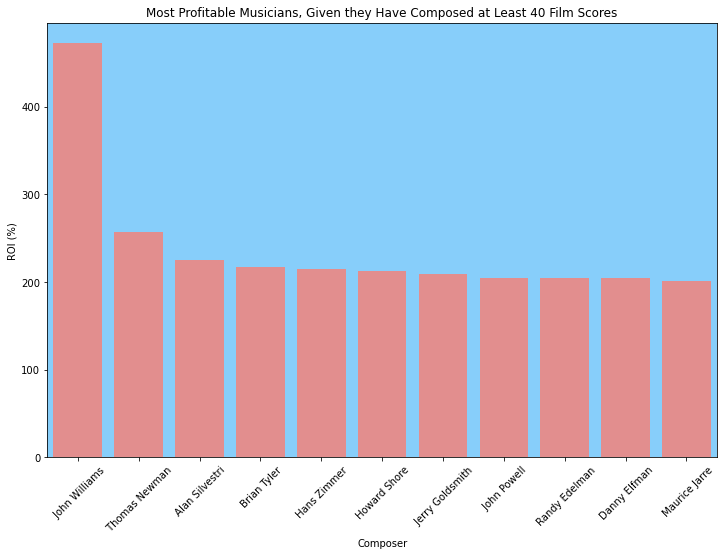

In [201]:
fig, ax = plt.subplots(figsize = (12,8));
ax = sns.barplot(data = composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11), x= composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11).index
               , y = composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11)['roi_mean'], color = 'lightcoral');

labels = [x[8:].replace('_', ' ') for x in composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11).index]

ax.set_title(f'Most Profitable Musicians, Given they Have Composed at Least {the_film_count} Film Scores');
ax.set_xticklabels(labels, rotation = 45);
ax.set_facecolor('lightskyblue');
ax.set_xlabel('Composer');
ax.set_ylabel('ROI (%)');

In [202]:
#an interaction for composers

@interact
def interactive_plot(the_film_count = 40):
    composers_count_3 = []

    

    testing1 = composers_roi.describe().T

    for name , roi , number in zip(testing1.index , testing1['mean'] , testing1['count']):
        if number >= the_film_count:
            composers_count_3.append([name , roi , number])

        
    composers_3_df = pd.DataFrame(composers_count_3 , columns = ['composer', 'roi_mean', 'count'])
    composers_3_df.index = composers_3_df.composer
    composers_3_df.index.name = None
    composers_3_df.drop('composer', inplace = True, axis = 1)
    composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11)
    
    
    
    fig, ax = plt.subplots(figsize = (12,8));
    ax = sns.barplot(data = composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11), x= composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11).index
                   , y = composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11)['roi_mean'], color = 'lightcoral');

    labels = [x[8:].replace('_', ' ') for x in composers_3_df.sort_values(by = 'roi_mean', ascending = False).head(11).index]

    ax.set_title(f'Most Profitable Musicians, Given they Have Composed at Least {the_film_count} Film Scores');
    ax.set_xticklabels(labels, rotation = 45);
    ax.set_facecolor('lightskyblue');
    ax.set_xlabel('Composer');
    ax.set_ylabel('ROI (%)');

interactive(children=(IntSlider(value=40, description='the_film_count', max=120, min=-40), Output()), _dom_cla…

Bare in mind that the more films these composers have done, it is very likely thier scores will be more expensive!

<b> Does number of languages spoken in the movie have an effect on ROI? </b>


The rationale here is that perhaps more languages means a broader scope of demographic may watch a film. However, It could also contribute to the budget but having to add subtitles. Will it even have an effect?

In [203]:
spoken_language_length = data[['spoken_languages' , 'ROI']].copy()

In [204]:
#how many null values? 

spoken_language_length.spoken_languages.isnull().sum()

41

In [205]:
spoken_language_length['length'] = spoken_language_length.spoken_languages.apply(lambda x: len(x.replace('[', '').replace(']', '').split(',')) if pd.isna(x) != True else x)
spoken_language_length

,spoken_languages,ROI,length
0,['English'],61.363636,1.0
1,['English'],-46.093333,1.0
2,['English'],-98.668687,1.0
3,"['English', 'Français', 'Español']",55.044771,3.0
4,['English'],-21.981352,1.0
...,...,...,...
9532,['Spanish'],-9.966182,1.0
9533,['English'],4.347826,1.0
9534,['Japanese'],-29.741054,1.0
9535,['English'],-17.762325,1.0


In [206]:
#replace nan with median

spoken_language_length.fillna(spoken_language_length.length.median(), inplace = True)

In [207]:
#only 10 categories of language length so we can now groupby with mean roi
spoken_language_length.length.unique()

array([ 1.,  3.,  2.,  7.,  4.,  5.,  6.,  8.,  9., 11., 10.])

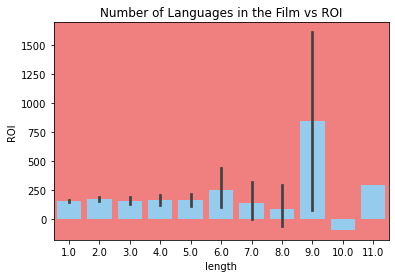

In [208]:
ax = sns.barplot(x = spoken_language_length.length , y = spoken_language_length.ROI, color = 'lightskyblue')
ax.set_facecolor('lightcoral');
ax.set_title('Number of Languages in the Film vs ROI');


In [209]:
spoken_language_length.groupby('length').count()

,spoken_languages,ROI
length,,
1.0,6871,6871
2.0,1625,1625
3.0,623,623
4.0,265,265
5.0,103,103
6.0,29,29
7.0,12,12
8.0,5,5
9.0,2,2


In [210]:
spoken_language_length.length = spoken_language_length.length.astype('float')

In [211]:
new_bins = []
for x in spoken_language_length.length:
    if x == 1.0:
        new_bins.append('1')
    elif x == 2.0:
        new_bins.append('2')
    elif x == 3.0:
        new_bins.append('3')
    elif x == 4.0:
        new_bins.append('4')
    elif x == 5.0:
        new_bins.append('5')
    else:
        new_bins.append('>5')
spoken_language_length['bins'] = new_bins

In [212]:
#statistical significance between 5 languages and the rest?
anova_df = spoken_language_length[['bins', 'ROI']]
grouped_anova = anova_df.groupby('bins')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in spoken_language_length.bins.unique()])


F_onewayResult(statistic=0.6772035305399321, pvalue=0.6407107860432518)

Grouped anova suggests no significant difference in ROI between these groups and thus they will have little predictive power on ROI

<b> What about the main language spoken? </b>

The main language is the first in the list

In [213]:
#isolate the original language from the list of languages
first_langs = []
for x in spoken_language_length.spoken_languages:
    try:
        first_langs.append(eval(x)[0])
    except:
        first_langs.append('No Language')
        
spoken_language_length['original_language'] = first_langs

In [214]:
#check unique languages
spoken_language_length.original_language.unique()

array(['English', 'Український', 'No Language', 'Pусский', 'Nederlands',
       'Deutsch', 'Français', 'Español', 'ภาษาไทย', '普通话', 'Italiano',
       'العربية', 'Latin', 'Português', 'Română', '', 'svenska', '日本語',
       'Magyar', 'فارسی', 'Gaeilge', '广州话 / 廣州話', 'हिन्दी', 'Esperanto',
       '한국어/조선말', 'עִבְרִית', 'Norsk', 'বাংলা', 'Català', 'Kiswahili',
       'suomi', 'தமிழ்', 'Bahasa indonesia', 'ελληνικά', 'Srpski',
       'Český', 'български език', 'Polski', 'اردو', 'తెలుగు', 'Dansk',
       'Afrikaans', 'Tiếng Việt', 'Eesti', 'Türkçe', 'Galego', 'Bosanski',
       'Slovenčina', 'shqip', 'Íslenska', 'Hrvatski', '?????', 'Somali',
       'ਪੰਜਾਬੀ', 'Bamanankan', 'Bahasa melayu', 'Lietuvių', 'Azərbaycan',
       'Kinyarwanda', 'پښتو', 'None', 'French', 'Japanese', 'Italian',
       'Spanish', 'German', 'Mandarin', 'Macedonian', 'Persian',
       'Russian', 'Danish', 'Hindi', 'Dutch', 'Hungarian', 'Pushto',
       'Icelandic', 'Korean', 'Cantonese', 'Dzongkha', 'Vietnamese',
      

In [215]:
#swap languages that shouldn't be there

spoken_language_length.original_language = spoken_language_length.original_language.replace('?????', 'No Language').replace('None', 'No Language').replace('','No Language')


In [216]:
#groupby language and see if there is statistical significance

anova_df = spoken_language_length[['original_language', 'ROI']]
grouped_anova = anova_df.groupby('original_language')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in spoken_language_length.original_language.unique()])
#there is significance to 99% confidence

F_onewayResult(statistic=1.6630865770384056, pvalue=6.976225873980785e-05)

In [217]:
#groupby language to check the values for roi and the counts for each language

lang = spoken_language_length.groupby('original_language').mean()['ROI'].to_frame().copy()
lang['Count'] = spoken_language_length.groupby('original_language').count()['ROI']
lang.sort_values(by = 'Count', ascending = False).head(20)

,ROI,Count
original_language,,
English,160.250415,7099
Français,137.796953,277
Español,172.367059,248
हिन्दी,182.089261,247
Deutsch,169.987985,191
Pусский,94.796330,172
No Language,250.256778,167
日本語,212.109388,96
普通话,217.050390,87


Need to clean the languages so that mistakes like french and francias are the same.

Due to a large quantity being from the european countries, it makes more sense to bin the first language into regions English, french, spanish, german, no language and the rest

In [218]:
#swap languages that are the same just different language eg french and francias

spoken_language_length.original_language = spoken_language_length.original_language.replace('Deutsch', 'German')\
.replace('Français', 'French')\
.replace('Español','Spanish')\
.replace('Low German', 'German')\
.replace('हिन्दी','Hindi')

In [219]:
#lets see if there is still significance between bins when we group the data

lang_bins = []
for x in spoken_language_length.original_language:
    if x == 'English':
        lang_bins.append('English')
    elif x == 'French':
        lang_bins.append('French')
    elif x == 'Spanish':
        lang_bins.append('Spanish')
    elif x == 'German':
        lang_bins.append('German')
    elif x == 'Hindi':
        lang_bins.append('Hindi')
    elif x == 'No Language':
        lang_bins.append('No Language')
    else:
        lang_bins.append('Other')
spoken_language_length['o_lang_bins'] = lang_bins

In [220]:
#inspection of counts
spoken_language_length.groupby('o_lang_bins').count()['ROI']

o_lang_bins
English        7099
French          355
German          203
Hindi           264
No Language     167
Other          1175
Spanish         274
Name: ROI, dtype: int64

In [221]:
# inspection of means
spoken_language_length.groupby('o_lang_bins').mean()['ROI']

o_lang_bins
English        160.250415
French          92.773949
German         154.720175
Hindi          164.949534
No Language    250.256778
Other          159.044394
Spanish        156.199002
Name: ROI, dtype: float64

In [222]:
#statistical significance between these groups?
anova_df = spoken_language_length[['o_lang_bins', 'ROI']]
grouped_anova = anova_df.groupby('o_lang_bins')

stats.f_oneway(*[grouped_anova.get_group(x)['ROI'] for x in spoken_language_length.o_lang_bins.unique()])

#95% confident that these ROI group means are statistically significant from each other 
#and therefore could be incorperated into our model

F_onewayResult(statistic=3.720741381338909, pvalue=0.0010668973344794075)

In [223]:
#now incorperate the language bins into the main data table
data['original_language_bins'] = spoken_language_length['o_lang_bins']

<ipython-input-223-53db3506d61d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['original_language_bins'] = spoken_language_length['o_lang_bins']


<b> Correlations of directors, composers, genres </b> 

Due to the magnitude of the data we wont be able to see a heatmap plot so I will show the top and bottom 10 for all relationships

In [224]:
# correlations = data[[x for x in data.columns if 'Director' in x or 'GENRE' in x or 'COMPOSER' in x]].copy()
# correlations = correlations.replace(np.nan, 0)

Highest Correlations

In [225]:
# correlations[[x for x in correlations.columns if 'GENRE' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'GENRE' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False) != 1)][::2].head(20)

In [226]:
# correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'GENRE' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'GENRE' in x ]].corr().unstack().sort_values(ascending = False) != 1)][::2].head(20)

In [227]:
# correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False) != 1)][::2].head(20)

These correlations could tell us about existing parterships that work well

Lowest Correlations

In [228]:
# correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = True) != 1)][::2].tail(20)

In [229]:
# correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'GENRE' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'COMPOSER' in x or 'GENRE' in x ]].corr().unstack().sort_values(ascending = True) != 1)][::2].tail(20)

In [230]:
# correlations[[x for x in correlations.columns if 'GENRE' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = False)[(correlations[[x for x in correlations.columns if 'GENRE' in x or 'Director' in x ]].corr().unstack().sort_values(ascending = True) != 1)][::2].tail(20)

Nothing gained here, no particularly negative correlations

<b> Feature engineering of ROI </b>

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ROI', ylabel='Density'>

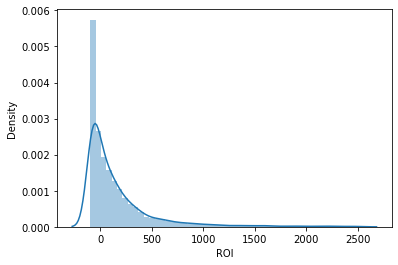

In [231]:
sns.distplot(data['ROI'])

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ROI', ylabel='Density'>

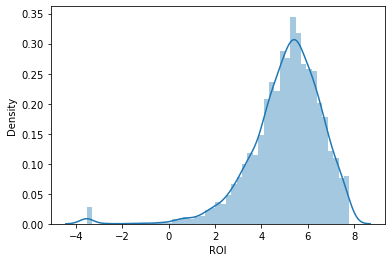

In [232]:
#transforming the data to a logarithmic scale, adding by the lowest negative as you cannot log negative values.

transforming_roi = data.ROI.copy() + data.ROI.min()
sns.distplot(np.log(transforming_roi))

#the data looks alot more normally distributed with a large tale toward the negative log side (from ROI's between 0 and 1)
#the disadvantage of using this in a model is low interpretability when reading the coefficients

#becuase there is a large amount of films at 0 % ROI, we lose most of the data with

<b> potential new target </b>

In [233]:
#postive vs negative ROI
data['profit?'] = data.ROI.apply(lambda x: 1 if x > 0 else 0)
data['profit?'].value_counts(normalize = True)

<ipython-input-233-bc771fe00d38>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['profit?'] = data.ROI.apply(lambda x: 1 if x > 0 else 0)


1    0.573765
0    0.426235
Name: profit?, dtype: float64

<b> Generation of a new feature: from a collection </b>

I beleieve that being from a collection will influence revenue as people are always going to be attracted to films from a fracanchise or series they love, no matter the quality. 

This will require calling upton the api again, where tmdb have said the film is oly from a collection if it is part of a sequel, where a sequel is defined as so:

'sequel is a film which centers around the same main characters and continues the story of an earlier film. The protagonists evolve and are aware of the events that happened in the earlier films. Most popular film series—Harry Potter, Fantastic Beasts, Lord of the Rings, The Hobbit, The Hunger Games, Thor, Iron Man, Guardians of the Galaxy—are composed of proper film sequels.'

In [234]:
data.tmdb_id

0        8095.0
1       20367.0
2       11620.0
3       10865.0
4       11313.0
         ...   
9532        NaN
9533        NaN
9534        NaN
9535        NaN
9536        NaN
Name: tmdb_id, Length: 9537, dtype: float64

In [235]:
7991/9537

0.8378945160952082

In [236]:
import tmdbsimple as tmdb

In [237]:
tmdb.API_KEY = 'c8e4b7150b711ec02a467eced19ee173'

In [238]:
collection_film = []
for x in tqdm(data.tmdb_id[:]):
    try:
        if bool(tmdb.Movies(int(x)).info()['belongs_to_collection']['name']) is True == True:
            collection_film.append(1)
    except:
        collection_film.append(0)
        
collection_film

100%|██████████| 9537/9537 [20:34<00:00,  7.73it/s]  


[0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,


In [239]:
data['from_collection'] = collection_film

<ipython-input-239-4e07bc9b6571>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['from_collection'] = collection_film


In [240]:
data.from_collection.value_counts(normalize = True)

0    0.827409
1    0.172591
Name: from_collection, dtype: float64

In [241]:
data.groupby('from_collection').mean()['ROI']

from_collection
0    115.841463
1    366.264223
Name: ROI, dtype: float64

clearly the sequels generate more ROI, but is this difference significant?

In [242]:
#two sample ttest comparing two means (one paired)

stats.ttest_ind(data.ROI[data.from_collection == 1], data.ROI[data.from_collection == 0])



Ttest_indResult(statistic=26.19147324912843, pvalue=4.480056728208833e-146)

Very low p indicates extreme significence and I will therefore keep this as a variable.

<b> Outlier Detection </b>

/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpr

object
object
object
datetime64[ns]
object
object
object
object
object
object
object


/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/chrismembrey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpr

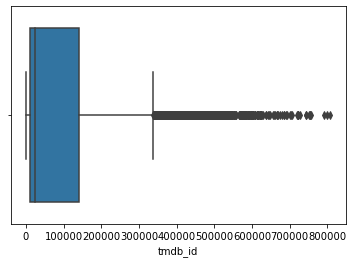

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

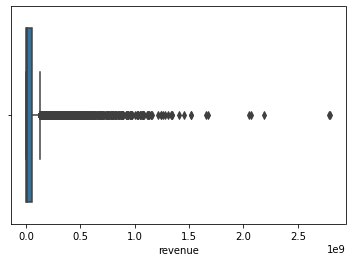

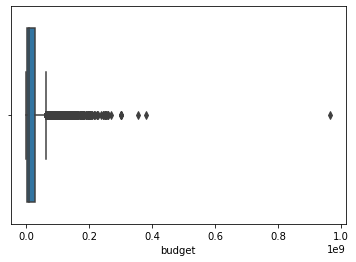

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

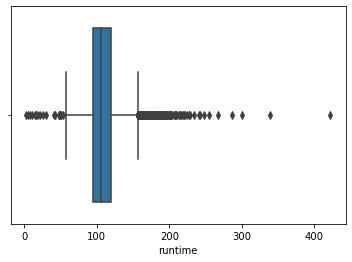

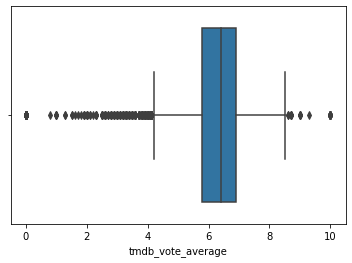

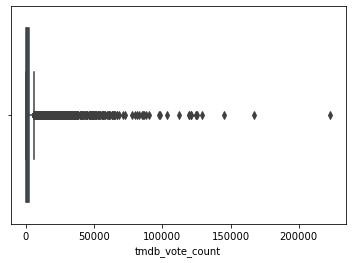

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

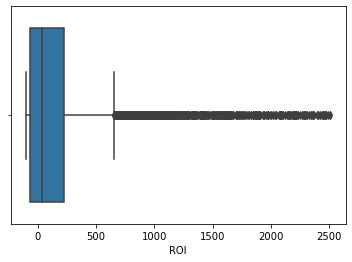

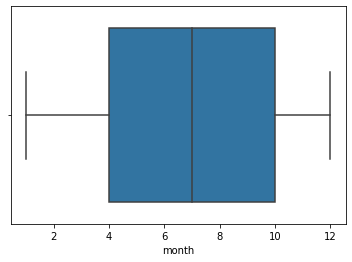

<Figure size 432x288 with 0 Axes>

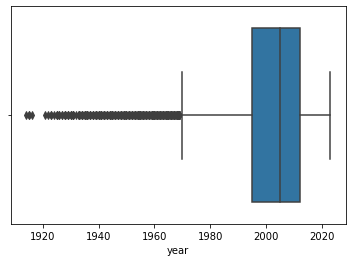

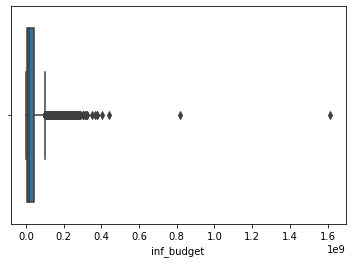

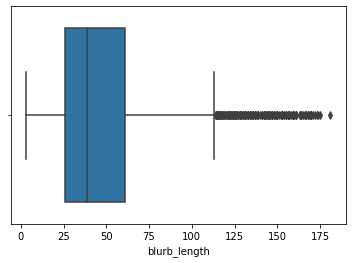

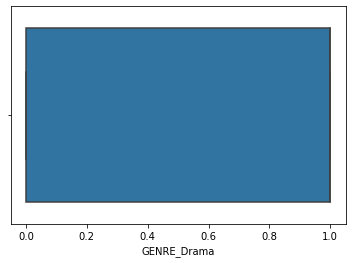

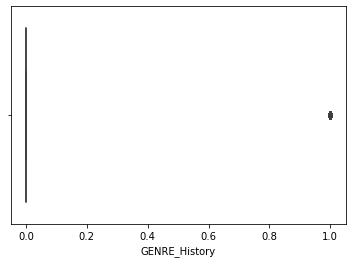

...

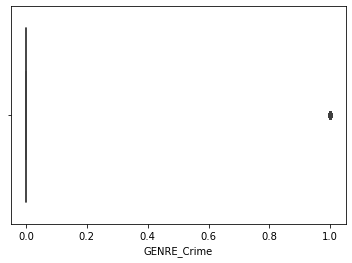

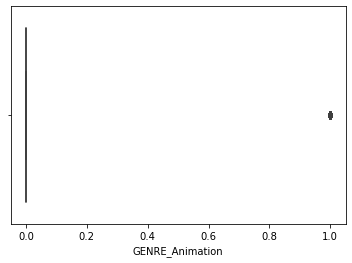

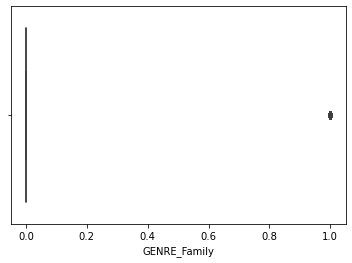

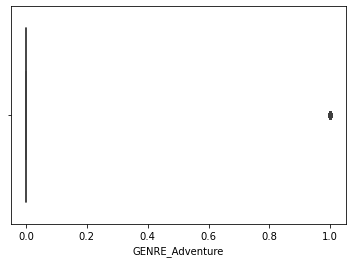

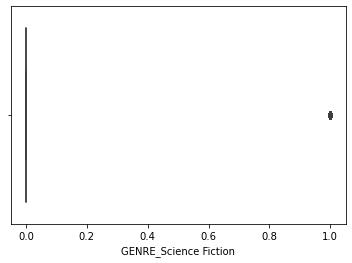

In [243]:
for x in data.columns[:30]:
    try:
        plt.figure()
        sns.boxplot(data[x])
    except:
        print(data[x].dtype)

we can see alot of outliers here and if there was more data on the subject I would freely remove them, especially for the target variable. However the data availible is sparse and it will be kept. Due to the nature of the values for ROI, it could be reasonable to move from a regression problem to a classification problem, predicting positive ROI vs negative ROI where we would have a baseline accuracy of 57% (as above). 

<b>New Feature: Sentiment Scores for each blurb</b>

Becuase VADER is trained on more colloquial social media language, I opted for SpaCy. The results were that sentiment, both objectivity and polarity average score, had very low correlation with ROI (~0.0 for both), so may carry poor predictive power. However, it will be interesting how much weight, if any they carry in a model, so they will be kept as variables. 

In [244]:
blurb_analysis = pd.read_csv('blurb_analysis.csv')

In [245]:
blurb_analysis[['ROI', 'objectivity_avg', 'polarity_avg', 'tokenized_blurbs']]

,ROI,objectivity_avg,polarity_avg,tokenized_blurbs
0,61.363636,0.903075,0.000992,"[Determined, hold, throne, Cleopatra, seduces,..."
1,-46.093333,0.898970,0.012065,"[Al, Roberts, New, York, nightclub, pianist, h..."
2,-98.668687,0.814066,-0.071299,"[Set, drop, Rome, crisis, General, Marcus, Vin..."
3,55.044771,0.925194,0.005663,"[world, highly, qualified, crew, archaeologist..."
4,-21.981352,0.836830,-0.043080,"[widowed, mother, son, change, mysterious, str..."
...,...,...,...,...
9532,-9.966182,0.918519,0.021296,"[woman, island, getaway, boyfriend, thrown, lo..."
9533,4.347826,0.816759,0.014545,"[thrown, home, wife, promiscuous, Mark, finds,..."
9534,-29.741054,0.916422,-0.000774,"[high, school, boy, run, away, Tokyo, befriend..."
9535,-17.762325,0.857858,0.070267,"[true, life, story, Christian, music, star, Je..."


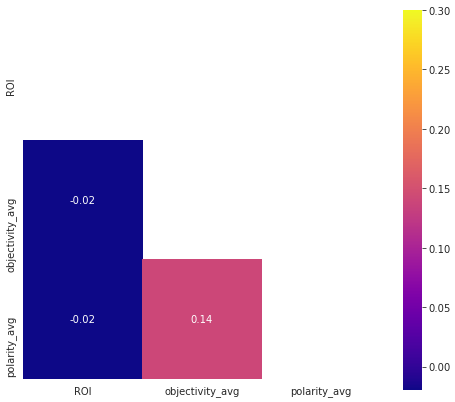

In [246]:
corr = np.corrcoef(np.random.randn(10, 200))
mask = np.zeros_like(blurb_analysis[['ROI', 'objectivity_avg', 'polarity_avg']].corr())
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(8,7))
    ax = sns.heatmap(round(blurb_analysis[['ROI', 'objectivity_avg', 'polarity_avg']].corr(), 2), mask=mask, vmax=.3, square=True, annot = True, cmap = 'plasma')

<b> PLEASE SEE BLURB_SPACY_ANALYSIS JUPYTER NOTEBOOK FOR GENERATION OF THE SENTIMENT SCORES </b>


adding the columns to the dataframe

In [312]:
data['blurb_objectivity'] = blurb_analysis['objectivity_avg']
data['blurb_polarity'] = blurb_analysis['polarity_avg']

<ipython-input-312-a2729cdd7e25>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['blurb_objectivity'] = blurb_analysis['objectivity_avg']
<ipython-input-312-a2729cdd7e25>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['blurb_polarity'] = blurb_analysis['polarity_avg']


<b> Lets see if gere uniqueness will have an effect on the ROI: </b> Perhaps if a genre is more unique it will pull viewers' attention and cuase them to watch it. Conversley, viewers may prefer to watch what they know will be good and they have liked in the past.

In [293]:
#repalce sci-fi with science fiction
genres = []
for x in tqdm(data.genres):
    if str(x) != 'nan':
        x = eval(str(x).replace('Sci-Fi', 'Science Fiction'))
        genres.append(x)
    else:
        genres.append(np.nan)
data['genres'] = genres

100%|██████████| 9537/9537 [00:00<00:00, 97115.92it/s]
<ipython-input-293-7dc80d327e23>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['genres'] = genres


In [294]:
#create a new object with which to test
genre_unique = pd.DataFrame()

#double checking the order is always alphebetical using sorted() fucntion
# genre_unique['genres'] = data.genres.copy().apply(lambda x: str(sorted(x)) if pd.isna(str(x)) == False else x)

to_string_from_list = []

for x in tqdm(data.genres.copy()):
    try:
        to_string_from_list.append(str(sorted(x)))
    except:
        to_string_from_list.append(np.nan)
        
genre_unique['genres'] = to_string_from_list


genre_unique['ROI'] = data['ROI'].copy()

genre_unique.groupby('genres').count()[genre_unique.groupby('genres').count()['ROI'] <= 5]

100%|██████████| 9537/9537 [00:00<00:00, 527697.81it/s]


,ROI
genres,
"[' Action', ' Adventure', 'Animation']",4
"[' Action', ' Drama', 'Crime']",1
"[' Action', 'Comedy']",2
"[' Adventure', ' Biography', 'Action']",1
"[' Adventure', ' Drama', 'Animation']",2
...,...
['Sport'],1
"['Thriller', 'War']",3
"['Thriller', 'Western']",2


In [295]:
#need to take the genres from this index and use them to create a binary columns for 'unique_genre_pairing'

for number, x in tqdm(enumerate(genre_unique.genres)):
    if x in genre_unique.groupby('genres').count()[genre_unique.groupby('genres').count()['ROI'] <= 5].index:
        genre_unique.loc[number , 'unique_genre_pairing'] = 1

9537it [00:34, 280.07it/s]


In [296]:
genre_unique.unique_genre_pairing = genre_unique.unique_genre_pairing.replace(np.nan , 0)

genre_unique.unique_genre_pairing.value_counts(normalize = True)

0.0    0.849743
1.0    0.150257
Name: unique_genre_pairing, dtype: float64

In [297]:
#see roi means and then test for significance
genre_unique.groupby('unique_genre_pairing').mean()

,ROI
unique_genre_pairing,
0.0,165.893327
1.0,120.430124


In [298]:
stats.ttest_ind(genre_unique.ROI[genre_unique.unique_genre_pairing == 1],genre_unique.ROI[genre_unique.unique_genre_pairing == 0])



Ttest_indResult(statistic=-4.3469208145688185, pvalue=1.3949431960369495e-05)

negative statistic indicates the mean ROI for films with unique genre pairings are significantly lower than films with less rare genre pairings. Most importantly it shows that this feature may have some predictive power when predicting ROI.

In [299]:
data['genre_pair_unique'] = genre_unique.unique_genre_pairing

<ipython-input-299-1f120112c6f0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['genre_pair_unique'] = genre_unique.unique_genre_pairing


<h3>Conclusion: variables for the ML model</h3>

In [313]:
data.to_csv('EDA_complete.csv')